# Вариационные автокодировщики

### Загрузка, нормировка и визуалиация данных

In [180]:
import torchvision.datasets

In [181]:
from torchvision.datasets import MNIST#, FashionMNIST
from torch.utils.data import TensorDataset, DataLoader
import torch
from torch import nn
from torch import optim
from torch.autograd import Variable
import math
#dtype = torch.cuda.FloatTensor
import chainer

In [182]:
from matplotlib import pyplot as plt
%matplotlib inline

def show_images(x):
    plt.figure(figsize=(12, 12 / 10 * (x.shape[0] // 10 + 1)))
    x = x.view(-1, 30, 30)
    for i in range(x.shape[0]):
        plt.subplot(x.shape[0] // 10 + 1, 10, i + 1)
        plt.imshow(x.data[i].numpy())
        plt.axis('off')

In [183]:
from matplotlib import pyplot as plt
%matplotlib inline

def show_images(x):
    plt.figure(figsize=(20, 20 / 10 * (x.shape[0] // 10 + 1)))
    x = x.view(-1, 30, 30)
    for i in range(x.shape[0]):
        plt.subplot(x.shape[0] // 10 + 1, 10, i + 1)
        plt.imshow(x.data[i].numpy())
        plt.axis('off')

In [184]:
data = MNIST('mnist', download=True, train=True)
train_data = TensorDataset(data.train_data.view(-1, 28 * 28).float() / 255, data.train_labels)
#data = pkl.load(open('test_data','rb'))
data = MNIST('mnist', download=True, train=False)
test_data = TensorDataset(data.test_data.view(-1, 28 * 28).float() / 255, data.test_labels)

In [185]:
import numpy as np
data = np.load('/home/sayankotor/data/calo_gan_data/electrons_1_100_1D__v2_50K.npz')
data_img = (data['EnergyDeposit'])
data_img.shape

(50000, 30, 30)

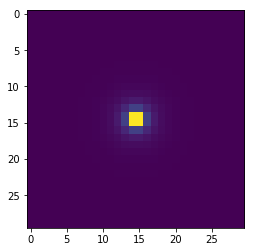

In [186]:
plt.imshow(data_img.mean(0))
plt.show()

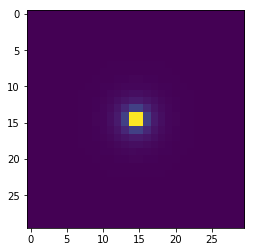

In [187]:
plt.imshow(data_img.std(0))
plt.show()

In [188]:
data_img = np.clip(data_img, 1e-8, 8)
data_img_log = np.log(data_img)
min_ = np.min(data_img_log)
max_ = np.max(data_img_log)
print(min_, max_)

-18.420680744 2.07944154168


In [189]:
n_data_img = []

min_ = np.min(data_img_log)
max_ = np.max(data_img_log)

for i, elem in enumerate(data_img_log):
    if (i%5000 == 0):
        print (i)
    n_elem = (elem + abs(min_))/(max_ - min_)
    n_data_img.append(n_elem)
n_data_img = np.array(n_data_img)




#for i, elem in enumerate(n_data_img):
    #if (i%5000 == 0):
        #print (i)
    #n_elem = (elem - mean)
    #n_elem = np.true_divide(n_elem, std)
    #n_data_img_1.append(n_elem)
#n_data_img_1 = np.array(n_data_img_1)


0
5000
10000
15000
20000
25000
30000
35000
40000
45000


In [190]:
print (np.min(n_data_img))

0.0


In [191]:
print (np.max(n_data_img))

1.0


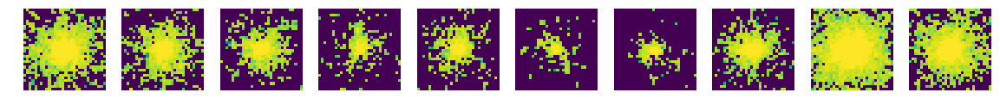

In [192]:
show_images(Variable(torch.from_numpy(n_data_img[20:30])))

In [193]:
print (n_data_img[4])

[[ 0.          0.          0.          0.91373731  0.84236097  0.          0.
   0.89933991  0.79873051  0.90850622  0.          0.          0.
   0.73258217  0.          0.          0.91810497  0.79161233  0.80359861
   0.          0.          0.86093058  0.          0.          0.          0.
   0.87347963  0.          0.          0.        ]
 [ 0.          0.          0.          0.          0.87481705  0.
   0.86209479  0.          0.91321374  0.          0.          0.83282184
   0.90605421  0.92245774  0.          0.          0.87304372  0.87569007
   0.81853404  0.78457183  0.82149348  0.84899072  0.          0.83986173
   0.88016609  0.          0.85046825  0.          0.          0.        ]
 [ 0.          0.          0.          0.          0.73960186  0.          0.
   0.          0.          0.9006068   0.          0.91283678  0.86320651
   0.858081    0.7621956   0.84746241  0.75855855  0.87908188  0.
   0.88715186  0.85659906  0.84159556  0.8603034   0.88059201  0.
   0.8

## loss function ##

In [194]:
np.std(n_data_img)

0.45142463067079663

In [195]:
import chainer

In [196]:

def reconstruction_loss_gauss_chain(x_true_object, mu_generative_distr, sigma_generative_distr):
    """
    Вычисляет бинарную кроссэнтропию между эмприческим распределением на данные
    и индуцированным моделью распределением, т. е. правдоподобие объектов x_true.
    Каждому объекту из x_true соответствуют K сэмплированных распределений
    на x из x_distr.
    i-му объекту соответствуют распределения с номерами i * K, ..., (i + 1) * K - 1.
    Требуется вычислить оценку логарифма правдоподобия для каждого объекта.
    Подсказка: не забывайте про вычислительную стабильность!

    Вход: x_true, Variable - матрица объектов размера n x D.
    Вход: x_distr, Variable - матрица параметров распределений Бернулли
    размера (n * K) x D.
    Выход: Variable, матрица размера n x K - оценки логарифма правдоподобия
    каждого сэмпла.
    """
    answ = chainer.functions.gaussian_nll(x_true_object.data.numpy(), mu_generative_distr.data.numpy(), sigma_generative_distr.data.numpy())
    return answ


def reconstruction_loss_gauss(x_true_object, mu_generative_distr, sigma_var):
    print("mu_generative_distr.shape", mu_generative_distr.shape)
    #print ("log sigma_var ", log_sigma_var)
    #print ("sigma ", sigma)
    #print ("log sigma_var ", log_sigma_var)
    #print ("torch min ", torch.min(sigma))
    #print ("torch max ", torch.max(sigma))
    log_sigma = torch.log(sigma_var)
    print ("log_sigma ", log_sigma.sum())
    x_diff = x_true_object - mu_generative_distr
    x_power = (x_diff * x_diff) * -0.5/ sigma_var 
    print ("x_diff, x_power ", x_diff.mean(), x_power.mean() )
    #print ("x_power ", x_power.sum())
    loss = (log_sigma + math.log(2 * math.pi)) / 2 - x_power
    return torch.sum(loss, 1)


In [197]:
def kl1(q_distr, p_distr):
    """
    Вычисляется KL-дивергенция KL(q || p) между n парами гауссиан.
    Вход: q_distr, tuple(Variable, Varable). Каждое Variable - матрица размера n x d.
    Первое - mu, второе - sigma.
    Вход: p_distr, tuple(Variable, Varable). Аналогично.
    Возвращаемое значение: Variable, вектор размерности n, каждое значение которого - 
    - KL-дивергенция между соответствующей парой распределений.
    """
    mu_q, sigma_q = q_distr
    mu_p, sigma_p = p_distr
    mu_q = mu_q.float()
    mu_p = mu_p.float()
    sigma_q = sigma_q.float()
    sigma_p = sigma_p.float()
    #без этого нет стабильности и лосс улетает в нан
    sigma_q_log = torch.log(torch.clamp(sigma_q,1-1e8, 1e-8))
    sigma_p_log = torch.log(torch.clamp(sigma_p, 1-1e8, 1e-8))

    d = mu_q.shape[1]
    res = - float(d) + sigma_p_log.sum(dim = 1) - sigma_q_log.sum(dim = 1)
    res += (sigma_q/ sigma_p).sum(dim =1)
    res += torch.sum((mu_p - mu_q) * (mu_p - mu_q) / sigma_p, dim =1)
    return 0.5 * res
    

In [198]:
def kl(q_distr, p_distr):
    m1, s1 = q_distr
    m2, s2 = p_distr
    n = m1.shape[0]
    assert(m2.shape[0] == n)
    print ("kl m1 ", torch.mean(m1))
    print ("kl s1 ", torch.mean(s1))
    kldiv = (torch.log(s2) - torch.log(s1) + 0.5 * ((s1**2 + (m1 - m2)**2) / (s2**2) - 1)).sum(1)
    assert(len(kldiv.shape) == 1 and kldiv.shape[0] == n)
    #print ("kldiv", kldiv.mean())
    return kldiv

## model

In [199]:
from torch.distributions import Normal, Bernoulli
from chainer.functions.math import exponential

class VAE(nn.Module):
    def __init__(self, d, D):
        """
        Инициализирует веса модели.
        Вход: d, int - размерность латентного пространства.
        Вход: D, int - размерность пространства объектов.
        """
        super(type(self), self).__init__()
        self.d = d
        self.D = D
        self.proposal_network = nn.Sequential(
            nn.Linear(self.D, 200),
            nn.LeakyReLU(),
            nn.Linear(200, 200),
            nn.LeakyReLU(),
        )
        self.proposal_mu_head = nn.Linear(200, self.d)
        self.proposal_sigma_head = nn.Linear(200, self.d)
        self.generative_network = nn.Sequential(
            nn.Linear(self.d, 200),
            nn.LeakyReLU(),
            nn.Linear(200, 200),
            nn.LeakyReLU()
        )
        self.generative_mu_head = nn.Linear(200, self.D)
        self.generative_sigma_head = nn.Sequential(nn.Linear(200, self.D), nn.Softplus())

    def proposal_distr(self, x):
        """
        Генерирует предложное распределение на z.
        Вход: x, Variable - матрица размера n x D.
        Возвращаемое значение: tuple(Variable, Variable),
        Каждое Variable - матрица размера n x d.
        Первое - mu, второе - sigma.
        """
        q_teta = self.proposal_network.forward(x)
        return self.proposal_mu_head(q_teta), torch.exp(self.proposal_sigma_head(q_teta))

    def prior_distr(self, n):
        """
        Генерирует априорное распределение на z.
        Вход: n, int - число распределений.
        Возвращаемое значение: tuple(Variable, Variable),
        Каждое Variable - матрица размера n x d.
        Первое - mu, второе - sigma.
        """
        mu = Variable(torch.Tensor(n, self.d).fill_(0).float())
        sigma = Variable(torch.Tensor(n, self.d).fill_(1).float())
        return mu, sigma

    def sample_latent(self, distr, K=1):
        """
        Генерирует сэмплы из гауссовского распределения на z.
        Сэмплы должны быть дифференцируемы по параметрам распределения!
        Вход: distr, tuple(Variable, Varable). Каждое Variable - матрица размера n x d.
        Первое - mu, второе - sigma.
        Вход: K, int - число сэмплов для каждого объекта.
        Возвращаемое значение: Variable, матрица размера n x d.
        """
    
        mu, sigma = distr
        eps = torch.from_numpy(
            np.random.normal(0, 1, size=(K * sigma.shape[0], sigma.shape[1]))).float()
        return mu.repeat(K, 1) + sigma.repeat(K, 1) * Variable(eps, requires_grad=False)
        

    def sample_prior(self, num_samples):
        """
        Генерирует сэмплы из априорного распределения на z.
        Вход: num_samples, int - число сэмплов, которые надо сгененрировать.
        Возвращаемое значение: Variable, матрица размера num_samples x d.
        """
        m = Normal(torch.Tensor(self.d).fill_(0), torch.Tensor(self.d).fill_(1))
        answ = Variable(m.sample_n(num_samples))
        
        return answ
        

    def generative_distr(self, z):
        """
        По матрице латентных представлений z возвращает матрицу параметров
        распределения Бернулли для сэмплирования объектов x.
        Вход: z, Variable - матрица n x d латентных представлений.
        Возвращаемое значение: Variable, матрица параметров распределения
        Бернулли размера n x D.
        """
        int_distr = self.generative_network(z)
        return (self.generative_mu_head(int_distr), self.generative_sigma_head(int_distr))

    def batch_loss(self, batch, K, isp = False):
        """
        Вычисляет вариационную нижнюю оценку логарифма правдоподобия по батчу
        используя K сэмплов для каждого объекта.
        Вариационная нижняя оценка должна быть дифференцируема по параметрам модели (!),
        т. е. надо использовать репараметризацию.
        Вход: batch, Variable - матрица объектоа размера n x D.
        Вход: K, int - число сэмплов для каждого объекта, не используется.
        Возвращаемое значение: Variable, скаляр - вариационная нижняя оценка
        правдоподобия по батчу.
        
        sample_prior - генерирует объекты z в латентном пространстве меньшей размерности
        
        generative_distr - по этим объектам порождает параметры распределения, которое будет 
        генерировать объекты в реальном пр-ве 
        
        есть параметры, есть изначальный батч
        насколько изначальный батч соответствует распределению с генерированными параметрами - 
        это и есть RECONSTRUCTION LOSS
        
        """
        batch = Variable(batch)
        q_phi = self.proposal_distr(batch)
        z = self.sample_latent(q_phi, K)
        
        mu, sigma = self.generative_distr(z)
        sigma = torch.clamp(sigma, min = 1e-8)
        print ("sigma ", sigma)
        #m = Normal(mu, torch.exp(log_sigma)) 
        # = m.sample()
        answ1 = reconstruction_loss_gauss(batch, mu, sigma)
        print ("mu ", mu)
        answ_chain = reconstruction_loss_gauss_chain(batch, mu, sigma)
        
        mu_prior, sigma_prior = self.prior_distr(batch.shape[0])
        print ("q_phi mu ", q_phi[0][:5])
        print ("q_phi sigma ", q_phi[1][:5])
        answ2 = kl(q_phi, (mu_prior, sigma_prior))
        
        print("batch_loss: loss_chain, loss_simple, KL", answ_chain.data.mean(), answ1.data.mean() , answ2.data.mean() )
        #print ("shapes ", answ1.view(-1).shape,  answ2.shape)
        return torch.mean(answ1) + torch.mean(answ2) 


    def generate_samples(self, num_samples):
        """
        Генерирует сэмплы из индуцируемого моделью распределения на объекты x.
        Вход: num_samples, int - число сэмплов, которые надо сгененрировать.
        Возвращаемое значение: Variable, матрица размера num_samples x D.
        """
        mu, sigma = self.generative_distr(self.sample_prior(num_samples))      
        m = Normal(mu, sigma)
        answ = m.sample()  
        return answ

In [200]:
def sample_data_batch(bsize, data_):
    idxs = np.random.choice(np.arange(data_.shape[0]), size=bsize)
    return torch.FloatTensor(data_[idxs])

In [201]:
shapes = data_img.shape
n_data_img = n_data_img.reshape([shapes[0], shapes[1]*shapes[2]])

In [202]:
a = sample_data_batch(100, n_data_img)
print (type(a))
a.shape

<class 'torch.FloatTensor'>


torch.Size([100, 900])

In [203]:
import random

shapes = data_img.shape
random.seed()
def train_model(model, tests=[], batch_size=100, K=1, num_epochs=6, learning_rate=1e-3):
    model.generative_network.train() 
    """
    Обучает модель.
    Вход: model, Module - объект, модель.
    У этого объекта должна быть функция batch_loss от batch - FloatTensor и K - int,
    возвращающая скаляр Variable - функцию потерь на батче, которая должна быть
    оптимизирована.
    Вход: tests - список тестов, выполняемых после каждого 100-го батча.
    Каждый элемент списка - словарь с полями 'name' - уникальным идентификатором
    теста и 'func' - функцией от модели.
    Вход: batch_size, int.
    Вход: K, int.
    Вход: num_epochs, int.
    Вход: learning_rate, float.
    Возвращаемое значение: словарь с полями 'model' - обученная модель,
    'train_losses_list' - список функций потерь на каждом батче и 
    'test_results' - список результатов тестирования. Каждый результат
    тестирования - словарь вида name: value, где name - имя теста,
    value - результат его выполнения.
    """
    gd = optim.Adam(model.parameters(), lr=learning_rate)
    dataloader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
    train_losses = []
    test_results = []
    for _ in range(num_epochs):
        if (_ > 2):
            gd = optim.Adam(model.parameters(), lr=1e-4)
        print ("epoch:", _)
        #for i in range(500):
        for i, (batch, _) in enumerate(dataloader):
            #total = len(dataloader)
            total = 500
            batch = sample_data_batch(100, n_data_img)
            loss = model.batch_loss(batch, K)
            #if (loss_[0].data[0] < 300.0):
                #print ("loss 0", loss_[0].data[0])
                #return {
                    #'model': model,
                    #'train_losses_list': train_losses,
                    #'test_results': test_results
                #}
            (loss).backward()
            #print (loss.shape)
            
            train_losses.append(loss.data.numpy()[0])
            if (i + 1) % 10 == 0:
                print('\rTrain loss:', train_losses[-1],
                      'Batch', i + 1, 'of', total, ' ' * 10, end='', flush=True)
            if (i + 1) % 100 == 0:
                cur_test_result = {}
                for test in tests:
                    cur_test_result[test['name']] = test['func'](model)
                test_results.append(cur_test_result)
                print(flush=True)
            gd.step()
            gd.zero_grad()
    return {
        'model': model,
        'train_losses_list': train_losses,
        'test_results': test_results
    }

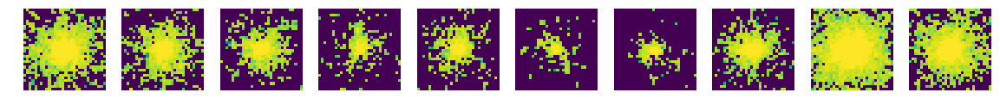

In [204]:
show_images(Variable(torch.from_numpy(n_data_img[20:30])))

In [205]:
print (np.max(n_data_img))

1.0


In [206]:
print (np.min(n_data_img))

0.0


In [207]:
vae_model_d2_k1 = train_model(VAE(2, 900), tests=[])

epoch: 0
sigma  Variable containing:
 0.7099  0.7247  0.6863  ...   0.6784  0.7086  0.7161
 0.7303  0.7218  0.7466  ...   0.6633  0.6967  0.7707
 0.6959  0.6645  0.6278  ...   0.6954  0.7302  0.7702
          ...             ⋱             ...          
 0.6887  0.6591  0.6107  ...   0.7087  0.7288  0.7788
 0.7285  0.7257  0.7482  ...   0.6695  0.6950  0.7685
 0.7996  0.6901  0.7313  ...   0.7642  0.7936  0.7799
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-33210.5352
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
 0.4553
[torch.FloatTensor of size 1]
 Variable containing:
-0.3058
[torch.FloatTensor of size 1]

mu  Variable containing:
-3.9892e-02  6.2049e-02 -3.6500e-02  ...   4.5778e-02  7.3119e-02 -7.3337e-02
-1.8837e-01  1.8026e-01 -3.7784e-02  ...   4.9104e-02  5.5339e-02 -6.9201e-02
-7.7189e-02  3.4334e-02 -1.3030e-01  ...   6.6940e-03  2.6364e-02 -4.3675e-02
                ...         

kl m1  Variable containing:
-0.1153
[torch.FloatTensor of size 1]

kl s1  Variable containing:
 1.1121
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 116607.0 795.8971325683593 1.0218349582701922
sigma  Variable containing:
 0.5966  0.6044  0.5265  ...   0.5476  0.6560  0.5642
 0.5890  0.5631  0.4926  ...   0.5086  0.6359  0.5332
 0.5874  0.5956  0.5141  ...   0.5359  0.6572  0.5327
          ...             ⋱             ...          
 0.5891  0.5500  0.4825  ...   0.4960  0.6187  0.5410
 0.5874  0.5645  0.4923  ...   0.5067  0.6425  0.5120
 0.5918  0.6327  0.5464  ...   0.5727  0.6529  0.5368
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-47458.9297
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
 0.1672
[torch.FloatTensor of size 1]
 Variable containing:
-0.1882
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.2929e-02  1.0847e-01  6.0078e-02  ...   1.3899e-

sigma  Variable containing:
 0.2999  0.3046  0.1923  ...   0.2144  0.3392  0.1792
 0.3744  0.2850  0.2516  ...   0.2525  0.3984  0.2593
 0.2879  0.2270  0.1582  ...   0.1693  0.3324  0.1290
          ...             ⋱             ...          
 0.4678  0.4635  0.3904  ...   0.4155  0.4952  0.4056
 0.4205  0.4325  0.3195  ...   0.3632  0.4063  0.2992
 0.3009  0.3142  0.1968  ...   0.2171  0.3374  0.1848
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-94207.2266
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
-0.1433
[torch.FloatTensor of size 1]
 Variable containing:
-0.2668
[torch.FloatTensor of size 1]

mu  Variable containing:
 0.5671  0.2321  0.3674  ...   0.2134  0.2547  0.4979
 0.3913  0.1709  0.2259  ...   0.2031  0.1436  0.3208
 0.6597  0.2516  0.4292  ...   0.3133  0.2068  0.5757
          ...             ⋱             ...          
 0.3259  0.0901  0.1534  ...   0.1172  0.2043  0.1307
 

Train loss: 494.522 Batch 20 of 500           sigma  Variable containing:
 0.2595  0.2427  0.1595  ...   0.1904  0.2375  0.1418
 0.2801  0.2619  0.1961  ...   0.2176  0.2951  0.1980
 0.1779  0.1377  0.0861  ...   0.0945  0.1683  0.0808
          ...             ⋱             ...          
 0.1777  0.1241  0.0831  ...   0.0882  0.1698  0.0712
 0.1604  0.1066  0.0693  ...   0.0728  0.1491  0.0575
 0.1704  0.1246  0.0789  ...   0.0859  0.1603  0.0711
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -1.3497
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -7.6455
[torch.FloatTensor of size 1]
 Variable containing:
-0.3375
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.0245e-01  9.0392e-02  1.2586e-01  ...   1.6509e-01  4.9170e-02  4.5504e-02
 2.2238e-01  1.8653e-01  1.2764e-01  ...   1.5185e-01  2.3003e-01  9.5112e-02
 2.7139e-01  3.0741e-01  2.5955e-01  ...   

sigma  Variable containing:
 0.2349  0.2195  0.2030  ...   0.2231  0.2426  0.2139
 0.2049  0.1860  0.1672  ...   0.1849  0.2051  0.1736
 0.3445  0.3250  0.2935  ...   0.3321  0.3473  0.3201
          ...             ⋱             ...          
 0.3027  0.2892  0.2745  ...   0.2921  0.3153  0.2957
 0.0916  0.0651  0.0539  ...   0.0563  0.0697  0.0509
 0.1141  0.0902  0.0743  ...   0.0802  0.0950  0.0737
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -1.5409
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -5.0927
[torch.FloatTensor of size 1]
 Variable containing:
-0.3749
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1896e-01  1.0555e-01  1.2721e-01  ...   2.3324e-01  2.1573e-01  1.1679e-01
 1.2499e-01  1.3019e-01  1.6925e-01  ...   2.7264e-01  2.3303e-01  1.6074e-01
 1.4269e-01  2.0316e-02  3.5619e-02  ...   1.4891e-01  8.5540e-02  2.1202e-02
           

Train loss: 359.073 Batch 30 of 500           sigma  Variable containing:
 0.1711  0.1869  0.1931  ...   0.2297  0.1879  0.2063
 0.0842  0.0748  0.0838  ...   0.0979  0.0751  0.0813
 0.1487  0.1438  0.1592  ...   0.1858  0.1573  0.1636
          ...             ⋱             ...          
 0.1279  0.1216  0.1340  ...   0.1573  0.1299  0.1371
 0.0662  0.0569  0.0643  ...   0.0743  0.0549  0.0605
 0.2659  0.2669  0.2873  ...   0.3170  0.2956  0.3123
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -1.7772
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -5.1036
[torch.FloatTensor of size 1]
 Variable containing:
-0.4596
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.0845e-01  4.4968e-02  5.0912e-02  ...   1.5476e-01  7.0350e-02  9.5229e-02
 2.8982e-01  3.2325e-01  2.6793e-01  ...   1.7716e-01  3.1053e-01  3.2631e-01
 2.3402e-01  1.7644e-01  1.3124e-01  ...   

sigma  Variable containing:
 0.2129  0.2351  0.2608  ...   0.3025  0.2556  0.2829
 0.1620  0.1885  0.2138  ...   0.2403  0.2044  0.2253
 0.1434  0.1608  0.1856  ...   0.2045  0.1709  0.1903
          ...             ⋱             ...          
 0.1526  0.1831  0.1955  ...   0.2369  0.1827  0.2031
 0.1984  0.2286  0.2576  ...   0.2923  0.2517  0.2762
 0.2284  0.2496  0.2804  ...   0.3133  0.2816  0.3066
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -1.8498
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.7086
[torch.FloatTensor of size 1]
 Variable containing:
-0.4183
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.5321e-01 -2.1704e-02 -1.3332e-02  ...   8.0457e-02 -1.2921e-02 -4.1283e-02
 1.5430e-01  1.3704e-01  1.0974e-01  ...   1.0200e-01  1.8936e-01  2.5658e-02
 1.8622e-01  2.1248e-01  1.8237e-01  ...   1.3644e-01  2.7317e-01  6.7106e-02
           

sigma  Variable containing:
 0.1765  0.1991  0.2323  ...   0.2612  0.2478  0.2530
 0.1278  0.1577  0.1714  ...   0.1908  0.1762  0.1745
 0.1145  0.1328  0.1436  ...   0.1517  0.1378  0.1401
          ...             ⋱             ...          
 0.1115  0.1326  0.1398  ...   0.1474  0.1329  0.1375
 0.1617  0.1813  0.2231  ...   0.2465  0.2382  0.2314
 0.1503  0.1798  0.2013  ...   0.2351  0.2084  0.2155
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -1.9083
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.4167
[torch.FloatTensor of size 1]
 Variable containing:
-0.4118
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.2218e-02 -8.5923e-02  9.4007e-03  ...   1.2046e-01 -1.5016e-01  1.4894e-02
 1.6070e-01  1.3480e-01  1.9511e-01  ...   2.7850e-01  9.8144e-02  1.9942e-01
 2.5293e-01  2.8805e-01  3.5028e-01  ...   3.9916e-01  2.6274e-01  3.3105e-01
           

sigma  Variable containing:
 0.1186  0.1180  0.1561  ...   0.1699  0.1849  0.1658
 0.0959  0.1108  0.1075  ...   0.1159  0.1156  0.1117
 0.0928  0.1032  0.0973  ...   0.1024  0.1015  0.1000
          ...             ⋱             ...          
 0.1063  0.1245  0.1348  ...   0.1538  0.1530  0.1404
 0.1117  0.1238  0.1460  ...   0.1647  0.1676  0.1495
 0.1254  0.1455  0.1724  ...   0.1966  0.1946  0.1846
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.3249
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -4.4436
[torch.FloatTensor of size 1]
 Variable containing:
-0.6088
[torch.FloatTensor of size 1]

mu  Variable containing:
-4.4622e-03  6.8923e-02  4.7310e-02  ...   6.6931e-02 -3.2182e-02  3.3179e-02
 3.1910e-01  3.7242e-01  3.3353e-01  ...   3.1596e-01  4.0589e-01  3.5391e-01
 4.0416e-01  4.6469e-01  4.3795e-01  ...   3.8379e-01  5.2775e-01  4.4590e-01
           

sigma  Variable containing:
 0.1023  0.1063  0.1005  ...   0.0963  0.1115  0.0934
 0.0999  0.1031  0.1243  ...   0.1304  0.1491  0.1193
 0.1001  0.1114  0.1238  ...   0.1322  0.1470  0.1205
          ...             ⋱             ...          
 0.1047  0.1242  0.1380  ...   0.1561  0.1573  0.1481
 0.1020  0.1081  0.1052  ...   0.1038  0.1187  0.0994
 0.1023  0.1068  0.0978  ...   0.0918  0.1075  0.0909
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.2095
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -5.0149
[torch.FloatTensor of size 1]
 Variable containing:
-0.5586
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.3953e-01  4.8521e-01  5.1540e-01  ...   3.6162e-01  4.8909e-01  3.0948e-01
 5.7899e-02  1.8474e-01  1.5976e-01  ...   8.1344e-02  9.6880e-02  7.6895e-03
 1.1365e-01  2.1979e-01  1.8878e-01  ...   1.0558e-01  1.6368e-01  3.7886e-02
           

sigma  Variable containing:
 0.0906  0.1042  0.1099  ...   0.1173  0.1274  0.1061
 0.0892  0.0955  0.1145  ...   0.1243  0.1364  0.1177
 0.0871  0.1043  0.1097  ...   0.1192  0.1274  0.1096
          ...             ⋱             ...          
 0.1059  0.1157  0.1009  ...   0.0943  0.1086  0.0919
 0.0901  0.1081  0.1096  ...   0.1161  0.1258  0.1067
 0.0873  0.1036  0.1135  ...   0.1258  0.1323  0.1171
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.1348
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -6.8718
[torch.FloatTensor of size 1]
 Variable containing:
-0.4549
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7409e-01  8.6346e-02  1.7381e-01  ...   1.8881e-01  1.3720e-01  1.0682e-01
 3.2114e-02  8.3819e-03  6.0214e-02  ...   5.7602e-02  1.9612e-03  2.7623e-02
 1.2849e-01  5.4209e-02  1.1465e-01  ...   1.4128e-01  9.0377e-02  8.0134e-02
           

sigma  Variable containing:
 0.0711  0.0853  0.0910  ...   0.0991  0.0958  0.0909
 0.0694  0.0790  0.0950  ...   0.1025  0.1010  0.1015
 0.0914  0.0987  0.0965  ...   0.0965  0.0929  0.0881
          ...             ⋱             ...          
 0.0850  0.0925  0.0958  ...   0.0979  0.0955  0.0885
 0.0672  0.0786  0.0883  ...   0.0971  0.0907  0.0956
 0.1004  0.1068  0.0958  ...   0.0902  0.0878  0.0855
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.2621
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -5.8138
[torch.FloatTensor of size 1]
 Variable containing:
-0.4741
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.7059e-02  2.0115e-01  7.6051e-02  ...   7.7334e-02  1.5731e-01  1.1218e-01
-1.9122e-02  1.2637e-01  1.9998e-02  ...  -1.4076e-02  4.6964e-02  5.1181e-02
 2.1574e-01  3.5941e-01  2.8245e-01  ...   2.9159e-01  3.3327e-01  2.6899e-01
           

sigma  Variable containing:
 0.0996  0.1110  0.1024  ...   0.1088  0.0960  0.0928
 0.0494  0.0558  0.0646  ...   0.0739  0.0647  0.0766
 0.0866  0.1012  0.0983  ...   0.1079  0.0956  0.0907
          ...             ⋱             ...          
 0.0785  0.0964  0.0961  ...   0.1066  0.0948  0.0902
 0.1097  0.1236  0.1063  ...   0.1089  0.0961  0.0955
 0.0652  0.0731  0.0851  ...   0.0951  0.0872  0.0822
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.3571
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  9.4872
[torch.FloatTensor of size 1]
 Variable containing:
-0.4946
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.4604e-01  2.2153e-01  2.9174e-01  ...   3.4184e-01  2.5772e-01  2.0601e-01
 7.1530e-02 -4.1926e-02  2.4029e-02  ...  -1.1197e-03 -6.2455e-02  1.9845e-02
 1.8267e-01  1.5865e-01  1.9535e-01  ...   2.4333e-01  1.9624e-01  1.1927e-01
           

sigma  Variable containing:
 0.1591  0.1583  0.1281  ...   0.1237  0.1211  0.1199
 0.0322  0.0339  0.0465  ...   0.0470  0.0487  0.0573
 0.0384  0.0411  0.0544  ...   0.0565  0.0557  0.0622
          ...             ⋱             ...          
 0.0326  0.0361  0.0461  ...   0.0488  0.0444  0.0528
 0.0610  0.0710  0.0799  ...   0.0870  0.0825  0.0791
 0.0375  0.0402  0.0532  ...   0.0551  0.0544  0.0614
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4716
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  7.3323
[torch.FloatTensor of size 1]
 Variable containing:
-0.5327
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.3059e-01  4.7395e-01  5.0631e-01  ...   3.8395e-01  4.2648e-01  4.9884e-01
-3.7325e-02  3.5419e-02  8.8130e-02  ...   4.4491e-03  5.2521e-02  4.5774e-02
-1.4957e-02  6.3172e-02  7.5530e-02  ...  -9.4792e-03  4.4858e-02  1.4039e-02
           

sigma  Variable containing:
 0.1825  0.1822  0.1583  ...   0.1479  0.1579  0.1460
 0.0721  0.0817  0.0949  ...   0.0945  0.0975  0.0879
 0.1573  0.1594  0.1486  ...   0.1395  0.1502  0.1381
          ...             ⋱             ...          
 0.0132  0.0154  0.0215  ...   0.0192  0.0213  0.0291
 0.0706  0.0816  0.0943  ...   0.0936  0.0964  0.0876
 0.0331  0.0386  0.0499  ...   0.0488  0.0488  0.0500
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4531
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -9.4954
[torch.FloatTensor of size 1]
 Variable containing:
-0.5071
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.3996e-01  4.3471e-01  4.0428e-01  ...   4.3844e-01  3.4636e-01  4.2170e-01
 1.1555e-01  1.3702e-01  1.6854e-02  ...   1.0685e-01  1.3966e-01  4.5814e-02
 2.8860e-01  3.4844e-01  3.0922e-01  ...   3.5963e-01  3.1340e-01  3.3759e-01
           

sigma  Variable containing:
 0.0295  0.0374  0.0475  ...   0.0438  0.0424  0.0437
 0.0365  0.0470  0.0561  ...   0.0535  0.0513  0.0505
 0.0260  0.0343  0.0422  ...   0.0384  0.0364  0.0382
          ...             ⋱             ...          
 0.0786  0.0895  0.1018  ...   0.0967  0.0983  0.0858
 0.1831  0.1904  0.1683  ...   0.1562  0.1623  0.1450
 0.0690  0.0841  0.0952  ...   0.0910  0.0912  0.0816
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4779
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -8.6538
[torch.FloatTensor of size 1]
 Variable containing:
-0.5127
[torch.FloatTensor of size 1]

mu  Variable containing:
-1.5645e-02  3.3789e-02  2.3978e-02  ...  -3.5828e-03  3.6272e-02 -2.1644e-02
 1.0756e-02  3.3554e-02  1.6000e-02  ...   2.0475e-02  4.8275e-02 -2.7505e-03
-7.7640e-04  2.7826e-02  8.5535e-03  ...   1.2614e-02  2.1763e-02 -2.6938e-02
           

sigma  Variable containing:
 0.0108  0.0154  0.0192  ...   0.0146  0.0140  0.0203
 0.1926  0.1900  0.1715  ...   0.1699  0.1662  0.1586
 0.0372  0.0475  0.0562  ...   0.0542  0.0489  0.0508
          ...             ⋱             ...          
 0.0845  0.0973  0.1072  ...   0.1037  0.1001  0.0951
 0.1739  0.1729  0.1620  ...   0.1594  0.1567  0.1484
 0.0756  0.0882  0.0993  ...   0.0966  0.0923  0.0875
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4500
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.2869
[torch.FloatTensor of size 1]
 Variable containing:
-0.4871
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.4046e-03  1.2980e-03 -3.6300e-02  ...   6.6069e-02  4.0782e-02  9.8457e-03
 3.8312e-01  3.2931e-01  4.6154e-01  ...   4.5521e-01  3.3772e-01  4.1936e-01
 6.2687e-02  2.8485e-02 -3.3924e-02  ...   8.1886e-02  6.4727e-02  3.1281e-03
           

sigma  Variable containing:
 0.0093  0.0126  0.0140  ...   0.0143  0.0106  0.0164
 0.0095  0.0122  0.0136  ...   0.0146  0.0096  0.0146
 0.0401  0.0449  0.0518  ...   0.0629  0.0478  0.0487
          ...             ⋱             ...          
 0.0698  0.0714  0.0802  ...   0.0971  0.0775  0.0733
 0.1451  0.1245  0.1233  ...   0.1505  0.1219  0.1161
 0.1221  0.1079  0.1119  ...   0.1354  0.1101  0.1046
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4657
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  9.8205
[torch.FloatTensor of size 1]
 Variable containing:
-0.4920
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.8278e-03 -2.3355e-03  2.9699e-02  ...   8.9057e-03  6.6686e-02  4.3087e-02
 4.7285e-02  4.7571e-02  4.1001e-02  ...  -1.0329e-02  4.8504e-03  3.9495e-02
 4.0985e-02  5.7169e-02 -4.5373e-03  ...  -1.0235e-02  5.5987e-02  6.1856e-03
           

sigma  Variable containing:
 0.0275  0.0278  0.0317  ...   0.0401  0.0313  0.0315
 0.2087  0.1475  0.1356  ...   0.1830  0.1587  0.1347
 0.0299  0.0302  0.0339  ...   0.0431  0.0338  0.0330
          ...             ⋱             ...          
 0.1678  0.1255  0.1220  ...   0.1605  0.1403  0.1200
 0.1317  0.1012  0.1060  ...   0.1377  0.1200  0.1022
 0.0087  0.0101  0.0108  ...   0.0125  0.0095  0.0133
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5206
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -9.4633
[torch.FloatTensor of size 1]
 Variable containing:
-0.5320
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.3386e-02  3.8203e-02  2.8619e-02  ...   3.9948e-02  5.4890e-03  1.4586e-02
 3.3136e-01  4.5926e-01  4.7110e-01  ...   3.8750e-01  3.3617e-01  4.1137e-01
 2.7361e-02  3.2161e-02  2.5134e-02  ...   5.1989e-02  1.5562e-02  2.0536e-02
           

sigma  Variable containing:
 0.2092  0.1701  0.1698  ...   0.1663  0.1640  0.1358
 0.0718  0.0715  0.0844  ...   0.0845  0.0771  0.0650
 0.0103  0.0118  0.0154  ...   0.0128  0.0106  0.0134
          ...             ⋱             ...          
 0.1998  0.1657  0.1663  ...   0.1622  0.1597  0.1332
 0.2400  0.1958  0.1856  ...   0.1821  0.1787  0.1504
 0.2031  0.1673  0.1676  ...   0.1637  0.1613  0.1342
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5501
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.4377
[torch.FloatTensor of size 1]
 Variable containing:
-0.4884
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.4408e-01  3.7668e-01  4.4328e-01  ...   4.5658e-01  3.9983e-01  3.6423e-01
 1.1626e-01  7.2123e-02  8.0840e-02  ...   1.0471e-01  1.2542e-01  7.0530e-02
 1.7424e-02 -1.8794e-03  2.2028e-02  ...   1.7888e-03  1.4883e-02 -4.6001e-02
           

kl s1  Variable containing:
1.00000e-02 *
  8.9145
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90367.0 7.929194860458374 7.273496208190918
sigma  Variable containing:
 0.0537  0.0557  0.0739  ...   0.0679  0.0582  0.0522
 0.0160  0.0170  0.0265  ...   0.0208  0.0160  0.0189
 0.0996  0.0983  0.1230  ...   0.1063  0.0988  0.0877
          ...             ⋱             ...          
 0.0205  0.0211  0.0324  ...   0.0265  0.0210  0.0233
 0.0417  0.0431  0.0594  ...   0.0542  0.0447  0.0420
 0.0070  0.0077  0.0128  ...   0.0089  0.0066  0.0097
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5875
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  6.2017
[torch.FloatTensor of size 1]
 Variable containing:
-0.5106
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.1168e-02  4.6283e-02  2.6489e-02  ...   9.5114e-02  9.5039e-02  7.9642e-02
 

sigma  Variable containing:
 0.0092  0.0098  0.0176  ...   0.0132  0.0112  0.0138
 0.1690  0.1711  0.1826  ...   0.1625  0.1799  0.1533
 0.0056  0.0059  0.0111  ...   0.0080  0.0065  0.0090
          ...             ⋱             ...          
 0.0087  0.0093  0.0168  ...   0.0125  0.0104  0.0130
 0.0295  0.0301  0.0454  ...   0.0402  0.0362  0.0335
 0.0628  0.0656  0.0865  ...   0.0811  0.0790  0.0656
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5401
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  3.9147
[torch.FloatTensor of size 1]
 Variable containing:
-0.5778
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.7165e-02 -2.1698e-02  8.8550e-03  ...  -3.2008e-02 -2.6857e-02 -2.4320e-02
 2.9574e-01  2.9501e-01  3.7598e-01  ...   2.6693e-01  2.3283e-01  2.0130e-01
 1.2842e-02 -3.7286e-02  6.4272e-03  ...  -3.7600e-02 -3.8636e-02  4.9633e-03
           

sigma  Variable containing:
 0.0613  0.0638  0.0734  ...   0.0702  0.0721  0.0540
 0.0762  0.0837  0.0902  ...   0.0884  0.0903  0.0681
 0.0064  0.0069  0.0107  ...   0.0079  0.0071  0.0085
          ...             ⋱             ...          
 0.0996  0.1091  0.1110  ...   0.1069  0.1147  0.0852
 0.1086  0.1214  0.1198  ...   0.1147  0.1243  0.0932
 0.0150  0.0159  0.0225  ...   0.0183  0.0161  0.0163
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.3600
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -4.4304
[torch.FloatTensor of size 1]
 Variable containing:
-0.4951
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.9418e-02  1.2870e-01  7.3344e-02  ...   7.5167e-02  7.8414e-02  6.0131e-02
 1.1554e-01  1.4556e-01  1.0548e-01  ...   1.0006e-01  1.1682e-01  7.8769e-02
-6.1135e-03  3.1796e-02  9.4279e-03  ...   5.6826e-02  1.7985e-02  4.5243e-02
           

sigma  Variable containing:
 0.1056  0.1407  0.1079  ...   0.1121  0.1121  0.0871
 0.0909  0.1208  0.0967  ...   0.1005  0.0984  0.0767
 0.1545  0.2064  0.1395  ...   0.1465  0.1505  0.1196
          ...             ⋱             ...          
 0.1328  0.1743  0.1255  ...   0.1303  0.1335  0.1043
 0.1535  0.1998  0.1376  ...   0.1441  0.1488  0.1171
 0.0338  0.0411  0.0409  ...   0.0403  0.0360  0.0300
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4789
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.0232
[torch.FloatTensor of size 1]
 Variable containing:
-0.4403
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7924e-01  2.2725e-01  2.3693e-01  ...   1.9422e-01  2.0085e-01  2.1265e-01
 1.4181e-01  1.8387e-01  1.8503e-01  ...   1.3802e-01  1.6049e-01  1.7186e-01
 2.6234e-01  3.4976e-01  3.7756e-01  ...   3.1947e-01  3.0316e-01  3.2572e-01
           

sigma  Variable containing:
 0.1249  0.1739  0.1091  ...   0.1208  0.1188  0.0981
 0.0371  0.0492  0.0382  ...   0.0419  0.0370  0.0294
 0.1156  0.1588  0.1024  ...   0.1140  0.1114  0.0906
          ...             ⋱             ...          
 0.0641  0.0858  0.0625  ...   0.0711  0.0654  0.0512
 0.1519  0.2082  0.1238  ...   0.1385  0.1374  0.1152
 0.0354  0.0462  0.0368  ...   0.0402  0.0355  0.0286
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4733
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.5410
[torch.FloatTensor of size 1]
 Variable containing:
-0.4678
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.5883e-01  2.3379e-01  2.2483e-01  ...   2.9630e-01  2.5556e-01  2.3943e-01
 7.1719e-02  6.9696e-02  1.8879e-02  ...   9.6443e-02  7.9269e-02  5.0754e-02
 2.4424e-01  2.1336e-01  2.0267e-01  ...   2.6746e-01  2.3819e-01  2.2004e-01
           

sigma  Variable containing:
 0.0084  0.0136  0.0092  ...   0.0116  0.0098  0.0096
 0.2069  0.2701  0.1411  ...   0.1854  0.1903  0.1764
 0.0511  0.0683  0.0475  ...   0.0611  0.0588  0.0460
          ...             ⋱             ...          
 0.0195  0.0280  0.0198  ...   0.0248  0.0219  0.0190
 0.0291  0.0395  0.0280  ...   0.0356  0.0330  0.0268
 0.1445  0.1933  0.1120  ...   0.1412  0.1460  0.1281
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6693
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.6815
[torch.FloatTensor of size 1]
 Variable containing:
-0.5099
[torch.FloatTensor of size 1]

mu  Variable containing:
-4.6446e-02  1.4174e-02  1.5161e-02  ...  -2.1323e-03  1.5095e-02  4.4766e-02
 3.1356e-01  3.5463e-01  3.6972e-01  ...   3.9550e-01  3.5842e-01  3.3224e-01
 2.4154e-02  4.4524e-02  1.8831e-02  ...   7.5654e-03  3.8620e-02  6.7331e-02
           

sigma  Variable containing:
 0.1467  0.1728  0.1279  ...   0.1603  0.1625  0.1629
 0.1013  0.1251  0.0965  ...   0.1196  0.1214  0.1130
 0.1880  0.2232  0.1554  ...   0.1968  0.1967  0.2094
          ...             ⋱             ...          
 0.0779  0.0987  0.0776  ...   0.0977  0.0974  0.0869
 0.0353  0.0460  0.0358  ...   0.0487  0.0453  0.0380
 0.1149  0.1435  0.1073  ...   0.1317  0.1351  0.1293
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7146
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  5.5449
[torch.FloatTensor of size 1]
 Variable containing:
-0.5349
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.3235e-01  2.9200e-01  2.8970e-01  ...   3.2826e-01  3.0431e-01  1.8439e-01
 2.3344e-01  1.7400e-01  1.6735e-01  ...   2.0972e-01  1.9007e-01  1.0241e-01
 3.9007e-01  3.9302e-01  3.7348e-01  ...   4.1463e-01  3.8685e-01  2.3848e-01
           

sigma  Variable containing:
 0.0215  0.0300  0.0274  ...   0.0351  0.0333  0.0288
 0.0413  0.0546  0.0523  ...   0.0634  0.0630  0.0510
 0.0705  0.0890  0.0923  ...   0.0999  0.1066  0.0911
          ...             ⋱             ...          
 0.1591  0.1795  0.1930  ...   0.1934  0.2095  0.2082
 0.1512  0.1737  0.1860  ...   0.1865  0.2016  0.2000
 0.0197  0.0280  0.0254  ...   0.0326  0.0305  0.0268
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5449
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  2.5928
[torch.FloatTensor of size 1]
 Variable containing:
-0.4966
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.0400e-02  4.8114e-02  7.7342e-02  ...   2.9811e-02  5.0637e-02  4.5656e-03
 4.4315e-02  6.0216e-02  8.5689e-02  ...   2.7801e-02  6.4191e-02  2.4652e-02
 1.4223e-01  1.4475e-01  1.8666e-01  ...   1.4725e-01  1.8228e-01  8.4675e-02
           

sigma  Variable containing:
 0.0151  0.0217  0.0232  ...   0.0260  0.0259  0.0212
 0.0123  0.0186  0.0193  ...   0.0221  0.0214  0.0182
 0.0118  0.0181  0.0186  ...   0.0214  0.0209  0.0178
          ...             ⋱             ...          
 0.0896  0.0950  0.1317  ...   0.1094  0.1285  0.0983
 0.1132  0.1079  0.1598  ...   0.1266  0.1524  0.1180
 0.0129  0.0193  0.0202  ...   0.0229  0.0224  0.0188
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5300
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  9.7183
[torch.FloatTensor of size 1]
 Variable containing:
-0.4666
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.3814e-02  3.9370e-02  1.3005e-02  ...   2.2306e-02  3.4873e-03  9.6733e-03
 5.6679e-03  2.6501e-02 -4.7678e-03  ...   6.3359e-03 -3.9326e-03  6.3754e-03
 9.4125e-03  2.2980e-02 -3.7347e-03  ...   7.2241e-03 -2.0617e-03  1.7579e-03
           

sigma  Variable containing:
 0.0888  0.0998  0.1473  ...   0.1023  0.1208  0.0904
 0.0196  0.0279  0.0351  ...   0.0311  0.0340  0.0250
 0.0314  0.0404  0.0523  ...   0.0453  0.0515  0.0362
          ...             ⋱             ...          
 0.0785  0.0881  0.1293  ...   0.0933  0.1101  0.0798
 0.0347  0.0451  0.0576  ...   0.0497  0.0559  0.0390
 0.1116  0.1151  0.1780  ...   0.1184  0.1412  0.1077
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5736
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -5.7198
[torch.FloatTensor of size 1]
 Variable containing:
-0.4833
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.0346e-01  2.5424e-01  2.4905e-01  ...   2.5528e-01  2.1616e-01  2.6072e-01
 2.7790e-02  7.9443e-02  7.8847e-02  ...   5.2875e-02  6.5606e-02  6.2667e-02
 4.3428e-02  1.1620e-01  9.4284e-02  ...   5.8012e-02  6.7436e-02  8.6222e-02
           

q_phi mu  Variable containing:
-1.3181  0.3857
-1.6475  0.3920
-0.2633  0.2879
-0.1392  0.2522
-1.2741  0.3592
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0318  0.1499
 0.0326  0.1447
 0.0381  0.1899
 0.0375  0.1959
 0.0324  0.1481
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
-0.4708
[torch.FloatTensor of size 1]

kl s1  Variable containing:
 0.1010
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90475.2 -15.305297756642103 5.961225028038025
sigma  Variable containing:
 0.2936  0.2820  0.3427  ...   0.2138  0.2293  0.2504
 0.0242  0.0334  0.0384  ...   0.0304  0.0361  0.0298
 0.0063  0.0114  0.0124  ...   0.0101  0.0119  0.0114
          ...             ⋱             ...          
 0.0137  0.0215  0.0240  ...   0.0190  0.0220  0.0195
 0.1365  0.1466  0.1829  ...   0.1187  0.1383  0.1267
 0.2717  0.2647  0.3230  ...   0.2021  0.2179  0.2351
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900

sigma  Variable containing:
 0.0076  0.0135  0.0134  ...   0.0105  0.0122  0.0129
 0.2001  0.2057  0.2002  ...   0.1571  0.1536  0.1697
 0.0160  0.0246  0.0248  ...   0.0198  0.0226  0.0215
          ...             ⋱             ...          
 0.0320  0.0431  0.0435  ...   0.0360  0.0402  0.0346
 0.0228  0.0326  0.0331  ...   0.0269  0.0300  0.0269
 0.0541  0.0696  0.0691  ...   0.0582  0.0628  0.0539
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6566
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.5983
[torch.FloatTensor of size 1]
 Variable containing:
-0.5341
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.4317e-02  2.1577e-02  3.5081e-02  ...   4.3654e-02  2.8627e-02  2.4256e-02
 2.8848e-01  2.8296e-01  3.8773e-01  ...   3.4206e-01  3.9568e-01  3.0026e-01
 2.2225e-02  3.6052e-02  5.5085e-02  ...   4.5077e-02  4.4649e-02  2.3637e-02
           

sigma  Variable containing:
 0.0183  0.0272  0.0235  ...   0.0226  0.0227  0.0220
 0.1127  0.1361  0.1090  ...   0.1160  0.1044  0.1035
 0.0800  0.1002  0.0823  ...   0.0882  0.0814  0.0757
          ...             ⋱             ...          
 0.0127  0.0205  0.0173  ...   0.0164  0.0166  0.0173
 0.1730  0.1961  0.1481  ...   0.1649  0.1381  0.1508
 0.0921  0.1150  0.0937  ...   0.0989  0.0901  0.0864
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5948
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.8057
[torch.FloatTensor of size 1]
 Variable containing:
-0.4757
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7091e-04  3.7459e-02 -3.1896e-03  ...   3.3605e-02  1.8580e-02  1.3880e-02
 1.5475e-01  1.8540e-01  1.6965e-01  ...   1.9054e-01  1.9778e-01  1.1681e-01
 8.1930e-02  1.0212e-01  8.3034e-02  ...   8.7103e-02  1.1486e-01  6.1820e-02
           

q_phi sigma  Variable containing:
 0.0404  0.2155
 0.0232  0.1802
 0.0372  0.1646
 0.0381  0.1237
 0.0393  0.1861
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
-0.3855
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  9.8661
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90713.0 -0.6368986225128174 5.8202600979804995
sigma  Variable containing:
 0.0633  0.0753  0.0582  ...   0.0739  0.0618  0.0567
 0.0090  0.0140  0.0108  ...   0.0123  0.0107  0.0131
 0.0112  0.0170  0.0131  ...   0.0149  0.0131  0.0154
          ...             ⋱             ...          
 0.0863  0.1005  0.0781  ...   0.0996  0.0803  0.0780
 0.0286  0.0364  0.0292  ...   0.0347  0.0298  0.0284
 0.1355  0.1469  0.1087  ...   0.1462  0.1130  0.1176
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5229
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1

Train loss: -24.6763 Batch 180 of 500           sigma  Variable containing:
 0.2131  0.1896  0.1521  ...   0.2260  0.1623  0.1647
 0.0074  0.0102  0.0073  ...   0.0095  0.0072  0.0094
 0.2253  0.1997  0.1586  ...   0.2388  0.1696  0.1742
          ...             ⋱             ...          
 0.0602  0.0650  0.0526  ...   0.0694  0.0560  0.0482
 0.1090  0.1110  0.0918  ...   0.1239  0.0966  0.0878
 0.1199  0.1195  0.0989  ...   0.1343  0.1046  0.0958
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5712
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.9122
[torch.FloatTensor of size 1]
 Variable containing:
-0.4822
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.2800e-01  4.2235e-01  3.7683e-01  ...   4.3360e-01  3.1068e-01  4.0594e-01
 1.4673e-02  3.5576e-02  3.1403e-02  ...   3.2343e-02  8.3775e-03  2.7145e-02
 3.4193e-01  4.4394e-01  3.9598e-01  ... 

sigma  Variable containing:
 0.1546  0.1438  0.1422  ...   0.1728  0.1334  0.1274
 0.0200  0.0227  0.0185  ...   0.0223  0.0160  0.0184
 0.0735  0.0758  0.0686  ...   0.0835  0.0651  0.0576
          ...             ⋱             ...          
 0.0174  0.0198  0.0158  ...   0.0193  0.0134  0.0161
 0.0821  0.0833  0.0772  ...   0.0942  0.0736  0.0653
 0.0109  0.0134  0.0101  ...   0.0126  0.0087  0.0122
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6178
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.5726
[torch.FloatTensor of size 1]
 Variable containing:
-0.4659
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.3302e-01  2.0109e-01  2.8007e-01  ...   3.0941e-01  2.6491e-01  2.4930e-01
 3.4968e-03 -1.0002e-02  1.1770e-02  ...   3.3476e-03  2.5501e-02  7.9613e-03
 4.9464e-02  3.8262e-02  7.1537e-02  ...   9.1790e-02  6.9403e-02  8.2358e-02
           

Train loss: -21.7223 Batch 190 of 500           sigma  Variable containing:
 0.0060  0.0075  0.0051  ...   0.0066  0.0044  0.0075
 0.0911  0.0879  0.0916  ...   0.0996  0.0879  0.0775
 0.0334  0.0334  0.0300  ...   0.0340  0.0274  0.0274
          ...             ⋱             ...          
 0.1940  0.1701  0.1925  ...   0.2055  0.1830  0.1784
 0.0063  0.0079  0.0055  ...   0.0071  0.0047  0.0077
 0.1265  0.1201  0.1296  ...   0.1360  0.1230  0.1126
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5784
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.1980
[torch.FloatTensor of size 1]
 Variable containing:
-0.4941
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.5961e-02  4.2179e-02 -7.8661e-03  ...  -1.1068e-02  4.9527e-04  1.6756e-02
 1.6834e-01  1.3480e-01  1.7247e-01  ...   1.5652e-01  1.8302e-01  1.1137e-01
 4.9907e-02  6.1608e-02  5.8349e-02  ... 

q_phi mu  Variable containing:
 0.5522 -0.0025
 0.9248 -0.1136
-0.1466  0.3035
-1.0384  0.3944
 0.6118 -0.0019
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0281  0.2245
 0.0144  0.1812
 0.0303  0.2011
 0.0369  0.1710
 0.0236  0.2096
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
-0.3768
[torch.FloatTensor of size 1]

kl s1  Variable containing:
 0.1067
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90552.5 -28.007249710559844 5.427835350036621
sigma  Variable containing:
 0.0099  0.0114  0.0099  ...   0.0106  0.0078  0.0107
 0.1418  0.1281  0.1693  ...   0.1475  0.1617  0.1329
 0.1824  0.1593  0.2181  ...   0.1897  0.2096  0.1780
          ...             ⋱             ...          
 0.0278  0.0275  0.0280  ...   0.0277  0.0237  0.0232
 0.1745  0.1550  0.2099  ...   0.1824  0.2007  0.1703
 0.0610  0.0602  0.0660  ...   0.0649  0.0621  0.0501
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900

q_phi mu  Variable containing:
-0.0889  0.3124
-1.3633  0.4288
-1.1952  0.4046
 0.6199  0.0653
-0.5772  0.4133
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0360  0.2373
 0.0283  0.1532
 0.0334  0.1725
 0.0189  0.2116
 0.0350  0.2008
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
-0.4133
[torch.FloatTensor of size 1]

kl s1  Variable containing:
 0.1011
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90420.3 -71.36618369698525 5.849802956581116
Train loss: -65.5164 Batch 200 of 500           
sigma  Variable containing:
 0.0118  0.0147  0.0125  ...   0.0121  0.0093  0.0128
 0.1998  0.1936  0.2487  ...   0.2036  0.2398  0.2109
 0.0144  0.0167  0.0149  ...   0.0136  0.0108  0.0155
          ...             ⋱             ...          
 0.0066  0.0085  0.0070  ...   0.0070  0.0049  0.0076
 0.1537  0.1534  0.1921  ...   0.1568  0.1820  0.1551
 0.0880  0.0935  0.1081  ...   0.0929  0.0990  0.0816
[torch.FloatTensor of size 100x900]

sigma  Variable containing:
 0.1394  0.1553  0.1722  ...   0.1582  0.1762  0.1499
 0.1598  0.1810  0.1995  ...   0.1843  0.2060  0.1801
 0.0463  0.0515  0.0506  ...   0.0497  0.0474  0.0393
          ...             ⋱             ...          
 0.0089  0.0123  0.0099  ...   0.0096  0.0071  0.0107
 0.1390  0.1581  0.1736  ...   0.1592  0.1766  0.1511
 0.0277  0.0318  0.0302  ...   0.0292  0.0257  0.0251
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5867
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  5.3114
[torch.FloatTensor of size 1]
 Variable containing:
-0.5489
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.6768e-01  2.8344e-01  3.1421e-01  ...   3.4027e-01  3.4601e-01  2.6150e-01
 3.0663e-01  3.4145e-01  3.6586e-01  ...   3.9192e-01  4.0547e-01  3.0573e-01
 1.7499e-02  2.0506e-02  3.8764e-02  ...   6.5409e-02  4.6592e-02  2.2168e-02
           

Train loss: 83.4181 Batch 210 of 500           sigma  Variable containing:
 0.0514  0.0617  0.0583  ...   0.0617  0.0639  0.0526
 0.0333  0.0412  0.0375  ...   0.0394  0.0384  0.0352
 0.1173  0.1334  0.1353  ...   0.1344  0.1617  0.1289
          ...             ⋱             ...          
 0.0050  0.0080  0.0061  ...   0.0060  0.0048  0.0079
 0.0186  0.0246  0.0216  ...   0.0213  0.0200  0.0228
 0.0659  0.0767  0.0739  ...   0.0767  0.0836  0.0663
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4880
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  4.8882
[torch.FloatTensor of size 1]
 Variable containing:
-0.5272
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.3044e-02  1.1409e-01  3.9294e-02  ...   7.1856e-02  4.1798e-02  7.9619e-02
 3.5070e-02  1.0957e-01  1.5820e-02  ...   6.8999e-02  3.1611e-02  5.6660e-02
 2.5581e-01  2.6329e-01  2.3129e-01  ...  

x_diff, x_power  Variable containing:
1.00000e-03 *
 -6.0037
[torch.FloatTensor of size 1]
 Variable containing:
-0.4692
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.9764e-02 -1.1654e-02  4.4896e-02  ...   3.7745e-02  2.2002e-02 -2.6450e-02
 6.5549e-02  3.0878e-02  7.4135e-02  ...   6.2865e-02  4.8041e-02 -1.7349e-03
 3.4785e-02 -3.8944e-02  2.5894e-02  ...   2.2156e-02  8.9283e-03 -3.1961e-02
                ...                   ⋱                   ...                
 2.5404e-02 -3.1680e-02  2.9109e-02  ...   2.0882e-02 -3.2666e-03 -2.2373e-02
 3.7601e-01  3.4612e-01  3.9799e-01  ...   3.8343e-01  3.5740e-01  2.4718e-01
 4.4084e-02 -2.2733e-02  3.6678e-02  ...   3.1038e-02  1.5082e-02 -2.7805e-02
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
 0.1414 -0.0493
-0.1917 -0.0166
 0.4472 -0.1065
-1.0505 -0.1040
-2.5358 -0.4902
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0196  0.1780
 0.0303  0.1937
 0.0339  0.2369
 0.0457  0.194

Train loss: -3.53552 Batch 220 of 500           sigma  Variable containing:
 0.0652  0.0670  0.0665  ...   0.0698  0.0661  0.0557
 0.2130  0.1831  0.1937  ...   0.2041  0.2057  0.1799
 0.1936  0.1691  0.1793  ...   0.1877  0.1886  0.1640
          ...             ⋱             ...          
 0.2187  0.1877  0.1982  ...   0.2096  0.2110  0.1851
 0.0126  0.0160  0.0142  ...   0.0138  0.0116  0.0162
 0.2034  0.1778  0.1878  ...   0.1986  0.1983  0.1741
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4056
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -4.4770
[torch.FloatTensor of size 1]
 Variable containing:
-0.4537
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.3830e-02  8.2205e-02  1.2716e-01  ...   9.8473e-02  8.5282e-02  1.1040e-01
 3.8653e-01  4.2322e-01  4.9642e-01  ...   4.6519e-01  4.3926e-01  3.9423e-01
 3.5345e-01  3.8496e-01  4.5545e-01  ... 

sigma  Variable containing:
 0.0394  0.0349  0.0405  ...   0.0397  0.0368  0.0386
 0.0884  0.0767  0.0892  ...   0.0911  0.0846  0.0770
 0.1249  0.1021  0.1256  ...   0.1259  0.1183  0.1103
          ...             ⋱             ...          
 0.0472  0.0402  0.0471  ...   0.0462  0.0436  0.0419
 0.0847  0.0737  0.0855  ...   0.0873  0.0813  0.0738
 0.0233  0.0219  0.0247  ...   0.0234  0.0207  0.0256
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5017
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -8.7606
[torch.FloatTensor of size 1]
 Variable containing:
-0.4849
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.5431e-02  5.3626e-02  3.7155e-02  ...   5.8360e-02  6.0505e-02  3.7334e-02
 9.9192e-02  6.4012e-02  9.5964e-02  ...   8.3378e-02  9.8827e-02  9.4982e-02
 1.7962e-01  1.3423e-01  1.8770e-01  ...   1.7816e-01  2.0289e-01  1.4808e-01
           

sigma  Variable containing:
 0.2154  0.1543  0.1897  ...   0.2170  0.1984  0.1941
 0.0142  0.0131  0.0153  ...   0.0161  0.0150  0.0200
 0.1073  0.0886  0.1094  ...   0.1191  0.1113  0.1007
          ...             ⋱             ...          
 0.0428  0.0344  0.0423  ...   0.0445  0.0438  0.0404
 0.0085  0.0080  0.0093  ...   0.0100  0.0091  0.0142
 0.0115  0.0107  0.0125  ...   0.0133  0.0121  0.0170
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6673
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.9148
[torch.FloatTensor of size 1]
 Variable containing:
-0.5073
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.2627e-01  3.1018e-01  3.8265e-01  ...   4.0783e-01  3.4186e-01  2.8237e-01
 1.0281e-02 -9.5420e-04  7.4419e-03  ...   3.0187e-02  1.6309e-02 -1.6337e-02
 1.2716e-01  9.8785e-02  1.3823e-01  ...   1.5997e-01  1.1020e-01  8.3908e-02
           

sigma  Variable containing:
 0.0180  0.0166  0.0183  ...   0.0217  0.0204  0.0228
 0.2062  0.1830  0.1812  ...   0.2399  0.2065  0.2066
 0.0120  0.0112  0.0123  ...   0.0149  0.0137  0.0168
          ...             ⋱             ...          
 0.0106  0.0101  0.0111  ...   0.0135  0.0124  0.0159
 0.0454  0.0398  0.0440  ...   0.0520  0.0513  0.0429
 0.0698  0.0642  0.0689  ...   0.0830  0.0798  0.0654
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6497
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.8773
[torch.FloatTensor of size 1]
 Variable containing:
-0.5111
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1751e-02  1.5996e-02  1.4850e-02  ...   5.3046e-03  1.4095e-02  3.8257e-02
 3.7460e-01  4.3256e-01  3.8724e-01  ...   4.3484e-01  4.0924e-01  4.1457e-01
 6.6943e-03  2.3052e-02  1.5457e-02  ...  -9.4186e-03  3.1796e-04  5.5452e-02
           

sigma  Variable containing:
 0.1625  0.1734  0.1680  ...   0.2191  0.1927  0.1823
 0.1555  0.1655  0.1615  ...   0.2095  0.1853  0.1735
 0.1829  0.1997  0.1867  ...   0.2468  0.2140  0.2094
          ...             ⋱             ...          
 0.1189  0.1280  0.1289  ...   0.1603  0.1470  0.1285
 0.0413  0.0387  0.0428  ...   0.0524  0.0531  0.0417
 0.0359  0.0336  0.0373  ...   0.0458  0.0460  0.0366
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6061
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.3608
[torch.FloatTensor of size 1]
 Variable containing:
-0.5012
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.5042e-01  4.1051e-01  4.5518e-01  ...   4.9267e-01  4.7081e-01  3.4624e-01
 3.3494e-01  3.9048e-01  4.3487e-01  ...   4.7290e-01  4.4827e-01  3.3121e-01
 3.8578e-01  4.6575e-01  5.0652e-01  ...   5.3976e-01  5.3187e-01  3.8483e-01
           

sigma  Variable containing:
 0.1091  0.1369  0.1613  ...   0.1648  0.1438  0.1199
 0.0680  0.0781  0.0967  ...   0.0995  0.0926  0.0696
 0.1454  0.1857  0.2103  ...   0.2203  0.1841  0.1671
          ...             ⋱             ...          
 0.0278  0.0270  0.0369  ...   0.0392  0.0382  0.0299
 0.0351  0.0355  0.0470  ...   0.0500  0.0482  0.0355
 0.1056  0.1310  0.1557  ...   0.1589  0.1394  0.1152
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.6974e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.2080
[torch.FloatTensor of size 1]
 Variable containing:
-0.4918
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.0428e-01  2.8621e-01  3.0040e-01  ...   3.1095e-01  2.2992e-01  2.0655e-01
 7.7363e-02  1.0901e-01  1.3224e-01  ...   1.0402e-01  5.8419e-02  4.3296e-02
 3.0001e-01  4.0961e-01  4.2817e-01  ...   4.3427e-01  3.6531e-01  3.0989e-01
                ...   

sigma  Variable containing:
 0.1502  0.1695  0.1985  ...   0.1773  0.1440  0.1415
 0.0114  0.0099  0.0158  ...   0.0168  0.0151  0.0166
 0.1646  0.1873  0.2154  ...   0.1923  0.1547  0.1564
          ...             ⋱             ...          
 0.1905  0.2230  0.2452  ...   0.2184  0.1730  0.1834
 0.0150  0.0129  0.0203  ...   0.0210  0.0190  0.0194
 0.0970  0.1042  0.1324  ...   0.1175  0.1030  0.0867
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8010
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.8150
[torch.FloatTensor of size 1]
 Variable containing:
-0.4962
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.5939e-01  3.6315e-01  3.3615e-01  ...   3.4829e-01  3.3869e-01  3.9056e-01
 7.7101e-02 -8.3561e-03 -1.1864e-02  ...   1.7214e-02  3.0208e-02  3.0069e-02
 3.8886e-01  3.9807e-01  3.7221e-01  ...   3.8136e-01  3.7919e-01  4.2367e-01
           

sigma  Variable containing:
 0.0151  0.0116  0.0180  ...   0.0176  0.0154  0.0185
 0.0507  0.0414  0.0552  ...   0.0491  0.0451  0.0392
 0.1143  0.1106  0.1294  ...   0.1018  0.0940  0.0912
          ...             ⋱             ...          
 0.1244  0.1213  0.1392  ...   0.1082  0.0993  0.0990
 0.2164  0.2209  0.2197  ...   0.1688  0.1473  0.1815
 0.0332  0.0255  0.0369  ...   0.0335  0.0307  0.0288
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5949
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.4289
[torch.FloatTensor of size 1]
 Variable containing:
-0.5081
[torch.FloatTensor of size 1]

mu  Variable containing:
-1.7476e-02  1.8356e-02  4.7695e-02  ...   2.0624e-02  9.9848e-03  2.2321e-03
 2.2802e-02  6.6206e-02  9.8918e-02  ...   6.1541e-02  5.9303e-02  4.1338e-02
 1.3638e-01  1.5566e-01  2.0945e-01  ...   1.7180e-01  1.8037e-01  1.4757e-01
           

sigma  Variable containing:
 0.0205  0.0165  0.0231  ...   0.0202  0.0185  0.0221
 0.1632  0.1688  0.1654  ...   0.1196  0.1219  0.1338
 0.2366  0.2501  0.2195  ...   0.1582  0.1622  0.2017
          ...             ⋱             ...          
 0.0089  0.0072  0.0109  ...   0.0105  0.0091  0.0141
 0.1930  0.2024  0.1889  ...   0.1362  0.1383  0.1622
 0.1693  0.1758  0.1704  ...   0.1232  0.1253  0.1398
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7780
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.6443
[torch.FloatTensor of size 1]
 Variable containing:
-0.5113
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.6582e-02  2.9027e-02  4.5355e-02  ...   1.5712e-02  1.7989e-02  1.9130e-02
 2.9947e-01  2.3401e-01  3.1856e-01  ...   3.2316e-01  3.2884e-01  2.4681e-01
 4.2022e-01  3.6154e-01  4.6976e-01  ...   4.6447e-01  5.1059e-01  3.6457e-01
           

sigma  Variable containing:
 0.0146  0.0143  0.0175  ...   0.0163  0.0147  0.0197
 0.0917  0.1068  0.1027  ...   0.0892  0.0911  0.0811
 0.0289  0.0279  0.0327  ...   0.0290  0.0270  0.0280
          ...             ⋱             ...          
 0.0525  0.0534  0.0574  ...   0.0505  0.0508  0.0451
 0.1353  0.1680  0.1484  ...   0.1253  0.1322  0.1282
 0.1665  0.2080  0.1732  ...   0.1501  0.1595  0.1634
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5046
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -4.5712
[torch.FloatTensor of size 1]
 Variable containing:
-0.5061
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.9087e-02  5.3715e-02  5.8101e-03  ...   2.9818e-02  3.0452e-02  5.4375e-02
 1.3682e-01  1.3650e-01  1.2212e-01  ...   1.8856e-01  1.5639e-01  1.3463e-01
 3.6488e-02  6.9677e-02  2.7162e-02  ...   5.3117e-02  7.6329e-02  5.9127e-02
           

sigma  Variable containing:
 0.0774  0.1017  0.0861  ...   0.0931  0.0865  0.0735
 0.1600  0.2363  0.1675  ...   0.1983  0.1909  0.1881
 0.1504  0.2177  0.1595  ...   0.1859  0.1787  0.1728
          ...             ⋱             ...          
 0.1245  0.1769  0.1379  ...   0.1526  0.1466  0.1357
 0.1863  0.2806  0.1866  ...   0.2293  0.2225  0.2268
 0.0067  0.0080  0.0084  ...   0.0099  0.0078  0.0138
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6789
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.1814
[torch.FloatTensor of size 1]
 Variable containing:
-0.4829
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.4861e-02  1.1264e-01  1.3676e-01  ...   1.2884e-01  9.3841e-02  1.2120e-01
 3.0360e-01  3.5576e-01  4.2282e-01  ...   4.7479e-01  3.8435e-01  3.4250e-01
 2.8423e-01  3.2345e-01  3.8955e-01  ...   4.3957e-01  3.4600e-01  3.1616e-01
           

sigma  Variable containing:
 0.0128  0.0160  0.0159  ...   0.0194  0.0143  0.0196
 0.0111  0.0141  0.0141  ...   0.0175  0.0128  0.0186
 0.0123  0.0155  0.0154  ...   0.0189  0.0140  0.0196
          ...             ⋱             ...          
 0.1184  0.1698  0.1409  ...   0.1782  0.1564  0.1422
 0.1426  0.2057  0.1627  ...   0.2185  0.1922  0.1816
 0.1469  0.2103  0.1651  ...   0.2238  0.1977  0.1875
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7191
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.6850
[torch.FloatTensor of size 1]
 Variable containing:
-0.4757
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.5034e-02 -1.2080e-02  3.9264e-02  ...   2.4095e-02  4.1373e-02 -7.7668e-03
 3.6007e-02 -1.9434e-02  3.0879e-02  ...   3.4918e-02  4.1333e-02 -1.6749e-02
 3.7870e-02 -1.5674e-02  3.6296e-02  ...   3.3221e-02  4.4327e-02 -1.4873e-02
           

sigma  Variable containing:
 0.1021  0.1297  0.1201  ...   0.1560  0.1304  0.1110
 0.0192  0.0229  0.0230  ...   0.0288  0.0209  0.0231
 0.0388  0.0446  0.0447  ...   0.0542  0.0434  0.0363
          ...             ⋱             ...          
 0.0928  0.1171  0.1105  ...   0.1418  0.1179  0.0987
 0.0360  0.0416  0.0420  ...   0.0508  0.0397  0.0338
 0.0095  0.0121  0.0118  ...   0.0165  0.0111  0.0164
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6146
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  6.4055
[torch.FloatTensor of size 1]
 Variable containing:
-0.4854
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.9467e-01  2.3670e-01  1.8406e-01  ...   2.3815e-01  1.7290e-01  2.3417e-01
 2.9064e-02  4.4506e-02 -1.4401e-03  ...   7.4004e-03 -6.2153e-04  2.0317e-02
 4.6866e-02  9.0341e-02  3.3090e-02  ...   4.2390e-02  1.8474e-02  5.4202e-02
           

batch_loss: loss_chain, loss_simple, KL 90422.6 -41.00941344738007 5.879481329917907
sigma  Variable containing:
 0.0162  0.0203  0.0193  ...   0.0244  0.0168  0.0192
 0.0051  0.0072  0.0064  ...   0.0098  0.0060  0.0101
 0.1106  0.1326  0.1284  ...   0.1492  0.1270  0.1114
          ...             ⋱             ...          
 0.0759  0.0923  0.0887  ...   0.1022  0.0838  0.0685
 0.0663  0.0779  0.0752  ...   0.0858  0.0706  0.0559
 0.0866  0.1054  0.1031  ...   0.1174  0.0980  0.0819
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6456
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.9350
[torch.FloatTensor of size 1]
 Variable containing:
-0.5468
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.0959e-03  3.9836e-02  5.6776e-02  ...  -9.7549e-03  1.2925e-02  7.3551e-03
-3.6040e-02  4.0387e-02  4.3472e-02  ...   6.8544e-03  1.2044e-02  2.1157e-02
 2.0

sigma  Variable containing:
 0.1386  0.1546  0.1600  ...   0.1368  0.1254  0.1189
 0.0183  0.0232  0.0218  ...   0.0226  0.0161  0.0185
 0.1873  0.1925  0.1991  ...   0.1759  0.1661  0.1680
          ...             ⋱             ...          
 0.0519  0.0596  0.0600  ...   0.0553  0.0458  0.0385
 0.1920  0.1978  0.2037  ...   0.1801  0.1702  0.1737
 0.1028  0.1194  0.1242  ...   0.1031  0.0935  0.0819
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6156
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.1303
[torch.FloatTensor of size 1]
 Variable containing:
-0.4663
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.1881e-01  2.7580e-01  3.1502e-01  ...   3.3196e-01  2.5963e-01  2.4730e-01
 5.3046e-02  8.1089e-04  2.7669e-02  ...   4.0608e-03  1.3744e-02  1.5959e-02
 4.4147e-01  3.9122e-01  4.5221e-01  ...   4.5802e-01  4.0729e-01  3.5481e-01
           

sigma  Variable containing:
 0.1013  0.1097  0.1203  ...   0.0855  0.0810  0.0787
 0.1038  0.1128  0.1237  ...   0.0907  0.0852  0.0840
 0.0895  0.0973  0.1039  ...   0.0766  0.0710  0.0671
          ...             ⋱             ...          
 0.1641  0.1659  0.1832  ...   0.1321  0.1305  0.1451
 0.2126  0.1970  0.2191  ...   0.1616  0.1649  0.1946
 0.0330  0.0369  0.0392  ...   0.0316  0.0255  0.0266
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6937
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -2.5007
[torch.FloatTensor of size 1]
 Variable containing:
-0.5202
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.3780e-01  1.9121e-01  1.8486e-01  ...   1.8118e-01  1.4130e-01  1.8844e-01
 1.5099e-01  1.9943e-01  1.7988e-01  ...   1.8754e-01  1.4774e-01  1.9715e-01
 1.1339e-01  1.5170e-01  1.5232e-01  ...   1.4168e-01  1.1167e-01  1.7414e-01
           

sigma  Variable containing:
 0.1248  0.1301  0.1418  ...   0.1067  0.1003  0.1194
 0.1124  0.1195  0.1304  ...   0.0982  0.0908  0.1052
 0.1601  0.1586  0.1725  ...   0.1361  0.1293  0.1663
          ...             ⋱             ...          
 0.1543  0.1534  0.1673  ...   0.1314  0.1245  0.1585
 0.0660  0.0711  0.0745  ...   0.0593  0.0506  0.0550
 0.2151  0.2050  0.2194  ...   0.1770  0.1728  0.2446
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6927
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -8.6425
[torch.FloatTensor of size 1]
 Variable containing:
-0.4873
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7681e-01  2.5172e-01  1.9838e-01  ...   2.3477e-01  1.9287e-01  1.6352e-01
 1.4421e-01  2.1812e-01  1.6640e-01  ...   1.9332e-01  1.5909e-01  1.3058e-01
 2.7263e-01  3.5488e-01  2.9467e-01  ...   3.4194e-01  2.9507e-01  2.5728e-01
           

sigma  Variable containing:
 0.2579  0.2313  0.2306  ...   0.2376  0.2512  0.3145
 0.2316  0.2124  0.2144  ...   0.2172  0.2265  0.2772
 0.0062  0.0089  0.0079  ...   0.0081  0.0051  0.0116
          ...             ⋱             ...          
 0.0116  0.0157  0.0141  ...   0.0140  0.0095  0.0180
 0.1451  0.1510  0.1553  ...   0.1413  0.1400  0.1543
 0.0733  0.0813  0.0827  ...   0.0720  0.0649  0.0638
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6838
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.0389
[torch.FloatTensor of size 1]
 Variable containing:
-0.5132
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.3146e-01  4.6905e-01  5.2824e-01  ...   5.5092e-01  5.9448e-01  3.7852e-01
 3.9222e-01  4.2609e-01  4.7857e-01  ...   5.1139e-01  5.4275e-01  3.4508e-01
-5.8256e-03  5.0014e-03  2.4897e-02  ...  -1.9723e-02  2.0397e-03 -2.1923e-02
           

sigma  Variable containing:
 0.0169  0.0243  0.0217  ...   0.0198  0.0156  0.0213
 0.0076  0.0125  0.0102  ...   0.0100  0.0071  0.0133
 0.1956  0.2097  0.1941  ...   0.2224  0.2398  0.2355
          ...             ⋱             ...          
 0.2075  0.2216  0.2028  ...   0.2362  0.2561  0.2544
 0.1758  0.1911  0.1793  ...   0.1996  0.2132  0.2049
 0.0563  0.0696  0.0667  ...   0.0603  0.0553  0.0486
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7813
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.4650
[torch.FloatTensor of size 1]
 Variable containing:
-0.5128
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.1375e-02  5.7460e-02  3.2134e-02  ...   3.9897e-02  3.9747e-02  4.7729e-02
 9.8507e-03  6.0255e-02  1.7237e-02  ...   9.2213e-03  3.4172e-02  5.7148e-02
 3.9009e-01  4.3826e-01  4.4364e-01  ...   5.5854e-01  5.0848e-01  4.1852e-01
           

sigma  Variable containing:
 0.0475  0.0591  0.0575  ...   0.0531  0.0497  0.0396
 0.0946  0.1146  0.1133  ...   0.1122  0.1138  0.0874
 0.0159  0.0228  0.0205  ...   0.0187  0.0156  0.0176
          ...             ⋱             ...          
 0.0123  0.0187  0.0163  ...   0.0152  0.0126  0.0157
 0.0111  0.0173  0.0148  ...   0.0141  0.0116  0.0151
 0.0863  0.1051  0.1028  ...   0.1004  0.1003  0.0765
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5914
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  2.3075
[torch.FloatTensor of size 1]
 Variable containing:
-0.4679
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.5354e-02  4.2398e-02  8.6773e-02  ...   9.0327e-02  5.1048e-02  5.6440e-02
 1.7638e-01  1.1355e-01  1.7349e-01  ...   1.7936e-01  1.1630e-01  1.1688e-01
 3.9701e-02 -1.6133e-03  4.0659e-02  ...   8.5007e-03  1.9021e-02  1.3453e-02
           

sigma  Variable containing:
 0.0115  0.0176  0.0154  ...   0.0154  0.0136  0.0150
 0.0132  0.0193  0.0176  ...   0.0169  0.0148  0.0151
 0.0204  0.0275  0.0260  ...   0.0245  0.0222  0.0198
          ...             ⋱             ...          
 0.0269  0.0338  0.0336  ...   0.0311  0.0285  0.0226
 0.1022  0.1162  0.1164  ...   0.1258  0.1249  0.0840
 0.1973  0.1902  0.1805  ...   0.2581  0.2584  0.1913
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7015
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.1442
[torch.FloatTensor of size 1]
 Variable containing:
-0.5254
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.3686e-03  1.9484e-02  1.5708e-02  ...   4.1115e-02  4.4344e-02 -1.5725e-02
 1.5681e-03  3.1113e-02  4.1667e-02  ...   2.7435e-02  4.1870e-02  1.1115e-02
 2.3397e-02  4.9629e-02  5.6956e-02  ...   3.5487e-02  4.9023e-02  1.4146e-02
           

sigma  Variable containing:
 0.0089  0.0149  0.0145  ...   0.0129  0.0124  0.0129
 0.0235  0.0311  0.0335  ...   0.0285  0.0278  0.0213
 0.0104  0.0170  0.0166  ...   0.0148  0.0142  0.0144
          ...             ⋱             ...          
 0.0111  0.0176  0.0177  ...   0.0154  0.0148  0.0139
 0.0136  0.0202  0.0209  ...   0.0177  0.0169  0.0149
 0.0074  0.0127  0.0125  ...   0.0111  0.0106  0.0109
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5766
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.6579
[torch.FloatTensor of size 1]
 Variable containing:
-0.4663
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4604e-02  1.3049e-02  4.1971e-02  ...   1.1711e-02  1.5726e-02  2.2275e-02
 3.8061e-02  4.1598e-02  7.9540e-02  ...   2.5171e-02  4.5289e-02  6.4476e-02
 2.2502e-02  1.2925e-02  3.9147e-02  ...   1.9571e-02  1.6650e-02  2.1176e-02
           

q_phi mu  Variable containing:
-1.4648  0.2961
-0.2986  0.3500
-1.2693  0.3015
-0.4260  0.3610
 0.0304  0.2282
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0287  0.1121
 0.0263  0.1660
 0.0318  0.1278
 0.0343  0.1827
 0.0290  0.1911
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
-0.3419
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  8.0022
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90535.4 -87.97005022644997 5.775717301368713
sigma  Variable containing:
 0.1901  0.1809  0.1979  ...   0.2382  0.2245  0.2053
 0.0164  0.0246  0.0285  ...   0.0211  0.0222  0.0181
 0.1780  0.1718  0.1906  ...   0.2234  0.2111  0.1891
          ...             ⋱             ...          
 0.0641  0.0741  0.0869  ...   0.0755  0.0762  0.0525
 0.1995  0.1869  0.2026  ...   0.2481  0.2343  0.2166
 0.1107  0.1207  0.1403  ...   0.1376  0.1340  0.1037
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.

sigma  Variable containing:
 0.0567  0.0602  0.0742  ...   0.0589  0.0550  0.0431
 0.0466  0.0511  0.0638  ...   0.0485  0.0457  0.0355
 0.0311  0.0362  0.0457  ...   0.0326  0.0312  0.0250
          ...             ⋱             ...          
 0.0140  0.0205  0.0238  ...   0.0168  0.0169  0.0155
 0.0233  0.0294  0.0358  ...   0.0252  0.0245  0.0205
 0.1241  0.1221  0.1445  ...   0.1350  0.1175  0.1128
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7408
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  1.2776
[torch.FloatTensor of size 1]
 Variable containing:
-0.4883
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.3632e-02  6.7144e-02  9.2758e-02  ...   1.1124e-01  7.8426e-02  7.5588e-02
 6.5286e-02  6.6720e-02  8.0237e-02  ...   9.9135e-02  7.1568e-02  6.1164e-02
 4.5615e-02  4.0443e-02  6.0243e-02  ...   5.9339e-02  5.2974e-02  3.7838e-02
           

sigma  Variable containing:
 0.0576  0.0591  0.0723  ...   0.0565  0.0503  0.0423
 0.0189  0.0244  0.0291  ...   0.0197  0.0186  0.0171
 0.0135  0.0197  0.0220  ...   0.0154  0.0150  0.0151
          ...             ⋱             ...          
 0.0084  0.0134  0.0148  ...   0.0101  0.0100  0.0105
 0.0144  0.0205  0.0233  ...   0.0162  0.0158  0.0155
 0.0178  0.0235  0.0278  ...   0.0189  0.0180  0.0168
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7769
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  2.6792
[torch.FloatTensor of size 1]
 Variable containing:
-0.5038
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.5583e-02  4.8089e-02  1.1659e-01  ...   5.6255e-02  8.0849e-02  4.7185e-02
-1.0146e-02  1.9637e-02  5.3150e-02  ...  -1.1596e-02  2.7387e-02  1.3642e-02
-1.2810e-03  2.3866e-02  1.4670e-02  ...   4.8445e-03  1.9299e-02 -8.1915e-03
           

sigma  Variable containing:
 0.0176  0.0254  0.0282  ...   0.0193  0.0183  0.0170
 0.0819  0.0920  0.0996  ...   0.0862  0.0754  0.0662
 0.0779  0.0878  0.0959  ...   0.0824  0.0723  0.0630
          ...             ⋱             ...          
 0.1222  0.1344  0.1405  ...   0.1336  0.1125  0.1187
 0.0126  0.0199  0.0215  ...   0.0146  0.0142  0.0137
 0.0099  0.0169  0.0177  ...   0.0122  0.0120  0.0122
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.3582
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
 0.1238
[torch.FloatTensor of size 1]
 Variable containing:
-0.5794
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.9315e-02  4.1579e-02  2.4226e-02  ...   6.4675e-02  9.3916e-03  3.9315e-02
 8.8369e-02  1.1090e-01  1.0495e-01  ...   1.3779e-01  8.4081e-02  9.6517e-02
 8.3499e-02  1.0656e-01  9.9433e-02  ...   1.2916e-01  7.3598e-02  9.0789e-02
                ...       

sigma  Variable containing:
 0.0558  0.0651  0.0690  ...   0.0615  0.0576  0.0447
 0.1736  0.1780  0.1639  ...   0.1989  0.1863  0.1796
 0.0413  0.0504  0.0540  ...   0.0455  0.0426  0.0334
          ...             ⋱             ...          
 0.0386  0.0485  0.0514  ...   0.0436  0.0412  0.0331
 0.0658  0.0758  0.0787  ...   0.0734  0.0678  0.0531
 0.0863  0.0983  0.0982  ...   0.0974  0.0886  0.0695
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4491
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -5.5398
[torch.FloatTensor of size 1]
 Variable containing:
-0.4318
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.2992e-01  1.1410e-01  9.9227e-02  ...   8.9245e-02  1.3521e-01  8.9145e-02
 4.3257e-01  4.2508e-01  3.9145e-01  ...   4.3194e-01  4.9599e-01  3.2816e-01
 1.0471e-01  8.3918e-02  8.6435e-02  ...   6.5033e-02  1.1823e-01  7.1516e-02
           

sigma  Variable containing:
 0.2084  0.2123  0.1717  ...   0.2545  0.2653  0.2304
 0.0091  0.0158  0.0157  ...   0.0137  0.0129  0.0125
 0.1275  0.1424  0.1299  ...   0.1639  0.1569  0.1247
          ...             ⋱             ...          
 0.1688  0.1777  0.1552  ...   0.2088  0.2119  0.1757
 0.0214  0.0310  0.0312  ...   0.0284  0.0270  0.0248
 0.1239  0.1387  0.1269  ...   0.1599  0.1524  0.1202
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4572
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -2.7331
[torch.FloatTensor of size 1]
 Variable containing:
-0.4388
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.1208e-01  5.0499e-01  4.7203e-01  ...   5.3718e-01  5.3683e-01  3.6802e-01
-7.1162e-03  1.5411e-02  4.5561e-02  ...   4.8089e-02 -1.0990e-02 -2.1603e-03
 2.1115e-01  2.7866e-01  2.2692e-01  ...   2.7953e-01  2.7066e-01  1.8382e-01
           

sigma  Variable containing:
 0.0699  0.0780  0.0758  ...   0.0848  0.0788  0.0558
 0.0509  0.0580  0.0596  ...   0.0610  0.0564  0.0401
 0.0141  0.0207  0.0212  ...   0.0200  0.0170  0.0165
          ...             ⋱             ...          
 0.0199  0.0281  0.0284  ...   0.0279  0.0239  0.0212
 0.0481  0.0553  0.0570  ...   0.0576  0.0529  0.0378
 0.1329  0.1413  0.1281  ...   0.1654  0.1629  0.1282
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4519
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.1859
[torch.FloatTensor of size 1]
 Variable containing:
-0.4525
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.4242e-02  1.0712e-01  9.5726e-02  ...   6.8148e-02  6.6285e-02  9.7816e-02
 7.3245e-02  9.0226e-02  8.1773e-02  ...   5.4699e-02  4.1677e-02  6.3363e-02
 5.4234e-02  8.0261e-02  7.6574e-02  ...   6.6840e-02 -1.5364e-03  2.2180e-02
           

sigma  Variable containing:
 0.0145  0.0213  0.0220  ...   0.0204  0.0161  0.0154
 0.2281  0.2101  0.1835  ...   0.2383  0.2698  0.2536
 0.1866  0.1778  0.1664  ...   0.2030  0.2227  0.1970
          ...             ⋱             ...          
 0.0232  0.0306  0.0322  ...   0.0294  0.0250  0.0216
 0.0242  0.0317  0.0334  ...   0.0308  0.0267  0.0231
 0.0246  0.0320  0.0337  ...   0.0309  0.0265  0.0227
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6398
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -8.3691
[torch.FloatTensor of size 1]
 Variable containing:
-0.4938
[torch.FloatTensor of size 1]

mu  Variable containing:
-6.0870e-03 -2.1365e-03 -7.8578e-03  ...  -2.9308e-02  1.7741e-03  1.1509e-02
 3.7037e-01  4.1445e-01  5.7729e-01  ...   4.7094e-01  4.9686e-01  4.5051e-01
 2.8556e-01  2.9881e-01  4.4065e-01  ...   3.6543e-01  3.8045e-01  3.5008e-01
           

sigma  Variable containing:
 0.1020  0.0974  0.1145  ...   0.1043  0.1019  0.0851
 0.0195  0.0237  0.0270  ...   0.0222  0.0183  0.0172
 0.1470  0.1300  0.1528  ...   0.1430  0.1518  0.1376
          ...             ⋱             ...          
 0.1434  0.1276  0.1502  ...   0.1399  0.1481  0.1334
 0.0172  0.0215  0.0244  ...   0.0202  0.0165  0.0162
 0.1010  0.0965  0.1133  ...   0.1030  0.1005  0.0836
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6626
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -9.9043
[torch.FloatTensor of size 1]
 Variable containing:
-0.5009
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.2893e-01  7.9047e-02  1.6369e-01  ...   1.4466e-01  1.0402e-01  1.2654e-01
 3.1517e-02 -1.0896e-02  7.7624e-03  ...   1.7747e-02  1.2680e-02 -3.5208e-03
 2.6301e-01  1.8706e-01  3.2072e-01  ...   3.2518e-01  2.5099e-01  2.5337e-01
           

sigma  Variable containing:
 0.0247  0.0261  0.0307  ...   0.0233  0.0198  0.0187
 0.0445  0.0419  0.0523  ...   0.0395  0.0361  0.0300
 0.0810  0.0729  0.0882  ...   0.0727  0.0715  0.0601
          ...             ⋱             ...          
 0.0164  0.0190  0.0216  ...   0.0168  0.0138  0.0142
 0.0277  0.0286  0.0341  ...   0.0259  0.0229  0.0211
 0.0295  0.0298  0.0359  ...   0.0271  0.0232  0.0211
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7203
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  7.4452
[torch.FloatTensor of size 1]
 Variable containing:
-0.4928
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.6752e-02  4.3217e-02  2.8466e-02  ...  -1.4201e-02  1.9421e-02  3.0202e-02
 3.7813e-02  8.0169e-02  4.7728e-02  ...   2.8776e-02  5.2622e-02  4.4415e-02
 9.7235e-02  1.3508e-01  9.9087e-02  ...   8.5422e-02  8.5900e-02  1.2373e-01
           

sigma  Variable containing:
 0.0577  0.0566  0.0651  ...   0.0503  0.0494  0.0415
 0.1587  0.1505  0.1560  ...   0.1360  0.1514  0.1644
 0.0528  0.0523  0.0603  ...   0.0461  0.0453  0.0385
          ...             ⋱             ...          
 0.0233  0.0260  0.0289  ...   0.0214  0.0186  0.0179
 0.1257  0.1234  0.1346  ...   0.1107  0.1189  0.1203
 0.0436  0.0440  0.0512  ...   0.0380  0.0352  0.0302
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6969
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.1628
[torch.FloatTensor of size 1]
 Variable containing:
-0.5090
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.7097e-02  8.2543e-02  7.8532e-02  ...   4.8781e-02  9.6333e-02  5.7757e-02
 3.2162e-01  4.3248e-01  3.4596e-01  ...   3.8785e-01  4.2251e-01  3.6213e-01
 2.5731e-02  8.6294e-02  7.2340e-02  ...   4.5038e-02  8.2669e-02  4.5017e-02
           

q_phi mu  Variable containing:
-0.7418  0.5011
-0.4596  0.4787
-2.1552  0.4942
-0.2437  0.4601
 0.3788  0.2400
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0230  0.1309
 0.0305  0.1656
 0.0106  0.0629
 0.0333  0.1892
 0.0244  0.1847
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
-0.2321
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  7.9153
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90345.2 -99.62803914785385 6.066143498420716
sigma  Variable containing:
 0.0650  0.0696  0.0766  ...   0.0617  0.0619  0.0556
 0.0905  0.1009  0.1091  ...   0.0894  0.0927  0.0907
 0.0404  0.0430  0.0494  ...   0.0370  0.0352  0.0316
          ...             ⋱             ...          
 0.0685  0.0730  0.0800  ...   0.0643  0.0646  0.0583
 0.0363  0.0386  0.0444  ...   0.0330  0.0313  0.0283
 0.0083  0.0119  0.0122  ...   0.0094  0.0072  0.0091
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.

log_sigma  Variable containing:
1.00000e+05 *
 -2.6800
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  7.9314
[torch.FloatTensor of size 1]
 Variable containing:
-0.5008
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.8312e-01  4.4314e-01  3.9339e-01  ...   4.1978e-01  3.7488e-01  3.1464e-01
 4.0285e-02  3.4263e-02  9.7807e-04  ...   3.7439e-02  5.6271e-02 -2.4418e-02
 1.2827e-01  1.4938e-01  1.3325e-01  ...   1.2202e-01  1.2368e-01  9.3061e-02
                ...                   ⋱                   ...                
 4.3924e-02  5.2430e-02  3.3462e-02  ...   2.8599e-02  6.0822e-02 -4.8052e-03
 2.2133e-01  2.5465e-01  2.2202e-01  ...   2.5278e-01  2.0200e-01  1.6714e-01
 4.2723e-01  4.8840e-01  4.4143e-01  ...   4.6126e-01  4.2155e-01  3.5196e-01
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
-2.3228  0.4487
 0.3858  0.2949
-1.0065  0.4818
 0.4377  0.2058
-1.5882  0.4424
[torch.FloatTensor of size 5x2]

q_phi sigm

sigma  Variable containing:
 0.0152  0.0207  0.0195  ...   0.0209  0.0164  0.0138
 0.0186  0.0241  0.0232  ...   0.0245  0.0196  0.0159
 0.0963  0.1167  0.1117  ...   0.1289  0.1220  0.0973
          ...             ⋱             ...          
 0.0450  0.0512  0.0522  ...   0.0548  0.0496  0.0355
 0.1282  0.1588  0.1440  ...   0.1790  0.1694  0.1480
 0.0637  0.0740  0.0728  ...   0.0805  0.0750  0.0546
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5971
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  2.5007
[torch.FloatTensor of size 1]
 Variable containing:
-0.4687
[torch.FloatTensor of size 1]

mu  Variable containing:
-4.2020e-03  5.7302e-03  9.1840e-05  ...  -2.0963e-02  1.5677e-02  4.2054e-02
-1.8055e-03  1.4830e-02  1.5832e-02  ...  -2.2018e-02  1.9603e-02  5.0017e-02
 1.3628e-01  1.2874e-01  1.3472e-01  ...   1.4180e-01  9.2683e-02  1.5532e-01
           

sigma  Variable containing:
 0.0082  0.0140  0.0128  ...   0.0160  0.0110  0.0097
 0.1333  0.1628  0.1517  ...   0.1973  0.1868  0.1574
 0.0065  0.0116  0.0106  ...   0.0133  0.0089  0.0079
          ...             ⋱             ...          
 0.0959  0.1198  0.1159  ...   0.1405  0.1311  0.1023
 0.0185  0.0258  0.0252  ...   0.0293  0.0230  0.0180
 0.1133  0.1408  0.1350  ...   0.1679  0.1589  0.1288
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6607
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -6.1527
[torch.FloatTensor of size 1]
 Variable containing:
-0.5121
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1189e-02  2.0924e-03  4.0738e-02  ...   6.8591e-02  7.7262e-03 -4.5219e-02
 3.1986e-01  3.0095e-01  3.8455e-01  ...   4.3000e-01  3.3195e-01  2.5112e-01
 4.0810e-03  7.1826e-03  4.6674e-02  ...   6.3864e-02 -3.7412e-03 -4.0445e-02
           

sigma  Variable containing:
 0.0355  0.0473  0.0491  ...   0.0563  0.0483  0.0356
 0.0152  0.0234  0.0232  ...   0.0276  0.0202  0.0163
 0.0067  0.0128  0.0120  ...   0.0156  0.0102  0.0093
          ...             ⋱             ...          
 0.1271  0.1663  0.1570  ...   0.1941  0.1773  0.1589
 0.1690  0.2113  0.1882  ...   0.2457  0.2294  0.2181
 0.0491  0.0632  0.0647  ...   0.0749  0.0653  0.0477
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6536
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -8.3623
[torch.FloatTensor of size 1]
 Variable containing:
-0.4740
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.5479e-02  1.2944e-01  5.3039e-02  ...   8.5653e-02  7.8820e-02  7.8226e-02
-2.9147e-03  3.9409e-02 -1.2792e-02  ...  -2.0983e-02  2.0404e-02  4.4500e-02
-1.5329e-02  3.2591e-02 -2.8726e-02  ...  -1.5245e-02 -1.3820e-02  3.9208e-02
           

sigma  Variable containing:
 0.1155  0.1657  0.1574  ...   0.1728  0.1603  0.1612
 0.0120  0.0218  0.0213  ...   0.0249  0.0180  0.0165
 0.0498  0.0705  0.0717  ...   0.0783  0.0694  0.0559
          ...             ⋱             ...          
 0.0993  0.1424  0.1392  ...   0.1504  0.1401  0.1336
 0.1729  0.2293  0.2031  ...   0.2343  0.2255  0.2476
 0.0104  0.0197  0.0191  ...   0.0230  0.0165  0.0158
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6984
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.0592
[torch.FloatTensor of size 1]
 Variable containing:
-0.4846
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.2071e-01  2.7982e-01  3.4966e-01  ...   3.1728e-01  3.0532e-01  3.1130e-01
 1.1770e-02  1.8548e-03  3.4642e-02  ...  -3.9982e-03  2.2752e-02  3.7917e-02
 4.3546e-02  8.5922e-02  1.1375e-01  ...   8.6101e-02  9.7779e-02  1.1311e-01
           

sigma  Variable containing:
 0.0231  0.0363  0.0376  ...   0.0378  0.0324  0.0282
 0.1350  0.1742  0.1654  ...   0.1657  0.1646  0.1808
 0.0255  0.0393  0.0409  ...   0.0409  0.0347  0.0301
          ...             ⋱             ...          
 0.0645  0.0888  0.0886  ...   0.0887  0.0852  0.0742
 0.1844  0.2236  0.2000  ...   0.2049  0.2089  0.2502
 0.0058  0.0130  0.0124  ...   0.0144  0.0100  0.0108
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8100
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.4657
[torch.FloatTensor of size 1]
 Variable containing:
-0.4982
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.7502e-02  5.5802e-02  4.8572e-02  ...   7.0460e-02  4.5259e-02  1.1327e-02
 3.1389e-01  2.8466e-01  3.6965e-01  ...   4.0870e-01  3.3226e-01  3.0899e-01
 2.9654e-02  5.2503e-02  4.5336e-02  ...   7.2924e-02  4.5742e-02  8.8719e-03
           

sigma  Variable containing:
 0.0066  0.0134  0.0129  ...   0.0154  0.0102  0.0118
 0.0908  0.1073  0.1094  ...   0.1093  0.1003  0.0995
 0.0491  0.0613  0.0643  ...   0.0656  0.0566  0.0514
          ...             ⋱             ...          
 0.1667  0.1734  0.1707  ...   0.1740  0.1631  0.1937
 0.0056  0.0118  0.0113  ...   0.0136  0.0088  0.0103
 0.1862  0.1844  0.1803  ...   0.1854  0.1763  0.2139
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7322
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  8.2515
[torch.FloatTensor of size 1]
 Variable containing:
-0.4951
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7272e-02  3.6402e-02 -1.0898e-03  ...   3.6112e-02  2.5017e-03  1.4334e-02
 1.3610e-01  1.2106e-01  1.1486e-01  ...   1.4933e-01  1.0264e-01  1.4058e-01
 6.7010e-02  7.6407e-02  4.8112e-02  ...   9.5177e-02  4.7402e-02  7.3099e-02
           

sigma  Variable containing:
 0.0582  0.0697  0.0677  ...   0.0694  0.0614  0.0587
 0.2058  0.1905  0.1755  ...   0.1788  0.1715  0.2156
 0.1022  0.1138  0.1100  ...   0.1106  0.1026  0.1065
          ...             ⋱             ...          
 0.1167  0.1271  0.1237  ...   0.1210  0.1145  0.1235
 0.0336  0.0438  0.0432  ...   0.0444  0.0361  0.0347
 0.1955  0.1810  0.1691  ...   0.1719  0.1651  0.2035
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7082
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -4.7318
[torch.FloatTensor of size 1]
 Variable containing:
-0.4939
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.9946e-02  9.6759e-02  1.0271e-01  ...   5.4462e-02  8.6922e-02  9.7651e-02
 3.5363e-01  3.8586e-01  4.8885e-01  ...   3.9347e-01  4.5196e-01  4.4376e-01
 1.1921e-01  1.3911e-01  1.6861e-01  ...   1.1591e-01  1.5902e-01  1.7368e-01
           

sigma  Variable containing:
 0.2421  0.1933  0.1951  ...   0.1899  0.2039  0.2220
 0.1648  0.1514  0.1568  ...   0.1494  0.1551  0.1574
 0.0085  0.0164  0.0140  ...   0.0166  0.0123  0.0127
          ...             ⋱             ...          
 0.2510  0.1997  0.1999  ...   0.1950  0.2093  0.2304
 0.2577  0.2037  0.2030  ...   0.1982  0.2132  0.2358
 0.2353  0.1895  0.1921  ...   0.1869  0.1999  0.2167
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8686
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.8717
[torch.FloatTensor of size 1]
 Variable containing:
-0.5153
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.0739e-01  4.2000e-01  5.5124e-01  ...   5.0145e-01  4.9375e-01  4.2266e-01
 2.6258e-01  2.6273e-01  3.5277e-01  ...   3.4568e-01  3.0962e-01  2.6660e-01
 3.3672e-02 -3.0105e-02  1.3957e-02  ...   5.1555e-02  5.6597e-02 -2.9382e-02
           

sigma  Variable containing:
 0.0178  0.0252  0.0263  ...   0.0266  0.0232  0.0182
 0.0444  0.0491  0.0576  ...   0.0527  0.0515  0.0375
 0.0064  0.0124  0.0113  ...   0.0132  0.0107  0.0094
          ...             ⋱             ...          
 0.0368  0.0419  0.0491  ...   0.0452  0.0431  0.0313
 0.0125  0.0203  0.0199  ...   0.0216  0.0184  0.0154
 0.0113  0.0186  0.0181  ...   0.0196  0.0164  0.0135
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4243
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  5.7590
[torch.FloatTensor of size 1]
 Variable containing:
-0.5307
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.5346e-02  4.2363e-02  3.6547e-02  ...   1.0172e-02  2.4684e-03  4.0118e-02
 5.3586e-02  9.7940e-02  7.8913e-02  ...   6.6838e-02  3.1799e-02  7.4811e-02
 3.3736e-03  1.6606e-02  3.9820e-03  ...  -9.9445e-04  9.0711e-03  1.8837e-02
           

sigma  Variable containing:
 0.0178  0.0245  0.0270  ...   0.0271  0.0254  0.0202
 0.0122  0.0186  0.0199  ...   0.0209  0.0187  0.0146
 0.0573  0.0550  0.0717  ...   0.0622  0.0652  0.0452
          ...             ⋱             ...          
 0.1645  0.1314  0.1816  ...   0.1508  0.1794  0.1386
 0.1920  0.1442  0.2011  ...   0.1676  0.2038  0.1590
 0.1075  0.0973  0.1253  ...   0.1100  0.1212  0.0892
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4322
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -3.8526
[torch.FloatTensor of size 1]
 Variable containing:
-0.4409
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.1342e-02 -5.4256e-03  2.6604e-02  ...   5.0177e-03  3.1590e-02 -4.1155e-03
 1.0022e-02 -2.8533e-02  2.4714e-02  ...  -2.7102e-02  1.9960e-02 -2.7866e-03
 8.9280e-02  1.0548e-01  1.1616e-01  ...   7.6012e-02  7.8505e-02  8.4822e-02
           

sigma  Variable containing:
 0.0430  0.0457  0.0559  ...   0.0513  0.0519  0.0366
 0.0092  0.0142  0.0149  ...   0.0161  0.0148  0.0107
 0.0481  0.0495  0.0620  ...   0.0555  0.0566  0.0400
          ...             ⋱             ...          
 0.0183  0.0243  0.0269  ...   0.0277  0.0259  0.0191
 0.0635  0.0633  0.0795  ...   0.0709  0.0744  0.0540
 0.2317  0.1809  0.2268  ...   0.1983  0.2527  0.2092
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5225
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.6858
[torch.FloatTensor of size 1]
 Variable containing:
-0.4667
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.0158e-02  9.3773e-02  9.2077e-02  ...   8.0095e-02  6.1583e-02  7.3005e-02
-2.1700e-02  9.7142e-03  3.9787e-02  ...  -1.2174e-02  8.5600e-03  5.2081e-03
 5.3433e-02  9.9954e-02  1.0140e-01  ...   8.9335e-02  6.9552e-02  8.1714e-02
           

sigma  Variable containing:
 0.0727  0.0724  0.0875  ...   0.0818  0.0811  0.0622
 0.1449  0.1315  0.1610  ...   0.1460  0.1587  0.1369
 0.2124  0.1763  0.2038  ...   0.1904  0.2206  0.1982
          ...             ⋱             ...          
 0.1207  0.1145  0.1401  ...   0.1289  0.1340  0.1138
 0.0129  0.0174  0.0190  ...   0.0200  0.0178  0.0131
 0.0225  0.0273  0.0309  ...   0.0313  0.0281  0.0205
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4898
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.7531
[torch.FloatTensor of size 1]
 Variable containing:
-0.4708
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.0609e-02  8.5055e-02  7.4887e-02  ...   1.4186e-01  8.7517e-02  9.1823e-02
 2.5615e-01  2.2002e-01  2.4123e-01  ...   3.3103e-01  3.1397e-01  2.4401e-01
 4.1892e-01  3.9526e-01  4.4542e-01  ...   5.1248e-01  5.2674e-01  4.1825e-01
           

sigma  Variable containing:
 0.1861  0.1687  0.1831  ...   0.1852  0.1861  0.1838
 0.1556  0.1473  0.1678  ...   0.1639  0.1597  0.1557
 0.0182  0.0223  0.0261  ...   0.0273  0.0221  0.0166
          ...             ⋱             ...          
 0.1457  0.1367  0.1587  ...   0.1536  0.1513  0.1431
 0.0127  0.0165  0.0191  ...   0.0200  0.0165  0.0125
 0.0192  0.0233  0.0273  ...   0.0282  0.0234  0.0176
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6738
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  7.8293
[torch.FloatTensor of size 1]
 Variable containing:
-0.4695
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.4194e-01  3.5260e-01  4.5181e-01  ...   4.3159e-01  5.0607e-01  3.6493e-01
 2.6171e-01  2.6087e-01  3.3755e-01  ...   3.4107e-01  3.8625e-01  2.7125e-01
 1.6641e-03 -2.7824e-02  5.8402e-03  ...   1.6048e-02 -1.6416e-02 -2.8401e-03
           

sigma  Variable containing:
 0.0074  0.0107  0.0122  ...   0.0135  0.0099  0.0075
 0.1001  0.1131  0.1206  ...   0.1226  0.1059  0.1040
 0.0880  0.1001  0.1063  ...   0.1090  0.0927  0.0876
          ...             ⋱             ...          
 0.1438  0.1549  0.1515  ...   0.1617  0.1449  0.1524
 0.1961  0.2084  0.1786  ...   0.2021  0.1820  0.2091
 0.0389  0.0430  0.0511  ...   0.0496  0.0413  0.0325
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6566
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  5.4179
[torch.FloatTensor of size 1]
 Variable containing:
-0.4859
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7644e-02  6.8779e-02  3.1252e-02  ...   2.2109e-02  1.8578e-02  3.9625e-02
 1.5296e-01  2.2566e-01  1.9888e-01  ...   1.9042e-01  2.0050e-01  1.3956e-01
 1.1907e-01  1.8028e-01  1.5628e-01  ...   1.3885e-01  1.4560e-01  1.1149e-01
           

sigma  Variable containing:
 0.1325  0.1653  0.1420  ...   0.1535  0.1294  0.1434
 0.0917  0.1171  0.1117  ...   0.1139  0.0932  0.0961
 0.0120  0.0176  0.0188  ...   0.0201  0.0139  0.0117
          ...             ⋱             ...          
 0.1514  0.1901  0.1530  ...   0.1709  0.1445  0.1656
 0.0817  0.1039  0.0993  ...   0.1025  0.0835  0.0822
 0.1543  0.1921  0.1535  ...   0.1722  0.1462  0.1679
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7708
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-05 *
  5.1845
[torch.FloatTensor of size 1]
 Variable containing:
-0.4873
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.9935e-01  3.5183e-01  3.6591e-01  ...   3.4897e-01  3.3571e-01  2.6501e-01
 1.4143e-01  1.7674e-01  1.7395e-01  ...   1.5998e-01  1.3634e-01  1.0237e-01
 2.9211e-02  7.3887e-03  1.5857e-03  ...   2.4219e-02  1.6866e-03 -1.0259e-02
           

sigma  Variable containing:
 0.0332  0.0412  0.0406  ...   0.0395  0.0307  0.0270
 0.1831  0.2227  0.1547  ...   0.1780  0.1551  0.1833
 0.1513  0.1862  0.1413  ...   0.1563  0.1346  0.1529
          ...             ⋱             ...          
 0.0528  0.0643  0.0616  ...   0.0613  0.0476  0.0441
 0.0548  0.0673  0.0633  ...   0.0633  0.0507  0.0471
 0.1237  0.1533  0.1260  ...   0.1321  0.1125  0.1240
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7014
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.9725
[torch.FloatTensor of size 1]
 Variable containing:
-0.5146
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.0269e-02  4.3903e-02  6.2163e-02  ...   2.1552e-02  4.0488e-02  4.2174e-02
 4.1320e-01  4.5675e-01  5.6046e-01  ...   4.5118e-01  4.6873e-01  4.4591e-01
 3.2447e-01  3.3379e-01  4.2247e-01  ...   3.5070e-01  3.6108e-01  3.4357e-01
           

sigma  Variable containing:
 0.0710  0.0863  0.0778  ...   0.0825  0.0699  0.0662
 0.0068  0.0118  0.0099  ...   0.0111  0.0075  0.0076
 0.1296  0.1528  0.1286  ...   0.1406  0.1252  0.1320
          ...             ⋱             ...          
 0.1008  0.1214  0.1075  ...   0.1143  0.0998  0.1016
 0.0497  0.0583  0.0554  ...   0.0565  0.0456  0.0420
 0.0584  0.0691  0.0640  ...   0.0664  0.0551  0.0511
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.7051e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.5572
[torch.FloatTensor of size 1]
 Variable containing:
-0.4894
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.9642e-02  7.7808e-02  1.0289e-01  ...   1.2336e-01  7.4501e-02  8.1195e-02
 4.5893e-03  1.5549e-02 -4.2171e-03  ...   3.0060e-02  1.4503e-02 -7.3397e-03
 2.4185e-01  2.3931e-01  3.0244e-01  ...   3.4548e-01  2.5402e-01  2.4853e-01
                ...   

sigma  Variable containing:
 0.0087  0.0147  0.0112  ...   0.0134  0.0097  0.0099
 0.0760  0.0906  0.0812  ...   0.0895  0.0790  0.0727
 0.0089  0.0150  0.0114  ...   0.0137  0.0100  0.0102
          ...             ⋱             ...          
 0.0505  0.0592  0.0544  ...   0.0583  0.0501  0.0449
 0.0363  0.0435  0.0401  ...   0.0419  0.0350  0.0312
 0.0954  0.1149  0.1036  ...   0.1146  0.1026  0.0997
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7328
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.0850
[torch.FloatTensor of size 1]
 Variable containing:
-0.4989
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4979e-02  2.8076e-02  1.9099e-02  ...   1.0777e-02  1.0621e-02  1.3411e-02
 1.0072e-01  1.1716e-01  1.1653e-01  ...   1.3588e-01  1.2329e-01  1.1390e-01
 1.6131e-02  2.8095e-02  1.8838e-02  ...   1.1920e-02  1.1314e-02  1.3082e-02
           

sigma  Variable containing:
 0.0109  0.0175  0.0133  ...   0.0173  0.0124  0.0124
 0.0123  0.0192  0.0147  ...   0.0189  0.0136  0.0134
 0.0035  0.0075  0.0049  ...   0.0068  0.0047  0.0050
          ...             ⋱             ...          
 0.0898  0.1091  0.1037  ...   0.1217  0.1046  0.0967
 0.0412  0.0494  0.0461  ...   0.0523  0.0432  0.0377
 0.0658  0.0792  0.0741  ...   0.0865  0.0736  0.0646
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6582
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.8835
[torch.FloatTensor of size 1]
 Variable containing:
-0.4921
[torch.FloatTensor of size 1]

mu  Variable containing:
-6.6610e-03 -1.4009e-02 -5.0565e-04  ...   2.4101e-02  1.3489e-02 -1.0224e-03
-2.5903e-03 -8.3897e-03  5.7204e-03  ...   2.3165e-02  1.5995e-02  5.7885e-03
-4.1336e-02 -1.2631e-02  2.7709e-03  ...  -2.4005e-03 -2.1257e-02  5.3406e-03
           

sigma  Variable containing:
 0.0039  0.0081  0.0061  ...   0.0075  0.0056  0.0057
 0.0808  0.0965  0.1034  ...   0.1080  0.0983  0.0838
 0.1085  0.1274  0.1434  ...   0.1456  0.1389  0.1218
          ...             ⋱             ...          
 0.0771  0.0917  0.0978  ...   0.1022  0.0930  0.0784
 0.0763  0.0907  0.0966  ...   0.1009  0.0919  0.0772
 0.0080  0.0139  0.0115  ...   0.0138  0.0101  0.0100
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6473
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  3.8262
[torch.FloatTensor of size 1]
 Variable containing:
-0.5025
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.3214e-02  3.2763e-02  4.6720e-02  ...  -7.0006e-03  1.0796e-02  2.0499e-02
 1.3699e-01  1.8167e-01  1.3715e-01  ...   1.2904e-01  1.5306e-01  1.2307e-01
 2.2238e-01  2.7467e-01  2.1497e-01  ...   2.4182e-01  2.3569e-01  1.8818e-01
           

sigma  Variable containing:
 0.1789  0.1872  0.2245  ...   0.2231  0.2140  0.1829
 0.0089  0.0154  0.0135  ...   0.0161  0.0109  0.0110
 0.1269  0.1457  0.1716  ...   0.1677  0.1520  0.1341
          ...             ⋱             ...          
 0.0084  0.0149  0.0129  ...   0.0155  0.0106  0.0109
 0.0144  0.0219  0.0203  ...   0.0230  0.0166  0.0157
 0.0688  0.0803  0.0884  ...   0.0911  0.0760  0.0638
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6416
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.1035
[torch.FloatTensor of size 1]
 Variable containing:
-0.4599
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.0920e-01  4.6422e-01  4.1982e-01  ...   4.7125e-01  4.0294e-01  3.8600e-01
-5.9882e-03  1.6353e-03 -4.6252e-03  ...   6.4419e-02 -1.3361e-02  4.1256e-03
 2.3543e-01  2.8506e-01  2.3111e-01  ...   3.0976e-01  2.2316e-01  2.1736e-01
           

sigma  Variable containing:
 0.0953  0.1035  0.1193  ...   0.1178  0.1008  0.0832
 0.0680  0.0747  0.0856  ...   0.0855  0.0715  0.0582
 0.0729  0.0798  0.0917  ...   0.0915  0.0768  0.0624
          ...             ⋱             ...          
 0.0060  0.0110  0.0095  ...   0.0117  0.0077  0.0077
 0.0597  0.0664  0.0755  ...   0.0755  0.0629  0.0518
 0.2329  0.2126  0.2682  ...   0.2496  0.2449  0.2064
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6964
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.3810
[torch.FloatTensor of size 1]
 Variable containing:
-0.4836
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4230e-01  1.2369e-01  2.0054e-01  ...   1.1634e-01  1.6773e-01  1.3461e-01
 1.0721e-01  9.6874e-02  1.6430e-01  ...   8.2292e-02  1.3640e-01  9.5553e-02
 1.1272e-01  9.9335e-02  1.7200e-01  ...   8.9303e-02  1.4221e-01  1.0366e-01
           

sigma  Variable containing:
 0.1802  0.1728  0.2241  ...   0.1852  0.1832  0.1565
 0.0853  0.0906  0.1085  ...   0.0970  0.0862  0.0695
 0.0622  0.0670  0.0804  ...   0.0724  0.0623  0.0502
          ...             ⋱             ...          
 0.0521  0.0569  0.0681  ...   0.0618  0.0512  0.0416
 0.2139  0.1952  0.2532  ...   0.2082  0.2130  0.1805
 0.0362  0.0412  0.0479  ...   0.0442  0.0356  0.0292
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6505
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.3240
[torch.FloatTensor of size 1]
 Variable containing:
-0.4756
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.4525e-01  3.6638e-01  4.1202e-01  ...   3.7664e-01  3.1617e-01  3.1444e-01
 9.9953e-02  1.2415e-01  1.5967e-01  ...   1.2233e-01  7.8153e-02  1.0955e-01
 7.5277e-02  1.0031e-01  1.3194e-01  ...   8.9112e-02  5.6148e-02  7.6527e-02
           

q_phi sigma  Variable containing:
 0.0213  0.1617
 0.0192  0.0749
 0.0249  0.0965
 0.0167  0.1621
 0.0202  0.0873
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
-0.2788
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  7.4598
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90265.9 -103.3428864467144 5.8788851594924925
sigma  Variable containing:
 0.1636  0.1463  0.1901  ...   0.1527  0.1501  0.1357
 0.0446  0.0455  0.0561  ...   0.0480  0.0406  0.0338
 0.1173  0.1140  0.1447  ...   0.1198  0.1105  0.0988
          ...             ⋱             ...          
 0.0074  0.0116  0.0114  ...   0.0119  0.0082  0.0081
 0.0130  0.0177  0.0183  ...   0.0184  0.0134  0.0127
 0.0483  0.0491  0.0604  ...   0.0516  0.0448  0.0372
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6338
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.

sigma  Variable containing:
 0.0445  0.0394  0.0481  ...   0.0423  0.0351  0.0289
 0.0082  0.0109  0.0108  ...   0.0113  0.0075  0.0073
 0.0985  0.0818  0.0997  ...   0.0897  0.0789  0.0663
          ...             ⋱             ...          
 0.0437  0.0387  0.0472  ...   0.0416  0.0341  0.0281
 0.0960  0.0801  0.0977  ...   0.0879  0.0776  0.0648
 0.1075  0.0894  0.1094  ...   0.0981  0.0860  0.0743
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8037
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.3601
[torch.FloatTensor of size 1]
 Variable containing:
-0.4788
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.5780e-02  3.8963e-02  7.3230e-02  ...   5.7261e-02  4.8252e-02  2.2016e-02
 4.3454e-02  3.4995e-02  2.8468e-02  ...  -3.8472e-03  3.4796e-04  1.2627e-02
 1.1640e-01  6.1470e-02  1.1355e-01  ...   1.1901e-01  1.1135e-01  8.0825e-02
           

sigma  Variable containing:
 0.0134  0.0139  0.0144  ...   0.0149  0.0096  0.0099
 0.0983  0.0750  0.0894  ...   0.0868  0.0707  0.0638
 0.0084  0.0097  0.0096  ...   0.0102  0.0063  0.0067
          ...             ⋱             ...          
 0.0188  0.0180  0.0194  ...   0.0194  0.0131  0.0130
 0.0083  0.0095  0.0096  ...   0.0102  0.0062  0.0066
 0.0439  0.0349  0.0423  ...   0.0391  0.0297  0.0267
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7048
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  7.5581
[torch.FloatTensor of size 1]
 Variable containing:
-0.4936
[torch.FloatTensor of size 1]

mu  Variable containing:
-1.0441e-02  1.6780e-02  2.3921e-02  ...   1.4494e-02  1.1073e-03  2.7144e-02
 6.3305e-02  9.8871e-02  1.2277e-01  ...   1.4393e-01  1.0326e-01  1.0805e-01
-2.0793e-02  2.8375e-02  2.2133e-02  ...   7.2589e-03 -1.4384e-02  3.4697e-02
           

q_phi mu  Variable containing:
-0.9321  0.4422
-0.2018  0.3693
-0.0155  0.3265
-0.7340  0.4646
 0.0152  0.2806
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0149  0.1076
 0.0219  0.1717
 0.0213  0.1805
 0.0155  0.1219
 0.0233  0.1867
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
-0.2597
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  6.6650
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90640.0 -121.06100196123123 6.361142225265503
sigma  Variable containing:
 0.1488  0.1219  0.1417  ...   0.1393  0.1220  0.1305
 0.0114  0.0118  0.0129  ...   0.0123  0.0077  0.0089
 0.0304  0.0255  0.0311  ...   0.0279  0.0201  0.0207
          ...             ⋱             ...          
 0.2395  0.1780  0.1888  ...   0.2033  0.1924  0.2088
 0.1838  0.1442  0.1623  ...   0.1669  0.1506  0.1611
 0.0120  0.0123  0.0134  ...   0.0129  0.0082  0.0095
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch

sigma  Variable containing:
 0.0421  0.0348  0.0458  ...   0.0396  0.0313  0.0323
 0.0389  0.0321  0.0421  ...   0.0365  0.0286  0.0295
 0.0509  0.0424  0.0553  ...   0.0489  0.0391  0.0404
          ...             ⋱             ...          
 0.0328  0.0278  0.0354  ...   0.0309  0.0236  0.0249
 0.1256  0.1168  0.1367  ...   0.1345  0.1240  0.1345
 0.0115  0.0120  0.0135  ...   0.0124  0.0083  0.0097
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7321
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.5791
[torch.FloatTensor of size 1]
 Variable containing:
-0.5352
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.6976e-02  5.8506e-02  6.1043e-02  ...   5.4026e-02  2.4244e-02  7.0668e-02
 4.1652e-02  5.6176e-02  5.8254e-02  ...   4.8087e-02  1.9497e-02  6.7912e-02
 5.8855e-02  7.1048e-02  7.3106e-02  ...   6.8273e-02  3.9914e-02  8.6245e-02
           

sigma  Variable containing:
 0.1174  0.1184  0.1353  ...   0.1322  0.1383  0.1422
 0.1550  0.1611  0.1677  ...   0.1764  0.1952  0.2001
 0.0277  0.0245  0.0304  ...   0.0262  0.0228  0.0236
          ...             ⋱             ...          
 0.1771  0.1840  0.1827  ...   0.1986  0.2277  0.2326
 0.0756  0.0687  0.0837  ...   0.0778  0.0763  0.0745
 0.0115  0.0120  0.0135  ...   0.0121  0.0095  0.0107
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7822
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -9.5258
[torch.FloatTensor of size 1]
 Variable containing:
-0.5076
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7942e-01  2.2579e-01  2.3375e-01  ...   2.2352e-01  2.1582e-01  1.8528e-01
 3.2546e-01  4.0373e-01  4.1105e-01  ...   3.7603e-01  3.8533e-01  3.3695e-01
 3.4944e-02  5.2197e-02  7.2521e-02  ...   5.1502e-02  6.2857e-02  5.4685e-02
           

sigma  Variable containing:
 0.0074  0.0090  0.0094  ...   0.0085  0.0070  0.0076
 0.0090  0.0106  0.0111  ...   0.0100  0.0083  0.0092
 0.0089  0.0105  0.0111  ...   0.0101  0.0083  0.0089
          ...             ⋱             ...          
 0.0136  0.0145  0.0158  ...   0.0142  0.0120  0.0126
 0.0326  0.0302  0.0365  ...   0.0319  0.0300  0.0291
 0.0694  0.0668  0.0793  ...   0.0751  0.0750  0.0711
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5982
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -7.2227
[torch.FloatTensor of size 1]
 Variable containing:
-0.5202
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.8640e-03  1.6756e-02  1.1465e-02  ...   7.4292e-03 -2.9393e-02 -2.4310e-03
 9.9306e-03  2.4055e-02  1.2922e-02  ...   1.9361e-02 -3.3633e-02 -8.4777e-03
 1.4100e-02  2.0031e-02  1.3876e-02  ...   1.3051e-02 -3.4699e-02 -1.8635e-03
           

Train loss: -49.6803 Batch 550 of 500           sigma  Variable containing:
 0.0414  0.0375  0.0456  ...   0.0402  0.0386  0.0368
 0.0094  0.0110  0.0112  ...   0.0103  0.0089  0.0096
 0.1419  0.1693  0.1667  ...   0.1742  0.1896  0.1849
          ...             ⋱             ...          
 0.1079  0.1196  0.1269  ...   0.1284  0.1327  0.1290
 0.1460  0.1743  0.1700  ...   0.1790  0.1964  0.1901
 0.0447  0.0407  0.0497  ...   0.0439  0.0420  0.0402
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6637
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.0574
[torch.FloatTensor of size 1]
 Variable containing:
-0.4628
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.3480e-02  5.8742e-02  6.6707e-02  ...   6.7686e-02  7.6873e-02  7.2918e-02
-8.8207e-03  1.0598e-02  3.6856e-03  ...  -8.9984e-03  2.3695e-02  2.3956e-02
 2.7675e-01  3.2183e-01  3.0851e-01  ... 

sigma  Variable containing:
 0.0093  0.0099  0.0109  ...   0.0103  0.0084  0.0090
 0.0463  0.0408  0.0528  ...   0.0455  0.0438  0.0412
 0.1717  0.2024  0.1969  ...   0.2031  0.2251  0.2100
          ...             ⋱             ...          
 0.0515  0.0459  0.0589  ...   0.0514  0.0499  0.0467
 0.1426  0.1635  0.1710  ...   0.1700  0.1825  0.1730
 0.0183  0.0175  0.0203  ...   0.0185  0.0160  0.0162
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7494
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.1344
[torch.FloatTensor of size 1]
 Variable containing:
-0.4896
[torch.FloatTensor of size 1]

mu  Variable containing:
-3.2422e-03 -1.1497e-02  2.2525e-02  ...   2.3359e-02 -1.8226e-02 -1.1941e-02
 5.7896e-02  5.3370e-02  9.7004e-02  ...   8.2347e-02  5.6408e-02  4.0997e-02
 3.7463e-01  4.6406e-01  4.8732e-01  ...   4.6042e-01  4.8542e-01  3.7525e-01
           

Train loss: -65.2139 Batch 560 of 500           sigma  Variable containing:
 0.1170  0.1195  0.1442  ...   0.1366  0.1369  0.1256
 0.0198  0.0169  0.0211  ...   0.0196  0.0163  0.0156
 0.0060  0.0060  0.0068  ...   0.0066  0.0052  0.0053
          ...             ⋱             ...          
 0.0142  0.0127  0.0152  ...   0.0145  0.0117  0.0114
 0.0224  0.0192  0.0240  ...   0.0223  0.0194  0.0186
 0.1633  0.1744  0.1880  ...   0.1879  0.1981  0.1762
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6666
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.0719
[torch.FloatTensor of size 1]
 Variable containing:
-0.4891
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8356e-01  2.0634e-01  2.2543e-01  ...   2.2491e-01  2.4315e-01  1.8639e-01
 3.9851e-02  1.6420e-02  1.7378e-02  ...   1.2735e-02  3.6811e-02  2.5060e-02
 2.5780e-02  3.3671e-02 -7.6730e-03  ... 

sigma  Variable containing:
 0.1343  0.1437  0.1687  ...   0.1475  0.1433  0.1415
 0.0127  0.0120  0.0137  ...   0.0125  0.0096  0.0099
 0.0775  0.0704  0.0915  ...   0.0772  0.0712  0.0681
          ...             ⋱             ...          
 0.0323  0.0271  0.0357  ...   0.0296  0.0254  0.0248
 0.0124  0.0119  0.0133  ...   0.0125  0.0095  0.0103
 0.0656  0.0573  0.0774  ...   0.0643  0.0593  0.0560
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.7322e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  6.5139
[torch.FloatTensor of size 1]
 Variable containing:
-0.4933
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.3319e-01  2.6057e-01  3.3494e-01  ...   3.0862e-01  2.3279e-01  2.5681e-01
 1.1768e-02  5.4640e-02  3.4814e-02  ...  -3.9302e-03 -1.3060e-02  3.7324e-02
 7.6362e-02  7.6000e-02  1.5544e-01  ...   1.0440e-01  7.0559e-02  1.1144e-01
                ...   

Train loss: -42.6246 Batch 570 of 500           sigma  Variable containing:
 0.1337  0.1450  0.1722  ...   0.1367  0.1264  0.1453
 0.1107  0.1141  0.1424  ...   0.1108  0.1011  0.1150
 0.0395  0.0343  0.0467  ...   0.0339  0.0290  0.0325
          ...             ⋱             ...          
 0.1013  0.0988  0.1254  ...   0.0962  0.0878  0.0976
 0.0774  0.0724  0.0954  ...   0.0728  0.0655  0.0720
 0.0878  0.0844  0.1086  ...   0.0836  0.0763  0.0834
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7191
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  9.9920
[torch.FloatTensor of size 1]
 Variable containing:
-0.5003
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.3270e-01  1.7741e-01  2.7025e-01  ...   2.9521e-01  1.8674e-01  2.0387e-01
 1.5798e-01  1.0441e-01  2.0189e-01  ...   1.8206e-01  1.1165e-01  1.3394e-01
 4.1160e-02  1.7743e-02  8.1114e-02  ... 

sigma  Variable containing:
 0.0102  0.0109  0.0121  ...   0.0102  0.0071  0.0090
 0.1919  0.2121  0.2148  ...   0.1982  0.1800  0.1954
 0.1029  0.1067  0.1324  ...   0.1067  0.0939  0.1043
          ...             ⋱             ...          
 0.0170  0.0166  0.0197  ...   0.0156  0.0116  0.0139
 0.1622  0.1812  0.1958  ...   0.1740  0.1550  0.1713
 0.0680  0.0640  0.0854  ...   0.0657  0.0566  0.0621
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6954
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -8.8202
[torch.FloatTensor of size 1]
 Variable containing:
-0.5303
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.5558e-02  3.2601e-02  1.5570e-02  ...   4.5956e-02  4.0644e-02 -3.6582e-03
 4.5387e-01  5.2597e-01  4.7771e-01  ...   5.4157e-01  4.7274e-01  4.2742e-01
 1.4589e-01  1.7476e-01  1.6230e-01  ...   1.7307e-01  1.4366e-01  1.2809e-01
           

Train loss: -100.029 Batch 580 of 500           sigma  Variable containing:
 0.1427  0.1486  0.1732  ...   0.1666  0.1539  0.1469
 0.1751  0.1816  0.1932  ...   0.2043  0.1899  0.1746
 0.0498  0.0421  0.0591  ...   0.0479  0.0409  0.0397
          ...             ⋱             ...          
 0.0640  0.0563  0.0769  ...   0.0654  0.0559  0.0540
 0.0786  0.0722  0.0952  ...   0.0835  0.0752  0.0709
 0.1807  0.1877  0.1969  ...   0.2101  0.1958  0.1794
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8078
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.0904
[torch.FloatTensor of size 1]
 Variable containing:
-0.5515
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.9036e-01  2.5828e-01  2.4048e-01  ...   2.9390e-01  2.6821e-01  2.2353e-01
 3.1443e-01  3.9881e-01  3.7091e-01  ...   4.2168e-01  4.0627e-01  3.5846e-01
 3.1188e-02  5.7763e-02  6.8914e-02  ... 

sigma  Variable containing:
 0.0242  0.0206  0.0265  ...   0.0259  0.0190  0.0174
 0.1576  0.1543  0.1652  ...   0.2024  0.1934  0.1507
 0.0537  0.0453  0.0630  ...   0.0593  0.0508  0.0429
          ...             ⋱             ...          
 0.0316  0.0265  0.0351  ...   0.0335  0.0263  0.0235
 0.0469  0.0389  0.0549  ...   0.0511  0.0423  0.0362
 0.0986  0.0938  0.1163  ...   0.1224  0.1122  0.0917
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5826
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.7549
[torch.FloatTensor of size 1]
 Variable containing:
-0.4665
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8772e-02  5.4118e-02  5.1320e-02  ...   5.7813e-02  6.0281e-02  3.7032e-02
 3.3567e-01  3.8359e-01  3.4638e-01  ...   4.2354e-01  4.3633e-01  3.1520e-01
 5.8598e-02  9.6601e-02  9.2261e-02  ...   1.1999e-01  1.2845e-01  6.4891e-02
           

Train loss: -75.7516 Batch 590 of 500           sigma  Variable containing:
 0.1351  0.1443  0.1519  ...   0.1929  0.1919  0.1358
 0.0238  0.0212  0.0270  ...   0.0291  0.0213  0.0171
 0.0203  0.0182  0.0226  ...   0.0250  0.0177  0.0142
          ...             ⋱             ...          
 0.0382  0.0331  0.0448  ...   0.0462  0.0375  0.0286
 0.1222  0.1322  0.1447  ...   0.1773  0.1734  0.1260
 0.0657  0.0621  0.0799  ...   0.0864  0.0785  0.0578
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7879
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -2.1381
[torch.FloatTensor of size 1]
 Variable containing:
-0.5570
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.3824e-01  3.2027e-01  3.2189e-01  ...   3.2897e-01  3.3591e-01  2.8256e-01
 3.7249e-02  3.2459e-02  4.8200e-02  ...   1.7328e-02  4.1140e-02  3.0878e-02
 3.4976e-02  2.4300e-02  3.4869e-02  ... 

sigma  Variable containing:
 0.1246  0.1486  0.1473  ...   0.1816  0.1904  0.1324
 0.1008  0.1200  0.1271  ...   0.1519  0.1519  0.1075
 0.1001  0.1185  0.1258  ...   0.1505  0.1506  0.1063
          ...             ⋱             ...          
 0.0371  0.0360  0.0448  ...   0.0494  0.0422  0.0289
 0.1241  0.1488  0.1473  ...   0.1820  0.1902  0.1326
 0.0226  0.0225  0.0265  ...   0.0314  0.0237  0.0167
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7000
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -6.5200
[torch.FloatTensor of size 1]
 Variable containing:
-0.4861
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.7583e-01  2.9978e-01  2.8129e-01  ...   2.9577e-01  2.6012e-01  2.8455e-01
 1.7705e-01  2.1225e-01  1.8729e-01  ...   1.8657e-01  1.6752e-01  1.9220e-01
 1.7115e-01  2.0384e-01  1.7985e-01  ...   1.7752e-01  1.6137e-01  1.8816e-01
           

Train loss: -145.008 Batch 600 of 500           
epoch: 1
sigma  Variable containing:
 0.1417  0.1875  0.1514  ...   0.1850  0.1998  0.1470
 0.1495  0.1945  0.1534  ...   0.1904  0.2085  0.1515
 0.0078  0.0093  0.0087  ...   0.0128  0.0080  0.0048
          ...             ⋱             ...          
 0.1886  0.2410  0.1670  ...   0.2194  0.2513  0.1808
 0.0791  0.0955  0.0958  ...   0.1071  0.1072  0.0733
 0.0417  0.0446  0.0496  ...   0.0541  0.0484  0.0314
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7178
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -2.1872
[torch.FloatTensor of size 1]
 Variable containing:
-0.5085
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.3886e-01  3.8106e-01  3.5669e-01  ...   3.7260e-01  2.8884e-01  3.4410e-01
 3.7422e-01  4.1069e-01  3.9401e-01  ...   3.9995e-01  3.2419e-01  3.7931e-01
 1.6211e-02  2.5137e-02  2.7056

sigma  Variable containing:
 0.0599  0.0721  0.0703  ...   0.0741  0.0731  0.0523
 0.1186  0.1654  0.1324  ...   0.1428  0.1546  0.1328
 0.1518  0.2020  0.1449  ...   0.1649  0.1859  0.1608
          ...             ⋱             ...          
 0.0442  0.0510  0.0517  ...   0.0543  0.0510  0.0348
 0.0149  0.0180  0.0161  ...   0.0220  0.0151  0.0097
 0.0323  0.0370  0.0364  ...   0.0410  0.0350  0.0233
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6780
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.2019
[torch.FloatTensor of size 1]
 Variable containing:
-0.5094
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.0734e-02  4.7862e-02  9.0072e-02  ...   8.3436e-02  9.5066e-02  1.2214e-01
 1.9239e-01  2.0872e-01  2.3673e-01  ...   2.6005e-01  2.1888e-01  2.8717e-01
 3.4345e-01  3.5605e-01  4.0591e-01  ...   3.9406e-01  3.7997e-01  4.6271e-01
           

Train loss: -73.9331 Batch 10 of 500           sigma  Variable containing:
 0.1383  0.1682  0.1347  ...   0.1282  0.1541  0.1623
 0.1945  0.2144  0.1501  ...   0.1493  0.1893  0.2099
 0.0094  0.0117  0.0102  ...   0.0136  0.0096  0.0063
          ...             ⋱             ...          
 0.1414  0.1714  0.1362  ...   0.1300  0.1565  0.1655
 0.0586  0.0666  0.0664  ...   0.0627  0.0667  0.0540
 0.0262  0.0294  0.0286  ...   0.0300  0.0273  0.0196
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7562
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  1.2006
[torch.FloatTensor of size 1]
 Variable containing:
-0.4944
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.9736e-01  2.9915e-01  3.2685e-01  ...   3.1291e-01  3.1686e-01  2.7275e-01
 4.9691e-01  4.9443e-01  5.5942e-01  ...   4.9670e-01  5.2577e-01  4.9530e-01
 1.2871e-02  2.8796e-02  1.5710e-02  ...  

sigma  Variable containing:
 0.1059  0.1238  0.1118  ...   0.1001  0.1226  0.1306
 0.0575  0.0638  0.0636  ...   0.0580  0.0652  0.0571
 0.1491  0.1639  0.1335  ...   0.1246  0.1529  0.1828
          ...             ⋱             ...          
 0.1864  0.1887  0.1431  ...   0.1375  0.1726  0.2154
 0.0418  0.0455  0.0466  ...   0.0420  0.0466  0.0378
 0.0452  0.0492  0.0506  ...   0.0457  0.0502  0.0417
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7024
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.2541
[torch.FloatTensor of size 1]
 Variable containing:
-0.4820
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6292e-01  1.9137e-01  1.7297e-01  ...   2.1406e-01  1.9851e-01  1.9495e-01
 5.7063e-02  8.0500e-02  5.9379e-02  ...   9.9915e-02  1.0210e-01  9.4074e-02
 3.2153e-01  3.6181e-01  3.5806e-01  ...   4.0271e-01  3.6945e-01  3.8225e-01
           

Train loss: -60.351 Batch 20 of 500           sigma  Variable containing:
 0.0056  0.0078  0.0058  ...   0.0085  0.0059  0.0051
 0.0306  0.0332  0.0320  ...   0.0325  0.0322  0.0314
 0.1469  0.1494  0.1298  ...   0.1306  0.1391  0.2050
          ...             ⋱             ...          
 0.1152  0.1263  0.1169  ...   0.1117  0.1232  0.1668
 0.1435  0.1479  0.1291  ...   0.1292  0.1375  0.2022
 0.0097  0.0125  0.0099  ...   0.0134  0.0098  0.0090
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8606
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.2051
[torch.FloatTensor of size 1]
 Variable containing:
-0.5097
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6226e-02 -1.5181e-02  1.4218e-02  ...   4.9331e-03 -1.1041e-03  7.7523e-02
 5.5612e-02  4.2019e-02  5.4937e-02  ...   4.6412e-02  5.1581e-02  8.5329e-02
 3.2504e-01  3.3384e-01  3.6724e-01  ...   

sigma  Variable containing:
 0.1314  0.1364  0.1334  ...   0.1319  0.1235  0.1981
 0.0294  0.0315  0.0314  ...   0.0308  0.0290  0.0337
 0.0513  0.0542  0.0569  ...   0.0521  0.0538  0.0664
          ...             ⋱             ...          
 0.1166  0.1248  0.1256  ...   0.1193  0.1173  0.1791
 0.0057  0.0079  0.0057  ...   0.0083  0.0056  0.0063
 0.1177  0.1262  0.1270  ...   0.1201  0.1182  0.1811
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7606
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  5.8139
[torch.FloatTensor of size 1]
 Variable containing:
-0.4980
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.2462e-01  3.1514e-01  2.7097e-01  ...   3.1696e-01  2.6422e-01  1.6492e-01
 1.7481e-02  5.0521e-02  4.6915e-02  ...   1.3717e-02  3.1352e-02 -3.1463e-02
 5.3401e-02  8.6722e-02  7.8448e-02  ...   5.6116e-02  6.9613e-02 -1.3876e-02
           

Train loss: -108.29 Batch 30 of 500           sigma  Variable containing:
 0.0138  0.0175  0.0139  ...   0.0167  0.0127  0.0159
 0.1318  0.1415  0.1431  ...   0.1482  0.1203  0.1881
 0.1879  0.1785  0.1729  ...   0.1961  0.1449  0.2397
          ...             ⋱             ...          
 0.1449  0.1503  0.1501  ...   0.1609  0.1261  0.2002
 0.0144  0.0180  0.0145  ...   0.0173  0.0133  0.0166
 0.0200  0.0238  0.0208  ...   0.0229  0.0187  0.0236
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7227
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.2281
[torch.FloatTensor of size 1]
 Variable containing:
-0.5065
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.5464e-02  2.9182e-02 -1.2388e-04  ...   3.3128e-02  1.1819e-02  5.1165e-02
 2.4739e-01  3.1294e-01  2.7919e-01  ...   3.9136e-01  2.5893e-01  2.5707e-01
 4.1570e-01  5.2028e-01  4.9218e-01  ...   

sigma  Variable containing:
 0.1919  0.1812  0.1851  ...   0.2260  0.1527  0.2034
 0.0561  0.0626  0.0642  ...   0.0677  0.0559  0.0691
 0.1999  0.1892  0.1918  ...   0.2366  0.1580  0.2110
          ...             ⋱             ...          
 0.0161  0.0212  0.0167  ...   0.0216  0.0151  0.0195
 0.0356  0.0406  0.0391  ...   0.0425  0.0348  0.0427
 0.0127  0.0176  0.0130  ...   0.0180  0.0121  0.0158
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7561
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -5.9572
[torch.FloatTensor of size 1]
 Variable containing:
-0.4902
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.5904e-01  4.5422e-01  5.6442e-01  ...   5.6889e-01  5.0996e-01  4.4154e-01
 1.1130e-01  7.5415e-02  1.3814e-01  ...   1.3085e-01  1.0586e-01  8.7477e-02
 4.7633e-01  4.8292e-01  5.8537e-01  ...   5.9005e-01  5.3482e-01  4.6058e-01
           

Train loss: -100.944 Batch 40 of 500           sigma  Variable containing:
 0.0487  0.0539  0.0646  ...   0.0654  0.0560  0.0532
 0.1528  0.1566  0.1939  ...   0.2143  0.1646  0.1506
 0.0128  0.0182  0.0158  ...   0.0210  0.0146  0.0154
          ...             ⋱             ...          
 0.0099  0.0148  0.0122  ...   0.0173  0.0114  0.0123
 0.0140  0.0194  0.0174  ...   0.0225  0.0158  0.0166
 0.0107  0.0159  0.0131  ...   0.0185  0.0123  0.0133
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7572
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -6.6356
[torch.FloatTensor of size 1]
 Variable containing:
-0.4866
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.2753e-02  7.2292e-02  1.2512e-01  ...   9.0043e-02  7.0486e-02  3.1672e-02
 3.0069e-01  3.0871e-01  4.0016e-01  ...   3.8051e-01  3.3802e-01  2.6777e-01
 8.5513e-03  1.7876e-02  4.5716e-02  ...  

sigma  Variable containing:
 0.0114  0.0166  0.0164  ...   0.0206  0.0141  0.0124
 0.1240  0.1326  0.1874  ...   0.1766  0.1575  0.1157
 0.0728  0.0793  0.1092  ...   0.1029  0.0932  0.0695
          ...             ⋱             ...          
 0.0102  0.0154  0.0146  ...   0.0193  0.0128  0.0115
 0.0055  0.0095  0.0082  ...   0.0121  0.0073  0.0066
 0.0124  0.0177  0.0178  ...   0.0220  0.0153  0.0134
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7788
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.2064
[torch.FloatTensor of size 1]
 Variable containing:
-0.5077
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.5870e-02  2.7983e-02 -1.3691e-02  ...   1.5569e-02 -8.4775e-03  2.7800e-02
 1.7892e-01  1.9718e-01  1.9702e-01  ...   2.2931e-01  1.9314e-01  2.3486e-01
 9.6503e-02  8.4641e-02  8.4595e-02  ...   1.0366e-01  7.8177e-02  1.2727e-01
           

Train loss: 95.8106 Batch 50 of 500           sigma  Variable containing:
 0.0357  0.0398  0.0558  ...   0.0468  0.0432  0.0306
 0.0313  0.0354  0.0481  ...   0.0415  0.0376  0.0269
 0.0284  0.0328  0.0434  ...   0.0384  0.0339  0.0245
          ...             ⋱             ...          
 0.0460  0.0502  0.0712  ...   0.0585  0.0568  0.0394
 0.0390  0.0431  0.0609  ...   0.0505  0.0474  0.0334
 0.0896  0.0973  0.1335  ...   0.1135  0.1152  0.0772
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4896
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  8.4738
[torch.FloatTensor of size 1]
 Variable containing:
-0.5678
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.4123e-02  6.6027e-02  7.0821e-02  ...   4.1126e-02  6.2689e-02  4.2416e-02
 1.7869e-02  6.5797e-02  7.0003e-02  ...   3.5203e-02  5.6797e-02  4.1114e-02
 1.4931e-02  6.0053e-02  6.7439e-02  ...   

sigma  Variable containing:
 0.0140  0.0204  0.0212  ...   0.0224  0.0176  0.0141
 0.1371  0.1430  0.1811  ...   0.1553  0.1728  0.1218
 0.1359  0.1394  0.1758  ...   0.1505  0.1688  0.1191
          ...             ⋱             ...          
 0.0432  0.0488  0.0637  ...   0.0530  0.0536  0.0393
 0.0840  0.0922  0.1184  ...   0.0989  0.1077  0.0773
 0.0863  0.0946  0.1204  ...   0.1016  0.1114  0.0799
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4053
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -4.2375
[torch.FloatTensor of size 1]
 Variable containing:
-0.4506
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.0941e-02  3.5958e-02  1.3947e-03  ...   6.0773e-02  1.6892e-02  5.4523e-02
 2.3597e-01  2.6761e-01  2.0607e-01  ...   3.0366e-01  2.3782e-01  2.7831e-01
 2.2867e-01  2.5199e-01  1.9818e-01  ...   2.8946e-01  2.1586e-01  2.7039e-01
           

Train loss: 10.5879 Batch 60 of 500           sigma  Variable containing:
 0.0159  0.0226  0.0227  ...   0.0242  0.0195  0.0169
 0.0315  0.0386  0.0436  ...   0.0410  0.0377  0.0320
 0.1164  0.1251  0.1400  ...   0.1280  0.1348  0.1129
          ...             ⋱             ...          
 0.1451  0.1505  0.1683  ...   0.1535  0.1647  0.1379
 0.0958  0.1063  0.1214  ...   0.1092  0.1139  0.0955
 0.0116  0.0176  0.0172  ...   0.0187  0.0146  0.0127
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6234
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.4031
[torch.FloatTensor of size 1]
 Variable containing:
-0.5068
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7654e-02  1.1148e-02  1.5432e-02  ...   3.1759e-02  1.4292e-02  4.0641e-03
 5.7905e-02  8.8444e-02  6.6781e-02  ...   9.7049e-02  4.7162e-02  4.1335e-02
 1.8172e-01  2.5042e-01  2.3401e-01  ...   

sigma  Variable containing:
 0.1643  0.1560  0.1610  ...   0.1543  0.1693  0.1500
 0.0261  0.0327  0.0333  ...   0.0334  0.0306  0.0272
 0.0834  0.0905  0.0982  ...   0.0928  0.0954  0.0855
          ...             ⋱             ...          
 0.0331  0.0396  0.0415  ...   0.0405  0.0383  0.0343
 0.0996  0.1075  0.1127  ...   0.1093  0.1129  0.1016
 0.2082  0.1852  0.1879  ...   0.1800  0.2059  0.1776
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4844
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.2203
[torch.FloatTensor of size 1]
 Variable containing:
-0.4482
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.6544e-01  2.7630e-01  3.6885e-01  ...   3.2432e-01  3.1087e-01  2.5817e-01
 3.2099e-02  5.3562e-02  6.1324e-02  ...   3.1997e-02  5.5400e-02  1.4541e-02
 1.1855e-01  1.7049e-01  2.0042e-01  ...   1.6066e-01  1.5661e-01  1.0505e-01
           

Train loss: -13.7278 Batch 70 of 500           sigma  Variable containing:
 0.0603  0.0634  0.0694  ...   0.0658  0.0669  0.0604
 0.0114  0.0159  0.0146  ...   0.0155  0.0142  0.0123
 0.0128  0.0177  0.0164  ...   0.0176  0.0158  0.0138
          ...             ⋱             ...          
 0.0105  0.0152  0.0139  ...   0.0149  0.0136  0.0116
 0.1709  0.1626  0.1624  ...   0.1716  0.1765  0.1665
 0.0195  0.0248  0.0241  ...   0.0254  0.0230  0.0204
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5529
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  8.4540
[torch.FloatTensor of size 1]
 Variable containing:
-0.4664
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.9074e-02  3.7442e-02  5.7816e-02  ...   8.4800e-02  6.0619e-02  5.1816e-02
 1.0854e-03 -1.0454e-02 -3.2252e-02  ...  -1.9438e-02  3.5796e-04  1.3563e-02
-1.0107e-03 -2.6127e-02 -3.5662e-02  ...  

q_phi mu  Variable containing:
-0.7745  0.4362
 0.0943  0.2552
-0.2839  0.3496
-1.2798  0.3285
-0.4227  0.3602
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0120  0.0825
 0.0128  0.1201
 0.0200  0.1281
 0.0094  0.0568
 0.0094  0.0807
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
-0.1744
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  5.2219
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90704.9 -48.194999074935915 6.468118863105774
sigma  Variable containing:
 0.2186  0.1910  0.1787  ...   0.1971  0.2061  0.2021
 0.2446  0.2062  0.1851  ...   0.2087  0.2209  0.2136
 0.1473  0.1431  0.1462  ...   0.1526  0.1531  0.1555
          ...             ⋱             ...          
 0.0761  0.0774  0.0850  ...   0.0817  0.0833  0.0794
 0.0093  0.0133  0.0124  ...   0.0125  0.0122  0.0108
 0.2115  0.1877  0.1784  ...   0.1951  0.2017  0.2006
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch

Train loss: -46.1874 Batch 80 of 500           sigma  Variable containing:
 0.0310  0.0348  0.0376  ...   0.0335  0.0334  0.0318
 0.0826  0.0855  0.0896  ...   0.0869  0.0855  0.0844
 0.0081  0.0118  0.0108  ...   0.0102  0.0102  0.0093
          ...             ⋱             ...          
 0.1129  0.1148  0.1186  ...   0.1185  0.1116  0.1179
 0.0719  0.0739  0.0811  ...   0.0760  0.0741  0.0733
 0.1007  0.1026  0.1064  ...   0.1049  0.1008  0.1029
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7120
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.2822
[torch.FloatTensor of size 1]
 Variable containing:
-0.4815
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.4344e-02  2.2919e-02  2.7951e-02  ...   2.1466e-02  1.0900e-02  2.4674e-03
 9.9047e-02  5.5654e-02  9.5947e-02  ...   1.0258e-01  7.9251e-02  4.9657e-02
 2.8368e-02  5.8026e-02  3.1886e-02  ...  

sigma  Variable containing:
 0.0913  0.0949  0.1050  ...   0.0979  0.0886  0.0906
 0.0136  0.0183  0.0189  ...   0.0168  0.0157  0.0147
 0.0144  0.0192  0.0201  ...   0.0176  0.0165  0.0153
          ...             ⋱             ...          
 0.2014  0.1810  0.1716  ...   0.1810  0.1621  0.1673
 0.1300  0.1305  0.1419  ...   0.1365  0.1200  0.1295
 0.0235  0.0279  0.0312  ...   0.0264  0.0253  0.0239
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7459
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.7877
[torch.FloatTensor of size 1]
 Variable containing:
-0.4825
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.0297e-01  5.5177e-02  1.3276e-01  ...   1.5263e-01  1.1386e-01  7.7194e-02
-1.0150e-02 -1.8272e-02 -2.8270e-03  ...   1.6541e-02  1.2098e-03  5.4140e-03
-8.3169e-03 -1.4873e-02 -2.8154e-03  ...   9.3108e-03 -2.5713e-03  4.8593e-03
           

Train loss: -129.059 Batch 90 of 500           sigma  Variable containing:
 0.1253  0.1342  0.1448  ...   0.1342  0.1089  0.1155
 0.0711  0.0775  0.0893  ...   0.0778  0.0673  0.0660
 0.0355  0.0404  0.0483  ...   0.0381  0.0354  0.0334
          ...             ⋱             ...          
 0.0302  0.0350  0.0413  ...   0.0327  0.0301  0.0286
 0.1371  0.1447  0.1530  ...   0.1434  0.1169  0.1234
 0.1795  0.1783  0.1716  ...   0.1732  0.1407  0.1433
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7143
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  5.5744
[torch.FloatTensor of size 1]
 Variable containing:
-0.4775
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.6807e-01  2.9633e-01  3.0192e-01  ...   2.8669e-01  2.3240e-01  1.6976e-01
 1.2701e-01  1.2046e-01  1.5931e-01  ...   1.2237e-01  1.1289e-01  7.2590e-02
 7.6642e-02  8.3264e-02  1.0903e-01  ...  

sigma  Variable containing:
 0.0103  0.0157  0.0151  ...   0.0131  0.0112  0.0109
 0.0093  0.0146  0.0138  ...   0.0121  0.0103  0.0102
 0.1676  0.1709  0.1663  ...   0.1705  0.1304  0.1267
          ...             ⋱             ...          
 0.0052  0.0093  0.0082  ...   0.0072  0.0064  0.0062
 0.0987  0.1059  0.1151  ...   0.1063  0.0843  0.0817
 0.1865  0.1853  0.1733  ...   0.1835  0.1406  0.1338
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6922
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.0747
[torch.FloatTensor of size 1]
 Variable containing:
-0.4950
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4328e-03  8.4639e-03 -5.4388e-03  ...   2.9294e-02  3.1719e-03  3.7083e-02
-4.8872e-03  6.0365e-03 -1.1196e-02  ...   3.0511e-02 -7.5872e-04  3.8984e-02
 3.6254e-01  3.9317e-01  3.7617e-01  ...   3.8339e-01  3.3849e-01  3.0713e-01
           

Train loss: -110.182 Batch 100 of 500           
sigma  Variable containing:
 0.0222  0.0294  0.0305  ...   0.0242  0.0206  0.0196
 0.0103  0.0168  0.0151  ...   0.0128  0.0106  0.0107
 0.0077  0.0136  0.0117  ...   0.0101  0.0083  0.0085
          ...             ⋱             ...          
 0.1548  0.1703  0.1675  ...   0.1604  0.1293  0.1171
 0.0454  0.0530  0.0601  ...   0.0469  0.0403  0.0363
 0.1298  0.1472  0.1501  ...   0.1397  0.1112  0.1025
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7516
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -4.3912
[torch.FloatTensor of size 1]
 Variable containing:
-0.5042
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.3453e-02  6.4262e-02  9.0048e-02  ...   4.5711e-03  5.1560e-02  2.3686e-03
 3.5798e-02  3.3498e-02  4.6046e-02  ...  -4.9559e-03  3.1224e-02 -1.3725e-02
 2.9807e-02  3.2723e-02  3.4253e-02  ...

sigma  Variable containing:
 0.0374  0.0424  0.0456  ...   0.0342  0.0327  0.0271
 0.1067  0.1122  0.1214  ...   0.1013  0.0952  0.0745
 0.2402  0.2262  0.2042  ...   0.2021  0.2023  0.1518
          ...             ⋱             ...          
 0.1767  0.1822  0.1833  ...   0.1665  0.1575  0.1259
 0.0935  0.0982  0.1084  ...   0.0888  0.0838  0.0653
 0.1304  0.1380  0.1469  ...   0.1270  0.1180  0.0950
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7640
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.3034
[torch.FloatTensor of size 1]
 Variable containing:
-0.5085
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.1940e-02  4.3528e-02  6.5319e-02  ...   6.9729e-02  5.4489e-02  4.2106e-02
 1.1239e-01  7.9797e-02  1.2577e-01  ...   1.5341e-01  1.3750e-01  1.3779e-01
 4.3288e-01  3.8976e-01  4.3590e-01  ...   4.8751e-01  4.7335e-01  5.5925e-01
           

Train loss: -177.426 Batch 110 of 500           sigma  Variable containing:
 0.2235  0.2125  0.1885  ...   0.2072  0.2169  0.1582
 0.0069  0.0129  0.0083  ...   0.0075  0.0065  0.0061
 0.1277  0.1353  0.1367  ...   0.1298  0.1256  0.0944
          ...             ⋱             ...          
 0.0418  0.0472  0.0483  ...   0.0381  0.0365  0.0277
 0.2352  0.2205  0.1913  ...   0.2134  0.2261  0.1639
 0.1179  0.1250  0.1272  ...   0.1175  0.1142  0.0845
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7884
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -7.6373
[torch.FloatTensor of size 1]
 Variable containing:
-0.5540
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.8436e-01  4.2177e-01  4.2433e-01  ...   5.0884e-01  4.8280e-01  5.2959e-01
-2.1918e-02  6.2155e-02 -9.7905e-03  ...   2.6326e-03 -1.3310e-02  5.6661e-03
 1.3531e-01  1.6432e-01  1.6891e-01  ... 

sigma  Variable containing:
 0.0270  0.0360  0.0304  ...   0.0270  0.0232  0.0215
 0.1172  0.1248  0.1281  ...   0.1313  0.1213  0.1041
 0.0291  0.0377  0.0328  ...   0.0290  0.0249  0.0229
          ...             ⋱             ...          
 0.0263  0.0350  0.0297  ...   0.0264  0.0223  0.0206
 0.1280  0.1351  0.1395  ...   0.1448  0.1345  0.1172
 0.0327  0.0408  0.0368  ...   0.0323  0.0281  0.0253
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7654
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -9.7481
[torch.FloatTensor of size 1]
 Variable containing:
-0.5016
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.3535e-02  6.0391e-02  8.0283e-02  ...   4.6327e-02  4.8142e-02  5.0094e-02
 1.8039e-01  1.5694e-01  2.0032e-01  ...   2.1681e-01  1.8474e-01  1.6847e-01
 6.5397e-02  6.5587e-02  8.8720e-02  ...   5.0882e-02  5.2265e-02  5.2826e-02
           

Train loss: -14.6904 Batch 120 of 500           sigma  Variable containing:
 0.2085  0.1868  0.1816  ...   0.2255  0.2283  0.2568
 0.1441  0.1449  0.1534  ...   0.1731  0.1583  0.1720
 0.0108  0.0204  0.0119  ...   0.0117  0.0091  0.0113
          ...             ⋱             ...          
 0.1404  0.1421  0.1504  ...   0.1692  0.1536  0.1666
 0.0102  0.0195  0.0113  ...   0.0110  0.0086  0.0108
 0.0863  0.0903  0.0986  ...   0.0950  0.0852  0.0843
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7073
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.0742
[torch.FloatTensor of size 1]
 Variable containing:
-0.5053
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.8814e-01  4.7401e-01  5.2678e-01  ...   5.8364e-01  4.6031e-01  5.2466e-01
 2.6372e-01  2.4408e-01  2.6555e-01  ...   3.3940e-01  2.3589e-01  2.7379e-01
 2.3498e-02  5.4798e-03 -5.4290e-03  ... 

sigma  Variable containing:
 0.1248  0.1309  0.1504  ...   0.1620  0.1446  0.1681
 0.1702  0.1630  0.1785  ...   0.2048  0.2008  0.2421
 0.0271  0.0378  0.0309  ...   0.0282  0.0232  0.0282
          ...             ⋱             ...          
 0.0289  0.0397  0.0329  ...   0.0301  0.0250  0.0302
 0.0106  0.0204  0.0122  ...   0.0115  0.0090  0.0125
 0.0169  0.0279  0.0193  ...   0.0181  0.0141  0.0185
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6117
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -9.5609
[torch.FloatTensor of size 1]
 Variable containing:
-0.5186
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8101e-01  2.8293e-01  3.1025e-01  ...   2.7289e-01  2.0941e-01  2.1878e-01
 3.6279e-01  4.7484e-01  5.3076e-01  ...   4.7041e-01  3.9332e-01  4.1482e-01
 4.3153e-03  5.7883e-02  5.9875e-02  ...   4.0696e-02  3.2712e-02  2.7570e-02
           

Train loss: -93.8804 Batch 130 of 500           sigma  Variable containing:
 0.0514  0.0562  0.0633  ...   0.0541  0.0470  0.0530
 0.0321  0.0399  0.0371  ...   0.0330  0.0273  0.0324
 0.1656  0.1573  0.1776  ...   0.1930  0.1941  0.2334
          ...             ⋱             ...          
 0.1178  0.1223  0.1436  ...   0.1470  0.1327  0.1530
 0.0233  0.0323  0.0264  ...   0.0244  0.0194  0.0242
 0.0385  0.0453  0.0454  ...   0.0397  0.0336  0.0390
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6300
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.2359
[torch.FloatTensor of size 1]
 Variable containing:
-0.4692
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.3359e-02  9.4762e-02  9.6645e-02  ...   9.4562e-02  8.3874e-02  7.7943e-02
 6.9187e-02  6.2953e-02  5.8640e-02  ...   5.7540e-02  5.2507e-02  5.5904e-02
 4.0907e-01  4.6527e-01  4.6401e-01  ... 

sigma  Variable containing:
 0.0437  0.0482  0.0534  ...   0.0457  0.0409  0.0439
 0.1771  0.1677  0.1873  ...   0.1970  0.2170  0.2350
 0.0424  0.0465  0.0522  ...   0.0443  0.0392  0.0422
          ...             ⋱             ...          
 0.1189  0.1224  0.1461  ...   0.1450  0.1390  0.1468
 0.0156  0.0236  0.0185  ...   0.0172  0.0135  0.0166
 0.1018  0.1039  0.1248  ...   0.1189  0.1134  0.1148
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6567
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -5.4641
[torch.FloatTensor of size 1]
 Variable containing:
-0.4841
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.5772e-02  5.0512e-02  6.6452e-02  ...   5.4130e-02  7.0819e-02  6.2525e-02
 4.2042e-01  4.4309e-01  4.6156e-01  ...   4.1330e-01  4.8334e-01  4.2929e-01
 5.3073e-02  4.9276e-02  6.5265e-02  ...   5.2039e-02  7.0726e-02  6.1633e-02
           

Train loss: -58.4116 Batch 140 of 500           sigma  Variable containing:
 0.0682  0.0706  0.0889  ...   0.0782  0.0751  0.0700
 0.0106  0.0179  0.0143  ...   0.0128  0.0103  0.0124
 0.0833  0.0868  0.1068  ...   0.0989  0.0968  0.0885
          ...             ⋱             ...          
 0.0298  0.0364  0.0380  ...   0.0327  0.0289  0.0298
 0.0079  0.0143  0.0105  ...   0.0092  0.0077  0.0096
 0.1421  0.1451  0.1694  ...   0.1691  0.1814  0.1744
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6578
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -4.8419
[torch.FloatTensor of size 1]
 Variable containing:
-0.4999
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.5361e-02  6.5702e-02  6.9244e-02  ...   5.8879e-02  9.3994e-02  6.3797e-02
-2.7011e-02  1.8579e-02  4.8688e-02  ...   1.0955e-02 -8.8299e-03 -6.1739e-03
 5.5968e-02  9.2017e-02  9.1148e-02  ... 

sigma  Variable containing:
 0.0418  0.0460  0.0561  ...   0.0485  0.0471  0.0418
 0.0124  0.0195  0.0172  ...   0.0156  0.0131  0.0145
 0.0176  0.0245  0.0237  ...   0.0213  0.0185  0.0192
          ...             ⋱             ...          
 0.1649  0.1666  0.1707  ...   0.1890  0.2288  0.1946
 0.0473  0.0510  0.0633  ...   0.0553  0.0546  0.0475
 0.0371  0.0415  0.0492  ...   0.0426  0.0406  0.0370
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8190
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -5.5418
[torch.FloatTensor of size 1]
 Variable containing:
-0.5103
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.8066e-02  4.7695e-02  3.0076e-02  ...   7.2458e-02  6.3528e-02  4.9997e-02
 1.7138e-02  1.4136e-02  7.8408e-03  ...   3.0751e-02  1.3962e-02  1.3701e-02
 2.5182e-02  1.5589e-02  6.8372e-03  ...   4.1196e-02  3.7820e-02  1.8523e-02
           

Train loss: -114.149 Batch 150 of 500           sigma  Variable containing:
 0.1111  0.1255  0.1371  ...   0.1503  0.1534  0.1313
 0.0845  0.0925  0.1075  ...   0.1124  0.1110  0.0907
 0.1528  0.1613  0.1539  ...   0.1789  0.2062  0.1718
          ...             ⋱             ...          
 0.0922  0.1020  0.1178  ...   0.1242  0.1233  0.1027
 0.1353  0.1460  0.1487  ...   0.1687  0.1860  0.1558
 0.0850  0.0920  0.1080  ...   0.1116  0.1104  0.0902
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8855
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.9821
[torch.FloatTensor of size 1]
 Variable containing:
-0.4814
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.0777e-01  2.6808e-01  3.0441e-01  ...   3.2092e-01  2.3688e-01  2.1017e-01
 1.0896e-01  1.1796e-01  1.5466e-01  ...   1.7101e-01  1.2516e-01  1.1664e-01
 4.3663e-01  5.5182e-01  6.5264e-01  ... 

sigma  Variable containing:
 0.1430  0.1586  0.1462  ...   0.1612  0.1654  0.1447
 0.1278  0.1449  0.1411  ...   0.1529  0.1510  0.1331
 0.0453  0.0495  0.0608  ...   0.0565  0.0509  0.0432
          ...             ⋱             ...          
 0.0396  0.0435  0.0541  ...   0.0493  0.0437  0.0376
 0.0070  0.0119  0.0107  ...   0.0102  0.0078  0.0087
 0.1346  0.1503  0.1424  ...   0.1557  0.1574  0.1377
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8501
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.1656
[torch.FloatTensor of size 1]
 Variable containing:
-0.4759
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.7746e-01  5.0200e-01  6.2063e-01  ...   5.3501e-01  4.3718e-01  3.9300e-01
 3.0226e-01  4.0838e-01  5.0529e-01  ...   4.4499e-01  3.4098e-01  3.0614e-01
 5.3042e-02  5.8139e-02  9.0809e-02  ...   8.3393e-02  5.9381e-02  3.7821e-02
           

Train loss: -100.716 Batch 160 of 500           sigma  Variable containing:
 0.0205  0.0248  0.0288  ...   0.0264  0.0219  0.0189
 0.0463  0.0500  0.0626  ...   0.0590  0.0504  0.0402
 0.1329  0.1469  0.1395  ...   0.1476  0.1395  0.1179
          ...             ⋱             ...          
 0.0181  0.0226  0.0257  ...   0.0237  0.0193  0.0169
 0.0040  0.0074  0.0067  ...   0.0063  0.0049  0.0050
 0.1136  0.1288  0.1318  ...   0.1364  0.1250  0.1048
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7480
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  7.1400
[torch.FloatTensor of size 1]
 Variable containing:
-0.5076
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.8394e-02  2.7906e-02  3.4955e-02  ...   4.5476e-02  4.3997e-02  3.0067e-02
 8.1178e-02  6.5904e-02  8.4812e-02  ...   1.0166e-01  6.9368e-02  5.2579e-02
 3.4464e-01  4.1459e-01  4.8180e-01  ... 

mu  Variable containing:
 4.6823e-01  5.5016e-01  5.8204e-01  ...   5.3192e-01  4.3679e-01  5.3327e-01
 4.0570e-01  4.7728e-01  4.8825e-01  ...   4.6367e-01  3.6489e-01  4.5663e-01
 2.9041e-01  3.4948e-01  3.3514e-01  ...   3.4088e-01  2.3184e-01  3.2062e-01
                ...                   ⋱                   ...                
 8.9314e-02  1.0197e-01  8.0591e-02  ...   7.8780e-02  3.1304e-02  1.0405e-01
 8.6317e-02  6.7045e-02  5.9423e-02  ...   6.3491e-02  2.6299e-02  8.1124e-02
 3.5882e-01  4.2271e-01  4.2538e-01  ...   4.1082e-01  3.1068e-01  4.0052e-01
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
-2.2995  0.2636
-2.0496  0.3660
-1.6604  0.4450
 0.6534  0.1563
-0.1264  0.4671
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0213  0.0417
 0.0165  0.0432
 0.0165  0.0527
 0.0270  0.2388
 0.0338  0.1760
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
 -6.9368
[torch.FloatTensor of size 1]

kl s1  Variable con

q_phi mu  Variable containing:
-1.6155  0.3334
 0.7755  0.1206
 0.2593  0.2819
-1.7549  0.2682
 0.3696  0.2864
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0140  0.0562
 0.0144  0.1914
 0.0261  0.2276
 0.0170  0.0561
 0.0159  0.1875
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
-0.1105
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  7.4385
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90762.9 -34.005112005472185 5.797854728698731
Train loss: -28.2073 Batch 170 of 500           sigma  Variable containing:
 0.0589  0.0555  0.0705  ...   0.0660  0.0566  0.0482
 0.1205  0.1224  0.1316  ...   0.1270  0.1187  0.1097
 0.0416  0.0385  0.0512  ...   0.0457  0.0394  0.0329
          ...             ⋱             ...          
 0.1717  0.1681  0.1576  ...   0.1520  0.1520  0.1509
 0.1405  0.1428  0.1432  ...   0.1393  0.1324  0.1280
 0.0801  0.0779  0.0918  ...   0.0882  0.0801  0.0671
[torch.FloatTensor o

mu  Variable containing:
 4.1140e-02  5.8990e-02  4.8251e-02  ...   5.3022e-02  3.5132e-02  4.3789e-02
 3.1718e-02  2.6363e-02  2.1097e-02  ...   4.4005e-02  1.6260e-02  1.1772e-02
 2.2976e-02  8.9465e-03 -1.0813e-03  ...   2.6229e-02 -1.6571e-02  3.1981e-03
                ...                   ⋱                   ...                
 4.4101e-01  4.6801e-01  4.9982e-01  ...   5.2316e-01  5.2729e-01  4.5463e-01
 2.2532e-01  2.5856e-01  2.4842e-01  ...   2.9239e-01  2.8454e-01  2.3204e-01
 2.6065e-01  2.9026e-01  2.8559e-01  ...   3.3264e-01  3.1890e-01  2.7081e-01
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
 0.0936  0.3232
 0.3292  0.2265
 0.8785  0.0663
-0.2345  0.4404
-1.5014  0.2739
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0268  0.2086
 0.0214  0.2199
 0.0166  0.1989
 0.0181  0.1497
 0.0200  0.0748
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
 -9.7504
[torch.FloatTensor of size 1]

kl s1  Variable con

sigma  Variable containing:
 0.1393  0.1774  0.1626  ...   0.1634  0.1668  0.1572
 0.0070  0.0091  0.0086  ...   0.0087  0.0070  0.0065
 0.0190  0.0210  0.0231  ...   0.0224  0.0188  0.0161
          ...             ⋱             ...          
 0.1341  0.1707  0.1582  ...   0.1595  0.1618  0.1511
 0.0071  0.0093  0.0089  ...   0.0091  0.0072  0.0067
 0.0219  0.0242  0.0260  ...   0.0259  0.0221  0.0194
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6387
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.5825
[torch.FloatTensor of size 1]
 Variable containing:
-0.5021
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.5711e-01  3.2806e-01  3.5488e-01  ...   3.8850e-01  3.4401e-01  2.3830e-01
-5.9581e-03  2.0121e-02  2.0018e-02  ...  -1.7842e-02  3.3367e-02 -9.7288e-03
 1.7330e-02  6.5430e-02  6.8204e-02  ...   2.8801e-02  6.8722e-02  1.5336e-02
           

sigma  Variable containing:
 0.1644  0.2215  0.1872  ...   0.1932  0.2049  0.1795
 0.1785  0.2386  0.1967  ...   0.2034  0.2185  0.1934
 0.0069  0.0090  0.0084  ...   0.0090  0.0070  0.0061
          ...             ⋱             ...          
 0.0100  0.0126  0.0122  ...   0.0131  0.0102  0.0089
 0.1529  0.2058  0.1773  ...   0.1843  0.1923  0.1666
 0.1720  0.2296  0.1914  ...   0.1974  0.2119  0.1861
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7219
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  8.0817
[torch.FloatTensor of size 1]
 Variable containing:
-0.5214
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.4361e-01  3.2876e-01  3.7034e-01  ...   4.0883e-01  3.1471e-01  2.7518e-01
 3.8917e-01  3.7287e-01  4.2361e-01  ...   4.5453e-01  3.6001e-01  3.1562e-01
 1.3572e-02 -2.0353e-02 -3.0568e-02  ...   8.9168e-03 -1.2676e-02  3.2390e-02
           

sigma  Variable containing:
 0.1100  0.1495  0.1333  ...   0.1383  0.1412  0.1080
 0.0312  0.0367  0.0372  ...   0.0367  0.0339  0.0253
 0.0391  0.0458  0.0485  ...   0.0463  0.0442  0.0324
          ...             ⋱             ...          
 0.0440  0.0520  0.0555  ...   0.0524  0.0506  0.0368
 0.2146  0.2848  0.2077  ...   0.2204  0.2438  0.2097
 0.0298  0.0350  0.0358  ...   0.0351  0.0320  0.0239
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8175
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.3705
[torch.FloatTensor of size 1]
 Variable containing:
-0.4795
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8931e-01  2.0096e-01  2.0877e-01  ...   1.5211e-01  1.3123e-01  1.0314e-01
 5.4750e-02  1.0077e-01  8.0453e-02  ...   3.4855e-02  2.8085e-02  2.6684e-02
 7.0030e-02  1.1032e-01  9.5646e-02  ...   4.6536e-02  3.9291e-02  2.5085e-02
           

sigma  Variable containing:
 0.0283  0.0324  0.0321  ...   0.0332  0.0289  0.0216
 0.0125  0.0160  0.0138  ...   0.0161  0.0121  0.0100
 0.2084  0.2543  0.1991  ...   0.2168  0.2255  0.1958
          ...             ⋱             ...          
 0.0498  0.0565  0.0600  ...   0.0586  0.0554  0.0403
 0.0619  0.0717  0.0736  ...   0.0733  0.0714  0.0520
 0.1302  0.1682  0.1499  ...   0.1601  0.1584  0.1276
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7766
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.3426
[torch.FloatTensor of size 1]
 Variable containing:
-0.4719
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.4857e-02  3.4749e-02  4.9410e-02  ...   3.5891e-02  5.5673e-02  5.7029e-02
 1.3027e-02 -1.7333e-03  1.6210e-02  ...   3.1559e-02  2.1230e-02  1.4478e-02
 4.3820e-01  3.7143e-01  4.5852e-01  ...   4.5528e-01  4.6549e-01  4.1017e-01
           

sigma  Variable containing:
 0.0578  0.0644  0.0733  ...   0.0715  0.0653  0.0510
 0.0124  0.0157  0.0147  ...   0.0166  0.0121  0.0102
 0.0663  0.0745  0.0832  ...   0.0820  0.0767  0.0598
          ...             ⋱             ...          
 0.0482  0.0528  0.0612  ...   0.0585  0.0526  0.0408
 0.1751  0.1995  0.1865  ...   0.1952  0.1909  0.1776
 0.0853  0.0984  0.1056  ...   0.1067  0.1021  0.0803
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6520
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.0808
[torch.FloatTensor of size 1]
 Variable containing:
-0.4948
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.3914e-02  4.5432e-02  7.4261e-02  ...   7.7347e-02  8.6091e-02  7.9529e-02
-1.2175e-02  2.0552e-04  2.4112e-02  ...   2.0873e-02 -1.2565e-02  2.6134e-03
 5.8805e-02  5.6224e-02  8.7208e-02  ...   8.9604e-02  1.0075e-01  9.0377e-02
           

sigma  Variable containing:
 0.0231  0.0255  0.0274  ...   0.0288  0.0213  0.0193
 0.0860  0.0922  0.1007  ...   0.1051  0.0926  0.0833
 0.1083  0.1158  0.1242  ...   0.1277  0.1139  0.1070
          ...             ⋱             ...          
 0.0117  0.0147  0.0140  ...   0.0164  0.0105  0.0105
 0.0515  0.0537  0.0627  ...   0.0622  0.0525  0.0464
 0.0453  0.0472  0.0555  ...   0.0546  0.0457  0.0402
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6800
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -6.7996
[torch.FloatTensor of size 1]
 Variable containing:
-0.4940
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.0997e-02  6.1991e-02  2.9274e-02  ...   2.6005e-02  2.4805e-02  4.4530e-02
 1.3536e-01  1.4496e-01  1.1133e-01  ...   1.4314e-01  1.2378e-01  1.1746e-01
 1.6845e-01  1.6863e-01  1.4208e-01  ...   1.8278e-01  1.4543e-01  1.3833e-01
           

sigma  Variable containing:
 0.2189  0.1952  0.1831  ...   0.1972  0.1656  0.2113
 0.2199  0.1965  0.1841  ...   0.1984  0.1664  0.2127
 0.2222  0.1972  0.1842  ...   0.1984  0.1668  0.2136
          ...             ⋱             ...          
 0.0208  0.0237  0.0244  ...   0.0275  0.0180  0.0192
 0.0099  0.0128  0.0120  ...   0.0146  0.0083  0.0096
 0.1027  0.1076  0.1136  ...   0.1204  0.0991  0.1027
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8091
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -9.0705
[torch.FloatTensor of size 1]
 Variable containing:
-0.4943
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.9416e-01  5.6962e-01  6.0523e-01  ...   5.5233e-01  5.1723e-01  4.5229e-01
 4.9500e-01  5.7247e-01  6.0587e-01  ...   5.5425e-01  5.1869e-01  4.5330e-01
 5.0228e-01  5.7963e-01  6.1692e-01  ...   5.6115e-01  5.2649e-01  4.6144e-01
           

sigma  Variable containing:
 0.0082  0.0121  0.0102  ...   0.0132  0.0076  0.0096
 0.0077  0.0116  0.0098  ...   0.0127  0.0073  0.0091
 0.0139  0.0186  0.0165  ...   0.0208  0.0128  0.0156
          ...             ⋱             ...          
 0.0107  0.0151  0.0130  ...   0.0168  0.0099  0.0123
 0.0338  0.0385  0.0415  ...   0.0430  0.0330  0.0349
 0.0232  0.0280  0.0278  ...   0.0308  0.0219  0.0240
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6949
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  7.3647
[torch.FloatTensor of size 1]
 Variable containing:
-0.4946
[torch.FloatTensor of size 1]

mu  Variable containing:
-8.1808e-03  4.6085e-03 -1.8665e-03  ...   5.4502e-03  2.4767e-02  1.5614e-02
-6.6173e-03  1.2376e-02 -4.0291e-04  ...   7.9558e-03  1.6414e-02  1.5886e-02
 1.2502e-03  2.1811e-02  7.1005e-03  ...   2.4449e-02  3.0172e-02  1.9876e-02
           

sigma  Variable containing:
 0.0044  0.0073  0.0058  ...   0.0082  0.0053  0.0061
 0.0151  0.0193  0.0185  ...   0.0226  0.0170  0.0172
 0.0088  0.0127  0.0112  ...   0.0151  0.0101  0.0112
          ...             ⋱             ...          
 0.0475  0.0543  0.0603  ...   0.0626  0.0574  0.0542
 0.0926  0.1079  0.1117  ...   0.1151  0.1152  0.1098
 0.0748  0.0874  0.0917  ...   0.0967  0.0950  0.0884
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7180
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  2.2745
[torch.FloatTensor of size 1]
 Variable containing:
-0.5256
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.8657e-02 -4.4233e-02 -1.4002e-02  ...   1.9486e-02  5.4275e-03 -6.0687e-03
 4.8009e-02 -2.2523e-02  6.7269e-03  ...   2.5495e-02  1.4910e-02  5.2546e-03
 3.6288e-02 -2.4972e-02 -3.6725e-03  ...   3.0194e-02 -4.3076e-05 -3.8502e-03
           

sigma  Variable containing:
 0.1542  0.1537  0.1629  ...   0.1569  0.1768  0.1669
 0.1054  0.1152  0.1213  ...   0.1274  0.1330  0.1204
 0.0440  0.0457  0.0517  ...   0.0542  0.0525  0.0463
          ...             ⋱             ...          
 0.0803  0.0876  0.0925  ...   0.0984  0.1025  0.0880
 0.1367  0.1433  0.1518  ...   0.1504  0.1634  0.1533
 0.1314  0.1381  0.1463  ...   0.1466  0.1578  0.1473
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6872
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  5.0836
[torch.FloatTensor of size 1]
 Variable containing:
-0.6427
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.4860e-01  3.7434e-01  4.4329e-01  ...   4.0528e-01  3.7445e-01  3.4398e-01
 1.6531e-01  1.9459e-01  2.0328e-01  ...   1.8533e-01  1.5943e-01  1.5874e-01
 7.0371e-02  8.9065e-02  7.9095e-02  ...   7.2366e-02  5.1816e-02  5.6729e-02
           

sigma  Variable containing:
 0.0655  0.0622  0.0613  ...   0.0716  0.0689  0.0611
 0.1291  0.1300  0.1257  ...   0.1407  0.1420  0.1269
 0.0207  0.0215  0.0173  ...   0.0259  0.0198  0.0199
          ...             ⋱             ...          
 0.2094  0.1812  0.1799  ...   0.1781  0.2029  0.1824
 0.0598  0.0559  0.0559  ...   0.0643  0.0621  0.0543
 0.1022  0.1010  0.0970  ...   0.1114  0.1125  0.0965
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6114
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  9.9178
[torch.FloatTensor of size 1]
 Variable containing:
-0.4608
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.0089e-01  1.0027e-01  5.6557e-02  ...   1.2255e-01  9.0749e-02  9.2096e-02
 1.8491e-01  1.7302e-01  1.6416e-01  ...   2.0547e-01  1.8531e-01  1.8453e-01
 7.4326e-02  6.0986e-02  9.2370e-03  ...   6.6229e-02  5.0837e-02  3.8347e-02
           

sigma  Variable containing:
 0.1045  0.0966  0.0889  ...   0.1031  0.1016  0.0862
 0.1325  0.1281  0.1148  ...   0.1320  0.1312  0.1133
 0.1748  0.1678  0.1547  ...   0.1672  0.1716  0.1534
          ...             ⋱             ...          
 0.0409  0.0351  0.0297  ...   0.0408  0.0346  0.0310
 0.2199  0.1984  0.1839  ...   0.1873  0.2046  0.1816
 0.0899  0.0812  0.0742  ...   0.0883  0.0855  0.0738
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5987
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -8.5971
[torch.FloatTensor of size 1]
 Variable containing:
-0.4288
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.2156e-02  8.0083e-02  9.8804e-02  ...   9.1725e-02  1.0046e-01  9.3375e-02
 9.5577e-02  1.2924e-01  1.3825e-01  ...   1.2920e-01  1.3812e-01  1.3748e-01
 1.9011e-01  2.3498e-01  2.4558e-01  ...   2.4285e-01  2.5925e-01  2.2813e-01
           

sigma  Variable containing:
 0.1174  0.1148  0.1052  ...   0.1149  0.1132  0.0981
 0.1279  0.1276  0.1170  ...   0.1265  0.1236  0.1099
 0.0188  0.0171  0.0126  ...   0.0199  0.0150  0.0148
          ...             ⋱             ...          
 0.1243  0.1238  0.1126  ...   0.1230  0.1203  0.1061
 0.1469  0.1484  0.1386  ...   0.1446  0.1421  0.1302
 0.1029  0.0970  0.0913  ...   0.1000  0.0964  0.0845
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7107
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -4.0097
[torch.FloatTensor of size 1]
 Variable containing:
-0.5219
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.0334e-02  1.6768e-01  1.6473e-01  ...   1.2107e-01  1.2274e-01  1.2684e-01
 9.6035e-02  1.9452e-01  1.8883e-01  ...   1.4173e-01  1.4222e-01  1.4585e-01
-1.3254e-02  2.7634e-02  4.2383e-02  ...   1.2513e-03 -2.1187e-03  1.3448e-02
           

sigma  Variable containing:
 0.0144  0.0137  0.0101  ...   0.0150  0.0118  0.0117
 0.0847  0.0842  0.0835  ...   0.0830  0.0816  0.0714
 0.0334  0.0297  0.0254  ...   0.0325  0.0279  0.0259
          ...             ⋱             ...          
 0.0558  0.0513  0.0496  ...   0.0524  0.0502  0.0443
 0.0419  0.0371  0.0334  ...   0.0393  0.0355  0.0319
 0.1236  0.1379  0.1356  ...   0.1288  0.1253  0.1164
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7853
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -2.1950
[torch.FloatTensor of size 1]
 Variable containing:
-0.4986
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.5587e-02  5.2515e-02 -9.0225e-03  ...   2.9558e-02  1.2668e-02  1.9601e-02
 8.8776e-02  1.2762e-01  8.4657e-02  ...   1.2017e-01  1.0997e-01  7.4771e-02
 3.6314e-02  6.9609e-02  4.4842e-03  ...   5.2576e-02  4.2633e-02  3.1109e-02
           

sigma  Variable containing:
 0.0183  0.0173  0.0134  ...   0.0182  0.0149  0.0149
 0.0212  0.0199  0.0158  ...   0.0210  0.0175  0.0172
 0.0916  0.1019  0.0993  ...   0.0951  0.0954  0.0845
          ...             ⋱             ...          
 0.1277  0.1493  0.1512  ...   0.1335  0.1350  0.1276
 0.1027  0.1184  0.1148  ...   0.1085  0.1075  0.0981
 0.1712  0.1890  0.1873  ...   0.1555  0.1662  0.1578
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7600
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.0846
[torch.FloatTensor of size 1]
 Variable containing:
-0.4949
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.6222e-02 -2.0201e-02  5.5960e-03  ...  -3.7051e-03  1.9140e-03 -2.5263e-03
 2.6509e-02 -1.6005e-02  7.1202e-03  ...   7.9218e-04  5.8434e-03 -2.3896e-03
 1.2533e-01  7.3590e-02  1.1967e-01  ...   1.0923e-01  1.1643e-01  7.2761e-02
           

sigma  Variable containing:
 0.1082  0.1355  0.1432  ...   0.1207  0.1205  0.1135
 0.0143  0.0146  0.0116  ...   0.0142  0.0121  0.0120
 0.1262  0.1526  0.1632  ...   0.1348  0.1378  0.1301
          ...             ⋱             ...          
 0.1193  0.1465  0.1561  ...   0.1301  0.1322  0.1246
 0.1036  0.1292  0.1349  ...   0.1167  0.1157  0.1083
 0.1313  0.1573  0.1680  ...   0.1382  0.1419  0.1341
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8634
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.3934
[torch.FloatTensor of size 1]
 Variable containing:
-0.4865
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8822e-01  2.2724e-01  2.7264e-01  ...   2.4869e-01  2.2821e-01  1.6833e-01
-8.0607e-03  2.3460e-02  3.3396e-02  ...   8.9408e-03 -8.0328e-03  9.4102e-03
 2.7757e-01  2.9986e-01  3.6980e-01  ...   3.4174e-01  3.4894e-01  2.6187e-01
           

sigma  Variable containing:
 0.0281  0.0281  0.0258  ...   0.0249  0.0248  0.0221
 0.0458  0.0479  0.0500  ...   0.0431  0.0449  0.0386
 0.1069  0.1338  0.1399  ...   0.1206  0.1223  0.1127
          ...             ⋱             ...          
 0.0237  0.0237  0.0211  ...   0.0213  0.0208  0.0189
 0.0813  0.0969  0.0986  ...   0.0866  0.0898  0.0775
 0.0104  0.0112  0.0084  ...   0.0096  0.0089  0.0088
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7243
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  7.2028
[torch.FloatTensor of size 1]
 Variable containing:
-0.4733
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.9574e-02  5.5993e-02  1.3402e-02  ...   2.7805e-02  4.7886e-02  4.0051e-02
 5.7279e-02  6.3078e-02  3.7206e-02  ...   5.7519e-02  7.3758e-02  3.4430e-02
 2.1865e-01  2.5951e-01  2.1613e-01  ...   2.6501e-01  2.5957e-01  1.9758e-01
           

sigma  Variable containing:
 0.0427  0.0433  0.0461  ...   0.0366  0.0412  0.0348
 0.1080  0.1273  0.1372  ...   0.1174  0.1250  0.1110
 0.0327  0.0320  0.0317  ...   0.0267  0.0292  0.0254
          ...             ⋱             ...          
 0.0422  0.0427  0.0447  ...   0.0359  0.0405  0.0343
 0.0577  0.0608  0.0655  ...   0.0526  0.0596  0.0497
 0.1300  0.1453  0.1573  ...   0.1335  0.1448  0.1301
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7972
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.4566
[torch.FloatTensor of size 1]
 Variable containing:
-0.5158
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.9499e-02  2.3227e-02  8.6048e-02  ...   3.6320e-02  4.5228e-02  3.4541e-02
 2.1149e-01  2.1432e-01  2.6719e-01  ...   2.5179e-01  2.4929e-01  2.1464e-01
 3.1527e-02  1.6289e-02  7.2628e-02  ...   1.8763e-02  2.8764e-02  3.4211e-02
           

sigma  Variable containing:
 0.1500  0.1631  0.1701  ...   0.1506  0.1778  0.1562
 0.0724  0.0842  0.0895  ...   0.0724  0.0871  0.0706
 0.0080  0.0097  0.0069  ...   0.0062  0.0072  0.0071
          ...             ⋱             ...          
 0.0435  0.0464  0.0496  ...   0.0371  0.0460  0.0378
 0.1538  0.1667  0.1730  ...   0.1539  0.1815  0.1599
 0.0253  0.0266  0.0238  ...   0.0200  0.0238  0.0212
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8307
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.5967
[torch.FloatTensor of size 1]
 Variable containing:
-0.4797
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.5399e-01  4.4685e-01  4.7958e-01  ...   4.9204e-01  4.9345e-01  4.4351e-01
 4.9779e-02  1.0028e-01  1.1223e-01  ...   1.2663e-01  1.2585e-01  9.6412e-02
-2.8573e-02  4.4698e-02 -1.7199e-02  ...   2.5582e-03  8.1436e-03  9.1104e-03
           

q_phi mu  Variable containing:
 0.4647  0.1270
 0.2619  0.3821
 0.8392  0.0144
-1.2626  0.4577
-1.4990  0.4074
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0279  0.2440
 0.0132  0.1781
 0.0262  0.2121
 0.0168  0.0897
 0.0156  0.0770
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
 -7.0239
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  8.4562
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90417.6 -114.97750453680754 5.555124571323395
sigma  Variable containing:
 0.0055  0.0077  0.0048  ...   0.0044  0.0058  0.0055
 0.0384  0.0434  0.0441  ...   0.0353  0.0453  0.0362
 0.0107  0.0137  0.0097  ...   0.0090  0.0109  0.0103
          ...             ⋱             ...          
 0.0243  0.0277  0.0251  ...   0.0207  0.0263  0.0216
 0.0090  0.0117  0.0082  ...   0.0075  0.0093  0.0086
 0.1278  0.1520  0.1538  ...   0.1561  0.1743  0.1525
[torch.FloatTensor of size 100x900]

mu_generative_di

Train loss: -143.113 Batch 280 of 500           sigma  Variable containing:
 0.0644  0.0798  0.0815  ...   0.0848  0.0948  0.0769
 0.0827  0.1044  0.1051  ...   0.1139  0.1236  0.1030
 0.0139  0.0171  0.0135  ...   0.0140  0.0171  0.0148
          ...             ⋱             ...          
 0.1391  0.1591  0.1578  ...   0.1948  0.1935  0.1803
 0.0103  0.0135  0.0098  ...   0.0107  0.0128  0.0116
 0.0100  0.0130  0.0094  ...   0.0101  0.0123  0.0109
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7239
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.7980
[torch.FloatTensor of size 1]
 Variable containing:
-0.4793
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.0662e-01  1.0756e-01  1.1948e-01  ...   9.5743e-02  1.1357e-01  7.2083e-02
 1.4402e-01  1.5691e-01  1.6640e-01  ...   1.2665e-01  1.4336e-01  1.0200e-01
 2.0056e-02  9.7656e-03  2.4076e-02  ... 

sigma  Variable containing:
 0.0549  0.0649  0.0635  ...   0.0711  0.0764  0.0632
 0.1450  0.1568  0.1494  ...   0.1981  0.1818  0.1774
 0.1187  0.1403  0.1361  ...   0.1699  0.1606  0.1508
          ...             ⋱             ...          
 0.0081  0.0115  0.0074  ...   0.0093  0.0108  0.0102
 0.1449  0.1577  0.1503  ...   0.1990  0.1820  0.1779
 0.0302  0.0346  0.0319  ...   0.0340  0.0400  0.0329
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6920
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  9.6795
[torch.FloatTensor of size 1]
 Variable containing:
-0.4727
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.7703e-02  9.8489e-02  6.9547e-02  ...   1.0808e-01  9.2570e-02  5.6641e-02
 3.7550e-01  3.8497e-01  3.8418e-01  ...   3.9225e-01  3.6685e-01  2.9342e-01
 2.5007e-01  2.7078e-01  2.4296e-01  ...   2.8286e-01  2.3326e-01  1.7411e-01
           

Train loss: -101.381 Batch 290 of 500           sigma  Variable containing:
 0.0068  0.0105  0.0058  ...   0.0080  0.0087  0.0090
 0.0456  0.0525  0.0498  ...   0.0554  0.0554  0.0479
 0.0077  0.0117  0.0067  ...   0.0092  0.0097  0.0101
          ...             ⋱             ...          
 0.1463  0.1599  0.1513  ...   0.1932  0.1553  0.1625
 0.0153  0.0199  0.0139  ...   0.0174  0.0184  0.0172
 0.0101  0.0143  0.0090  ...   0.0117  0.0124  0.0123
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7820
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  6.8617
[torch.FloatTensor of size 1]
 Variable containing:
-0.4757
[torch.FloatTensor of size 1]

mu  Variable containing:
-1.7895e-03  1.2307e-02  2.8424e-02  ...  -6.1462e-03 -1.4613e-02  1.5918e-02
 7.8101e-02  7.8919e-02  8.5185e-02  ...   9.6314e-02  6.3630e-02  7.2845e-02
-8.0925e-05  9.7420e-03  2.7396e-02  ... 

 Variable containing:
-0.4978
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.0510e-01  4.8730e-01  5.2503e-01  ...   5.4845e-01  5.5655e-01  5.0421e-01
-7.8653e-03  1.1974e-02 -1.9652e-02  ...  -7.3636e-03  1.9399e-02 -4.1385e-04
 3.0964e-01  3.1023e-01  3.0177e-01  ...   3.6581e-01  3.4832e-01  3.2030e-01
                ...                   ⋱                   ...                
 3.6550e-01  3.6222e-01  3.6377e-01  ...   4.1632e-01  4.0770e-01  3.7186e-01
-7.7885e-03  1.7840e-02 -1.7959e-02  ...  -5.8764e-03  1.8020e-02 -1.7867e-03
 2.2915e-01  2.3914e-01  2.1587e-01  ...   2.8391e-01  2.6844e-01  2.3985e-01
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
-2.0492  0.2340
 0.8080  0.0377
-1.5334  0.3881
-0.5993  0.4855
 0.9917 -0.0310
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0173  0.0581
 0.0168  0.1853
 0.0178  0.0731
 0.0151  0.1042
 0.0129  0.1550
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 

Train loss: -73.1175 Batch 300 of 500           
sigma  Variable containing:
 0.1825  0.1830  0.1945  ...   0.2018  0.1517  0.1666
 0.0138  0.0207  0.0137  ...   0.0166  0.0157  0.0153
 0.0102  0.0168  0.0101  ...   0.0128  0.0121  0.0123
          ...             ⋱             ...          
 0.0965  0.1132  0.1180  ...   0.1220  0.1004  0.0919
 0.2052  0.1953  0.2070  ...   0.2149  0.1610  0.1803
 0.0140  0.0211  0.0139  ...   0.0171  0.0161  0.0158
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6686
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  4.0596
[torch.FloatTensor of size 1]
 Variable containing:
-0.4862
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.5331e-01  3.5201e-01  4.0823e-01  ...   3.9379e-01  3.4445e-01  3.2962e-01
 3.1718e-02  4.4401e-02  6.1845e-02  ...   3.6629e-02  1.7968e-02 -1.7175e-02
 2.8738e-02  5.0288e-02  6.1095e-02  ...

sigma  Variable containing:
 0.1540  0.1697  0.1923  ...   0.1729  0.1416  0.1385
 0.0051  0.0099  0.0052  ...   0.0062  0.0063  0.0064
 0.1842  0.1874  0.2096  ...   0.1896  0.1527  0.1570
          ...             ⋱             ...          
 0.0489  0.0597  0.0642  ...   0.0574  0.0522  0.0438
 0.0294  0.0380  0.0355  ...   0.0338  0.0317  0.0270
 0.1231  0.1422  0.1608  ...   0.1448  0.1213  0.1115
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7740
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.9443
[torch.FloatTensor of size 1]
 Variable containing:
-0.4896
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.2420e-01  2.5007e-01  2.3064e-01  ...   2.6087e-01  2.5631e-01  2.5105e-01
 1.0434e-02 -2.3191e-02 -1.4443e-02  ...  -2.7214e-03  2.5962e-02  3.3301e-02
 3.2043e-01  3.3994e-01  3.3531e-01  ...   3.4872e-01  3.4853e-01  3.5001e-01
           

Train loss: -77.9066 Batch 310 of 500           sigma  Variable containing:
 0.0189  0.0260  0.0232  ...   0.0235  0.0221  0.0182
 0.1259  0.1420  0.1665  ...   0.1549  0.1340  0.1210
 0.2350  0.2021  0.2322  ...   0.2043  0.1872  0.1896
          ...             ⋱             ...          
 0.1289  0.1457  0.1716  ...   0.1578  0.1370  0.1243
 0.0807  0.0969  0.1131  ...   0.1045  0.0934  0.0756
 0.1514  0.1639  0.1931  ...   0.1743  0.1515  0.1439
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7651
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -7.4049
[torch.FloatTensor of size 1]
 Variable containing:
-0.5210
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.3106e-03  2.4464e-02  3.7345e-02  ...   6.3277e-02  4.8304e-02  2.6736e-02
 1.8080e-01  2.5669e-01  2.1875e-01  ...   2.8411e-01  2.4690e-01  2.2319e-01
 4.7720e-01  5.4418e-01  5.5930e-01  ... 

sigma  Variable containing:
 0.1838  0.1687  0.2056  ...   0.2029  0.1780  0.1824
 0.0795  0.0932  0.1147  ...   0.1158  0.0984  0.0830
 0.0874  0.1017  0.1250  ...   0.1262  0.1067  0.0915
          ...             ⋱             ...          
 0.0827  0.0966  0.1188  ...   0.1200  0.1018  0.0863
 0.0170  0.0229  0.0219  ...   0.0238  0.0206  0.0175
 0.0162  0.0219  0.0205  ...   0.0228  0.0197  0.0170
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8280
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.5495
[torch.FloatTensor of size 1]
 Variable containing:
-0.5396
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.9519e-01  4.6284e-01  4.6228e-01  ...   5.5594e-01  4.1160e-01  4.2470e-01
 1.0183e-01  1.5829e-01  1.4034e-01  ...   2.1246e-01  1.0950e-01  1.4249e-01
 1.1410e-01  1.7043e-01  1.5432e-01  ...   2.3134e-01  1.2236e-01  1.5745e-01
           

Train loss: -47.7102 Batch 320 of 500           sigma  Variable containing:
 0.0071  0.0112  0.0085  ...   0.0113  0.0093  0.0089
 0.0869  0.1026  0.1213  ...   0.1345  0.1095  0.1001
 0.0235  0.0295  0.0314  ...   0.0359  0.0288  0.0251
          ...             ⋱             ...          
 0.1358  0.1453  0.1702  ...   0.1869  0.1537  0.1603
 0.1018  0.1185  0.1401  ...   0.1554  0.1257  0.1202
 0.0913  0.1071  0.1275  ...   0.1402  0.1138  0.1051
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6612
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.4744
[torch.FloatTensor of size 1]
 Variable containing:
-0.4851
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.7542e-03  5.5501e-03 -1.7471e-03  ...   1.7215e-03  3.8648e-02  3.0945e-02
 1.2198e-01  1.5504e-01  1.7208e-01  ...   2.1288e-01  1.7590e-01  1.5533e-01
 2.3095e-02  4.6086e-02  5.5206e-02  ... 

mu  Variable containing:
 6.7695e-02  8.3136e-02  9.2724e-02  ...   1.0041e-01  6.5355e-02  5.4801e-02
 1.2492e-01  1.6369e-01  1.7742e-01  ...   1.8110e-01  1.3411e-01  1.2150e-01
 2.1877e-02  4.9751e-02  5.8291e-02  ...   6.0415e-02  3.1787e-02  3.5772e-02
                ...                   ⋱                   ...                
-1.2751e-02 -1.8947e-02 -2.1698e-02  ...   1.9979e-03  4.9823e-03  1.5606e-02
 6.9406e-02  8.4732e-02  9.4385e-02  ...   1.0125e-01  6.5586e-02  5.5995e-02
 1.6597e-01  1.9928e-01  2.1506e-01  ...   2.1182e-01  1.6597e-01  1.4473e-01
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
-0.3242  0.4228
-0.8291  0.3137
 0.0062  0.3596
-0.6624  0.3059
-1.1187  0.1910
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0191  0.1282
 0.0316  0.1132
 0.0258  0.1802
 0.0330  0.1257
 0.0344  0.0995
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
 -8.3348
[torch.FloatTensor of size 1]

kl s1  Variable con

sigma  Variable containing:
 0.0581  0.0779  0.0769  ...   0.0893  0.0704  0.0685
 0.0080  0.0135  0.0090  ...   0.0138  0.0099  0.0108
 0.0836  0.1122  0.1073  ...   0.1251  0.1015  0.0995
          ...             ⋱             ...          
 0.0113  0.0177  0.0128  ...   0.0188  0.0135  0.0144
 0.1541  0.1809  0.1642  ...   0.1838  0.1635  0.1800
 0.0361  0.0484  0.0476  ...   0.0559  0.0427  0.0412
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6589
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.9082
[torch.FloatTensor of size 1]
 Variable containing:
-0.4817
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1541e-01  1.4600e-01  1.3397e-01  ...   9.3991e-02  9.7363e-02  6.1332e-02
 2.6558e-02  7.3280e-02  3.3096e-02  ...   1.8272e-02 -3.2325e-03 -8.6490e-05
 1.4904e-01  1.8519e-01  1.8184e-01  ...   1.3684e-01  1.3709e-01  9.8554e-02
           

sigma  Variable containing:
 0.0060  0.0123  0.0070  ...   0.0102  0.0076  0.0081
 0.0251  0.0396  0.0319  ...   0.0380  0.0297  0.0273
 0.0351  0.0536  0.0475  ...   0.0526  0.0427  0.0385
          ...             ⋱             ...          
 0.0113  0.0203  0.0134  ...   0.0187  0.0136  0.0138
 0.0868  0.1300  0.1134  ...   0.1210  0.1071  0.0973
 0.1262  0.1809  0.1526  ...   0.1590  0.1470  0.1447
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5671
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -6.3628
[torch.FloatTensor of size 1]
 Variable containing:
-0.5041
[torch.FloatTensor of size 1]

mu  Variable containing:
-1.2681e-02  4.2918e-02  1.6852e-02  ...   2.6145e-02  3.3794e-02  1.4162e-02
-4.6694e-04  5.3070e-02  3.9359e-02  ...   1.9662e-02  6.2392e-02  4.1892e-02
 1.8722e-02  6.1207e-02  5.4387e-02  ...   3.7711e-02  7.3236e-02  4.7480e-02
           

sigma  Variable containing:
 0.1030  0.1640  0.1399  ...   0.1317  0.1324  0.1118
 0.1614  0.2222  0.1838  ...   0.1619  0.1823  0.1637
 0.2087  0.2507  0.1986  ...   0.1690  0.2114  0.1894
          ...             ⋱             ...          
 0.0287  0.0497  0.0408  ...   0.0426  0.0373  0.0305
 0.1506  0.2144  0.1786  ...   0.1587  0.1748  0.1567
 0.0911  0.1468  0.1252  ...   0.1200  0.1190  0.0974
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7543
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  6.0006
[torch.FloatTensor of size 1]
 Variable containing:
-0.4738
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6508e-01  1.3324e-01  1.6408e-01  ...   1.5369e-01  1.6826e-01  1.5729e-01
 3.4682e-01  3.0169e-01  3.4701e-01  ...   3.6396e-01  3.3920e-01  3.1361e-01
 4.9841e-01  4.3002e-01  5.1364e-01  ...   5.1358e-01  4.8714e-01  4.4658e-01
           

sigma  Variable containing:
 0.0064  0.0168  0.0087  ...   0.0116  0.0103  0.0078
 0.0059  0.0159  0.0081  ...   0.0109  0.0096  0.0073
 0.0372  0.0672  0.0555  ...   0.0556  0.0559  0.0380
          ...             ⋱             ...          
 0.0055  0.0149  0.0074  ...   0.0100  0.0090  0.0068
 0.0066  0.0173  0.0091  ...   0.0121  0.0106  0.0080
 0.1059  0.1671  0.1411  ...   0.1340  0.1463  0.1086
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8018
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.6010
[torch.FloatTensor of size 1]
 Variable containing:
-0.4953
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.5687e-03  3.4924e-02  8.2461e-03  ...   6.6827e-03  2.3812e-02 -1.4382e-02
 5.1690e-03  3.9937e-02  7.9515e-03  ...   9.1899e-03  1.9972e-02 -1.3778e-02
 5.4824e-02  7.3325e-02  6.3786e-02  ...   7.4680e-02  7.1716e-02  4.4632e-02
           

sigma  Variable containing:
 0.1970  0.1975  0.1773  ...   0.1624  0.2042  0.1455
 0.1079  0.1500  0.1353  ...   0.1334  0.1433  0.0968
 0.1516  0.1790  0.1623  ...   0.1531  0.1771  0.1256
          ...             ⋱             ...          
 0.0354  0.0601  0.0508  ...   0.0514  0.0532  0.0318
 0.0051  0.0140  0.0065  ...   0.0088  0.0090  0.0057
 0.0259  0.0462  0.0358  ...   0.0382  0.0387  0.0232
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7266
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  8.2058
[torch.FloatTensor of size 1]
 Variable containing:
-0.4913
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.7896e-01  5.0801e-01  5.7471e-01  ...   5.6441e-01  4.6661e-01  4.0951e-01
 1.9804e-01  2.3391e-01  2.6208e-01  ...   2.5717e-01  1.8302e-01  1.6128e-01
 3.3538e-01  3.6995e-01  4.0958e-01  ...   4.2066e-01  3.2045e-01  2.8304e-01
           

sigma  Variable containing:
 0.0586  0.0816  0.0819  ...   0.0805  0.0833  0.0536
 0.0109  0.0231  0.0138  ...   0.0170  0.0181  0.0112
 0.0303  0.0482  0.0426  ...   0.0432  0.0459  0.0279
          ...             ⋱             ...          
 0.1473  0.1564  0.1674  ...   0.1596  0.1674  0.1320
 0.1410  0.1533  0.1637  ...   0.1573  0.1635  0.1278
 0.0390  0.0590  0.0567  ...   0.0552  0.0579  0.0356
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6522
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.0225
[torch.FloatTensor of size 1]
 Variable containing:
-0.5204
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.7678e-02  8.8032e-02  1.3110e-01  ...   1.3633e-01  1.1476e-01  1.0139e-01
-3.7375e-03  2.6836e-04  1.1350e-02  ...   1.7669e-02  3.8567e-02  3.3029e-02
 3.0461e-02  4.5367e-02  7.6905e-02  ...   7.8085e-02  6.3512e-02  6.6476e-02
           

sigma  Variable containing:
 0.0246  0.0384  0.0337  ...   0.0351  0.0373  0.0243
 0.2165  0.1550  0.1907  ...   0.1792  0.1889  0.1871
 0.0370  0.0521  0.0534  ...   0.0523  0.0539  0.0366
          ...             ⋱             ...          
 0.0443  0.0596  0.0638  ...   0.0619  0.0629  0.0439
 0.0043  0.0114  0.0056  ...   0.0069  0.0087  0.0053
 0.0371  0.0522  0.0536  ...   0.0524  0.0541  0.0368
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8138
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.7821
[torch.FloatTensor of size 1]
 Variable containing:
-0.4944
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.7967e-02  5.6608e-02  7.3873e-02  ...   5.7826e-02  3.4343e-02  3.1889e-02
 5.3518e-01  4.5790e-01  5.3966e-01  ...   4.4725e-01  4.7514e-01  4.5725e-01
 8.1960e-02  7.5086e-02  9.3257e-02  ...   8.4602e-02  5.2102e-02  4.1736e-02
           

sigma  Variable containing:
 0.2220  0.1461  0.1964  ...   0.1790  0.1756  0.2102
 0.1882  0.1408  0.1892  ...   0.1759  0.1652  0.1907
 0.0028  0.0083  0.0040  ...   0.0043  0.0064  0.0041
          ...             ⋱             ...          
 0.1509  0.1314  0.1726  ...   0.1648  0.1481  0.1629
 0.0108  0.0214  0.0152  ...   0.0163  0.0189  0.0130
 0.1290  0.1224  0.1575  ...   0.1540  0.1357  0.1434
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7556
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.9701
[torch.FloatTensor of size 1]
 Variable containing:
-0.4763
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.1470e-01  4.4224e-01  5.2566e-01  ...   4.6432e-01  4.8709e-01  4.8796e-01
 4.1849e-01  3.6125e-01  4.1530e-01  ...   3.8040e-01  3.8964e-01  3.9330e-01
-2.2357e-02  3.6221e-03  5.7667e-03  ...  -1.8277e-02  6.0935e-05  1.1114e-02
           

sigma  Variable containing:
 0.0077  0.0161  0.0109  ...   0.0116  0.0132  0.0097
 0.0329  0.0416  0.0457  ...   0.0432  0.0411  0.0341
 0.0107  0.0199  0.0145  ...   0.0155  0.0168  0.0127
          ...             ⋱             ...          
 0.0600  0.0656  0.0810  ...   0.0771  0.0672  0.0626
 0.2045  0.1393  0.1882  ...   0.1784  0.1515  0.1981
 0.1306  0.1174  0.1523  ...   0.1506  0.1209  0.1400
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6982
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  7.1550
[torch.FloatTensor of size 1]
 Variable containing:
-0.4645
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.3551e-02  1.4800e-02 -1.8958e-03  ...   2.9457e-02  6.3105e-03 -8.0312e-03
 6.8552e-02  3.6443e-02  2.6432e-02  ...   7.9855e-02  3.9693e-02  2.4987e-02
 4.6363e-02  1.4474e-02  1.6700e-03  ...   2.7572e-02  1.0970e-02 -4.8320e-03
           

sigma  Variable containing:
 0.1476  0.1149  0.1489  ...   0.1470  0.1174  0.1376
 0.0616  0.0594  0.0746  ...   0.0701  0.0610  0.0569
 0.0114  0.0187  0.0146  ...   0.0147  0.0161  0.0127
          ...             ⋱             ...          
 0.0087  0.0156  0.0115  ...   0.0116  0.0132  0.0101
 0.0153  0.0224  0.0195  ...   0.0190  0.0204  0.0158
 0.2686  0.1459  0.1877  ...   0.1783  0.1566  0.2114
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7711
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.4951
[torch.FloatTensor of size 1]
 Variable containing:
-0.5062
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8032e-01  1.9117e-01  2.5275e-01  ...   2.0455e-01  2.3941e-01  1.5598e-01
 7.1252e-02  5.7423e-02  9.5383e-02  ...   7.7477e-02  9.8501e-02  4.5140e-02
-1.5303e-03  1.3101e-02  4.7103e-02  ...  -1.3662e-02  1.0124e-02  1.0957e-02
           

sigma  Variable containing:
 0.1469  0.1167  0.1478  ...   0.1467  0.1212  0.1267
 0.0062  0.0117  0.0091  ...   0.0080  0.0098  0.0071
 0.0219  0.0270  0.0282  ...   0.0252  0.0259  0.0198
          ...             ⋱             ...          
 0.1789  0.1310  0.1631  ...   0.1616  0.1359  0.1502
 0.1520  0.1195  0.1514  ...   0.1500  0.1240  0.1310
 0.0116  0.0178  0.0156  ...   0.0142  0.0160  0.0119
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6806
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.6190
[torch.FloatTensor of size 1]
 Variable containing:
-0.4807
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.9364e-01  2.3054e-01  2.5345e-01  ...   2.6111e-01  2.3497e-01  1.7266e-01
 1.1301e-02  3.9527e-02  1.8648e-02  ...   2.5133e-02 -1.2889e-02  1.9714e-02
 3.4714e-02  5.2468e-02  3.6298e-02  ...   5.2718e-02  2.9165e-02  3.6070e-02
           

sigma  Variable containing:
 0.1640  0.1376  0.1606  ...   0.1572  0.1358  0.1421
 0.0201  0.0258  0.0282  ...   0.0227  0.0238  0.0181
 0.0313  0.0346  0.0424  ...   0.0347  0.0341  0.0274
          ...             ⋱             ...          
 0.0107  0.0168  0.0156  ...   0.0126  0.0143  0.0112
 0.2029  0.1522  0.1716  ...   0.1672  0.1555  0.1637
 0.0136  0.0197  0.0195  ...   0.0159  0.0176  0.0136
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7649
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.3724
[torch.FloatTensor of size 1]
 Variable containing:
-0.4926
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.5401e-01  3.2713e-01  3.5516e-01  ...   3.3411e-01  3.3971e-01  2.7885e-01
 2.3399e-02  2.6345e-02  2.0946e-02  ...   1.0328e-02  2.5461e-02  1.1379e-02
 3.8057e-02  5.1059e-02  4.8464e-02  ...   4.8253e-02  3.9821e-02  3.8888e-02
           

sigma  Variable containing:
 0.1158  0.1251  0.1297  ...   0.1368  0.1090  0.1062
 0.0115  0.0188  0.0169  ...   0.0145  0.0148  0.0118
 0.1156  0.1248  0.1287  ...   0.1365  0.1090  0.1060
          ...             ⋱             ...          
 0.1361  0.1444  0.1490  ...   0.1536  0.1249  0.1256
 0.1707  0.1727  0.1635  ...   0.1723  0.1476  0.1536
 0.0158  0.0234  0.0226  ...   0.0193  0.0188  0.0149
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7421
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.2004
[torch.FloatTensor of size 1]
 Variable containing:
-0.4953
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.5023e-01  2.4620e-01  2.1459e-01  ...   1.9149e-01  2.0352e-01  1.8606e-01
 2.8020e-02  3.4151e-02  1.1592e-02  ...   2.9124e-02  2.0742e-02  1.4335e-02
 1.5184e-01  2.4747e-01  2.1333e-01  ...   1.8979e-01  2.0345e-01  1.9010e-01
           

sigma  Variable containing:
 0.0952  0.1060  0.1083  ...   0.1105  0.0899  0.0841
 0.0290  0.0349  0.0371  ...   0.0328  0.0285  0.0243
 0.0168  0.0235  0.0220  ...   0.0195  0.0182  0.0150
          ...             ⋱             ...          
 0.1170  0.1318  0.1291  ...   0.1347  0.1102  0.1084
 0.0519  0.0581  0.0652  ...   0.0596  0.0495  0.0441
 0.0466  0.0526  0.0593  ...   0.0533  0.0448  0.0394
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7184
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.1251
[torch.FloatTensor of size 1]
 Variable containing:
-0.4753
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.0139e-01  1.2893e-01  1.5308e-01  ...   1.3375e-01  1.3271e-01  1.4008e-01
 4.7008e-02  2.9975e-02  5.4307e-02  ...   3.5784e-02  3.1664e-02  4.3742e-02
 4.8125e-02 -1.7488e-03  3.1289e-02  ...   1.9079e-02  2.8883e-02  1.9640e-02
           

sigma  Variable containing:
 0.0372  0.0407  0.0473  ...   0.0416  0.0349  0.0313
 0.0177  0.0227  0.0226  ...   0.0197  0.0176  0.0149
 0.0052  0.0091  0.0072  ...   0.0057  0.0062  0.0050
          ...             ⋱             ...          
 0.1816  0.1947  0.1722  ...   0.1756  0.1739  0.1847
 0.0099  0.0149  0.0134  ...   0.0114  0.0107  0.0089
 0.1604  0.1774  0.1641  ...   0.1673  0.1558  0.1663
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7323
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.9462
[torch.FloatTensor of size 1]
 Variable containing:
-0.5143
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8066e-02  5.0892e-02  7.3748e-02  ...   6.3323e-02  3.1117e-02  4.7204e-02
 4.5607e-03  1.7920e-02  4.9457e-02  ...   4.0462e-02  2.7033e-02  1.6283e-02
-8.3107e-03  1.8824e-04  3.1447e-02  ...   2.2394e-02  1.0701e-02 -8.9641e-03
           

sigma  Variable containing:
 0.0389  0.0399  0.0460  ...   0.0425  0.0349  0.0303
 0.0107  0.0147  0.0134  ...   0.0118  0.0108  0.0091
 0.1385  0.1473  0.1444  ...   0.1589  0.1363  0.1322
          ...             ⋱             ...          
 0.0285  0.0310  0.0333  ...   0.0308  0.0259  0.0218
 0.0242  0.0274  0.0285  ...   0.0262  0.0225  0.0189
 0.1329  0.1418  0.1400  ...   0.1539  0.1304  0.1258
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6867
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.4261
[torch.FloatTensor of size 1]
 Variable containing:
-0.4820
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.0620e-02  8.0097e-02  3.1671e-02  ...   6.1966e-02  5.2619e-02  3.5712e-02
 5.0218e-02  4.4196e-02  1.5564e-03  ...   1.2685e-02  2.8713e-02  1.6738e-02
 2.7625e-01  2.5993e-01  1.8433e-01  ...   2.6760e-01  2.5601e-01  1.8266e-01
           

sigma  Variable containing:
 0.1380  0.1407  0.1326  ...   0.1542  0.1385  0.1240
 0.0067  0.0094  0.0077  ...   0.0066  0.0070  0.0057
 0.1694  0.1672  0.1536  ...   0.1740  0.1709  0.1532
          ...             ⋱             ...          
 0.1545  0.1547  0.1431  ...   0.1647  0.1551  0.1394
 0.0070  0.0098  0.0079  ...   0.0067  0.0072  0.0059
 0.2131  0.2009  0.1730  ...   0.1926  0.2160  0.1910
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7003
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  6.8697
[torch.FloatTensor of size 1]
 Variable containing:
-0.4798
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.5017e-01  2.0532e-01  2.2407e-01  ...   2.3400e-01  2.1494e-01  1.7665e-01
-1.8734e-02 -1.8237e-02  1.4272e-02  ...  -1.7967e-02  1.3843e-02  2.4349e-02
 3.5195e-01  2.8601e-01  3.2288e-01  ...   3.4989e-01  3.2687e-01  2.6646e-01
           

sigma  Variable containing:
 0.1129  0.1142  0.1154  ...   0.1296  0.1157  0.0991
 0.1026  0.1026  0.1047  ...   0.1172  0.1046  0.0891
 0.0532  0.0513  0.0578  ...   0.0582  0.0503  0.0418
          ...             ⋱             ...          
 0.0054  0.0074  0.0065  ...   0.0055  0.0056  0.0047
 0.1804  0.1766  0.1675  ...   0.1853  0.1904  0.1716
 0.0080  0.0104  0.0095  ...   0.0085  0.0082  0.0068
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7230
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.4507
[torch.FloatTensor of size 1]
 Variable containing:
-0.4783
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.3472e-01  1.5508e-01  1.8380e-01  ...   1.7197e-01  1.3768e-01  1.4062e-01
 1.2369e-01  1.5466e-01  1.6725e-01  ...   1.5737e-01  1.2031e-01  1.2500e-01
 6.6022e-02  8.1313e-02  9.1751e-02  ...   9.4709e-02  4.9535e-02  5.1066e-02
           

sigma  Variable containing:
 0.0085  0.0108  0.0101  ...   0.0094  0.0086  0.0074
 0.0125  0.0150  0.0147  ...   0.0143  0.0122  0.0105
 0.1077  0.1104  0.1110  ...   0.1257  0.1131  0.0980
          ...             ⋱             ...          
 0.0378  0.0370  0.0410  ...   0.0416  0.0349  0.0294
 0.1577  0.1675  0.1577  ...   0.1799  0.1762  0.1649
 0.1554  0.1662  0.1566  ...   0.1787  0.1736  0.1628
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6807
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.7061
[torch.FloatTensor of size 1]
 Variable containing:
-0.4625
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.1718e-02  3.6261e-02 -2.2739e-02  ...  -1.6048e-02  9.5307e-03 -3.9859e-03
 3.7890e-02  3.4326e-02 -2.0777e-02  ...  -4.4702e-03  1.8957e-02  1.5201e-03
 1.2209e-01  1.4745e-01  1.2549e-01  ...   1.3152e-01  1.6666e-01  1.5138e-01
           

sigma  Variable containing:
 0.0485  0.0487  0.0523  ...   0.0558  0.0487  0.0391
 0.0461  0.0463  0.0494  ...   0.0529  0.0461  0.0370
 0.0438  0.0439  0.0468  ...   0.0500  0.0434  0.0349
          ...             ⋱             ...          
 0.0693  0.0696  0.0731  ...   0.0808  0.0726  0.0590
 0.1206  0.1301  0.1239  ...   0.1452  0.1384  0.1180
 0.0178  0.0202  0.0195  ...   0.0207  0.0176  0.0142
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7602
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -4.0081
[torch.FloatTensor of size 1]
 Variable containing:
-0.4851
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.7596e-02  5.0374e-02  8.4376e-02  ...   8.2862e-02  8.3842e-02  5.4972e-02
 3.5883e-02  5.0284e-02  8.3318e-02  ...   7.9043e-02  8.1175e-02  5.3449e-02
 3.2685e-02  4.7891e-02  7.9757e-02  ...   7.6338e-02  7.7341e-02  5.2119e-02
           

sigma  Variable containing:
 0.0216  0.0253  0.0242  ...   0.0262  0.0212  0.0162
 0.0116  0.0155  0.0138  ...   0.0148  0.0119  0.0094
 0.1931  0.2079  0.1897  ...   0.1907  0.2369  0.2017
          ...             ⋱             ...          
 0.0140  0.0179  0.0163  ...   0.0176  0.0142  0.0110
 0.0055  0.0082  0.0068  ...   0.0069  0.0058  0.0046
 0.0102  0.0140  0.0124  ...   0.0131  0.0105  0.0083
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7398
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -4.5152
[torch.FloatTensor of size 1]
 Variable containing:
-0.4899
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.5002e-02  5.6490e-02  5.0429e-02  ...   4.1908e-02  2.0961e-02  2.0904e-02
 2.3953e-03  5.0627e-02  3.6720e-02  ...   2.6492e-02 -4.6453e-03  3.3760e-03
 4.3909e-01  5.2290e-01  6.2924e-01  ...   5.5629e-01  4.9914e-01  4.7813e-01
           

sigma  Variable containing:
 0.0484  0.0551  0.0572  ...   0.0580  0.0556  0.0399
 0.1277  0.1517  0.1501  ...   0.1505  0.1635  0.1331
 0.1812  0.2009  0.1928  ...   0.1732  0.2336  0.1936
          ...             ⋱             ...          
 0.1690  0.1919  0.1865  ...   0.1720  0.2187  0.1828
 0.1791  0.1993  0.1918  ...   0.1732  0.2312  0.1918
 0.0388  0.0441  0.0455  ...   0.0465  0.0429  0.0307
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7922
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.5185
[torch.FloatTensor of size 1]
 Variable containing:
-0.5052
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.5912e-02  4.6177e-02  4.3754e-02  ...   4.3499e-02  9.9050e-02  5.6102e-02
 2.2476e-01  2.0098e-01  2.2453e-01  ...   2.1005e-01  2.2339e-01  1.8403e-01
 4.9530e-01  4.7618e-01  5.2916e-01  ...   5.2273e-01  5.1392e-01  4.6009e-01
           

sigma  Variable containing:
 0.0137  0.0188  0.0175  ...   0.0183  0.0167  0.0118
 0.0968  0.1096  0.1127  ...   0.1143  0.1215  0.0990
 0.1258  0.1443  0.1503  ...   0.1440  0.1603  0.1428
          ...             ⋱             ...          
 0.0454  0.0506  0.0557  ...   0.0549  0.0536  0.0403
 0.0951  0.1081  0.1110  ...   0.1129  0.1201  0.0974
 0.1517  0.1680  0.1750  ...   0.1566  0.1911  0.1762
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7825
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.3301
[torch.FloatTensor of size 1]
 Variable containing:
-0.4963
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4573e-02 -1.1878e-02  2.6483e-02  ...   5.3044e-02  8.0522e-03  2.1034e-02
 1.3636e-01  1.0630e-01  1.3468e-01  ...   1.7220e-01  1.2098e-01  1.3152e-01
 2.1547e-01  2.0341e-01  2.1773e-01  ...   2.7427e-01  1.8745e-01  1.8668e-01
           

kl m1  Variable containing:
1.00000e-02 *
 -1.5545
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  7.4620
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90644.4 -90.90345308184624 5.738561501502991
sigma  Variable containing:
 0.1003  0.1105  0.1196  ...   0.1191  0.1244  0.1094
 0.1618  0.1655  0.1831  ...   0.1585  0.1932  0.1918
 0.1268  0.1404  0.1545  ...   0.1454  0.1582  0.1516
          ...             ⋱             ...          
 0.0505  0.0545  0.0629  ...   0.0614  0.0607  0.0481
 0.1307  0.1444  0.1591  ...   0.1475  0.1620  0.1563
 0.1142  0.1269  0.1381  ...   0.1346  0.1428  0.1322
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7242
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  6.1879
[torch.FloatTensor of size 1]
 Variable containing:
-0.4890
[torch.FloatTensor of size 1]

mu  Variable containi

q_phi mu  Variable containing:
-0.8289  0.5401
-0.2374  0.5317
-0.2883  0.4694
-0.2816  0.4874
-0.7109  0.5484
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0139  0.0863
 0.0151  0.1302
 0.0231  0.1513
 0.0207  0.1475
 0.0141  0.0955
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
 -5.1782
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  7.2007
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90968.1 -68.89367145061493 5.806987085342407
sigma  Variable containing:
 0.0345  0.0365  0.0425  ...   0.0419  0.0405  0.0306
 0.0104  0.0142  0.0138  ...   0.0146  0.0129  0.0093
 0.1122  0.1203  0.1351  ...   0.1304  0.1365  0.1281
          ...             ⋱             ...          
 0.0077  0.0111  0.0107  ...   0.0111  0.0099  0.0069
 0.0437  0.0459  0.0540  ...   0.0524  0.0521  0.0402
 0.0564  0.0591  0.0697  ...   0.0683  0.0675  0.0547
[torch.FloatTensor of size 100x900]

mu_generative_dis

sigma  Variable containing:
 0.0366  0.0373  0.0443  ...   0.0442  0.0425  0.0319
 0.0289  0.0304  0.0346  ...   0.0355  0.0336  0.0245
 0.1156  0.1177  0.1357  ...   0.1355  0.1364  0.1237
          ...             ⋱             ...          
 0.0621  0.0629  0.0756  ...   0.0744  0.0741  0.0590
 0.0115  0.0145  0.0146  ...   0.0156  0.0137  0.0098
 0.0476  0.0485  0.0585  ...   0.0571  0.0564  0.0433
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7779
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -3.8837
[torch.FloatTensor of size 1]
 Variable containing:
-0.6044
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.0293e-02  8.7153e-02  1.1584e-01  ...   9.7189e-02  5.6082e-02  7.5610e-02
 4.6420e-02  7.9498e-02  9.5809e-02  ...   8.2136e-02  4.4470e-02  6.8042e-02
 2.1999e-01  2.3843e-01  3.1114e-01  ...   2.7834e-01  2.3547e-01  2.4538e-01
           

Train loss: -50.1191 Batch 460 of 500           sigma  Variable containing:
 0.0153  0.0179  0.0186  ...   0.0196  0.0169  0.0124
 0.0577  0.0591  0.0724  ...   0.0711  0.0674  0.0529
 0.0936  0.0950  0.1110  ...   0.1111  0.1062  0.0881
          ...             ⋱             ...          
 0.0102  0.0127  0.0125  ...   0.0131  0.0114  0.0083
 0.1257  0.1248  0.1491  ...   0.1452  0.1409  0.1229
 0.0191  0.0214  0.0230  ...   0.0241  0.0211  0.0153
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5789
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.0192
[torch.FloatTensor of size 1]
 Variable containing:
-0.5129
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4106e-02  2.3981e-02  2.4125e-02  ...  -5.3223e-03  1.9193e-02 -1.1973e-02
 8.8571e-02  1.4539e-01  1.3829e-01  ...   1.2042e-01  1.0146e-01  5.4982e-02
 1.5156e-01  2.2865e-01  2.4541e-01  ... 

sigma  Variable containing:
 0.2071  0.1841  0.2144  ...   0.1880  0.1972  0.1805
 0.0415  0.0386  0.0475  ...   0.0467  0.0425  0.0317
 0.0894  0.0864  0.1061  ...   0.1031  0.0973  0.0789
          ...             ⋱             ...          
 0.0625  0.0588  0.0745  ...   0.0710  0.0666  0.0519
 0.1716  0.1585  0.1941  ...   0.1780  0.1747  0.1574
 0.0229  0.0232  0.0257  ...   0.0269  0.0234  0.0168
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6799
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -2.8592
[torch.FloatTensor of size 1]
 Variable containing:
-0.4751
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.9661e-01  5.0888e-01  5.5720e-01  ...   5.7119e-01  5.2181e-01  4.9349e-01
 7.2490e-02  4.1494e-02  5.5259e-02  ...   6.4694e-02  4.8830e-02  6.2526e-02
 1.4623e-01  1.3019e-01  1.5398e-01  ...   1.5341e-01  1.2545e-01  1.2788e-01
           

Train loss: -103.129 Batch 470 of 500           sigma  Variable containing:
 0.0567  0.0495  0.0670  ...   0.0615  0.0567  0.0456
 0.0316  0.0279  0.0346  ...   0.0344  0.0303  0.0228
 0.1914  0.1648  0.2052  ...   0.1841  0.1834  0.1720
          ...             ⋱             ...          
 0.2233  0.1931  0.2278  ...   0.2013  0.2062  0.2002
 0.2214  0.1906  0.2254  ...   0.1983  0.2038  0.1976
 0.0439  0.0377  0.0496  ...   0.0473  0.0431  0.0335
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7302
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -2.7336
[torch.FloatTensor of size 1]
 Variable containing:
-0.4747
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.2585e-02  4.9151e-02  1.0389e-01  ...   9.3451e-02  8.6630e-02  4.1854e-02
 2.0925e-02  3.3622e-02  6.8516e-02  ...   6.8068e-02  6.1187e-02  2.1129e-02
 3.3244e-01  3.7152e-01  4.2869e-01  ... 

sigma  Variable containing:
 0.0086  0.0088  0.0097  ...   0.0096  0.0087  0.0062
 0.0542  0.0490  0.0656  ...   0.0600  0.0569  0.0443
 0.2108  0.1971  0.2168  ...   0.1992  0.2014  0.1938
          ...             ⋱             ...          
 0.0464  0.0412  0.0548  ...   0.0509  0.0474  0.0364
 0.0399  0.0352  0.0459  ...   0.0435  0.0406  0.0303
 0.0110  0.0110  0.0122  ...   0.0122  0.0111  0.0080
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6148
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  6.4183
[torch.FloatTensor of size 1]
 Variable containing:
-0.4730
[torch.FloatTensor of size 1]

mu  Variable containing:
-1.7601e-02  4.0914e-02  5.4941e-03  ...  -1.1329e-02  3.0714e-02 -2.5952e-02
 3.1186e-02  4.1145e-02  4.5406e-02  ...   3.1157e-02  7.1903e-02  9.1046e-03
 4.0882e-01  5.2516e-01  4.8359e-01  ...   5.3492e-01  5.4758e-01  4.3890e-01
           

Train loss: -41.4123 Batch 480 of 500           sigma  Variable containing:
 0.0417  0.0409  0.0500  ...   0.0457  0.0429  0.0326
 0.0729  0.0759  0.0921  ...   0.0837  0.0798  0.0646
 0.1113  0.1276  0.1413  ...   0.1352  0.1237  0.1103
          ...             ⋱             ...          
 0.1444  0.1643  0.1799  ...   0.1693  0.1568  0.1489
 0.0471  0.0468  0.0574  ...   0.0520  0.0493  0.0381
 0.1187  0.1374  0.1508  ...   0.1452  0.1317  0.1208
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.7319e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.7491
[torch.FloatTensor of size 1]
 Variable containing:
-0.4843
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.5123e-02  2.4427e-02  3.8243e-02  ...   3.7663e-02 -3.2297e-03  6.5206e-02
 9.2722e-02  5.1985e-02  7.5940e-02  ...   8.5909e-02  3.6503e-02  8.2275e-02
 1.3147e-01  1.2281e-01  1.3924e-01  ...   1.6293e-0

mu  Variable containing:
 1.7140e-02  2.1378e-02  2.7029e-02  ...   3.3456e-02  1.1018e-02  8.1193e-03
 3.0647e-02  2.6494e-02  4.7558e-02  ...   3.3836e-02  3.3817e-02  2.0904e-02
 1.1114e-01  1.2540e-01  1.6903e-01  ...   1.6123e-01  1.1642e-01  1.0398e-01
                ...                   ⋱                   ...                
 2.9135e-02  2.9138e-02  6.1123e-02  ...   3.7533e-02  3.6238e-02  2.9139e-02
 3.9741e-02  2.9558e-02  6.6777e-02  ...   3.9288e-02  4.0503e-02  2.8220e-02
 9.2549e-02  9.6728e-02  1.4862e-01  ...   1.3700e-01  1.0733e-01  8.8275e-02
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
 0.7602  0.0713
 0.1856  0.2978
-0.8266  0.4568
-1.8724  0.3986
 0.1075  0.3702
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0196  0.1762
 0.0133  0.1519
 0.0105  0.0668
 0.0029  0.0232
 0.0132  0.1455
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
 -5.9256
[torch.FloatTensor of size 1]

kl s1  Variable con

sigma  Variable containing:
 0.0412  0.0489  0.0523  ...   0.0461  0.0433  0.0369
 0.0630  0.0790  0.0827  ...   0.0744  0.0694  0.0625
 0.0163  0.0200  0.0197  ...   0.0179  0.0158  0.0123
          ...             ⋱             ...          
 0.1665  0.2223  0.1711  ...   0.1732  0.1577  0.1826
 0.0100  0.0130  0.0123  ...   0.0113  0.0098  0.0077
 0.0109  0.0140  0.0134  ...   0.0122  0.0107  0.0083
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7289
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -6.1433
[torch.FloatTensor of size 1]
 Variable containing:
-0.5110
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.0535e-02  5.4620e-02  7.0289e-02  ...   3.2544e-02  5.3863e-02  5.5070e-02
 7.0130e-02  8.3970e-02  1.0390e-01  ...   7.7927e-02  8.7090e-02  7.9963e-02
 1.6661e-02  3.1023e-02  3.0487e-02  ...   2.4086e-02  2.5578e-02  2.3595e-02
           

sigma  Variable containing:
 0.1383  0.1805  0.1528  ...   0.1645  0.1390  0.1642
 0.0297  0.0351  0.0375  ...   0.0346  0.0288  0.0249
 0.0268  0.0317  0.0335  ...   0.0311  0.0259  0.0220
          ...             ⋱             ...          
 0.0163  0.0203  0.0204  ...   0.0192  0.0154  0.0127
 0.1014  0.1393  0.1284  ...   0.1338  0.1105  0.1232
 0.0862  0.1155  0.1091  ...   0.1117  0.0951  0.0979
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7656
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.6761
[torch.FloatTensor of size 1]
 Variable containing:
-0.4932
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.9863e-01  3.9456e-01  3.8341e-01  ...   4.2589e-01  3.9595e-01  3.7513e-01
 3.8096e-02  3.7245e-02  4.2810e-02  ...   5.4005e-02  4.6911e-02  4.8805e-02
 3.5818e-02  3.7734e-02  4.0875e-02  ...   4.9684e-02  4.5195e-02  4.7891e-02
           

sigma  Variable containing:
 0.0761  0.0865  0.0929  ...   0.0938  0.0800  0.0781
 0.0300  0.0317  0.0370  ...   0.0345  0.0283  0.0244
 0.0186  0.0206  0.0230  ...   0.0218  0.0173  0.0142
          ...             ⋱             ...          
 0.0445  0.0476  0.0565  ...   0.0521  0.0443  0.0400
 0.0831  0.0948  0.0992  ...   0.1015  0.0883  0.0863
 0.1560  0.1670  0.1479  ...   0.1691  0.1459  0.1666
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6834
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -6.8281
[torch.FloatTensor of size 1]
 Variable containing:
-0.5052
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.3366e-01  9.8162e-02  1.2200e-01  ...   1.2008e-01  1.1310e-01  1.1063e-01
 4.5017e-02  3.1370e-02  5.4945e-02  ...   1.9484e-02  3.6266e-02  4.4199e-02
 3.2250e-02  9.6850e-03  3.6786e-02  ...   7.0488e-03  3.0088e-02  2.1610e-02
           

sigma  Variable containing:
 0.0063  0.0079  0.0088  ...   0.0085  0.0064  0.0050
 0.0454  0.0457  0.0581  ...   0.0539  0.0467  0.0413
 0.1532  0.1470  0.1483  ...   0.1692  0.1510  0.1629
          ...             ⋱             ...          
 0.0063  0.0079  0.0088  ...   0.0085  0.0063  0.0050
 0.0857  0.0893  0.1011  ...   0.1047  0.0926  0.0885
 0.0898  0.0942  0.1050  ...   0.1099  0.0968  0.0937
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7332
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.7270
[torch.FloatTensor of size 1]
 Variable containing:
-0.5067
[torch.FloatTensor of size 1]

mu  Variable containing:
-1.8800e-02  3.1519e-02  1.5847e-02  ...   1.5559e-02  5.2281e-03  2.0596e-02
 6.1158e-02  8.8021e-02  8.0226e-02  ...   9.0593e-02  6.1546e-02  7.2771e-02
 3.7342e-01  4.0388e-01  4.1597e-01  ...   4.4368e-01  3.7848e-01  3.7947e-01
           

sigma  Variable containing:
 0.0941  0.1019  0.1090  ...   0.1198  0.1104  0.1006
 0.1777  0.1655  0.1554  ...   0.1903  0.1835  0.1806
 0.0947  0.1027  0.1096  ...   0.1207  0.1114  0.1015
          ...             ⋱             ...          
 0.1326  0.1398  0.1426  ...   0.1626  0.1499  0.1485
 0.0900  0.0973  0.1051  ...   0.1143  0.1054  0.0949
 0.1684  0.1601  0.1542  ...   0.1860  0.1776  0.1751
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7314
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.0038
[torch.FloatTensor of size 1]
 Variable containing:
-0.4749
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4116e-01  1.3849e-01  1.5446e-01  ...   2.0270e-01  1.7252e-01  1.3001e-01
 4.5636e-01  4.6342e-01  5.0967e-01  ...   5.3790e-01  5.0138e-01  4.4281e-01
 1.4190e-01  1.4068e-01  1.5585e-01  ...   1.9947e-01  1.7237e-01  1.3182e-01
           

sigma  Variable containing:
 0.0342  0.0393  0.0437  ...   0.0427  0.0386  0.0311
 0.0087  0.0129  0.0121  ...   0.0125  0.0098  0.0074
 0.0298  0.0352  0.0383  ...   0.0378  0.0336  0.0262
          ...             ⋱             ...          
 0.0046  0.0075  0.0068  ...   0.0068  0.0054  0.0039
 0.1097  0.1241  0.1217  ...   0.1347  0.1342  0.1240
 0.0096  0.0141  0.0134  ...   0.0138  0.0109  0.0082
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7421
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -4.2923
[torch.FloatTensor of size 1]
 Variable containing:
-0.5371
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.9298e-02  3.6577e-02  6.3393e-02  ...   3.1842e-02  4.5097e-02  7.1900e-02
 2.5635e-02  3.1422e-02  3.0137e-02  ...  -1.7789e-02 -2.9083e-02  2.9602e-02
 4.2558e-02  3.4769e-02  4.6626e-02  ...   1.8546e-02  3.4997e-02  6.0674e-02
           

sigma  Variable containing:
 0.0293  0.0361  0.0385  ...   0.0387  0.0327  0.0272
 0.0589  0.0686  0.0741  ...   0.0745  0.0698  0.0620
 0.1724  0.1819  0.1699  ...   0.1914  0.1898  0.1916
          ...             ⋱             ...          
 0.1070  0.1253  0.1224  ...   0.1345  0.1298  0.1227
 0.0330  0.0398  0.0431  ...   0.0429  0.0365  0.0312
 0.1107  0.1298  0.1262  ...   0.1392  0.1341  0.1280
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6768
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -3.4997
[torch.FloatTensor of size 1]
 Variable containing:
-0.4772
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.9063e-02  5.1745e-02  6.9430e-02  ...   9.0945e-02  4.7170e-02  4.0574e-02
 6.5470e-02  7.9753e-02  1.0284e-01  ...   1.2818e-01  9.6565e-02  6.2989e-02
 3.0226e-01  3.3786e-01  4.0000e-01  ...   3.8522e-01  3.5441e-01  2.9553e-01
           

sigma  Variable containing:
 0.0195  0.0249  0.0267  ...   0.0285  0.0206  0.0180
 0.0516  0.0574  0.0671  ...   0.0687  0.0580  0.0546
 0.0324  0.0373  0.0427  ...   0.0443  0.0346  0.0316
          ...             ⋱             ...          
 0.0065  0.0103  0.0100  ...   0.0107  0.0069  0.0059
 0.1599  0.1643  0.1649  ...   0.1863  0.1723  0.1817
 0.1271  0.1383  0.1414  ...   0.1607  0.1453  0.1503
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8413
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -7.8401
[torch.FloatTensor of size 1]
 Variable containing:
-0.5232
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.7116e-02  2.1408e-02  2.6312e-02  ...   5.9187e-02  5.1698e-02  3.7562e-02
 8.9078e-02  8.0629e-02  6.2843e-02  ...   1.0741e-01  9.5880e-02  7.3836e-02
 4.6613e-02  5.1122e-02  4.1156e-02  ...   7.8237e-02  6.1492e-02  6.1282e-02
           

sigma  Variable containing:
 0.1232  0.1312  0.1349  ...   0.1555  0.1336  0.1440
 0.1143  0.1227  0.1271  ...   0.1454  0.1250  0.1326
 0.1389  0.1431  0.1474  ...   0.1695  0.1450  0.1583
          ...             ⋱             ...          
 0.0920  0.0985  0.1068  ...   0.1197  0.1018  0.1054
 0.1289  0.1364  0.1403  ...   0.1614  0.1387  0.1506
 0.0747  0.0796  0.0899  ...   0.0983  0.0816  0.0840
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6163
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.9332
[torch.FloatTensor of size 1]
 Variable containing:
-0.4917
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7584e-01  2.3276e-01  1.9703e-01  ...   1.6651e-01  1.6369e-01  1.6529e-01
 1.5054e-01  2.0626e-01  1.7455e-01  ...   1.5410e-01  1.4464e-01  1.5181e-01
 2.2424e-01  2.9315e-01  2.4849e-01  ...   2.2674e-01  2.1095e-01  2.1479e-01
           

sigma  Variable containing:
 0.0173  0.0215  0.0229  ...   0.0256  0.0161  0.0158
 0.0136  0.0178  0.0186  ...   0.0210  0.0128  0.0125
 0.0139  0.0180  0.0188  ...   0.0214  0.0129  0.0126
          ...             ⋱             ...          
 0.1168  0.1253  0.1245  ...   0.1400  0.1197  0.1325
 0.0887  0.0950  0.0996  ...   0.1101  0.0924  0.0995
 0.0820  0.0878  0.0927  ...   0.1029  0.0853  0.0917
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7813
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -7.4454
[torch.FloatTensor of size 1]
 Variable containing:
-0.4912
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.5110e-02  3.2262e-02  3.9946e-02  ...   4.1472e-02  3.9415e-02  2.6948e-02
 2.9805e-02  2.8485e-02  3.7428e-02  ...   3.0100e-02  2.8723e-02  1.4676e-02
 3.0747e-02  2.6002e-02  3.9155e-02  ...   2.5010e-02  2.8957e-02  1.1209e-02
           

sigma  Variable containing:
 0.2181  0.2025  0.1747  ...   0.1770  0.1771  0.1796
 0.0113  0.0160  0.0154  ...   0.0172  0.0103  0.0099
 0.1312  0.1467  0.1363  ...   0.1443  0.1294  0.1387
          ...             ⋱             ...          
 0.0738  0.0827  0.0840  ...   0.0875  0.0741  0.0773
 0.0071  0.0108  0.0099  ...   0.0109  0.0064  0.0062
 0.0739  0.0824  0.0843  ...   0.0868  0.0739  0.0770
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6846
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.7683
[torch.FloatTensor of size 1]
 Variable containing:
-0.4885
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.9842e-01  5.2416e-01  6.1297e-01  ...   5.7929e-01  5.5419e-01  4.7833e-01
 1.9530e-02  3.6124e-02  1.5438e-02  ...   4.4624e-02  1.3274e-02  1.3651e-02
 1.9467e-01  2.1829e-01  2.4390e-01  ...   2.4721e-01  2.1167e-01  1.8482e-01
           

sigma  Variable containing:
 0.1479  0.1640  0.1501  ...   0.1518  0.1457  0.1431
 0.0049  0.0078  0.0067  ...   0.0077  0.0049  0.0040
 0.1869  0.1900  0.1684  ...   0.1684  0.1710  0.1602
          ...             ⋱             ...          
 0.0473  0.0530  0.0563  ...   0.0562  0.0465  0.0436
 0.1261  0.1422  0.1311  ...   0.1355  0.1280  0.1247
 0.1340  0.1505  0.1388  ...   0.1422  0.1350  0.1322
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6868
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.6206
[torch.FloatTensor of size 1]
 Variable containing:
-0.4823
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.1355e-01  1.9811e-01  2.7200e-01  ...   2.5372e-01  2.0768e-01  1.9012e-01
-1.6006e-02  3.6431e-03 -1.0977e-02  ...   4.8634e-03  2.1580e-02 -3.7607e-03
 3.6262e-01  3.2957e-01  4.4327e-01  ...   4.0700e-01  3.8143e-01  3.3587e-01
           

sigma  Variable containing:
 0.0236  0.0291  0.0286  ...   0.0307  0.0220  0.0184
 0.0672  0.0743  0.0773  ...   0.0749  0.0646  0.0594
 0.1318  0.1475  0.1387  ...   0.1375  0.1261  0.1190
          ...             ⋱             ...          
 0.0769  0.0855  0.0873  ...   0.0853  0.0748  0.0690
 0.0693  0.0769  0.0798  ...   0.0780  0.0662  0.0614
 0.1799  0.1840  0.1678  ...   0.1622  0.1580  0.1426
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8010
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  6.8181
[torch.FloatTensor of size 1]
 Variable containing:
-0.4725
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.1135e-02  4.5167e-02  5.8468e-02  ...   3.1625e-02 -1.3893e-02  3.8602e-02
 1.2461e-01  8.8306e-02  1.2331e-01  ...   8.4715e-02  3.6363e-02  7.4915e-02
 2.1946e-01  1.9951e-01  2.5467e-01  ...   2.0382e-01  1.4886e-01  1.8177e-01
           

sigma  Variable containing:
 0.0148  0.0197  0.0182  ...   0.0208  0.0136  0.0114
 0.0450  0.0500  0.0539  ...   0.0515  0.0405  0.0382
 0.0562  0.0617  0.0664  ...   0.0624  0.0517  0.0488
          ...             ⋱             ...          
 0.0932  0.1029  0.1042  ...   0.1000  0.0881  0.0843
 0.1724  0.1766  0.1706  ...   0.1596  0.1514  0.1435
 0.1354  0.1486  0.1465  ...   0.1387  0.1256  0.1239
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7385
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  7.4318
[torch.FloatTensor of size 1]
 Variable containing:
-0.4875
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.2418e-02  2.1007e-02  1.6927e-02  ...   3.0518e-02  2.8154e-02  2.1550e-02
 5.7539e-02  7.2579e-02  6.4869e-02  ...   7.2672e-02  5.4884e-02  5.9475e-02
 8.1721e-02  9.1268e-02  8.4681e-02  ...   9.0931e-02  7.8269e-02  6.8769e-02
           

sigma  Variable containing:
 0.1885  0.1781  0.1812  ...   0.1743  0.1789  0.1641
 0.0392  0.0417  0.0458  ...   0.0453  0.0368  0.0339
 0.0643  0.0669  0.0745  ...   0.0710  0.0627  0.0599
          ...             ⋱             ...          
 0.0338  0.0364  0.0396  ...   0.0398  0.0312  0.0284
 0.1613  0.1629  0.1675  ...   0.1611  0.1582  0.1520
 0.1882  0.1782  0.1812  ...   0.1744  0.1787  0.1642
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7099
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.1877
[torch.FloatTensor of size 1]
 Variable containing:
-0.4753
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.1057e-01  4.5381e-01  4.7165e-01  ...   5.6199e-01  5.7768e-01  4.7669e-01
 5.5215e-02  6.3356e-02  5.1264e-02  ...   6.4118e-02  7.7355e-02  5.6654e-02
 9.8414e-02  1.0148e-01  8.7867e-02  ...   1.1345e-01  1.3600e-01  8.6608e-02
           

sigma  Variable containing:
 0.0482  0.0470  0.0523  ...   0.0511  0.0454  0.0439
 0.1232  0.1233  0.1251  ...   0.1266  0.1260  0.1274
 0.0071  0.0091  0.0078  ...   0.0092  0.0071  0.0053
          ...             ⋱             ...          
 0.1927  0.1717  0.1750  ...   0.1741  0.1906  0.1813
 0.1283  0.1280  0.1308  ...   0.1310  0.1307  0.1338
 0.1528  0.1499  0.1532  ...   0.1535  0.1560  0.1579
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8406
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -6.0248
[torch.FloatTensor of size 1]
 Variable containing:
-0.4893
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.0759e-02  9.3786e-02  7.3970e-02  ...   7.5648e-02  4.0773e-02  8.5294e-02
 1.8044e-01  2.1122e-01  1.8255e-01  ...   2.1664e-01  1.7355e-01  2.0011e-01
 2.6320e-02  9.9076e-03  1.7120e-02  ...  -4.3887e-03 -2.0023e-02  1.2613e-02
           

sigma  Variable containing:
 0.0345  0.0327  0.0367  ...   0.0369  0.0317  0.0286
 0.1418  0.1372  0.1486  ...   0.1461  0.1449  0.1502
 0.0643  0.0598  0.0698  ...   0.0661  0.0613  0.0607
          ...             ⋱             ...          
 0.0607  0.0565  0.0657  ...   0.0621  0.0582  0.0568
 0.0555  0.0515  0.0609  ...   0.0575  0.0519  0.0506
 0.0647  0.0601  0.0702  ...   0.0664  0.0617  0.0611
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8384
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -6.1006
[torch.FloatTensor of size 1]
 Variable containing:
-0.5123
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7278e-02  5.5351e-02  7.2531e-02  ...   5.7375e-02  2.8899e-02  2.1359e-02
 1.9488e-01  2.3748e-01  2.5127e-01  ...   2.8100e-01  1.9676e-01  1.6980e-01
 7.9644e-02  9.7563e-02  1.0654e-01  ...   1.0857e-01  6.8871e-02  4.5835e-02
           


batch_loss: loss_chain, loss_simple, KL 90769.6 -100.98277859687805 5.405365390777588
sigma  Variable containing:
 0.1718  0.1511  0.1743  ...   0.1730  0.1785  0.1675
 0.0496  0.0444  0.0548  ...   0.0525  0.0472  0.0430
 0.0058  0.0066  0.0066  ...   0.0072  0.0061  0.0039
          ...             ⋱             ...          
 0.0474  0.0424  0.0523  ...   0.0502  0.0449  0.0407
 0.0121  0.0128  0.0137  ...   0.0150  0.0120  0.0084
 0.0824  0.0756  0.0902  ...   0.0885  0.0827  0.0797
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7727
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.9738
[torch.FloatTensor of size 1]
 Variable containing:
-0.5094
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.1237e-01  3.8235e-01  4.0279e-01  ...   4.8917e-01  3.8422e-01  3.8764e-01
 9.2887e-02  6.3449e-02  4.1095e-02  ...   7.8515e-02  5.4330e-02  7.5389e-02
 2

sigma  Variable containing:
 0.0283  0.0260  0.0304  ...   0.0325  0.0272  0.0208
 0.0059  0.0064  0.0067  ...   0.0072  0.0063  0.0037
 0.1855  0.1659  0.1873  ...   0.1964  0.1972  0.1781
          ...             ⋱             ...          
 0.0443  0.0393  0.0484  ...   0.0492  0.0425  0.0364
 0.0141  0.0143  0.0158  ...   0.0174  0.0141  0.0097
 0.0678  0.0613  0.0765  ...   0.0769  0.0667  0.0616
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7357
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  6.4272
[torch.FloatTensor of size 1]
 Variable containing:
-0.4801
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.6881e-02  4.9895e-02  3.9960e-02  ...   4.5835e-02  3.0799e-02  2.3578e-02
 2.4484e-02  1.8875e-02  7.2218e-03  ...   2.6969e-03  9.1647e-03  3.1570e-03
 4.3805e-01  4.8918e-01  5.3143e-01  ...   5.4288e-01  4.6141e-01  4.4527e-01
           

sigma  Variable containing:
 0.1027  0.1040  0.1089  ...   0.1252  0.1042  0.0995
 0.1863  0.1807  0.1827  ...   0.2092  0.1945  0.1785
 0.0239  0.0226  0.0240  ...   0.0277  0.0221  0.0163
          ...             ⋱             ...          
 0.1887  0.1810  0.1827  ...   0.2084  0.1961  0.1782
 0.1576  0.1595  0.1639  ...   0.1891  0.1639  0.1581
 0.0565  0.0525  0.0610  ...   0.0651  0.0529  0.0476
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7656
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.6717
[torch.FloatTensor of size 1]
 Variable containing:
-0.5395
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.0107e-02  1.5871e-01  1.6136e-01  ...   1.6601e-01  1.4495e-01  1.2508e-01
 3.7701e-01  5.1561e-01  5.4742e-01  ...   5.1854e-01  5.0474e-01  4.7659e-01
 6.8335e-03  2.7127e-02  2.5068e-02  ...   2.6703e-02  2.2672e-02  1.3700e-02
           

sigma  Variable containing:
 0.0157  0.0163  0.0165  ...   0.0190  0.0150  0.0114
 0.1499  0.1629  0.1611  ...   0.1873  0.1657  0.1663
 0.0473  0.0459  0.0506  ...   0.0554  0.0451  0.0423
          ...             ⋱             ...          
 0.1171  0.1306  0.1273  ...   0.1529  0.1270  0.1303
 0.0489  0.0477  0.0528  ...   0.0575  0.0467  0.0441
 0.0512  0.0502  0.0556  ...   0.0605  0.0492  0.0467
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6991
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -8.6573
[torch.FloatTensor of size 1]
 Variable containing:
-0.4886
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.0212e-05 -5.1193e-03  1.4326e-02  ...   2.0937e-02  1.9255e-02  5.7805e-02
 2.4990e-01  3.2969e-01  3.6610e-01  ...   3.6565e-01  3.8103e-01  3.7447e-01
 3.3328e-02  3.2416e-02  5.8639e-02  ...   7.2108e-02  7.6257e-02  9.1232e-02
           

sigma  Variable containing:
 0.0084  0.0095  0.0096  ...   0.0107  0.0090  0.0066
 0.0355  0.0361  0.0409  ...   0.0447  0.0358  0.0331
 0.0053  0.0060  0.0059  ...   0.0063  0.0057  0.0039
          ...             ⋱             ...          
 0.0121  0.0135  0.0138  ...   0.0158  0.0126  0.0098
 0.1514  0.1766  0.1762  ...   0.1968  0.1938  0.1877
 0.1369  0.1666  0.1683  ...   0.1906  0.1743  0.1786
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6348
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  5.0257
[torch.FloatTensor of size 1]
 Variable containing:
-0.4719
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.1971e-02  2.0294e-02  2.6594e-02  ...   3.4314e-02  1.0733e-02 -4.1570e-02
 3.6042e-02  4.1263e-02  5.6146e-02  ...   7.8616e-02  4.4460e-02 -5.6496e-03
 2.6277e-02  2.5272e-02  2.4042e-02  ...   3.6058e-02  2.6947e-02 -5.1734e-02
           

sigma  Variable containing:
 0.0411  0.0445  0.0554  ...   0.0567  0.0456  0.0456
 0.0216  0.0231  0.0278  ...   0.0294  0.0227  0.0199
 0.0568  0.0646  0.0778  ...   0.0816  0.0668  0.0687
          ...             ⋱             ...          
 0.1193  0.1525  0.1623  ...   0.1768  0.1586  0.1678
 0.1187  0.1502  0.1602  ...   0.1746  0.1572  0.1650
 0.0370  0.0396  0.0492  ...   0.0507  0.0406  0.0399
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6400
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  2.3772
[torch.FloatTensor of size 1]
 Variable containing:
-0.4659
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.7267e-02  4.0586e-02  6.1074e-02  ...   6.0751e-02  3.9490e-02  6.6936e-02
 1.4054e-02  1.6074e-02  3.6351e-02  ...   2.2319e-02  1.8157e-03  4.6703e-02
 8.1694e-02  7.1624e-02  8.0843e-02  ...   9.9752e-02  8.2078e-02  8.4285e-02
           

sigma  Variable containing:
 0.0745  0.0913  0.1065  ...   0.1134  0.0973  0.0972
 0.0061  0.0073  0.0093  ...   0.0090  0.0071  0.0054
 0.0075  0.0088  0.0111  ...   0.0110  0.0086  0.0067
          ...             ⋱             ...          
 0.0262  0.0281  0.0371  ...   0.0371  0.0293  0.0267
 0.1030  0.1327  0.1473  ...   0.1575  0.1395  0.1422
 0.0968  0.1249  0.1387  ...   0.1498  0.1302  0.1338
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7586
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.1058
[torch.FloatTensor of size 1]
 Variable containing:
-0.4903
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.2804e-01  1.1900e-01  1.0711e-01  ...   1.5812e-01  1.8213e-01  1.0461e-01
-1.2631e-02 -1.0064e-02 -1.0608e-02  ...  -7.9033e-03  1.4423e-02 -7.8694e-03
-3.4353e-03 -8.2691e-03 -1.2146e-02  ...  -4.5119e-03  1.7287e-02 -1.4532e-02
           

sigma  Variable containing:
 0.0192  0.0220  0.0286  ...   0.0290  0.0232  0.0188
 0.0158  0.0185  0.0239  ...   0.0241  0.0190  0.0151
 0.0758  0.0974  0.1108  ...   0.1187  0.1056  0.0960
          ...             ⋱             ...          
 0.0044  0.0056  0.0073  ...   0.0069  0.0057  0.0039
 0.1011  0.1347  0.1473  ...   0.1565  0.1431  0.1330
 0.1155  0.1499  0.1621  ...   0.1689  0.1631  0.1472
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7897
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.3330
[torch.FloatTensor of size 1]
 Variable containing:
-0.4625
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.1556e-02  5.4360e-02  4.0711e-02  ...   5.8387e-02  3.7705e-02  3.2270e-02
 1.7650e-02  4.7652e-02  3.3118e-02  ...   5.5184e-02  2.9175e-02  2.6917e-02
 1.0691e-01  1.7695e-01  1.8351e-01  ...   1.9021e-01  1.6871e-01  1.3311e-01
           

sigma  Variable containing:
 0.1196  0.1555  0.1606  ...   0.1611  0.1551  0.1376
 0.0998  0.1308  0.1370  ...   0.1427  0.1317  0.1166
 0.1306  0.1660  0.1697  ...   0.1684  0.1676  0.1460
          ...             ⋱             ...          
 0.0041  0.0057  0.0071  ...   0.0065  0.0054  0.0036
 0.0130  0.0162  0.0204  ...   0.0203  0.0158  0.0120
 0.1045  0.1379  0.1446  ...   0.1488  0.1381  0.1236
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8296
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.5857
[torch.FloatTensor of size 1]
 Variable containing:
-0.4982
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.1401e-01  2.9257e-01  3.7083e-01  ...   3.0892e-01  2.6171e-01  2.6796e-01
 1.5505e-01  2.1761e-01  2.8969e-01  ...   2.1966e-01  1.9191e-01  2.1216e-01
 2.6638e-01  3.5192e-01  4.3672e-01  ...   3.6120e-01  3.2309e-01  3.1983e-01
           

sigma  Variable containing:
 0.0172  0.0204  0.0247  ...   0.0268  0.0194  0.0144
 0.0361  0.0414  0.0512  ...   0.0536  0.0410  0.0337
 0.0941  0.1135  0.1167  ...   0.1302  0.1111  0.0938
          ...             ⋱             ...          
 0.0066  0.0088  0.0105  ...   0.0113  0.0080  0.0054
 0.1178  0.1422  0.1422  ...   0.1565  0.1378  0.1175
 0.1261  0.1513  0.1508  ...   0.1624  0.1452  0.1243
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7200
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -9.0654
[torch.FloatTensor of size 1]
 Variable containing:
-0.5044
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.0271e-02  2.5014e-02  9.6315e-03  ...   7.1108e-02  4.8904e-02  1.0834e-02
 5.0742e-02  3.9916e-02  4.0926e-02  ...   1.0593e-01  6.4277e-02  3.1549e-02
 1.3293e-01  1.4926e-01  1.7108e-01  ...   2.3064e-01  1.7375e-01  1.4536e-01
           

sigma  Variable containing:
 0.2083  0.1953  0.1772  ...   0.1889  0.1809  0.1488
 0.0100  0.0129  0.0145  ...   0.0168  0.0106  0.0073
 0.0068  0.0091  0.0099  ...   0.0114  0.0074  0.0049
          ...             ⋱             ...          
 0.1170  0.1304  0.1260  ...   0.1454  0.1180  0.1025
 0.0833  0.0926  0.0955  ...   0.1102  0.0861  0.0730
 0.0220  0.0253  0.0287  ...   0.0330  0.0220  0.0165
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8085
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.4877
[torch.FloatTensor of size 1]
 Variable containing:
-0.4780
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.4815e-01  4.6244e-01  5.1552e-01  ...   4.6184e-01  4.3192e-01  4.4606e-01
 1.6256e-02  5.2194e-02  5.1074e-02  ...   5.0562e-03  4.3530e-03  1.8645e-02
 4.8868e-03  4.7810e-02  4.0103e-02  ...  -1.3944e-02 -4.9917e-03  1.2922e-02
           

sigma  Variable containing:
 0.2009  0.1831  0.1726  ...   0.1792  0.1714  0.1627
 0.2429  0.2011  0.1853  ...   0.1864  0.1930  0.1773
 0.0398  0.0413  0.0475  ...   0.0513  0.0383  0.0326
          ...             ⋱             ...          
 0.0484  0.0499  0.0574  ...   0.0617  0.0467  0.0407
 0.1092  0.1122  0.1123  ...   0.1254  0.1060  0.0977
 0.2434  0.1995  0.1839  ...   0.1844  0.1926  0.1754
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7568
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  6.5269
[torch.FloatTensor of size 1]
 Variable containing:
-0.4883
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.6711e-01  3.1020e-01  3.6480e-01  ...   3.8772e-01  3.5473e-01  3.5989e-01
 4.9518e-01  4.3295e-01  4.9843e-01  ...   5.0683e-01  4.7840e-01  4.8493e-01
 6.9617e-02  4.3656e-03  4.0556e-02  ...   4.6707e-02  6.2545e-02  5.7066e-02
           

sigma  Variable containing:
 0.0268  0.0277  0.0311  ...   0.0338  0.0288  0.0244
 0.0990  0.0964  0.1006  ...   0.1073  0.1058  0.1090
 0.0146  0.0167  0.0179  ...   0.0204  0.0165  0.0126
          ...             ⋱             ...          
 0.0073  0.0093  0.0097  ...   0.0110  0.0090  0.0062
 0.1468  0.1392  0.1404  ...   0.1454  0.1501  0.1638
 0.0058  0.0075  0.0077  ...   0.0086  0.0073  0.0048
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6989
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.8561
[torch.FloatTensor of size 1]
 Variable containing:
-0.4946
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.7210e-02  6.3107e-02  3.1347e-02  ...   4.4888e-02  3.7644e-02  6.7709e-02
 1.2292e-01  1.4563e-01  1.3456e-01  ...   1.6068e-01  1.3921e-01  1.7167e-01
 2.0414e-02  4.6485e-02  1.2430e-02  ...   3.2389e-02  3.1688e-02  3.3499e-02
           

sigma  Variable containing:
 0.2270  0.1700  0.1762  ...   0.1615  0.1963  0.2529
 0.0979  0.0897  0.0980  ...   0.1004  0.1022  0.1251
 0.0318  0.0311  0.0353  ...   0.0365  0.0332  0.0350
          ...             ⋱             ...          
 0.2378  0.1724  0.1782  ...   0.1614  0.2016  0.2566
 0.0070  0.0091  0.0089  ...   0.0098  0.0088  0.0072
 0.1953  0.1597  0.1664  ...   0.1576  0.1788  0.2343
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9710
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.1797
[torch.FloatTensor of size 1]
 Variable containing:
-0.5031
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.0108e-01  4.9103e-01  5.7265e-01  ...   5.0471e-01  4.3976e-01  4.2577e-01
 1.5678e-01  1.2234e-01  1.9198e-01  ...   1.6297e-01  1.1730e-01  1.2565e-01
 6.0491e-02  4.4434e-02  8.6991e-02  ...   4.7657e-02  1.0324e-02  4.5673e-02
           

sigma  Variable containing:
 0.2078  0.1677  0.1751  ...   0.1529  0.1883  0.2362
 0.0218  0.0235  0.0235  ...   0.0249  0.0230  0.0235
 0.1333  0.1262  0.1314  ...   0.1272  0.1359  0.1739
          ...             ⋱             ...          
 0.0286  0.0294  0.0313  ...   0.0313  0.0291  0.0321
 0.1818  0.1538  0.1618  ...   0.1451  0.1702  0.2147
 0.2097  0.1684  0.1757  ...   0.1531  0.1893  0.2372
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8000
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -6.1345
[torch.FloatTensor of size 1]
 Variable containing:
-0.5779
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.3293e-01  4.4637e-01  4.9740e-01  ...   4.6474e-01  5.0986e-01  3.7423e-01
 2.9886e-02  3.0056e-02  3.5415e-02  ...   2.6757e-02  6.5747e-02  2.9987e-02
 1.7639e-01  1.9367e-01  2.2777e-01  ...   2.0669e-01  2.5399e-01  1.6423e-01
           

sigma  Variable containing:
 0.1180  0.1168  0.1194  ...   0.1172  0.1188  0.1468
 0.2045  0.1717  0.1804  ...   0.1573  0.1836  0.2172
 0.0094  0.0122  0.0101  ...   0.0109  0.0102  0.0107
          ...             ⋱             ...          
 0.0438  0.0437  0.0462  ...   0.0451  0.0421  0.0519
 0.0083  0.0111  0.0090  ...   0.0097  0.0092  0.0096
 0.0734  0.0719  0.0787  ...   0.0748  0.0725  0.0915
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6389
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.5298
[torch.FloatTensor of size 1]
 Variable containing:
-0.4704
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4202e-01  1.8923e-01  1.9115e-01  ...   1.9628e-01  1.7842e-01  1.5560e-01
 3.9453e-01  4.0489e-01  4.7318e-01  ...   4.4134e-01  4.3304e-01  3.6918e-01
 1.4853e-02  8.3036e-03 -2.0792e-02  ...   1.0741e-02 -1.3323e-02  4.3280e-02
           

sigma  Variable containing:
 0.2091  0.1863  0.2001  ...   0.1674  0.1897  0.2006
 0.0393  0.0399  0.0422  ...   0.0398  0.0363  0.0431
 0.0999  0.1020  0.1111  ...   0.1024  0.0991  0.1158
          ...             ⋱             ...          
 0.0715  0.0724  0.0796  ...   0.0734  0.0697  0.0833
 0.1972  0.1812  0.1965  ...   0.1677  0.1834  0.1977
 0.0440  0.0443  0.0475  ...   0.0443  0.0408  0.0488
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6975
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.3678
[torch.FloatTensor of size 1]
 Variable containing:
-0.4653
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.1779e-01  4.2882e-01  5.3103e-01  ...   4.3058e-01  4.4334e-01  3.3406e-01
 4.0991e-02  4.6783e-02  8.9680e-02  ...   2.5633e-02  2.8895e-02  3.7055e-04
 1.1617e-01  1.3262e-01  1.8897e-01  ...   1.2653e-01  1.3304e-01  6.2048e-02
           

sigma  Variable containing:
 0.0189  0.0218  0.0206  ...   0.0191  0.0174  0.0202
 0.1881  0.1843  0.2049  ...   0.1670  0.1790  0.1788
 0.0397  0.0406  0.0449  ...   0.0385  0.0355  0.0423
          ...             ⋱             ...          
 0.0107  0.0135  0.0117  ...   0.0107  0.0106  0.0120
 0.1673  0.1674  0.1892  ...   0.1577  0.1612  0.1660
 0.0679  0.0699  0.0809  ...   0.0679  0.0650  0.0755
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6437
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -7.0840
[torch.FloatTensor of size 1]
 Variable containing:
-0.4710
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.8908e-02  2.9626e-02  2.8853e-02  ...   3.0469e-02  1.6294e-02  3.2640e-02
 3.7752e-01  3.9825e-01  4.1059e-01  ...   4.4433e-01  4.1302e-01  3.8334e-01
 3.5333e-02  5.0736e-02  5.1767e-02  ...   5.6384e-02  3.5130e-02  5.6953e-02
           

sigma  Variable containing:
 0.1259  0.1403  0.1553  ...   0.1331  0.1282  0.1320
 0.0302  0.0311  0.0333  ...   0.0276  0.0256  0.0303
 0.1852  0.1876  0.2045  ...   0.1643  0.1811  0.1653
          ...             ⋱             ...          
 0.0268  0.0280  0.0294  ...   0.0246  0.0230  0.0271
 0.0807  0.0844  0.0999  ...   0.0809  0.0775  0.0859
 0.0178  0.0198  0.0194  ...   0.0166  0.0154  0.0185
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.6735e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -4.6469
[torch.FloatTensor of size 1]
 Variable containing:
-0.4726
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6853e-01  2.0493e-01  1.7573e-01  ...   2.0387e-01  1.9470e-01  2.0832e-01
 4.7058e-02  4.1836e-02  3.2633e-02  ...   2.5647e-02  1.7639e-02  4.7941e-02
 4.2558e-01  4.4666e-01  4.3459e-01  ...   4.8462e-01  4.6650e-01  4.5096e-01
                ...   

sigma  Variable containing:
 0.1430  0.1624  0.1710  ...   0.1487  0.1592  0.1392
 0.0082  0.0098  0.0087  ...   0.0067  0.0076  0.0090
 0.0084  0.0099  0.0089  ...   0.0068  0.0076  0.0091
          ...             ⋱             ...          
 0.0099  0.0115  0.0104  ...   0.0082  0.0089  0.0107
 0.1319  0.1537  0.1625  ...   0.1423  0.1484  0.1337
 0.0126  0.0144  0.0135  ...   0.0109  0.0111  0.0134
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7531
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.8395
[torch.FloatTensor of size 1]
 Variable containing:
-0.4720
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.3003e-01  2.9450e-01  2.7877e-01  ...   3.0599e-01  3.6392e-01  2.4698e-01
 4.4096e-03  7.0527e-03  7.8774e-03  ...  -1.6002e-02  2.3208e-02 -1.6586e-02
 3.6840e-03  7.8771e-03  7.8674e-03  ...  -1.3419e-02  2.3882e-02 -1.7755e-02
           

sigma  Variable containing:
 0.0173  0.0182  0.0172  ...   0.0155  0.0156  0.0180
 0.0179  0.0189  0.0182  ...   0.0161  0.0163  0.0186
 0.0124  0.0138  0.0127  ...   0.0112  0.0114  0.0134
          ...             ⋱             ...          
 0.1524  0.1733  0.1674  ...   0.1705  0.1905  0.1457
 0.0146  0.0159  0.0149  ...   0.0131  0.0132  0.0154
 0.0357  0.0357  0.0381  ...   0.0329  0.0337  0.0363
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7572
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.5699
[torch.FloatTensor of size 1]
 Variable containing:
-0.4877
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.5427e-02  1.7654e-02  9.1319e-03  ...   4.9432e-02  2.6360e-03  3.5407e-02
 1.5376e-02  1.8415e-02  1.5122e-02  ...   5.3337e-02  1.1154e-02  3.5534e-02
 8.0232e-03  1.2774e-02  4.1037e-03  ...   5.0665e-02 -9.9721e-03  3.0073e-02
           

sigma  Variable containing:
 0.1150  0.1414  0.1455  ...   0.1540  0.1523  0.1279
 0.0145  0.0157  0.0161  ...   0.0143  0.0134  0.0159
 0.0876  0.1026  0.1084  ...   0.1096  0.1104  0.0959
          ...             ⋱             ...          
 0.0491  0.0523  0.0604  ...   0.0538  0.0532  0.0535
 0.1454  0.1667  0.1653  ...   0.1813  0.1909  0.1472
 0.0178  0.0187  0.0195  ...   0.0176  0.0164  0.0193
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8374
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  4.9793
[torch.FloatTensor of size 1]
 Variable containing:
-0.4727
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.2317e-01  2.4074e-01  2.7123e-01  ...   2.2637e-01  2.2725e-01  2.4258e-01
 2.5479e-02  2.7468e-02  6.5718e-02  ...   1.0230e-03 -1.3585e-02  1.4947e-02
 1.2570e-01  1.3404e-01  1.7506e-01  ...   1.2436e-01  1.5412e-01  1.4541e-01
           

sigma  Variable containing:
 0.0956  0.1206  0.1340  ...   0.1244  0.1192  0.1091
 0.0623  0.0732  0.0882  ...   0.0741  0.0723  0.0708
 0.0453  0.0512  0.0643  ...   0.0504  0.0480  0.0510
          ...             ⋱             ...          
 0.1335  0.1639  0.1760  ...   0.1724  0.1679  0.1457
 0.0657  0.0781  0.0935  ...   0.0802  0.0770  0.0749
 0.0974  0.1235  0.1367  ...   0.1277  0.1222  0.1115
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8391
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.4439
[torch.FloatTensor of size 1]
 Variable containing:
-0.5067
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.5645e-01  1.8565e-01  2.0405e-01  ...   1.7788e-01  1.9084e-01  1.6831e-01
 9.5462e-02  1.1229e-01  1.2835e-01  ...   9.4947e-02  1.3126e-01  8.0548e-02
 6.3676e-02  7.7565e-02  8.7587e-02  ...   5.9967e-02  9.7469e-02  4.6145e-02
           

Train loss: -148.603 Batch 90 of 500           sigma  Variable containing:
 0.0114  0.0155  0.0166  ...   0.0116  0.0108  0.0134
 0.1259  0.1683  0.1666  ...   0.1574  0.1552  0.1383
 0.1666  0.2009  0.1859  ...   0.1875  0.1908  0.1627
          ...             ⋱             ...          
 0.0475  0.0588  0.0694  ...   0.0519  0.0515  0.0529
 0.0161  0.0208  0.0226  ...   0.0162  0.0154  0.0183
 0.1688  0.2009  0.1850  ...   0.1868  0.1914  0.1625
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8726
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.8691
[torch.FloatTensor of size 1]
 Variable containing:
-0.4812
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.1314e-02  5.6443e-02  1.1338e-02  ...   2.6756e-02 -4.3322e-04  3.1369e-02
 2.6273e-01  3.0415e-01  2.6960e-01  ...   3.1187e-01  2.3014e-01  2.4546e-01
 5.2766e-01  5.6057e-01  5.2631e-01  ...  

sigma  Variable containing:
 0.0764  0.0961  0.0941  ...   0.0890  0.0918  0.0785
 0.0562  0.0692  0.0724  ...   0.0622  0.0630  0.0576
 0.0291  0.0363  0.0373  ...   0.0293  0.0291  0.0297
          ...             ⋱             ...          
 0.1685  0.1955  0.1646  ...   0.1906  0.1895  0.1544
 0.1710  0.1971  0.1652  ...   0.1921  0.1913  0.1557
 0.1075  0.1374  0.1249  ...   0.1296  0.1313  0.1082
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7963
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  7.9825
[torch.FloatTensor of size 1]
 Variable containing:
-0.5001
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.8967e-02  8.7367e-02  1.1899e-01  ...   1.7052e-01  1.5029e-01  6.3617e-02
 7.0144e-02  5.7019e-02  7.3891e-02  ...   1.2318e-01  1.1182e-01  3.2430e-02
 2.7179e-02  3.0363e-02  4.6932e-02  ...   5.4475e-02  5.5792e-02  1.8620e-02
           

Train loss: -147.484 Batch 100 of 500           
sigma  Variable containing:
 0.0121  0.0167  0.0147  ...   0.0128  0.0117  0.0117
 0.0223  0.0273  0.0253  ...   0.0233  0.0216  0.0202
 0.1410  0.1587  0.1368  ...   0.1778  0.1649  0.1245
          ...             ⋱             ...          
 0.0371  0.0423  0.0423  ...   0.0395  0.0372  0.0331
 0.0106  0.0151  0.0132  ...   0.0113  0.0104  0.0105
 0.0233  0.0289  0.0271  ...   0.0245  0.0226  0.0208
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7852
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.2344
[torch.FloatTensor of size 1]
 Variable containing:
-0.5181
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.8888e-02  1.3511e-02  3.6093e-02  ...   3.5690e-02  2.5768e-02 -2.8701e-03
 3.8368e-02  2.3545e-02  5.4857e-02  ...   5.5830e-02  5.6238e-02  1.5774e-02
 1.9520e-01  2.0812e-01  2.5350e-01  ...

sigma  Variable containing:
 0.0573  0.0595  0.0602  ...   0.0628  0.0595  0.0463
 0.1799  0.1711  0.1498  ...   0.2076  0.1862  0.1439
 0.0202  0.0240  0.0220  ...   0.0213  0.0191  0.0165
          ...             ⋱             ...          
 0.0801  0.0818  0.0802  ...   0.0917  0.0875  0.0650
 0.1003  0.1034  0.0971  ...   0.1190  0.1127  0.0818
 0.1386  0.1415  0.1261  ...   0.1681  0.1550  0.1137
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7903
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -5.7929
[torch.FloatTensor of size 1]
 Variable containing:
-0.4875
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.5697e-02  9.0355e-02  5.4586e-02  ...   4.8849e-02  6.3365e-02  9.7545e-02
 3.0358e-01  3.4706e-01  3.1477e-01  ...   3.1613e-01  2.7454e-01  3.6464e-01
 3.4009e-02  3.7837e-02  2.8922e-02  ...   7.2194e-04  2.3181e-02  3.0492e-02
           

mu  Variable containing:
 0.3404  0.3766  0.3543  ...   0.3557  0.3006  0.3349
 0.0285  0.0375  0.0219  ...   0.0333  0.0166 -0.0049
 0.3972  0.4284  0.4100  ...   0.3982  0.3476  0.3873
          ...             ⋱             ...          
 0.0223  0.0304  0.0144  ...   0.0279  0.0061 -0.0128
 0.1558  0.1820  0.1666  ...   0.1666  0.1515  0.1616
 0.1496  0.1765  0.1601  ...   0.1642  0.1487  0.1556
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
-1.4568  0.3595
 0.4155  0.1770
-1.6019  0.3543
-0.9124  0.4106
-1.2814  0.3858
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0110  0.0493
 0.0154  0.2229
 0.0090  0.0413
 0.0193  0.0812
 0.0125  0.0550
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
 -1.7940
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  8.2839
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 91219.3 427.6846766337752 5.50947687625885
Train loss: 433.194 Ba

sigma  Variable containing:
 0.0492  0.0549  0.0568  ...   0.0558  0.0499  0.0433
 0.1662  0.1654  0.1711  ...   0.1914  0.1765  0.1571
 0.0121  0.0170  0.0145  ...   0.0131  0.0116  0.0106
          ...             ⋱             ...          
 0.0189  0.0250  0.0221  ...   0.0213  0.0178  0.0164
 0.0413  0.0471  0.0487  ...   0.0471  0.0408  0.0353
 0.1470  0.1565  0.1588  ...   0.1820  0.1639  0.1437
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.3760
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.1408
[torch.FloatTensor of size 1]
 Variable containing:
-0.4676
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.1922e-02  6.9914e-02  1.0221e-01  ...   1.1183e-01  9.8221e-02  1.2523e-01
 3.0375e-01  3.2507e-01  3.8664e-01  ...   3.4834e-01  3.3454e-01  3.7786e-01
-5.0440e-03 -1.1451e-02  3.4077e-02  ...   4.1056e-02  2.3738e-02  5.1731e-02
           

sigma  Variable containing:
 7.5816e-02  8.8161e-02  9.8215e-02  ...   9.5957e-02  8.5373e-02  8.4966e-02
 4.0162e-03  6.3706e-03  5.4656e-03  ...   4.1322e-03  3.9525e-03  4.0882e-03
 4.5159e-02  5.2117e-02  5.8722e-02  ...   5.4138e-02  4.5318e-02  4.5519e-02
                ...                   ⋱                   ...                
 1.0202e-01  1.1841e-01  1.2850e-01  ...   1.3244e-01  1.1853e-01  1.1832e-01
 2.0644e-01  1.8947e-01  2.1468e-01  ...   2.0302e-01  2.0360e-01  2.2958e-01
 8.1301e-02  9.4100e-02  1.0553e-01  ...   1.0285e-01  9.2248e-02  9.1423e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7082
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -3.8036
[torch.FloatTensor of size 1]
 Variable containing:
-0.5886
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.2641e-01  1.5242e-01  1.6650e-01  ...   1.3409e-01  1.3549e-01  1.4850e-01

sigma  Variable containing:
 0.0424  0.0502  0.0563  ...   0.0502  0.0411  0.0462
 0.0238  0.0310  0.0312  ...   0.0273  0.0210  0.0242
 0.1303  0.1510  0.1683  ...   0.1656  0.1490  0.1689
          ...             ⋱             ...          
 0.1979  0.1874  0.2183  ...   0.1943  0.1951  0.2436
 0.2020  0.1909  0.2218  ...   0.1973  0.1986  0.2502
 0.0618  0.0732  0.0850  ...   0.0759  0.0646  0.0734
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5229
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -2.5946
[torch.FloatTensor of size 1]
 Variable containing:
-0.4450
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.5932e-02  8.4035e-02  5.8438e-02  ...   1.1546e-01  3.2153e-02  1.8114e-02
 4.4431e-02  5.0586e-02  2.7250e-02  ...   5.9514e-02 -6.2953e-03 -1.7853e-02
 1.9973e-01  2.5343e-01  2.2486e-01  ...   3.0385e-01  2.1069e-01  1.7541e-01
           

sigma  Variable containing:
 0.0130  0.0183  0.0179  ...   0.0129  0.0106  0.0129
 0.0156  0.0216  0.0215  ...   0.0161  0.0127  0.0157
 0.1485  0.1602  0.1886  ...   0.1755  0.1620  0.1905
          ...             ⋱             ...          
 0.1991  0.1840  0.2129  ...   0.1820  0.1871  0.2406
 0.0356  0.0432  0.0476  ...   0.0400  0.0314  0.0368
 0.0406  0.0482  0.0546  ...   0.0462  0.0370  0.0434
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5594
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.2755
[torch.FloatTensor of size 1]
 Variable containing:
-0.4487
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.3791e-02  3.4752e-02  2.8786e-02  ...   2.0552e-02  4.1422e-02 -1.1361e-02
 2.4286e-02  3.0699e-02  2.3457e-02  ...   2.4210e-02  3.9056e-02 -1.0384e-02
 2.0224e-01  2.3430e-01  2.2544e-01  ...   2.8947e-01  2.8391e-01  1.9475e-01
           

sigma  Variable containing:
 0.1852  0.1770  0.1932  ...   0.1760  0.1822  0.2173
 0.0632  0.0734  0.0845  ...   0.0734  0.0626  0.0714
 0.0073  0.0108  0.0102  ...   0.0063  0.0054  0.0070
          ...             ⋱             ...          
 0.0283  0.0353  0.0365  ...   0.0304  0.0229  0.0275
 0.1803  0.1743  0.1916  ...   0.1749  0.1798  0.2126
 0.0976  0.1152  0.1254  ...   0.1211  0.1069  0.1184
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7150
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -8.9330
[torch.FloatTensor of size 1]
 Variable containing:
-0.4678
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.5736e-01  3.9578e-01  4.3043e-01  ...   4.3007e-01  4.6100e-01  3.8464e-01
 4.1743e-02  3.1107e-02  4.4340e-02  ...   1.6241e-02  5.7511e-02  6.7144e-02
 1.3403e-02  1.3069e-02  4.5356e-02  ...   1.2623e-03  2.5118e-02  4.6512e-02
           

sigma  Variable containing:
 0.0225  0.0284  0.0296  ...   0.0234  0.0177  0.0211
 0.0149  0.0199  0.0202  ...   0.0146  0.0112  0.0138
 0.0527  0.0605  0.0710  ...   0.0594  0.0512  0.0560
          ...             ⋱             ...          
 0.0420  0.0481  0.0553  ...   0.0458  0.0380  0.0423
 0.0149  0.0198  0.0202  ...   0.0147  0.0113  0.0140
 0.0492  0.0569  0.0656  ...   0.0551  0.0478  0.0521
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5189
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.5011
[torch.FloatTensor of size 1]
 Variable containing:
-0.4714
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.3278e-02  1.8751e-02  1.4956e-02  ...   9.7235e-03  1.6461e-03  1.9528e-02
 2.3236e-02  2.2438e-02  2.4628e-02  ...   2.0417e-02 -2.8927e-03  8.6972e-03
 4.1950e-02  2.7345e-02  3.8236e-02  ...   1.3821e-02  4.8778e-02  3.4876e-02
           

sigma  Variable containing:
 0.0624  0.0697  0.0799  ...   0.0677  0.0663  0.0630
 0.1654  0.1535  0.1567  ...   0.1419  0.1718  0.1620
 0.0511  0.0571  0.0668  ...   0.0540  0.0504  0.0500
          ...             ⋱             ...          
 0.1272  0.1363  0.1488  ...   0.1373  0.1500  0.1384
 0.0114  0.0149  0.0154  ...   0.0101  0.0084  0.0097
 0.1149  0.1256  0.1352  ...   0.1273  0.1361  0.1236
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.6737e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -6.2491
[torch.FloatTensor of size 1]
 Variable containing:
-0.4770
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.5647e-02  9.9243e-02  9.1396e-02  ...   5.9601e-02  9.4879e-02  4.6594e-02
 4.7023e-01  5.4725e-01  5.2180e-01  ...   4.8082e-01  4.9614e-01  3.9994e-01
 7.7550e-02  7.0559e-02  5.7472e-02  ...   2.6883e-02  6.0901e-02  2.9764e-02
                ...   

Train loss: -123.388 Batch 150 of 500           sigma  Variable containing:
 0.1547  0.1423  0.1439  ...   0.1354  0.1656  0.1430
 0.0220  0.0243  0.0261  ...   0.0199  0.0177  0.0174
 0.1605  0.1451  0.1445  ...   0.1361  0.1684  0.1461
          ...             ⋱             ...          
 0.1701  0.1474  0.1437  ...   0.1346  0.1701  0.1486
 0.1544  0.1408  0.1421  ...   0.1334  0.1642  0.1412
 0.0116  0.0138  0.0145  ...   0.0097  0.0086  0.0090
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8370
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.4711
[torch.FloatTensor of size 1]
 Variable containing:
-0.4838
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.1386e-01  4.5475e-01  4.4834e-01  ...   4.3416e-01  4.2101e-01  4.3522e-01
 2.1484e-02  1.5994e-02  1.2086e-02  ...   2.1320e-02  3.3166e-02  5.4512e-02
 4.4897e-01  4.9735e-01  4.8662e-01  ... 

sigma  Variable containing:
 0.0106  0.0124  0.0125  ...   0.0082  0.0077  0.0080
 0.0104  0.0122  0.0123  ...   0.0081  0.0077  0.0080
 0.1775  0.1548  0.1430  ...   0.1376  0.1739  0.1583
          ...             ⋱             ...          
 0.0613  0.0647  0.0717  ...   0.0619  0.0666  0.0584
 0.0194  0.0214  0.0222  ...   0.0166  0.0155  0.0153
 0.0175  0.0198  0.0202  ...   0.0149  0.0137  0.0137
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6684
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.9011
[torch.FloatTensor of size 1]
 Variable containing:
-0.5029
[torch.FloatTensor of size 1]

mu  Variable containing:
-1.5494e-02  1.8909e-02  2.4038e-03  ...  -5.4440e-03 -9.1438e-03 -6.1273e-03
-1.9788e-02  1.1514e-02 -4.1022e-04  ...  -4.9094e-03  2.8104e-03 -7.8552e-03
 4.9774e-01  6.0754e-01  5.6350e-01  ...   5.5345e-01  4.7956e-01  5.3588e-01
           

Train loss: -72.2719 Batch 160 of 500           sigma  Variable containing:
 0.0303  0.0317  0.0350  ...   0.0299  0.0289  0.0275
 0.0279  0.0292  0.0319  ...   0.0270  0.0255  0.0245
 0.0108  0.0123  0.0126  ...   0.0093  0.0085  0.0089
          ...             ⋱             ...          
 0.0360  0.0373  0.0424  ...   0.0361  0.0350  0.0336
 0.0629  0.0668  0.0745  ...   0.0706  0.0736  0.0659
 0.1070  0.1176  0.1196  ...   0.1274  0.1324  0.1222
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.7256e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.9210
[torch.FloatTensor of size 1]
 Variable containing:
-0.4946
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.2451e-02  2.0672e-02  5.4154e-02  ...   6.0642e-02  4.1439e-02  4.0735e-02
 3.4748e-02  2.2122e-02  5.0804e-02  ...   5.2372e-02  3.7325e-02  3.9729e-02
 1.1124e-02  3.5206e-03  2.6362e-02  ...   4.0233e-0

sigma  Variable containing:
 0.0277  0.0304  0.0332  ...   0.0294  0.0276  0.0267
 0.0507  0.0557  0.0634  ...   0.0595  0.0598  0.0555
 0.0441  0.0486  0.0549  ...   0.0505  0.0501  0.0474
          ...             ⋱             ...          
 0.1730  0.1665  0.1673  ...   0.1823  0.1853  0.1917
 0.0365  0.0395  0.0452  ...   0.0403  0.0382  0.0371
 0.0981  0.1143  0.1186  ...   0.1291  0.1280  0.1197
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8049
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.4483
[torch.FloatTensor of size 1]
 Variable containing:
-0.4918
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.4666e-02  5.3014e-02  5.6927e-02  ...   2.1532e-02  5.1829e-02  3.8530e-02
 7.9300e-02  7.8383e-02  1.0222e-01  ...   6.6363e-02  1.0186e-01  5.5822e-02
 6.8877e-02  6.7498e-02  8.8890e-02  ...   4.6608e-02  8.6563e-02  4.7895e-02
           

Train loss: -134.359 Batch 170 of 500           sigma  Variable containing:
 0.0418  0.0478  0.0524  ...   0.0496  0.0489  0.0436
 0.1338  0.1548  0.1599  ...   0.1745  0.1717  0.1571
 0.1801  0.1861  0.1845  ...   0.2007  0.1966  0.1926
          ...             ⋱             ...          
 0.1666  0.1779  0.1798  ...   0.1961  0.1921  0.1843
 0.0097  0.0125  0.0120  ...   0.0099  0.0089  0.0088
 0.0301  0.0342  0.0361  ...   0.0340  0.0326  0.0293
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6967
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.2116
[torch.FloatTensor of size 1]
 Variable containing:
-0.4826
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.7914e-02  5.5839e-02  7.0404e-02  ...   7.9713e-02  8.9373e-02  2.5006e-02
 2.6977e-01  2.5682e-01  2.7566e-01  ...   3.2299e-01  2.8299e-01  1.8901e-01
 4.9284e-01  4.8875e-01  4.8878e-01  ... 

batch_loss: loss_chain, loss_simple, KL 90455.2 -128.08577237188817 5.715401520729065
sigma  Variable containing:
 0.0315  0.0361  0.0389  ...   0.0402  0.0370  0.0294
 0.0057  0.0075  0.0070  ...   0.0061  0.0057  0.0047
 0.1286  0.1569  0.1635  ...   0.1848  0.1726  0.1453
          ...             ⋱             ...          
 0.0197  0.0236  0.0237  ...   0.0243  0.0213  0.0172
 0.1338  0.1610  0.1678  ...   0.1895  0.1779  0.1500
 0.0144  0.0179  0.0175  ...   0.0176  0.0149  0.0124
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7954
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.8417
[torch.FloatTensor of size 1]
 Variable containing:
-0.4772
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.3155e-02  3.7007e-02  7.0183e-02  ...   6.6650e-02  5.1664e-02  3.9483e-02
-9.6661e-03 -1.1956e-02  1.3808e-02  ...   5.2476e-02  1.2502e-02  9.2771e-03
 2.

Train loss: -159.895 Batch 180 of 500           sigma  Variable containing:
 0.0306  0.0349  0.0396  ...   0.0416  0.0376  0.0277
 0.0210  0.0246  0.0262  ...   0.0281  0.0245  0.0179
 0.0057  0.0076  0.0075  ...   0.0071  0.0064  0.0046
          ...             ⋱             ...          
 0.0169  0.0203  0.0212  ...   0.0227  0.0192  0.0142
 0.1584  0.1788  0.1935  ...   0.2068  0.1877  0.1610
 0.0886  0.1099  0.1178  ...   0.1328  0.1266  0.0939
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6800
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  6.4239
[torch.FloatTensor of size 1]
 Variable containing:
-0.5025
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.8970e-02  5.7288e-02  7.8654e-02  ...  -9.3448e-03  3.4084e-02  4.3277e-02
 2.9755e-02  3.6747e-02  5.4459e-02  ...  -1.2259e-02  2.9471e-02  2.8946e-02
-5.7245e-04  1.2735e-02  2.6713e-02  ... 

sigma  Variable containing:
 0.1031  0.1257  0.1432  ...   0.1574  0.1283  0.1054
 0.0913  0.1103  0.1269  ...   0.1390  0.1163  0.0915
 0.0049  0.0062  0.0065  ...   0.0062  0.0052  0.0036
          ...             ⋱             ...          
 0.1103  0.1341  0.1541  ...   0.1670  0.1340  0.1134
 0.0889  0.1071  0.1236  ...   0.1354  0.1139  0.0889
 0.1063  0.1293  0.1475  ...   0.1619  0.1307  0.1088
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6761
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.2759
[torch.FloatTensor of size 1]
 Variable containing:
-0.5193
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.5892e-01  2.1680e-01  2.3951e-01  ...   2.5025e-01  1.7084e-01  1.7321e-01
 1.2800e-01  1.7889e-01  2.0867e-01  ...   2.2756e-01  1.4693e-01  1.4886e-01
 2.4154e-02 -1.0138e-02  1.7630e-03  ...   2.6990e-02 -1.0576e-02 -8.0297e-03
           

Train loss: -199.448 Batch 190 of 500           sigma  Variable containing:
 0.1864  0.1809  0.2121  ...   0.1933  0.1481  0.1547
 0.1570  0.1648  0.1974  ...   0.1855  0.1427  0.1414
 0.0558  0.0616  0.0808  ...   0.0783  0.0643  0.0513
          ...             ⋱             ...          
 0.0389  0.0423  0.0555  ...   0.0535  0.0433  0.0343
 0.0093  0.0112  0.0126  ...   0.0123  0.0093  0.0070
 0.0047  0.0058  0.0064  ...   0.0058  0.0048  0.0033
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8537
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -7.9956
[torch.FloatTensor of size 1]
 Variable containing:
-0.4920
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.6992e-01  4.9393e-01  5.2408e-01  ...   5.4837e-01  4.9095e-01  4.5635e-01
 3.4917e-01  3.7642e-01  4.0263e-01  ...   4.4119e-01  3.7602e-01  3.4660e-01
 9.1204e-02  1.1807e-01  1.3451e-01  ... 

sigma  Variable containing:
 0.0263  0.0297  0.0344  ...   0.0334  0.0269  0.0211
 0.0378  0.0418  0.0520  ...   0.0484  0.0396  0.0327
 0.1556  0.1684  0.1854  ...   0.1719  0.1409  0.1460
          ...             ⋱             ...          
 0.0117  0.0145  0.0150  ...   0.0145  0.0112  0.0087
 0.1571  0.1684  0.1854  ...   0.1714  0.1407  0.1461
 0.0164  0.0195  0.0209  ...   0.0207  0.0158  0.0124
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7144
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.0961
[torch.FloatTensor of size 1]
 Variable containing:
-0.4722
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.1542e-02  4.7000e-02  4.8376e-02  ...   2.7708e-02  3.8865e-02  2.2342e-02
 5.5465e-02  5.4877e-02  7.1896e-02  ...   4.8827e-02  4.7761e-02  3.4899e-02
 3.2909e-01  2.9208e-01  3.4585e-01  ...   3.5323e-01  3.3084e-01  3.0481e-01
           

Train loss: -166.388 Batch 200 of 500           
sigma  Variable containing:
 0.0253  0.0289  0.0316  ...   0.0310  0.0262  0.0202
 0.0467  0.0523  0.0617  ...   0.0571  0.0515  0.0427
 0.0284  0.0320  0.0360  ...   0.0346  0.0298  0.0232
          ...             ⋱             ...          
 0.0541  0.0601  0.0723  ...   0.0670  0.0601  0.0503
 0.2149  0.1973  0.1943  ...   0.1811  0.1645  0.1885
 0.0086  0.0114  0.0111  ...   0.0105  0.0084  0.0062
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8791
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  8.1719
[torch.FloatTensor of size 1]
 Variable containing:
-0.4778
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.7135e-02  1.0755e-03  4.7377e-02  ...   6.7033e-02  3.1233e-02  2.6737e-02
 6.5081e-02  2.6654e-02  8.3452e-02  ...   1.0265e-01  5.6460e-02  5.2621e-02
 2.8571e-02  2.9951e-03  5.1754e-02  ...

sigma  Variable containing:
 0.1406  0.1487  0.1583  ...   0.1599  0.1430  0.1484
 0.1136  0.1232  0.1337  ...   0.1346  0.1235  0.1171
 0.0492  0.0530  0.0653  ...   0.0606  0.0538  0.0464
          ...             ⋱             ...          
 0.0271  0.0303  0.0344  ...   0.0335  0.0276  0.0223
 0.0303  0.0334  0.0390  ...   0.0374  0.0315  0.0257
 0.1402  0.1483  0.1578  ...   0.1596  0.1427  0.1478
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6572
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.2781
[torch.FloatTensor of size 1]
 Variable containing:
-0.4856
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.3211e-01  2.3865e-01  2.9270e-01  ...   2.5191e-01  2.3215e-01  2.2423e-01
 1.6056e-01  1.6445e-01  2.2646e-01  ...   1.8270e-01  1.7354e-01  1.6612e-01
 6.8032e-02  5.8634e-02  1.0117e-01  ...   5.9092e-02  6.9992e-02  6.0530e-02
           

Train loss: -55.4298 Batch 210 of 500           sigma  Variable containing:
 0.1553  0.1529  0.1643  ...   0.1592  0.1525  0.1588
 0.0073  0.0099  0.0099  ...   0.0090  0.0068  0.0055
 0.1644  0.1608  0.1712  ...   0.1649  0.1591  0.1689
          ...             ⋱             ...          
 0.0485  0.0518  0.0664  ...   0.0590  0.0528  0.0461
 0.0081  0.0108  0.0108  ...   0.0098  0.0076  0.0061
 0.0559  0.0595  0.0762  ...   0.0683  0.0619  0.0542
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7453
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.3096
[torch.FloatTensor of size 1]
 Variable containing:
-0.4992
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.9109e-01  3.4798e-01  3.2259e-01  ...   2.8917e-01  3.0690e-01  2.6264e-01
 1.3217e-02  2.2269e-02 -2.2362e-02  ...  -2.8132e-02  1.0189e-03 -2.8345e-03
 3.1647e-01  3.7601e-01  3.4953e-01  ... 

sigma  Variable containing:
 0.0228  0.0263  0.0292  ...   0.0284  0.0213  0.0182
 0.1996  0.1758  0.1708  ...   0.1714  0.1673  0.1850
 0.0202  0.0239  0.0263  ...   0.0255  0.0185  0.0159
          ...             ⋱             ...          
 0.0149  0.0186  0.0195  ...   0.0191  0.0132  0.0113
 0.2152  0.1828  0.1723  ...   0.1732  0.1709  0.1936
 0.0141  0.0178  0.0185  ...   0.0181  0.0126  0.0109
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7630
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.2446
[torch.FloatTensor of size 1]
 Variable containing:
-0.4782
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.2451e-02  2.7978e-02  3.7877e-02  ...   7.3124e-02  3.1903e-02  3.0962e-02
 4.5380e-01  4.8044e-01  4.6939e-01  ...   5.2604e-01  4.2500e-01  4.1955e-01
 4.4046e-02  2.4017e-02  3.0557e-02  ...   6.6621e-02  2.0834e-02  2.8329e-02
           

Train loss: -57.8796 Batch 220 of 500           sigma  Variable containing:
 0.0074  0.0105  0.0105  ...   0.0092  0.0063  0.0053
 0.0088  0.0122  0.0121  ...   0.0107  0.0075  0.0063
 0.0800  0.0897  0.1006  ...   0.0948  0.0861  0.0765
          ...             ⋱             ...          
 0.1129  0.1267  0.1295  ...   0.1295  0.1188  0.1097
 0.0197  0.0244  0.0263  ...   0.0246  0.0176  0.0151
 0.2321  0.2051  0.1786  ...   0.1842  0.1779  0.1997
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7510
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -4.1721
[torch.FloatTensor of size 1]
 Variable containing:
-0.5102
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.0819e-03  2.8481e-02  7.2680e-02  ...   3.0466e-03  3.1379e-02  1.9065e-02
 4.8313e-03  2.8067e-02  7.1243e-02  ...   4.5704e-03  2.6228e-02  8.8512e-03
 1.0604e-01  1.3917e-01  1.5301e-01  ... 

sigma  Variable containing:
 0.2152  0.2010  0.1870  ...   0.1809  0.1785  0.1860
 0.0199  0.0254  0.0291  ...   0.0244  0.0188  0.0154
 0.0888  0.1029  0.1165  ...   0.1036  0.0995  0.0847
          ...             ⋱             ...          
 0.1753  0.1809  0.1818  ...   0.1726  0.1657  0.1643
 0.0340  0.0403  0.0503  ...   0.0406  0.0345  0.0287
 0.0221  0.0278  0.0323  ...   0.0271  0.0213  0.0174
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9237
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -5.1949
[torch.FloatTensor of size 1]
 Variable containing:
-0.4953
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.7992e-01  5.2340e-01  5.3986e-01  ...   4.8429e-01  4.3724e-01  4.1961e-01
 1.3713e-02  1.8368e-02  4.2743e-02  ...  -1.1481e-02  3.2190e-02  2.1515e-02
 1.0929e-01  1.2497e-01  1.4747e-01  ...   1.1670e-01  1.0607e-01  9.1109e-02
           

Train loss: -125.559 Batch 230 of 500           sigma  Variable containing:
 0.1025  0.1201  0.1395  ...   0.1187  0.1200  0.1003
 0.1298  0.1469  0.1633  ...   0.1457  0.1428  0.1283
 0.1342  0.1516  0.1684  ...   0.1498  0.1468  0.1334
          ...             ⋱             ...          
 0.1833  0.1796  0.1887  ...   0.1698  0.1731  0.1675
 0.1218  0.1405  0.1582  ...   0.1393  0.1380  0.1215
 0.0089  0.0132  0.0157  ...   0.0107  0.0086  0.0067
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8597
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.0932
[torch.FloatTensor of size 1]
 Variable containing:
-0.4743
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.3663e-01  1.2401e-01  1.8605e-01  ...   1.9733e-01  1.3013e-01  1.4340e-01
 2.1205e-01  2.0797e-01  2.6417e-01  ...   2.7335e-01  1.8650e-01  2.0977e-01
 2.2269e-01  2.2082e-01  2.7687e-01  ... 

sigma  Variable containing:
 0.1464  0.1591  0.1796  ...   0.1586  0.1608  0.1558
 0.1593  0.1667  0.1856  ...   0.1651  0.1677  0.1665
 0.1889  0.1806  0.1897  ...   0.1729  0.1793  0.1860
          ...             ⋱             ...          
 0.0110  0.0165  0.0200  ...   0.0134  0.0112  0.0090
 0.0898  0.1077  0.1303  ...   0.1072  0.1124  0.0947
 0.0184  0.0247  0.0312  ...   0.0217  0.0195  0.0153
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8207
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.9848
[torch.FloatTensor of size 1]
 Variable containing:
-0.4775
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.9602e-01  2.9014e-01  3.9356e-01  ...   3.3875e-01  3.3986e-01  3.4067e-01
 3.4965e-01  3.4419e-01  4.5428e-01  ...   3.8596e-01  3.9519e-01  3.8999e-01
 4.8247e-01  4.8238e-01  6.0675e-01  ...   5.0404e-01  5.2920e-01  5.2525e-01
           

Train loss: -117.062 Batch 240 of 500           sigma  Variable containing:
 0.0100  0.0149  0.0178  ...   0.0116  0.0101  0.0083
 0.0972  0.1114  0.1327  ...   0.1106  0.1164  0.1048
 0.1475  0.1556  0.1741  ...   0.1551  0.1562  0.1615
          ...             ⋱             ...          
 0.1708  0.1663  0.1808  ...   0.1652  0.1672  0.1796
 0.1236  0.1376  0.1580  ...   0.1383  0.1402  0.1374
 0.1465  0.1554  0.1742  ...   0.1545  0.1553  0.1606
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7890
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -2.0465
[torch.FloatTensor of size 1]
 Variable containing:
-0.4978
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.2048e-03  9.4078e-03  8.9586e-03  ...  -7.6493e-03 -5.9822e-03 -1.5041e-02
 1.5075e-01  1.5169e-01  2.1353e-01  ...   1.4696e-01  1.7462e-01  1.7380e-01
 2.9366e-01  2.9925e-01  3.5691e-01  ... 

sigma  Variable containing:
 0.0443  0.0490  0.0679  ...   0.0475  0.0508  0.0441
 0.0722  0.0781  0.0997  ...   0.0788  0.0862  0.0760
 0.1290  0.1327  0.1472  ...   0.1365  0.1402  0.1406
          ...             ⋱             ...          
 0.1242  0.1291  0.1442  ...   0.1323  0.1369  0.1355
 0.1335  0.1364  0.1512  ...   0.1399  0.1433  0.1456
 0.1596  0.1528  0.1630  ...   0.1560  0.1585  0.1702
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.8737e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.7130
[torch.FloatTensor of size 1]
 Variable containing:
-0.4974
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.7754e-02  5.5511e-02  6.8922e-02  ...   7.8996e-02  7.8072e-02  6.6389e-02
 1.1358e-01  1.1167e-01  1.1965e-01  ...   1.4148e-01  1.3025e-01  1.2546e-01
 2.1356e-01  2.4147e-01  2.2843e-01  ...   2.6123e-01  2.4715e-01  2.7006e-01
                ...   

Train loss: -60.0605 Batch 250 of 500           sigma  Variable containing:
 0.0880  0.0882  0.1040  ...   0.0978  0.0977  0.0943
 0.1883  0.1530  0.1506  ...   0.1755  0.1586  0.1905
 0.0299  0.0317  0.0431  ...   0.0315  0.0312  0.0279
          ...             ⋱             ...          
 0.1633  0.1437  0.1466  ...   0.1647  0.1499  0.1723
 0.0344  0.0358  0.0491  ...   0.0362  0.0364  0.0332
 0.0079  0.0105  0.0129  ...   0.0085  0.0076  0.0066
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8744
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -9.7437
[torch.FloatTensor of size 1]
 Variable containing:
-0.5751
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4114e-01  1.4461e-01  1.3433e-01  ...   2.2452e-01  1.2911e-01  1.1798e-01
 4.1576e-01  4.5173e-01  4.1593e-01  ...   5.4462e-01  4.6141e-01  4.4695e-01
 5.7201e-02  4.9089e-02  5.9414e-02  ... 

sigma  Variable containing:
 0.1327  0.1273  0.1338  ...   0.1579  0.1363  0.1505
 0.0534  0.0526  0.0700  ...   0.0602  0.0572  0.0564
 0.0567  0.0559  0.0725  ...   0.0640  0.0614  0.0605
          ...             ⋱             ...          
 0.0457  0.0458  0.0599  ...   0.0508  0.0488  0.0476
 0.0787  0.0771  0.0948  ...   0.0929  0.0862  0.0868
 0.1471  0.1361  0.1406  ...   0.1712  0.1436  0.1641
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5742
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -8.3980
[torch.FloatTensor of size 1]
 Variable containing:
-0.5003
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8051e-01  2.2761e-01  2.2934e-01  ...   2.8331e-01  2.3560e-01  2.0737e-01
 7.3269e-02  8.9902e-02  1.0058e-01  ...   1.0009e-01  7.8609e-02  5.2830e-02
 7.6250e-02  9.4355e-02  1.0666e-01  ...   1.0918e-01  8.6311e-02  5.3628e-02
           

Train loss: -98.1752 Batch 260 of 500           sigma  Variable containing:
 0.0310  0.0321  0.0433  ...   0.0379  0.0328  0.0320
 0.0461  0.0474  0.0628  ...   0.0580  0.0514  0.0516
 0.0355  0.0366  0.0486  ...   0.0437  0.0389  0.0379
          ...             ⋱             ...          
 0.0823  0.0843  0.0970  ...   0.1127  0.0957  0.0972
 0.0251  0.0266  0.0349  ...   0.0304  0.0261  0.0250
 0.0534  0.0546  0.0702  ...   0.0681  0.0607  0.0606
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6357
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.1900
[torch.FloatTensor of size 1]
 Variable containing:
-0.5256
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.2448e-02  5.8430e-02  7.4869e-02  ...   7.6014e-02  6.4406e-02  6.7318e-02
 6.7415e-02  8.5739e-02  1.0071e-01  ...   1.1852e-01  9.3657e-02  9.2915e-02
 3.2438e-02  6.3195e-02  7.7612e-02  ... 

sigma  Variable containing:
 0.1316  0.1361  0.1359  ...   0.1853  0.1572  0.1637
 0.0745  0.0805  0.0903  ...   0.1073  0.0955  0.0950
 0.1851  0.1638  0.1550  ...   0.2135  0.1896  0.2063
          ...             ⋱             ...          
 0.0569  0.0610  0.0732  ...   0.0788  0.0718  0.0712
 0.1455  0.1452  0.1451  ...   0.1979  0.1691  0.1775
 0.0164  0.0187  0.0222  ...   0.0209  0.0173  0.0172
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6971
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -3.4489
[torch.FloatTensor of size 1]
 Variable containing:
-0.5229
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.3668e-01  2.3160e-01  2.3218e-01  ...   2.7852e-01  2.8287e-01  2.6531e-01
 1.3557e-01  1.3585e-01  1.1169e-01  ...   1.6711e-01  1.4830e-01  1.2428e-01
 4.3508e-01  4.2276e-01  4.6338e-01  ...   4.9042e-01  5.2051e-01  4.7560e-01
           

Train loss: -136.681 Batch 270 of 500           sigma  Variable containing:
 0.0193  0.0230  0.0258  ...   0.0251  0.0219  0.0214
 0.0732  0.0841  0.0880  ...   0.1039  0.0970  0.0934
 0.0075  0.0094  0.0105  ...   0.0087  0.0080  0.0080
          ...             ⋱             ...          
 0.0057  0.0075  0.0084  ...   0.0065  0.0064  0.0063
 0.0495  0.0568  0.0628  ...   0.0674  0.0636  0.0620
 0.0387  0.0438  0.0510  ...   0.0519  0.0479  0.0469
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7134
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.3671
[torch.FloatTensor of size 1]
 Variable containing:
-0.4846
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.2289e-02  4.6107e-02  4.5447e-02  ...   1.0289e-02  1.7478e-02 -4.4148e-03
 1.0236e-01  1.2023e-01  1.2924e-01  ...   1.2101e-01  9.6149e-02  7.3411e-02
-1.0728e-02  5.2044e-02  1.6361e-02  ... 

sigma  Variable containing:
 0.1609  0.1792  0.1564  ...   0.1986  0.1881  0.1816
 0.1715  0.1861  0.1596  ...   0.2014  0.1943  0.1888
 0.1074  0.1349  0.1183  ...   0.1513  0.1404  0.1309
          ...             ⋱             ...          
 0.0681  0.0840  0.0825  ...   0.0958  0.0906  0.0842
 0.0224  0.0276  0.0285  ...   0.0285  0.0259  0.0243
 0.0104  0.0140  0.0148  ...   0.0130  0.0116  0.0115
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6974
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -8.5345
[torch.FloatTensor of size 1]
 Variable containing:
-0.4769
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.9534e-01  3.1085e-01  3.4596e-01  ...   3.5961e-01  3.4958e-01  3.2238e-01
 3.4425e-01  3.6038e-01  4.0425e-01  ...   4.1046e-01  4.0758e-01  3.6904e-01
 1.3404e-01  1.7244e-01  1.7412e-01  ...   2.0694e-01  1.5224e-01  1.6583e-01
           

Train loss: -84.4568 Batch 280 of 500           sigma  Variable containing:
 0.1096  0.1414  0.1182  ...   0.1509  0.1378  0.1275
 0.1967  0.2144  0.1705  ...   0.2052  0.2031  0.1994
 0.2012  0.2182  0.1726  ...   0.2068  0.2058  0.2030
          ...             ⋱             ...          
 0.1905  0.2093  0.1678  ...   0.2032  0.1995  0.1948
 0.0283  0.0352  0.0350  ...   0.0365  0.0328  0.0311
 0.0113  0.0153  0.0150  ...   0.0139  0.0124  0.0124
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6726
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.2842
[torch.FloatTensor of size 1]
 Variable containing:
-0.4654
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.5035e-01  1.4437e-01  1.1133e-01  ...   1.9996e-01  1.4519e-01  1.4960e-01
 4.5718e-01  4.3428e-01  4.3406e-01  ...   5.0037e-01  4.9938e-01  4.2284e-01
 4.7442e-01  4.5374e-01  4.5359e-01  ... 

sigma  Variable containing:
 0.1979  0.2078  0.1714  ...   0.1968  0.1945  0.1854
 0.0666  0.0806  0.0745  ...   0.0877  0.0812  0.0726
 0.1409  0.1681  0.1416  ...   0.1770  0.1603  0.1481
          ...             ⋱             ...          
 0.0388  0.0464  0.0451  ...   0.0497  0.0456  0.0417
 0.0607  0.0731  0.0690  ...   0.0801  0.0731  0.0663
 0.0269  0.0325  0.0311  ...   0.0338  0.0303  0.0277
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7788
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  6.4769
[torch.FloatTensor of size 1]
 Variable containing:
-0.4689
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.5172e-01  4.3328e-01  4.9705e-01  ...   4.9462e-01  5.0578e-01  3.5736e-01
 1.0071e-01  8.2436e-02  7.9914e-02  ...   1.0706e-01  8.1320e-02  2.8300e-02
 2.2613e-01  2.1810e-01  2.4712e-01  ...   2.6185e-01  2.3822e-01  1.6206e-01
           

Train loss: -155.329 Batch 290 of 500           sigma  Variable containing:
 0.0104  0.0129  0.0120  ...   0.0120  0.0108  0.0106
 0.1396  0.1521  0.1394  ...   0.1678  0.1504  0.1397
 0.1690  0.1715  0.1611  ...   0.1834  0.1704  0.1613
          ...             ⋱             ...          
 0.0589  0.0655  0.0645  ...   0.0750  0.0671  0.0619
 0.1554  0.1618  0.1508  ...   0.1760  0.1615  0.1503
 0.0825  0.0931  0.0869  ...   0.1054  0.0963  0.0859
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7068
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -3.9583
[torch.FloatTensor of size 1]
 Variable containing:
-0.4839
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4498e-02  1.7126e-02  2.8687e-02  ...   2.5930e-02  1.5015e-02  4.3549e-02
 2.1796e-01  1.9663e-01  2.9051e-01  ...   2.7844e-01  2.5441e-01  2.1997e-01
 3.2342e-01  2.8515e-01  3.9866e-01  ... 

sigma  Variable containing:
 0.0177  0.0203  0.0200  ...   0.0213  0.0184  0.0192
 0.0293  0.0320  0.0326  ...   0.0357  0.0313  0.0318
 0.0841  0.0916  0.0912  ...   0.1077  0.0972  0.0940
          ...             ⋱             ...          
 0.0178  0.0202  0.0199  ...   0.0213  0.0184  0.0191
 0.0625  0.0674  0.0703  ...   0.0803  0.0718  0.0707
 0.0480  0.0518  0.0545  ...   0.0606  0.0540  0.0546
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6457
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  5.1770
[torch.FloatTensor of size 1]
 Variable containing:
-0.4774
[torch.FloatTensor of size 1]

mu  Variable containing:
-9.0004e-04  2.4292e-02  6.6403e-03  ...   1.0084e-02  9.8854e-03  4.8070e-02
 7.3575e-03  2.8477e-02  2.5262e-02  ...   1.9548e-02  2.5994e-02  5.6229e-02
 7.2194e-02  8.9942e-02  1.2010e-01  ...   1.2190e-01  1.2401e-01  1.3026e-01
           

Train loss: -137.531 Batch 300 of 500           
sigma  Variable containing:
 0.0208  0.0243  0.0229  ...   0.0262  0.0236  0.0244
 0.1512  0.1505  0.1626  ...   0.1662  0.1624  0.1664
 0.0121  0.0152  0.0140  ...   0.0153  0.0133  0.0146
          ...             ⋱             ...          
 0.1601  0.1541  0.1672  ...   0.1649  0.1656  0.1706
 0.0766  0.0865  0.0862  ...   0.1023  0.0962  0.0926
 0.0609  0.0682  0.0697  ...   0.0814  0.0758  0.0742
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8679
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.1910
[torch.FloatTensor of size 1]
 Variable containing:
-0.4995
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.7035e-02  7.3958e-02  3.0149e-02  ...   5.3626e-02  9.0139e-02  1.8533e-02
 3.2779e-01  3.7561e-01  3.5991e-01  ...   3.7930e-01  4.6715e-01  3.1647e-01
 4.2079e-02  6.9978e-02  1.6344e-02  ...

q_phi mu  Variable containing:
-1.2807  0.4491
-1.1428  0.4494
-0.2547  0.5205
-1.0006  0.4650
-0.6874  0.4696
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0100  0.0565
 0.0114  0.0651
 0.0157  0.1575
 0.0129  0.0761
 0.0160  0.1072
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
 -4.6113
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  8.7244
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90190.3 -171.68444714069366 5.834190084934234
sigma  Variable containing:
 0.0416  0.0491  0.0495  ...   0.0502  0.0517  0.0494
 0.1325  0.1478  0.1630  ...   0.1508  0.1574  0.1472
 0.0958  0.1136  0.1157  ...   0.1194  0.1232  0.1102
          ...             ⋱             ...          
 0.1191  0.1379  0.1486  ...   0.1435  0.1464  0.1364
 0.0390  0.0459  0.0470  ...   0.0473  0.0479  0.0464
 0.1208  0.1395  0.1511  ...   0.1446  0.1478  0.1381
[torch.FloatTensor of size 100x900]

mu_generative_di

log_sigma  Variable containing:
1.00000e+05 *
 -2.8299
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.8673
[torch.FloatTensor of size 1]
 Variable containing:
-0.4756
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.0334e-01  3.2442e-01  3.5264e-01  ...   3.8131e-01  3.1344e-01  2.9509e-01
-1.2844e-02 -1.3150e-02 -1.4541e-02  ...   1.5614e-02 -1.9249e-02  8.8466e-03
 6.9628e-03  7.5851e-03  7.5676e-03  ...   3.7989e-02 -2.6432e-03  1.5960e-02
                ...                   ⋱                   ...                
 4.4746e-01  4.9159e-01  5.1499e-01  ...   5.1723e-01  4.6079e-01  4.4209e-01
 4.4955e-02  4.2028e-02  6.1674e-02  ...   8.3158e-02  3.4269e-02  5.2297e-02
 1.8541e-02  4.1322e-03  1.0743e-02  ...   3.6756e-02  1.3153e-03  2.4495e-02
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
-1.3998  0.4432
 0.9261  0.2017
 0.4604  0.3257
 0.5501  0.2062
-1.4627  0.4402
[torch.FloatTensor of size 5x2]

q_phi sigm

sigma  Variable containing:
 0.0376  0.0406  0.0413  ...   0.0411  0.0426  0.0370
 0.0206  0.0239  0.0218  ...   0.0220  0.0220  0.0197
 0.0078  0.0102  0.0085  ...   0.0079  0.0080  0.0076
          ...             ⋱             ...          
 0.0763  0.0809  0.0869  ...   0.0879  0.0914  0.0750
 0.0112  0.0145  0.0123  ...   0.0119  0.0116  0.0111
 0.0306  0.0336  0.0330  ...   0.0331  0.0335  0.0294
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8789
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.0614
[torch.FloatTensor of size 1]
 Variable containing:
-0.4843
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.9650e-02  4.6972e-02  4.6539e-02  ...   8.9104e-02  7.7803e-02  6.5363e-02
 6.3531e-02  3.2253e-02  2.3939e-02  ...   5.6542e-02  6.7450e-02  4.5745e-02
 3.2909e-02  1.9267e-02  3.1485e-03  ...   2.6117e-02  3.1148e-02  1.9010e-02
           

sigma  Variable containing:
 0.0543  0.0531  0.0590  ...   0.0624  0.0600  0.0510
 0.1118  0.1091  0.1198  ...   0.1309  0.1256  0.1015
 0.0401  0.0396  0.0422  ...   0.0450  0.0429  0.0372
          ...             ⋱             ...          
 0.0290  0.0298  0.0294  ...   0.0321  0.0303  0.0262
 0.1920  0.1638  0.1976  ...   0.1869  0.1817  0.1556
 0.2062  0.1697  0.2053  ...   0.1877  0.1868  0.1608
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6953
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.2543
[torch.FloatTensor of size 1]
 Variable containing:
-0.4944
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.7018e-02  9.1565e-02  1.1992e-01  ...   1.0037e-01  6.7836e-02  6.1817e-02
 1.5103e-01  1.7809e-01  2.1753e-01  ...   2.3896e-01  1.6006e-01  1.4599e-01
 3.2703e-02  6.8341e-02  1.0606e-01  ...   6.8664e-02  4.6600e-02  4.8370e-02
           

sigma  Variable containing:
 0.0174  0.0183  0.0164  ...   0.0198  0.0158  0.0148
 0.0086  0.0097  0.0082  ...   0.0091  0.0078  0.0073
 0.0146  0.0158  0.0141  ...   0.0167  0.0133  0.0126
          ...             ⋱             ...          
 0.1691  0.1520  0.1750  ...   0.1938  0.1628  0.1453
 0.0154  0.0165  0.0147  ...   0.0176  0.0140  0.0132
 0.0433  0.0409  0.0434  ...   0.0512  0.0438  0.0390
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8168
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.0753
[torch.FloatTensor of size 1]
 Variable containing:
-0.4827
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.3844e-02  3.5482e-03 -2.3461e-02  ...   9.4577e-03 -6.5808e-03 -3.2497e-03
 1.2418e-02 -1.1131e-02 -4.1158e-02  ...  -2.2539e-03 -2.6292e-02 -6.4538e-03
 2.1277e-02  2.1619e-03 -3.0417e-02  ...   1.4244e-02 -2.0492e-02 -4.0526e-03
           

sigma  Variable containing:
 0.0244  0.0234  0.0219  ...   0.0290  0.0228  0.0209
 0.0307  0.0288  0.0281  ...   0.0368  0.0298  0.0267
 0.0741  0.0690  0.0760  ...   0.0973  0.0787  0.0697
          ...             ⋱             ...          
 0.0869  0.0824  0.0892  ...   0.1150  0.0938  0.0820
 0.0654  0.0603  0.0663  ...   0.0841  0.0690  0.0608
 0.0447  0.0409  0.0432  ...   0.0547  0.0448  0.0407
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8391
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.9605
[torch.FloatTensor of size 1]
 Variable containing:
-0.4881
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.8409e-02  1.4836e-02  2.2842e-02  ...   2.5761e-02  5.8048e-02  4.5292e-02
 2.1389e-02  1.7296e-02  3.2621e-02  ...   2.8399e-02  6.5231e-02  4.5957e-02
 6.2874e-02  8.0311e-02  1.0540e-01  ...   9.2842e-02  1.2636e-01  9.6268e-02
           

sigma  Variable containing:
 0.0522  0.0489  0.0495  ...   0.0656  0.0506  0.0480
 0.0741  0.0709  0.0719  ...   0.0961  0.0752  0.0693
 0.0755  0.0725  0.0734  ...   0.0983  0.0767  0.0708
          ...             ⋱             ...          
 0.0110  0.0115  0.0092  ...   0.0125  0.0094  0.0092
 0.0246  0.0239  0.0209  ...   0.0298  0.0219  0.0209
 0.1211  0.1207  0.1182  ...   0.1545  0.1214  0.1142
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8180
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.3810
[torch.FloatTensor of size 1]
 Variable containing:
-0.6202
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.2518e-02  7.8182e-02  6.9539e-02  ...   6.0878e-02  3.3139e-02  2.7702e-02
 7.9029e-02  1.1393e-01  1.1551e-01  ...   1.0261e-01  7.8934e-02  5.9933e-02
 8.0803e-02  1.1629e-01  1.1777e-01  ...   1.0592e-01  8.2281e-02  6.2629e-02
           

sigma  Variable containing:
 0.0865  0.0918  0.0857  ...   0.1111  0.0933  0.0826
 0.0200  0.0211  0.0165  ...   0.0245  0.0178  0.0171
 0.0437  0.0437  0.0402  ...   0.0542  0.0437  0.0401
          ...             ⋱             ...          
 0.0939  0.1006  0.0930  ...   0.1197  0.1012  0.0893
 0.0394  0.0391  0.0355  ...   0.0487  0.0391  0.0359
 0.0231  0.0241  0.0197  ...   0.0292  0.0212  0.0199
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.4217
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  4.6205
[torch.FloatTensor of size 1]
 Variable containing:
-0.5337
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.3692e-01  1.6203e-01  1.4284e-01  ...   1.3962e-01  1.7763e-01  1.3002e-01
 2.4342e-02  3.6388e-02  2.1041e-03  ...   2.4938e-02  5.4612e-02  3.0598e-02
 5.8866e-02  7.3294e-02  4.4743e-02  ...   5.2310e-02  8.7936e-02  6.2685e-02
           

sigma  Variable containing:
 0.0330  0.0380  0.0290  ...   0.0428  0.0344  0.0306
 0.1808  0.1973  0.1826  ...   0.1717  0.1914  0.1738
 0.1289  0.1565  0.1409  ...   0.1595  0.1526  0.1336
          ...             ⋱             ...          
 0.0126  0.0156  0.0104  ...   0.0148  0.0129  0.0117
 0.0733  0.0868  0.0770  ...   0.0969  0.0877  0.0755
 0.0136  0.0167  0.0114  ...   0.0163  0.0138  0.0127
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7331
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -5.2100
[torch.FloatTensor of size 1]
 Variable containing:
-0.4974
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.2917e-02  5.7027e-02  5.0007e-02  ...   3.5809e-02  9.0657e-02  7.2212e-02
 5.0422e-01  4.9704e-01  5.7594e-01  ...   4.9794e-01  5.7636e-01  5.2912e-01
 2.8721e-01  3.0166e-01  3.2731e-01  ...   2.8800e-01  3.4506e-01  3.1566e-01
           

sigma  Variable containing:
 0.0879  0.1153  0.1040  ...   0.1176  0.1163  0.0964
 0.0108  0.0147  0.0095  ...   0.0130  0.0125  0.0105
 0.1716  0.1976  0.1939  ...   0.1613  0.1977  0.1741
          ...             ⋱             ...          
 0.0988  0.1305  0.1185  ...   0.1298  0.1305  0.1088
 0.0596  0.0764  0.0671  ...   0.0794  0.0754  0.0647
 0.1601  0.1916  0.1895  ...   0.1679  0.1922  0.1679
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7061
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.2480
[torch.FloatTensor of size 1]
 Variable containing:
-0.4579
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.5233e-01  1.8501e-01  1.9721e-01  ...   1.8366e-01  1.0847e-01  1.3615e-01
-8.2830e-03 -2.2933e-03  1.8992e-02  ...  -1.8751e-02 -1.8183e-02 -1.7097e-02
 4.4094e-01  4.4356e-01  5.2426e-01  ...   4.6670e-01  4.0693e-01  4.0801e-01
           

sigma  Variable containing:
 0.1673  0.1936  0.1986  ...   0.1551  0.1945  0.1713
 0.0115  0.0164  0.0107  ...   0.0138  0.0140  0.0116
 0.0443  0.0562  0.0479  ...   0.0571  0.0547  0.0464
          ...             ⋱             ...          
 0.1171  0.1529  0.1467  ...   0.1395  0.1524  0.1283
 0.0334  0.0438  0.0343  ...   0.0437  0.0395  0.0339
 0.0960  0.1277  0.1198  ...   0.1202  0.1265  0.1063
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6429
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.3137
[torch.FloatTensor of size 1]
 Variable containing:
-0.4513
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.3514e-01  3.5507e-01  3.4809e-01  ...   4.2210e-01  3.3974e-01  3.1652e-01
 1.9098e-02  8.0601e-03 -8.8638e-03  ...  -1.9008e-02 -7.6455e-03 -1.4181e-02
 4.5326e-02  5.7929e-02  3.5450e-02  ...   7.2024e-02  5.8364e-03  3.1773e-02
           

sigma  Variable containing:
 0.0597  0.0775  0.0745  ...   0.0753  0.0747  0.0665
 0.0584  0.0763  0.0725  ...   0.0745  0.0736  0.0656
 0.0212  0.0289  0.0215  ...   0.0278  0.0249  0.0216
          ...             ⋱             ...          
 0.1863  0.2036  0.2225  ...   0.1597  0.2010  0.1956
 0.0260  0.0348  0.0270  ...   0.0344  0.0307  0.0264
 0.1508  0.1760  0.1932  ...   0.1564  0.1763  0.1635
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6999
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -2.2212
[torch.FloatTensor of size 1]
 Variable containing:
-0.5150
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.1011e-02  6.5479e-02  8.5316e-02  ...   1.1525e-01  7.0316e-02  8.8041e-02
 7.3110e-02  6.2825e-02  7.9095e-02  ...   1.1317e-01  7.1768e-02  8.7376e-02
 2.2989e-02  1.1338e-02  4.0630e-02  ...   3.5743e-02  2.6916e-02  2.8022e-02
           

sigma  Variable containing:
 0.0761  0.0942  0.1009  ...   0.1003  0.0927  0.0861
 0.0500  0.0626  0.0629  ...   0.0674  0.0596  0.0554
 0.1379  0.1536  0.1810  ...   0.1580  0.1564  0.1527
          ...             ⋱             ...          
 0.0137  0.0195  0.0148  ...   0.0190  0.0159  0.0144
 0.0105  0.0152  0.0112  ...   0.0142  0.0125  0.0112
 0.0149  0.0207  0.0159  ...   0.0205  0.0173  0.0156
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.5273
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.6504
[torch.FloatTensor of size 1]
 Variable containing:
-0.4675
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.5817e-02  8.2056e-02  1.0200e-01  ...   1.4203e-01  1.1392e-01  1.0584e-01
 5.3030e-02  4.5851e-02  6.4865e-02  ...   9.0004e-02  4.8482e-02  7.3164e-02
 1.9843e-01  2.0340e-01  2.3194e-01  ...   2.8504e-01  2.9311e-01  2.4242e-01
           

sigma  Variable containing:
 0.1305  0.1379  0.1758  ...   0.1657  0.1461  0.1442
 0.1133  0.1265  0.1539  ...   0.1514  0.1317  0.1273
 0.1692  0.1598  0.2060  ...   0.1771  0.1700  0.1788
          ...             ⋱             ...          
 0.0049  0.0075  0.0057  ...   0.0072  0.0060  0.0053
 0.0455  0.0548  0.0590  ...   0.0665  0.0531  0.0496
 0.0108  0.0155  0.0127  ...   0.0167  0.0127  0.0114
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6823
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.9296
[torch.FloatTensor of size 1]
 Variable containing:
-0.4532
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8540e-01  1.7207e-01  2.1435e-01  ...   2.1523e-01  2.8490e-01  2.0794e-01
 1.4635e-01  1.3747e-01  1.7463e-01  ...   1.7009e-01  2.2450e-01  1.7070e-01
 3.4225e-01  3.2456e-01  3.7825e-01  ...   4.1331e-01  4.9544e-01  3.8939e-01
           

sigma  Variable containing:
 0.0398  0.0474  0.0511  ...   0.0617  0.0442  0.0402
 0.0331  0.0400  0.0413  ...   0.0523  0.0366  0.0328
 0.1694  0.1553  0.1984  ...   0.1843  0.1640  0.1686
          ...             ⋱             ...          
 0.1754  0.1588  0.2016  ...   0.1854  0.1666  0.1743
 0.1541  0.1467  0.1902  ...   0.1810  0.1563  0.1545
 0.1581  0.1490  0.1924  ...   0.1821  0.1585  0.1582
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7374
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  4.9256
[torch.FloatTensor of size 1]
 Variable containing:
-0.4729
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.4956e-02  6.1457e-02  6.5650e-02  ...   4.3253e-02  2.3186e-02  4.5092e-02
 4.6514e-02  5.7079e-02  5.5474e-02  ...   4.0501e-02  1.7037e-02  3.5323e-02
 3.7841e-01  4.1231e-01  4.5619e-01  ...   4.3262e-01  4.9649e-01  4.3348e-01
           

sigma  Variable containing:
 0.0490  0.0579  0.0636  ...   0.0706  0.0543  0.0464
 0.0108  0.0160  0.0131  ...   0.0185  0.0120  0.0101
 0.0091  0.0137  0.0110  ...   0.0155  0.0103  0.0085
          ...             ⋱             ...          
 0.0600  0.0688  0.0781  ...   0.0840  0.0669  0.0567
 0.0112  0.0163  0.0135  ...   0.0189  0.0124  0.0104
 0.0971  0.1095  0.1266  ...   0.1303  0.1082  0.0933
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7362
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -4.1783
[torch.FloatTensor of size 1]
 Variable containing:
-0.4863
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.8926e-02  7.6550e-02  1.1233e-01  ...   4.3205e-02  8.1108e-02  6.4891e-02
 2.1255e-02  2.3769e-02  2.2139e-02  ...   9.8306e-03  3.7592e-02  1.5420e-02
 1.6818e-02  1.4755e-02  2.2365e-02  ...   3.4878e-04  4.0788e-02  8.0345e-03
           

sigma  Variable containing:
 0.0361  0.0437  0.0446  ...   0.0516  0.0391  0.0314
 0.0336  0.0408  0.0410  ...   0.0486  0.0362  0.0289
 0.0876  0.0986  0.1096  ...   0.1096  0.0968  0.0777
          ...             ⋱             ...          
 0.1526  0.1501  0.1705  ...   0.1582  0.1521  0.1332
 0.1004  0.1127  0.1247  ...   0.1237  0.1095  0.0900
 0.0841  0.0947  0.1055  ...   0.1060  0.0931  0.0746
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.7633e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -6.9678
[torch.FloatTensor of size 1]
 Variable containing:
-0.4992
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.8702e-02  5.6017e-02  6.6469e-02  ...   5.2455e-02  3.7348e-02  2.4285e-02
 4.6170e-02  5.3747e-02  6.1176e-02  ...   5.1711e-02  3.6095e-02  2.2629e-02
 1.1408e-01  1.3566e-01  1.8613e-01  ...   1.5002e-01  1.1924e-01  9.5803e-02
                ...   

sigma  Variable containing:
 0.0707  0.0763  0.0861  ...   0.0843  0.0776  0.0593
 0.1831  0.1640  0.1664  ...   0.1528  0.1677  0.1531
 0.0686  0.0742  0.0837  ...   0.0822  0.0753  0.0575
          ...             ⋱             ...          
 0.0709  0.0768  0.0870  ...   0.0859  0.0776  0.0595
 0.0192  0.0252  0.0218  ...   0.0290  0.0204  0.0154
 0.0228  0.0283  0.0261  ...   0.0333  0.0248  0.0184
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6906
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -5.0815
[torch.FloatTensor of size 1]
 Variable containing:
-0.5023
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.0659e-01  8.2197e-02  1.2682e-01  ...   1.0720e-01  7.1299e-02  5.7533e-02
 4.4784e-01  4.6502e-01  5.1164e-01  ...   5.2720e-01  4.2842e-01  4.3347e-01
 1.0450e-01  7.8648e-02  1.2243e-01  ...   1.0347e-01  6.8471e-02  5.3795e-02
           

sigma  Variable containing:
 0.0052  0.0078  0.0057  ...   0.0080  0.0062  0.0047
 0.1557  0.1412  0.1514  ...   0.1410  0.1525  0.1375
 0.0073  0.0106  0.0081  ...   0.0113  0.0085  0.0065
          ...             ⋱             ...          
 0.0837  0.0856  0.0953  ...   0.0917  0.0902  0.0723
 0.0869  0.0887  0.0981  ...   0.0939  0.0935  0.0750
 0.0074  0.0107  0.0082  ...   0.0115  0.0086  0.0066
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7394
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.1813
[torch.FloatTensor of size 1]
 Variable containing:
-0.5082
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.0999e-02  2.4969e-02  1.2006e-02  ...   7.0028e-04  2.9692e-02  7.0022e-02
 3.3897e-01  3.4155e-01  3.6420e-01  ...   3.6031e-01  3.7351e-01  3.0952e-01
 2.9206e-02  3.0016e-02  1.8826e-02  ...   3.1774e-03  3.2889e-02  6.2183e-02
           

sigma  Variable containing:
 0.0231  0.0268  0.0232  ...   0.0304  0.0241  0.0201
 0.1038  0.1019  0.1063  ...   0.1067  0.1104  0.0942
 0.0924  0.0913  0.0959  ...   0.0964  0.0999  0.0832
          ...             ⋱             ...          
 0.1223  0.1190  0.1230  ...   0.1235  0.1285  0.1143
 0.0547  0.0550  0.0588  ...   0.0618  0.0581  0.0484
 0.0049  0.0072  0.0050  ...   0.0074  0.0058  0.0048
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8425
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -3.7852
[torch.FloatTensor of size 1]
 Variable containing:
-0.4677
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.5737e-02  4.1088e-02  1.3106e-02  ...   5.0560e-02  4.0597e-02 -4.5563e-03
 1.4966e-01  1.6957e-01  1.3721e-01  ...   2.1940e-01  2.0834e-01  1.0582e-01
 1.2840e-01  1.4391e-01  1.1678e-01  ...   1.8843e-01  1.8728e-01  8.5195e-02
           

sigma  Variable containing:
 0.1567  0.1474  0.1401  ...   0.1491  0.1604  0.1568
 0.0556  0.0565  0.0562  ...   0.0606  0.0591  0.0514
 0.0409  0.0435  0.0415  ...   0.0472  0.0432  0.0383
          ...             ⋱             ...          
 0.1209  0.1207  0.1159  ...   0.1233  0.1286  0.1185
 0.0641  0.0643  0.0650  ...   0.0691  0.0686  0.0592
 0.0931  0.0935  0.0913  ...   0.0966  0.1011  0.0878
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8528
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.5734
[torch.FloatTensor of size 1]
 Variable containing:
-0.5161
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.8029e-01  2.7672e-01  2.7057e-01  ...   3.2401e-01  3.2087e-01  2.9718e-01
 8.5376e-02  6.9487e-02  8.0260e-02  ...   8.9576e-02  9.2687e-02  7.6337e-02
 6.3670e-02  4.9912e-02  5.7456e-02  ...   5.9127e-02  5.1266e-02  5.2878e-02
           

sigma  Variable containing:
 0.0225  0.0267  0.0224  ...   0.0285  0.0228  0.0212
 0.0094  0.0132  0.0093  ...   0.0130  0.0096  0.0096
 0.0334  0.0371  0.0348  ...   0.0394  0.0345  0.0316
          ...             ⋱             ...          
 0.0431  0.0467  0.0462  ...   0.0491  0.0448  0.0410
 0.1228  0.1286  0.1271  ...   0.1285  0.1325  0.1254
 0.0882  0.0923  0.0935  ...   0.0938  0.0968  0.0857
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6964
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.1355
[torch.FloatTensor of size 1]
 Variable containing:
-0.4676
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.5198e-02  3.4131e-02  6.1134e-02  ...   2.9496e-02  4.9663e-02  3.7571e-02
 1.5411e-02  1.9555e-02  4.9094e-02  ...   6.5811e-03  1.2294e-02  1.2128e-02
 2.8948e-02  4.2840e-02  7.0309e-02  ...   3.8112e-02  6.1006e-02  5.2526e-02
           

mu  Variable containing:
 1.0684e-01  1.7707e-01  1.9212e-01  ...   2.2007e-01  2.0432e-01  1.6980e-01
 4.9546e-02  9.0491e-02  1.0839e-01  ...   1.2625e-01  1.3250e-01  7.3623e-02
 1.1988e-01  1.8870e-01  2.0338e-01  ...   2.3053e-01  2.1691e-01  1.7956e-01
                ...                   ⋱                   ...                
 3.8607e-01  4.7151e-01  4.9923e-01  ...   5.4159e-01  4.7354e-01  4.6937e-01
 1.0376e-01  1.7074e-01  1.8828e-01  ...   2.2192e-01  2.0456e-01  1.6321e-01
 2.7974e-03  4.1373e-02  4.9946e-02  ...   4.7137e-02  6.1981e-02  9.0457e-03
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
-0.8019  0.3071
-0.3501  0.3711
-0.8871  0.2401
-0.7255  0.2864
-0.4404  0.3276
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0169  0.0823
 0.0195  0.1468
 0.0234  0.0875
 0.0250  0.1020
 0.0258  0.1431
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
 -4.9284
[torch.FloatTensor of size 1]

kl s1  Variable con

sigma  Variable containing:
 0.0142  0.0209  0.0178  ...   0.0201  0.0145  0.0136
 0.1568  0.1865  0.1933  ...   0.1809  0.1768  0.1706
 0.0161  0.0231  0.0203  ...   0.0224  0.0165  0.0152
          ...             ⋱             ...          
 0.0296  0.0382  0.0399  ...   0.0382  0.0323  0.0279
 0.0084  0.0137  0.0106  ...   0.0123  0.0087  0.0086
 0.1132  0.1408  0.1545  ...   0.1424  0.1333  0.1173
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8250
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.8923
[torch.FloatTensor of size 1]
 Variable containing:
-0.5043
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8727e-02  3.3188e-02  2.3279e-02  ...   2.8948e-02  8.4658e-04 -6.3794e-03
 3.9993e-01  4.7196e-01  5.1647e-01  ...   5.2559e-01  4.1640e-01  4.2574e-01
 1.8746e-02  3.9127e-02  2.5224e-02  ...   3.3975e-02  5.8200e-03  1.3883e-03
           

sigma  Variable containing:
 0.1215  0.1476  0.1678  ...   0.1533  0.1433  0.1210
 0.0441  0.0552  0.0626  ...   0.0539  0.0497  0.0404
 0.0065  0.0110  0.0084  ...   0.0087  0.0068  0.0064
          ...             ⋱             ...          
 0.0377  0.0478  0.0535  ...   0.0467  0.0419  0.0344
 0.0660  0.0800  0.0945  ...   0.0810  0.0777  0.0611
 0.0755  0.0918  0.1083  ...   0.0937  0.0902  0.0708
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6797
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  8.8878
[torch.FloatTensor of size 1]
 Variable containing:
-0.4743
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.4926e-01  2.3831e-01  2.9626e-01  ...   2.7518e-01  2.5742e-01  2.5061e-01
 9.6055e-02  6.4720e-02  1.0895e-01  ...   8.1622e-02  9.9500e-02  8.9425e-02
 4.3669e-02 -7.2920e-04  2.4815e-02  ...  -1.3383e-02  4.0591e-02  5.0491e-02
           

sigma  Variable containing:
 0.0311  0.0400  0.0416  ...   0.0378  0.0335  0.0278
 0.1860  0.2009  0.2027  ...   0.2038  0.1974  0.1904
 0.1086  0.1297  0.1416  ...   0.1325  0.1272  0.1043
          ...             ⋱             ...          
 0.0687  0.0820  0.0935  ...   0.0824  0.0799  0.0634
 0.1713  0.1888  0.1983  ...   0.1956  0.1871  0.1746
 0.0550  0.0665  0.0761  ...   0.0666  0.0623  0.0503
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8464
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.6317
[torch.FloatTensor of size 1]
 Variable containing:
-0.4892
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.1498e-03  6.5245e-02  3.3752e-02  ...   5.1440e-02  3.0469e-02  2.1422e-02
 4.6746e-01  4.8759e-01  5.2999e-01  ...   5.1498e-01  4.6246e-01  4.5209e-01
 1.5285e-01  1.9324e-01  1.8093e-01  ...   2.1321e-01  1.7243e-01  1.5864e-01
           

sigma  Variable containing:
 0.0138  0.0212  0.0176  ...   0.0168  0.0134  0.0121
 0.0114  0.0184  0.0146  ...   0.0140  0.0110  0.0102
 0.1258  0.1431  0.1462  ...   0.1419  0.1345  0.1172
          ...             ⋱             ...          
 0.1548  0.1680  0.1725  ...   0.1712  0.1599  0.1475
 0.0512  0.0614  0.0657  ...   0.0563  0.0534  0.0446
 0.1218  0.1389  0.1421  ...   0.1369  0.1304  0.1125
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8007
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -6.3033
[torch.FloatTensor of size 1]
 Variable containing:
-0.4896
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.0238e-02  3.8116e-02  2.6935e-02  ...   1.7033e-02 -1.1034e-02 -2.6940e-03
 3.2300e-02  2.8884e-02  1.9170e-02  ...   6.6624e-03 -2.1124e-02 -6.0363e-03
 2.3028e-01  2.1204e-01  1.8415e-01  ...   2.0801e-01  1.8214e-01  1.7307e-01
           

sigma  Variable containing:
 0.1856  0.1859  0.1715  ...   0.1774  0.1725  0.1725
 0.2033  0.1990  0.1761  ...   0.1863  0.1844  0.1909
 0.0388  0.0479  0.0466  ...   0.0402  0.0379  0.0325
          ...             ⋱             ...          
 0.1092  0.1207  0.1156  ...   0.1100  0.1102  0.0945
 0.0045  0.0085  0.0059  ...   0.0049  0.0046  0.0042
 0.2075  0.2013  0.1759  ...   0.1874  0.1864  0.1945
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7618
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  4.1933
[torch.FloatTensor of size 1]
 Variable containing:
-0.5007
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.9262e-01  3.6601e-01  3.6091e-01  ...   3.5577e-01  4.2083e-01  3.5636e-01
 4.7527e-01  4.4467e-01  4.5532e-01  ...   4.2906e-01  5.0283e-01  4.2960e-01
 5.6220e-02  6.8122e-02  3.1053e-02  ...   5.4123e-02  6.2923e-02  6.8653e-02
           

sigma  Variable containing:
 0.1848  0.1784  0.1662  ...   0.1733  0.1776  0.1761
 0.2250  0.2045  0.1741  ...   0.1919  0.2027  0.2173
 0.0243  0.0324  0.0288  ...   0.0262  0.0242  0.0206
          ...             ⋱             ...          
 0.1884  0.1804  0.1665  ...   0.1745  0.1798  0.1798
 0.0221  0.0302  0.0262  ...   0.0242  0.0216  0.0187
 0.0127  0.0201  0.0160  ...   0.0149  0.0124  0.0114
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8522
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.1939
[torch.FloatTensor of size 1]
 Variable containing:
-0.4863
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.5525e-01  3.6128e-01  3.7916e-01  ...   3.4921e-01  4.0808e-01  3.1563e-01
 5.2386e-01  5.4401e-01  5.8377e-01  ...   5.0395e-01  5.7666e-01  4.8312e-01
 1.2879e-02  3.2701e-02  4.2217e-02  ...   4.2042e-02  4.5110e-02  1.9206e-02
           

sigma  Variable containing:
 0.1664  0.1618  0.1546  ...   0.1577  0.1768  0.1688
 0.1395  0.1424  0.1365  ...   0.1362  0.1530  0.1383
 0.0455  0.0534  0.0540  ...   0.0461  0.0502  0.0418
          ...             ⋱             ...          
 0.0335  0.0414  0.0406  ...   0.0352  0.0366  0.0306
 0.0112  0.0184  0.0147  ...   0.0136  0.0118  0.0108
 0.1468  0.1484  0.1427  ...   0.1431  0.1599  0.1471
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7086
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.5140
[torch.FloatTensor of size 1]
 Variable containing:
-0.4954
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.2132e-01  3.0633e-01  2.9799e-01  ...   2.7658e-01  3.3380e-01  2.8248e-01
 2.3691e-01  2.3141e-01  2.2009e-01  ...   1.8303e-01  2.4696e-01  2.0698e-01
 7.4193e-02  6.5735e-02  5.0901e-02  ...   1.8687e-02  5.9930e-02  5.2095e-02
           

sigma  Variable containing:
 0.0371  0.0460  0.0452  ...   0.0402  0.0454  0.0394
 0.0247  0.0336  0.0307  ...   0.0286  0.0297  0.0256
 0.0057  0.0112  0.0083  ...   0.0077  0.0072  0.0067
          ...             ⋱             ...          
 0.1737  0.1652  0.1557  ...   0.1675  0.1985  0.2067
 0.0162  0.0247  0.0208  ...   0.0200  0.0194  0.0171
 0.0113  0.0191  0.0152  ...   0.0148  0.0135  0.0124
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7866
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.0428
[torch.FloatTensor of size 1]
 Variable containing:
-0.4757
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.1759e-02  6.0442e-02  5.2565e-02  ...   8.2189e-02  8.0659e-02  9.9210e-02
 2.7851e-02  4.7949e-02  3.0116e-02  ...   6.6625e-02  6.4015e-02  7.8678e-02
 5.6193e-03  4.1365e-02  1.0393e-02  ...   5.6903e-02  4.3000e-02  5.6241e-02
           

sigma  Variable containing:
 0.0936  0.1041  0.1023  ...   0.1082  0.1162  0.1083
 0.0897  0.0998  0.0973  ...   0.1034  0.1113  0.1036
 0.1698  0.1672  0.1649  ...   0.1908  0.1936  0.2087
          ...             ⋱             ...          
 0.0982  0.1085  0.1062  ...   0.1129  0.1217  0.1134
 0.1226  0.1318  0.1265  ...   0.1408  0.1477  0.1442
 0.0105  0.0193  0.0145  ...   0.0160  0.0134  0.0128
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6914
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.5873
[torch.FloatTensor of size 1]
 Variable containing:
-0.6049
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.2556e-01  1.3337e-01  1.8546e-01  ...   2.1434e-01  1.1882e-01  1.3723e-01
 1.1741e-01  1.3015e-01  1.8400e-01  ...   2.0136e-01  1.0885e-01  1.2692e-01
 3.2619e-01  2.9898e-01  4.0367e-01  ...   4.5147e-01  3.0945e-01  3.0635e-01
           

sigma  Variable containing:
 0.1876  0.1733  0.1759  ...   0.2173  0.1907  0.2086
 0.1785  0.1665  0.1711  ...   0.2092  0.1833  0.1969
 0.0895  0.0979  0.0999  ...   0.1132  0.1039  0.0986
          ...             ⋱             ...          
 0.0182  0.0278  0.0223  ...   0.0276  0.0214  0.0200
 0.1503  0.1505  0.1544  ...   0.1864  0.1618  0.1677
 0.0562  0.0659  0.0666  ...   0.0742  0.0651  0.0620
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7102
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.4441
[torch.FloatTensor of size 1]
 Variable containing:
-0.5294
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.0205e-01  3.5125e-01  4.5853e-01  ...   4.7275e-01  3.5685e-01  3.7637e-01
 3.5851e-01  3.0599e-01  4.0898e-01  ...   4.1914e-01  3.1390e-01  3.3794e-01
 1.2746e-01  1.1082e-01  1.5515e-01  ...   1.5329e-01  9.3854e-02  1.2176e-01
           

sigma  Variable containing:
 0.1952  0.1735  0.1846  ...   0.2204  0.1823  0.2055
 0.0196  0.0283  0.0238  ...   0.0303  0.0224  0.0215
 0.0958  0.1008  0.1048  ...   0.1250  0.1036  0.1037
          ...             ⋱             ...          
 0.0401  0.0484  0.0484  ...   0.0554  0.0457  0.0443
 0.0197  0.0283  0.0238  ...   0.0303  0.0224  0.0215
 0.1432  0.1419  0.1524  ...   0.1798  0.1460  0.1543
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7560
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  9.3353
[torch.FloatTensor of size 1]
 Variable containing:
-0.4855
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.3902e-01  4.4678e-01  4.9564e-01  ...   5.3170e-01  4.1924e-01  4.3729e-01
 1.8329e-02  2.1244e-02  4.2629e-02  ...   3.8446e-02  4.2147e-02  5.3313e-02
 1.3342e-01  1.6911e-01  1.6974e-01  ...   1.9273e-01  1.1892e-01  1.5869e-01
           

q_phi mu  Variable containing:
-0.5601  0.1970
 1.1018 -0.0220
 0.3586  0.0172
-1.4319 -0.0312
-0.3865  0.2310
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0194  0.1379
 0.0291  0.3307
 0.0205  0.3464
 0.0153  0.0520
 0.0215  0.1736
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
-0.1309
[torch.FloatTensor of size 1]

kl s1  Variable containing:
 0.1122
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90511.5 -109.26754002332687 4.99603125333786
sigma  Variable containing:
 0.1845  0.1736  0.1936  ...   0.2073  0.1691  0.1862
 0.0086  0.0155  0.0116  ...   0.0147  0.0109  0.0103
 0.0205  0.0303  0.0255  ...   0.0324  0.0235  0.0221
          ...             ⋱             ...          
 0.1962  0.1822  0.1998  ...   0.2144  0.1760  0.1975
 0.0926  0.1013  0.1095  ...   0.1194  0.0982  0.0974
 0.0040  0.0084  0.0059  ...   0.0071  0.0057  0.0053
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900]

sigma  Variable containing:
 0.1819  0.1725  0.1932  ...   0.2007  0.1569  0.1762
 0.0271  0.0351  0.0334  ...   0.0414  0.0287  0.0276
 0.0558  0.0640  0.0694  ...   0.0754  0.0574  0.0574
          ...             ⋱             ...          
 0.1863  0.1767  0.1969  ...   0.2044  0.1600  0.1811
 0.0126  0.0200  0.0163  ...   0.0219  0.0142  0.0137
 0.0259  0.0339  0.0321  ...   0.0399  0.0278  0.0265
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6542
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.6631
[torch.FloatTensor of size 1]
 Variable containing:
-0.4700
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.0008e-01  3.8586e-01  4.0031e-01  ...   4.9145e-01  4.1053e-01  3.6696e-01
 2.0868e-02  1.5148e-02  1.6486e-02  ...   6.0758e-02  3.3544e-03  1.7838e-02
 6.1308e-02  4.6030e-02  5.2451e-02  ...   8.5617e-02  3.8849e-02  5.0181e-02
           

batch_loss: loss_chain, loss_simple, KL 90417.1 -144.47879821062088 6.271161477565766
sigma  Variable containing:
 0.1977  0.1859  0.2005  ...   0.1891  0.1547  0.1841
 0.1754  0.1696  0.1914  ...   0.1824  0.1441  0.1668
 0.1752  0.1699  0.1922  ...   0.1830  0.1443  0.1672
          ...             ⋱             ...          
 0.1684  0.1637  0.1874  ...   0.1793  0.1402  0.1605
 0.0762  0.0825  0.0947  ...   0.0952  0.0727  0.0741
 0.0342  0.0407  0.0429  ...   0.0482  0.0335  0.0332
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7806
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -4.2478
[torch.FloatTensor of size 1]
 Variable containing:
-0.4702
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.0213e-01  5.3794e-01  5.7043e-01  ...   5.8072e-01  5.3779e-01  5.3995e-01
 3.7386e-01  4.0124e-01  4.2943e-01  ...   4.3435e-01  4.1933e-01  4.1206e-01
 3.

sigma  Variable containing:
 0.0206  0.0273  0.0263  ...   0.0310  0.0207  0.0190
 0.1050  0.1133  0.1271  ...   0.1208  0.0999  0.0987
 0.1833  0.1793  0.1926  ...   0.1716  0.1551  0.1677
          ...             ⋱             ...          
 0.0045  0.0080  0.0067  ...   0.0079  0.0054  0.0048
 0.0242  0.0310  0.0308  ...   0.0354  0.0243  0.0223
 0.0043  0.0076  0.0064  ...   0.0075  0.0052  0.0045
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7130
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.3873
[torch.FloatTensor of size 1]
 Variable containing:
-0.4849
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.5870e-02  5.3913e-02  3.6823e-02  ...   1.0949e-02  5.2478e-02  2.5308e-02
 1.2739e-01  1.8723e-01  1.8314e-01  ...   1.5944e-01  2.0253e-01  1.4773e-01
 4.5214e-01  5.3726e-01  5.2515e-01  ...   5.4594e-01  5.4538e-01  4.5468e-01
           

kl s1  Variable containing:
1.00000e-02 *
  9.0970
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90547.9 -97.77423703432083 5.973605990409851
sigma  Variable containing:
 0.0613  0.0659  0.0746  ...   0.0734  0.0642  0.0602
 0.0263  0.0315  0.0330  ...   0.0363  0.0277  0.0256
 0.0182  0.0238  0.0229  ...   0.0273  0.0191  0.0175
          ...             ⋱             ...          
 0.1795  0.1730  0.1763  ...   0.1670  0.1684  0.1703
 0.1565  0.1548  0.1691  ...   0.1604  0.1525  0.1519
 0.0171  0.0224  0.0218  ...   0.0258  0.0181  0.0167
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8261
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.7203
[torch.FloatTensor of size 1]
 Variable containing:
-0.4799
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.6986e-02  5.5571e-02  6.9319e-02  ...   1.0063e-01  8.8126e-02  7.3548e-02


Train loss: -137.458 Batch 500 of 500           
sigma  Variable containing:
 0.1593  0.1636  0.1596  ...   0.1564  0.1680  0.1606
 0.0195  0.0249  0.0241  ...   0.0271  0.0209  0.0194
 0.1167  0.1272  0.1274  ...   0.1271  0.1265  0.1188
          ...             ⋱             ...          
 0.0222  0.0276  0.0272  ...   0.0300  0.0238  0.0221
 0.0617  0.0678  0.0733  ...   0.0715  0.0679  0.0626
 0.1009  0.1107  0.1112  ...   0.1109  0.1108  0.1015
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7714
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.0154
[torch.FloatTensor of size 1]
 Variable containing:
-0.4995
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.4507e-01  3.8929e-01  4.4048e-01  ...   3.8804e-01  3.8213e-01  3.0037e-01
 2.9965e-02  5.1951e-02  6.2377e-02  ...   2.3650e-02  4.5553e-02  2.7884e-02
 1.7476e-01  2.1043e-01  2.4592e-01  ...

sigma  Variable containing:
 0.0062  0.0094  0.0090  ...   0.0095  0.0072  0.0073
 0.1169  0.1288  0.1328  ...   0.1259  0.1363  0.1328
 0.0319  0.0370  0.0410  ...   0.0388  0.0360  0.0356
          ...             ⋱             ...          
 0.1698  0.1751  0.1691  ...   0.1604  0.1920  0.1907
 0.1478  0.1562  0.1607  ...   0.1507  0.1703  0.1682
 0.1654  0.1703  0.1657  ...   0.1568  0.1875  0.1854
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7837
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.2521
[torch.FloatTensor of size 1]
 Variable containing:
-0.4949
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.5192e-03  4.2156e-03  1.3570e-02  ...   1.1224e-02  1.2907e-02  1.2355e-02
 1.5755e-01  2.0635e-01  2.3802e-01  ...   2.1017e-01  2.0276e-01  1.8509e-01
 1.8525e-02  4.6056e-02  7.0360e-02  ...   3.8052e-02  5.2079e-02  5.4439e-02
           

q_phi mu  Variable containing:
 0.1138  0.3715
-0.5104  0.4235
 0.3081  0.2273
-0.2222  0.4400
 0.0485  0.3777
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0164  0.2272
 0.0138  0.1135
 0.0210  0.2680
 0.0152  0.1623
 0.0197  0.2236
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
 -2.5601
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  8.4078
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90862.3 -100.51120722055435 5.657187752723694
Train loss: -94.854 Batch 510 of 500           sigma  Variable containing:
 0.0165  0.0192  0.0206  ...   0.0209  0.0170  0.0173
 0.0074  0.0099  0.0102  ...   0.0103  0.0081  0.0083
 0.0070  0.0094  0.0096  ...   0.0097  0.0077  0.0079
          ...             ⋱             ...          
 0.1096  0.1116  0.1219  ...   0.1143  0.1281  0.1222
 0.0163  0.0191  0.0206  ...   0.0208  0.0170  0.0171
 0.0298  0.0318  0.0370  ...   0.0344  0.0323  0.0320
[torch

sigma  Variable containing:
 0.0606  0.0558  0.0707  ...   0.0619  0.0646  0.0626
 0.0250  0.0249  0.0296  ...   0.0278  0.0249  0.0244
 0.0086  0.0102  0.0113  ...   0.0110  0.0087  0.0089
          ...             ⋱             ...          
 0.1043  0.0968  0.1140  ...   0.1054  0.1149  0.1084
 0.1658  0.1488  0.1712  ...   0.1617  0.1779  0.1757
 0.1428  0.1316  0.1526  ...   0.1437  0.1554  0.1520
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7283
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.0213
[torch.FloatTensor of size 1]
 Variable containing:
-0.5022
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.0221e-02  7.3737e-02  9.5675e-02  ...   1.0252e-01  1.0010e-01  8.1392e-02
 2.3017e-02  3.9556e-02  5.7491e-02  ...   3.2188e-02  4.1103e-02  2.4266e-02
-6.8471e-03  1.5158e-02  2.0535e-02  ...  -1.2925e-02  8.5716e-04 -1.2205e-02
           

Train loss: -147.267 Batch 520 of 500           sigma  Variable containing:
 0.0048  0.0055  0.0065  ...   0.0063  0.0051  0.0049
 0.1195  0.1087  0.1268  ...   0.1278  0.1274  0.1171
 0.1396  0.1265  0.1474  ...   0.1496  0.1471  0.1388
          ...             ⋱             ...          
 0.0906  0.0818  0.1007  ...   0.0984  0.0972  0.0896
 0.0934  0.0840  0.1024  ...   0.1001  0.1003  0.0918
 0.0533  0.0478  0.0624  ...   0.0577  0.0550  0.0525
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9552
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -8.3638
[torch.FloatTensor of size 1]
 Variable containing:
-0.5018
[torch.FloatTensor of size 1]

mu  Variable containing:
-5.6627e-04 -1.2005e-02 -2.3558e-03  ...   3.9573e-02  9.2035e-03  2.5603e-02
 1.9631e-01  1.4988e-01  2.0552e-01  ...   2.4572e-01  1.8522e-01  1.8419e-01
 2.4668e-01  1.9240e-01  2.5933e-01  ... 

sigma  Variable containing:
 0.2006  0.1786  0.1784  ...   0.2118  0.1928  0.1860
 0.1611  0.1498  0.1588  ...   0.1821  0.1613  0.1535
 0.0410  0.0368  0.0458  ...   0.0482  0.0402  0.0393
          ...             ⋱             ...          
 0.0764  0.0697  0.0823  ...   0.0879  0.0791  0.0733
 0.0090  0.0093  0.0109  ...   0.0125  0.0085  0.0089
 0.0681  0.0617  0.0740  ...   0.0780  0.0698  0.0653
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7761
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.1446
[torch.FloatTensor of size 1]
 Variable containing:
-0.4863
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.6585e-01  4.3284e-01  5.0082e-01  ...   4.3893e-01  4.3581e-01  3.8792e-01
 2.7989e-01  2.5286e-01  2.8434e-01  ...   2.5690e-01  2.5775e-01  2.2137e-01
 6.2220e-02  6.7217e-02  2.6340e-02  ...   3.4758e-02  4.0497e-02  3.5912e-02
           


kl s1  Variable containing:
 0.1032
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90737.1 -24.876301679611206 5.1702412986755375
Train loss: -19.7061 Batch 530 of 500           sigma  Variable containing:
 0.0536  0.0512  0.0571  ...   0.0599  0.0532  0.0496
 0.0281  0.0269  0.0296  ...   0.0334  0.0268  0.0254
 0.0328  0.0311  0.0348  ...   0.0382  0.0316  0.0300
          ...             ⋱             ...          
 0.0283  0.0272  0.0298  ...   0.0339  0.0269  0.0254
 0.0380  0.0356  0.0406  ...   0.0437  0.0366  0.0347
 0.1547  0.1554  0.1492  ...   0.1695  0.1525  0.1397
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7010
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  9.3047
[torch.FloatTensor of size 1]
 Variable containing:
-0.4796
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.0309e-02  1.0711e-01  9.9294e-02  ...  

sigma  Variable containing:
 0.1204  0.1275  0.1129  ...   0.1292  0.1288  0.1082
 0.0530  0.0534  0.0537  ...   0.0576  0.0552  0.0489
 0.0790  0.0804  0.0782  ...   0.0859  0.0842  0.0718
          ...             ⋱             ...          
 0.0118  0.0129  0.0125  ...   0.0151  0.0118  0.0109
 0.0169  0.0178  0.0175  ...   0.0213  0.0166  0.0154
 0.0642  0.0646  0.0642  ...   0.0691  0.0674  0.0586
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6010
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.1022
[torch.FloatTensor of size 1]
 Variable containing:
-0.4975
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6718e-01  1.6780e-01  1.6825e-01  ...   1.8891e-01  1.8511e-01  1.9866e-01
 8.0518e-02  6.9227e-02  5.7863e-02  ...   9.4533e-02  8.5937e-02  9.6911e-02
 1.2381e-01  1.1239e-01  9.6571e-02  ...   1.3535e-01  1.2965e-01  1.3559e-01
           

Train loss: -104.198 Batch 540 of 500           sigma  Variable containing:
 0.0266  0.0297  0.0264  ...   0.0303  0.0288  0.0252
 0.0094  0.0118  0.0101  ...   0.0118  0.0107  0.0097
 0.0271  0.0302  0.0269  ...   0.0308  0.0294  0.0257
          ...             ⋱             ...          
 0.0562  0.0631  0.0568  ...   0.0591  0.0647  0.0554
 0.1991  0.2277  0.1705  ...   0.1952  0.2240  0.1899
 0.1897  0.2152  0.1651  ...   0.1868  0.2138  0.1806
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6771
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.8856
[torch.FloatTensor of size 1]
 Variable containing:
-0.4842
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.8582e-02  5.3312e-02  2.4356e-02  ...   3.7038e-02  1.0132e-02  4.2081e-02
 5.0326e-03  3.6721e-02 -2.1009e-03  ...  -7.4921e-03 -8.4958e-03  1.4672e-02
 2.8238e-02  5.3551e-02  2.4757e-02  ... 

sigma  Variable containing:
 0.0206  0.0249  0.0214  ...   0.0231  0.0241  0.0204
 0.0386  0.0452  0.0417  ...   0.0406  0.0480  0.0399
 0.0561  0.0664  0.0608  ...   0.0574  0.0715  0.0585
          ...             ⋱             ...          
 0.0084  0.0114  0.0091  ...   0.0100  0.0107  0.0089
 0.1649  0.1977  0.1671  ...   0.1691  0.2109  0.1733
 0.0137  0.0179  0.0147  ...   0.0163  0.0165  0.0142
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7307
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.0779
[torch.FloatTensor of size 1]
 Variable containing:
-0.4938
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.1365e-02  9.9759e-03  5.1196e-02  ...   1.4255e-02  3.9736e-02  1.2956e-03
 3.1988e-02  3.1748e-02  7.4154e-02  ...   5.3913e-02  6.4160e-02  2.5347e-02
 7.3933e-02  5.5779e-02  9.9677e-02  ...   8.8810e-02  1.0894e-01  4.7884e-02
           

Train loss: -96.2432 Batch 550 of 500           sigma  Variable containing:
 0.0412  0.0471  0.0447  ...   0.0405  0.0517  0.0445
 0.0215  0.0258  0.0225  ...   0.0228  0.0260  0.0224
 0.0200  0.0243  0.0210  ...   0.0213  0.0241  0.0209
          ...             ⋱             ...          
 0.0393  0.0449  0.0425  ...   0.0390  0.0494  0.0426
 0.0148  0.0190  0.0159  ...   0.0165  0.0183  0.0160
 0.0872  0.1006  0.0937  ...   0.0862  0.1120  0.0935
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6998
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.0737
[torch.FloatTensor of size 1]
 Variable containing:
-0.4854
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.0370e-02  2.5472e-02  4.1824e-02  ...   6.8724e-02  4.3408e-02  6.8960e-02
 4.7269e-02  1.3245e-03  1.8450e-02  ...   2.8155e-02  1.8602e-02  4.7359e-02
 4.6273e-02 -6.9600e-04  1.5458e-02  ... 

sigma  Variable containing:
 0.1089  0.1278  0.1176  ...   0.1027  0.1313  0.1143
 0.0730  0.0846  0.0812  ...   0.0667  0.0889  0.0770
 0.0581  0.0678  0.0647  ...   0.0523  0.0699  0.0617
          ...             ⋱             ...          
 0.0614  0.0713  0.0689  ...   0.0562  0.0737  0.0650
 0.0936  0.1095  0.1021  ...   0.0880  0.1139  0.0990
 0.1595  0.1796  0.1721  ...   0.1535  0.1851  0.1719
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7298
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -5.4862
[torch.FloatTensor of size 1]
 Variable containing:
-0.4932
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.3868e-01  2.2411e-01  1.7202e-01  ...   1.6066e-01  1.6657e-01  1.4150e-01
 9.4436e-02  1.5797e-01  1.0538e-01  ...   8.6787e-02  9.7526e-02  7.8965e-02
 7.0525e-02  1.3093e-01  7.6923e-02  ...   5.2129e-02  6.8335e-02  6.3269e-02
           

Train loss: -129.815 Batch 560 of 500           sigma  Variable containing:
 0.1714  0.1953  0.1889  ...   0.1714  0.1828  0.1781
 0.0646  0.0781  0.0751  ...   0.0596  0.0745  0.0659
 0.0489  0.0608  0.0566  ...   0.0443  0.0567  0.0505
          ...             ⋱             ...          
 0.0089  0.0143  0.0102  ...   0.0088  0.0115  0.0097
 0.0692  0.0837  0.0812  ...   0.0654  0.0797  0.0708
 0.0311  0.0397  0.0347  ...   0.0284  0.0355  0.0312
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7928
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  1.5894
[torch.FloatTensor of size 1]
 Variable containing:
-0.4907
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.3655e-01  4.4446e-01  5.1490e-01  ...   4.6661e-01  4.6600e-01  3.9180e-01
 7.0543e-02  7.5049e-02  1.0918e-01  ...   7.4439e-02  1.0246e-01  5.1981e-02
 4.2691e-02  4.6367e-02  8.5842e-02  ... 

sigma  Variable containing:
 0.0964  0.1169  0.1120  ...   0.0973  0.1071  0.0951
 0.1261  0.1510  0.1486  ...   0.1359  0.1346  0.1267
 0.1466  0.1697  0.1714  ...   0.1590  0.1522  0.1474
          ...             ⋱             ...          
 0.0219  0.0300  0.0242  ...   0.0208  0.0250  0.0214
 0.0191  0.0269  0.0213  ...   0.0183  0.0221  0.0189
 0.1457  0.1697  0.1711  ...   0.1583  0.1516  0.1468
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8508
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-05 *
 -4.6913
[torch.FloatTensor of size 1]
 Variable containing:
-0.4872
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.3893e-01  1.0259e-01  1.7721e-01  ...   1.4996e-01  1.6911e-01  1.4660e-01
 2.2181e-01  1.7975e-01  2.6809e-01  ...   2.2532e-01  2.4641e-01  2.2281e-01
 3.0586e-01  2.5688e-01  3.5607e-01  ...   3.2293e-01  3.3248e-01  3.0637e-01
           

Train loss: -141.937 Batch 570 of 500           sigma  Variable containing:
 0.0210  0.0280  0.0228  ...   0.0202  0.0241  0.0204
 0.0884  0.0996  0.1004  ...   0.0900  0.0965  0.0872
 0.0129  0.0192  0.0144  ...   0.0130  0.0155  0.0131
          ...             ⋱             ...          
 0.1575  0.1645  0.1741  ...   0.1764  0.1561  0.1578
 0.0531  0.0617  0.0617  ...   0.0512  0.0584  0.0529
 0.0094  0.0147  0.0105  ...   0.0094  0.0118  0.0097
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7787
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.2939
[torch.FloatTensor of size 1]
 Variable containing:
-0.4933
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.4967e-02  4.1247e-02  3.3696e-02  ...   3.2403e-02  1.4743e-02  4.0574e-02
 1.3328e-01  1.6776e-01  1.7058e-01  ...   1.5371e-01  1.3071e-01  1.4385e-01
 2.4727e-02  2.8565e-02  1.1068e-02  ... 

q_phi sigma  Variable containing:
 0.0268  0.3165
 0.0120  0.0949
 0.0118  0.1969
 0.0133  0.2146
 0.0128  0.0612
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
  3.1064
[torch.FloatTensor of size 1]

kl s1  Variable containing:
 0.1075
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90491.5 -109.02840776666999 5.367771739959717
sigma  Variable containing:
 0.0631  0.0691  0.0777  ...   0.0691  0.0692  0.0623
 0.1736  0.1638  0.1870  ...   0.2159  0.1646  0.1703
 0.1716  0.1633  0.1878  ...   0.2148  0.1638  0.1693
          ...             ⋱             ...          
 0.1615  0.1579  0.1861  ...   0.2047  0.1580  0.1613
 0.1741  0.1644  0.1877  ...   0.2167  0.1650  0.1710
 0.0591  0.0651  0.0734  ...   0.0649  0.0648  0.0584
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.8486e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *

log_sigma  Variable containing:
1.00000e+05 *
 -2.8284
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.6143
[torch.FloatTensor of size 1]
 Variable containing:
-0.4791
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.0443e-01  2.0004e-01  2.0180e-01  ...   2.4846e-01  2.3396e-01  1.9023e-01
 1.4146e-01  1.3260e-01  1.3411e-01  ...   1.8301e-01  1.6845e-01  1.3350e-01
 9.1647e-02  6.4520e-02  7.0654e-02  ...   9.9404e-02  1.0322e-01  7.9954e-02
                ...                   ⋱                   ...                
 4.8117e-02  2.1956e-02  5.4152e-02  ...   5.6851e-02  5.4696e-02  5.6115e-02
 2.1039e-01  2.0875e-01  2.0903e-01  ...   2.5957e-01  2.4095e-01  1.9601e-01
 1.9321e-01  1.8942e-01  1.8927e-01  ...   2.4576e-01  2.2148e-01  1.8135e-01
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
-0.9063  0.3732
-0.5826  0.4295
-0.2225  0.4892
-1.2468  0.3075
 0.6052  0.0543
[torch.FloatTensor of size 5x2]

q_phi sigm

sigma  Variable containing:
 0.0234  0.0288  0.0319  ...   0.0288  0.0264  0.0214
 0.0153  0.0210  0.0210  ...   0.0196  0.0175  0.0141
 0.1482  0.1440  0.1864  ...   0.2034  0.1461  0.1365
          ...             ⋱             ...          
 0.0471  0.0508  0.0654  ...   0.0570  0.0511  0.0440
 0.0148  0.0205  0.0208  ...   0.0192  0.0173  0.0138
 0.1561  0.1490  0.1926  ...   0.2148  0.1537  0.1442
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7962
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  2.4122
[torch.FloatTensor of size 1]
 Variable containing:
-0.4608
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.1551e-02  4.7230e-02  8.3166e-02  ...   2.0079e-02  4.3678e-02  2.5788e-02
 3.0111e-02  3.4093e-02  6.8785e-02  ...   4.2056e-03  1.7577e-02  1.3047e-02
 2.6615e-01  3.2969e-01  2.8770e-01  ...   3.2780e-01  2.9017e-01  2.2206e-01
           

sigma  Variable containing:
 0.0501  0.0508  0.0690  ...   0.0599  0.0531  0.0439
 0.1530  0.1412  0.1827  ...   0.1985  0.1518  0.1340
 0.0550  0.0553  0.0748  ...   0.0654  0.0582  0.0482
          ...             ⋱             ...          
 0.0481  0.0491  0.0660  ...   0.0570  0.0510  0.0421
 0.0770  0.0741  0.1009  ...   0.0939  0.0808  0.0666
 0.0101  0.0151  0.0151  ...   0.0130  0.0123  0.0090
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6639
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.0120
[torch.FloatTensor of size 1]
 Variable containing:
-0.4860
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.8775e-02  4.8478e-02  4.7172e-02  ...   1.0116e-01  6.8891e-02  4.5525e-02
 2.2087e-01  2.6775e-01  2.6178e-01  ...   3.2787e-01  2.7615e-01  2.2310e-01
 8.8026e-02  5.7546e-02  5.4954e-02  ...   1.0980e-01  8.1271e-02  5.0223e-02
           

sigma  Variable containing:
 0.0046  0.0080  0.0075  ...   0.0056  0.0063  0.0043
 0.0308  0.0335  0.0422  ...   0.0348  0.0327  0.0270
 0.1806  0.1615  0.1917  ...   0.2025  0.1777  0.1643
          ...             ⋱             ...          
 0.0656  0.0635  0.0855  ...   0.0748  0.0674  0.0578
 0.0878  0.0833  0.1074  ...   0.1013  0.0910  0.0783
 0.1475  0.1350  0.1662  ...   0.1712  0.1457  0.1318
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7682
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -7.3806
[torch.FloatTensor of size 1]
 Variable containing:
-0.5037
[torch.FloatTensor of size 1]

mu  Variable containing:
-1.0827e-02  1.5507e-02 -1.2321e-02  ...  -1.4467e-02  3.7018e-03  2.9640e-02
 4.8311e-02  2.8684e-02  5.0501e-02  ...   4.2909e-02  4.7881e-02  7.3070e-02
 3.2541e-01  4.0270e-01  4.5245e-01  ...   4.2205e-01  4.2719e-01  4.1181e-01
           

sigma  Variable containing:
 0.0339  0.0372  0.0449  ...   0.0362  0.0345  0.0318
 0.1403  0.1361  0.1518  ...   0.1506  0.1344  0.1318
 0.0247  0.0293  0.0330  ...   0.0271  0.0252  0.0227
          ...             ⋱             ...          
 0.0145  0.0201  0.0210  ...   0.0171  0.0156  0.0139
 0.1485  0.1442  0.1612  ...   0.1607  0.1421  0.1410
 0.0200  0.0253  0.0276  ...   0.0227  0.0207  0.0185
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7584
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.2470
[torch.FloatTensor of size 1]
 Variable containing:
-0.4926
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.9414e-02  5.2904e-02  7.5623e-02  ...   5.6696e-02  3.5177e-02  3.8993e-02
 1.9747e-01  2.5214e-01  2.8050e-01  ...   2.2974e-01  2.0654e-01  2.0669e-01
 4.7684e-02  3.9850e-02  5.5162e-02  ...   3.6832e-02  2.4763e-02  2.8503e-02
           

sigma  Variable containing:
 0.0104  0.0159  0.0157  ...   0.0126  0.0115  0.0104
 0.0222  0.0275  0.0301  ...   0.0248  0.0225  0.0206
 0.1950  0.1819  0.1831  ...   0.1859  0.1793  0.1849
          ...             ⋱             ...          
 0.1742  0.1629  0.1768  ...   0.1770  0.1616  0.1633
 0.1656  0.1561  0.1723  ...   0.1716  0.1538  0.1544
 0.0730  0.0722  0.0888  ...   0.0776  0.0701  0.0673
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7618
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.0079
[torch.FloatTensor of size 1]
 Variable containing:
-0.4726
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.0739e-03  1.8830e-02  5.3414e-03  ...   1.0205e-02 -7.4646e-03  1.0471e-02
 4.3319e-02  3.3782e-02  3.4227e-02  ...   3.7801e-02  2.4703e-02  3.0965e-02
 4.2389e-01  5.0702e-01  5.4695e-01  ...   5.0091e-01  4.7109e-01  4.6225e-01
           

sigma  Variable containing:
 0.1302  0.1257  0.1394  ...   0.1400  0.1240  0.1189
 0.0339  0.0373  0.0440  ...   0.0364  0.0342  0.0318
 0.0362  0.0394  0.0465  ...   0.0389  0.0366  0.0342
          ...             ⋱             ...          
 0.0067  0.0112  0.0106  ...   0.0081  0.0082  0.0070
 0.0232  0.0282  0.0309  ...   0.0259  0.0237  0.0215
 0.0523  0.0535  0.0656  ...   0.0560  0.0509  0.0486
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6812
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.0124
[torch.FloatTensor of size 1]
 Variable containing:
-0.4862
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.9130e-01  2.0801e-01  2.1922e-01  ...   2.3244e-01  2.0911e-01  1.9633e-01
 5.3325e-02  3.8530e-02  5.6254e-02  ...   6.5678e-02  4.9066e-02  4.6616e-02
 5.0298e-02  4.2304e-02  5.6754e-02  ...   7.2728e-02  5.1491e-02  5.0381e-02
           

q_phi mu  Variable containing:
 0.0282  0.3625
-0.2942  0.4012
 0.4883  0.0389
-0.0621  0.4154
-1.5492  0.0193
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0143  0.2088
 0.0114  0.1390
 0.0310  0.3534
 0.0113  0.1809
 0.0094  0.0422
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-03 *
 -2.6460
[torch.FloatTensor of size 1]

kl s1  Variable containing:
 0.1002
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90229.8 -136.5656247729063 5.456323294639588
sigma  Variable containing:
 0.1485  0.1430  0.1537  ...   0.1607  0.1407  0.1386
 0.1595  0.1529  0.1641  ...   0.1713  0.1509  0.1498
 0.1937  0.1807  0.1758  ...   0.1864  0.1803  0.1830
          ...             ⋱             ...          
 0.0090  0.0141  0.0136  ...   0.0109  0.0104  0.0091
 0.0042  0.0076  0.0068  ...   0.0049  0.0056  0.0044
 0.1492  0.1445  0.1557  ...   0.1624  0.1419  0.1400
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.

sigma  Variable containing:
 0.0395  0.0420  0.0501  ...   0.0422  0.0395  0.0370
 0.1969  0.1862  0.1761  ...   0.1914  0.1851  0.1882
 0.0154  0.0212  0.0213  ...   0.0179  0.0163  0.0147
          ...             ⋱             ...          
 0.0137  0.0195  0.0197  ...   0.0164  0.0150  0.0134
 0.0433  0.0454  0.0542  ...   0.0460  0.0430  0.0404
 0.0767  0.0749  0.0889  ...   0.0816  0.0750  0.0701
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8386
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -2.9478
[torch.FloatTensor of size 1]
 Variable containing:
-0.4702
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.8279e-02  4.7262e-02  5.7818e-02  ...   6.1252e-02  4.5767e-02  4.8812e-02
 4.5341e-01  5.3742e-01  5.4673e-01  ...   5.1426e-01  4.9956e-01  5.0358e-01
 2.4283e-02  1.7832e-02  2.5470e-02  ...   1.9272e-02  2.1663e-02  1.2123e-02
           

sigma  Variable containing:
 0.0279  0.0321  0.0360  ...   0.0306  0.0282  0.0257
 0.0378  0.0405  0.0479  ...   0.0408  0.0380  0.0354
 0.1002  0.0976  0.1090  ...   0.1080  0.0981  0.0913
          ...             ⋱             ...          
 0.0254  0.0299  0.0331  ...   0.0282  0.0260  0.0236
 0.0179  0.0234  0.0244  ...   0.0208  0.0189  0.0168
 0.0269  0.0312  0.0349  ...   0.0296  0.0274  0.0250
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.6671e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -4.4927
[torch.FloatTensor of size 1]
 Variable containing:
-0.4905
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.6441e-02  2.4220e-02  4.2718e-02  ...   4.5069e-02  3.2978e-02  2.7006e-02
 5.4219e-02  4.3580e-02  6.1067e-02  ...   6.3267e-02  4.0247e-02  4.1254e-02
 1.4151e-01  1.4555e-01  1.5654e-01  ...   1.6832e-01  1.3794e-01  1.2142e-01
                ...   

sigma  Variable containing:
 0.1178  0.1155  0.1241  ...   0.1282  0.1150  0.1077
 0.0277  0.0320  0.0357  ...   0.0306  0.0282  0.0256
 0.0188  0.0242  0.0254  ...   0.0218  0.0199  0.0178
          ...             ⋱             ...          
 0.0590  0.0592  0.0711  ...   0.0638  0.0581  0.0548
 0.0948  0.0927  0.1040  ...   0.1028  0.0935  0.0870
 0.0401  0.0427  0.0505  ...   0.0434  0.0402  0.0376
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7341
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-06 *
  1.4047
[torch.FloatTensor of size 1]
 Variable containing:
-0.4723
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.5407e-01  1.7339e-01  1.8404e-01  ...   1.9587e-01  1.6367e-01  1.5323e-01
 4.3407e-02  2.6305e-02  4.0588e-02  ...   4.4080e-02  3.0686e-02  2.8835e-02
 3.2037e-02  2.6025e-02  3.6019e-02  ...   3.3660e-02  2.7371e-02  1.9276e-02
           

sigma  Variable containing:
 0.1413  0.1412  0.1474  ...   0.1578  0.1385  0.1339
 0.1976  0.1926  0.1735  ...   0.1930  0.1909  0.1923
 0.0623  0.0631  0.0746  ...   0.0680  0.0620  0.0579
          ...             ⋱             ...          
 0.1123  0.1119  0.1202  ...   0.1232  0.1116  0.1033
 0.1698  0.1681  0.1702  ...   0.1849  0.1664  0.1653
 0.0201  0.0258  0.0268  ...   0.0234  0.0213  0.0188
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8395
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  7.4081
[torch.FloatTensor of size 1]
 Variable containing:
-0.4740
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.9815e-01  2.3654e-01  2.4723e-01  ...   2.4126e-01  2.1975e-01  1.9895e-01
 4.7836e-01  5.7455e-01  5.9860e-01  ...   5.5098e-01  5.2274e-01  5.3145e-01
 8.9904e-02  9.2607e-02  8.6968e-02  ...   9.9914e-02  8.1917e-02  7.0079e-02
           

sigma  Variable containing:
 0.1611  0.1623  0.1642  ...   0.1777  0.1604  0.1576
 0.0947  0.0961  0.1051  ...   0.1048  0.0961  0.0883
 0.0402  0.0439  0.0509  ...   0.0442  0.0412  0.0382
          ...             ⋱             ...          
 0.0243  0.0297  0.0318  ...   0.0275  0.0255  0.0229
 0.0704  0.0719  0.0830  ...   0.0782  0.0712  0.0659
 0.0745  0.0757  0.0867  ...   0.0822  0.0756  0.0695
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7221
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -4.4144
[torch.FloatTensor of size 1]
 Variable containing:
-0.4742
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.6525e-01  3.2030e-01  3.3629e-01  ...   3.3417e-01  3.1157e-01  2.8862e-01
 1.2113e-01  1.4418e-01  1.4887e-01  ...   1.5754e-01  1.3517e-01  1.1520e-01
 4.4155e-02  5.3335e-02  5.6749e-02  ...   5.6248e-02  4.2678e-02  4.3577e-02
           

sigma  Variable containing:
 0.0303  0.0352  0.0393  ...   0.0340  0.0318  0.0289
 0.0059  0.0102  0.0094  ...   0.0074  0.0077  0.0063
 0.0371  0.0413  0.0474  ...   0.0414  0.0386  0.0355
          ...             ⋱             ...          
 0.0276  0.0328  0.0359  ...   0.0312  0.0292  0.0263
 0.0106  0.0165  0.0159  ...   0.0134  0.0124  0.0108
 0.1845  0.1880  0.1708  ...   0.1913  0.1876  0.1867
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7793
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.5592
[torch.FloatTensor of size 1]
 Variable containing:
-0.4767
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.6803e-02  3.9932e-02  4.3096e-02  ...   4.5161e-02  3.5436e-02  3.4502e-02
-1.1566e-02  1.6538e-02  2.0341e-03  ...  -3.5102e-03  2.2958e-03  1.1219e-02
 3.4029e-02  4.3617e-02  4.6419e-02  ...   5.2637e-02  4.1141e-02  4.0552e-02
           

sigma  Variable containing:
 0.0427  0.0470  0.0533  ...   0.0473  0.0447  0.0413
 0.1540  0.1599  0.1586  ...   0.1737  0.1590  0.1543
 0.0132  0.0193  0.0187  ...   0.0161  0.0149  0.0131
          ...             ⋱             ...          
 0.1456  0.1520  0.1522  ...   0.1666  0.1503  0.1451
 0.0291  0.0342  0.0376  ...   0.0327  0.0309  0.0279
 0.0165  0.0225  0.0226  ...   0.0197  0.0183  0.0161
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7047
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.6234
[torch.FloatTensor of size 1]
 Variable containing:
-0.4986
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.8408e-02  5.6966e-02  5.9109e-02  ...   6.6457e-02  5.9811e-02  5.3135e-02
 2.5912e-01  2.9900e-01  3.2586e-01  ...   3.2685e-01  3.1133e-01  2.8017e-01
 2.0904e-02  1.7543e-02  1.7184e-02  ...   1.4783e-02  1.9365e-02  1.3999e-02
           

sigma  Variable containing:
 0.0280  0.0332  0.0359  ...   0.0315  0.0296  0.0268
 0.1792  0.1848  0.1666  ...   0.1864  0.1858  0.1861
 0.0186  0.0248  0.0248  ...   0.0221  0.0204  0.0177
          ...             ⋱             ...          
 0.0051  0.0091  0.0080  ...   0.0063  0.0068  0.0054
 0.0096  0.0153  0.0141  ...   0.0120  0.0113  0.0098
 0.1715  0.1774  0.1673  ...   0.1855  0.1782  0.1779
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8626
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.2356
[torch.FloatTensor of size 1]
 Variable containing:
-0.4990
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.2493e-02  4.0226e-02  4.4703e-02  ...   5.0108e-02  4.0238e-02  3.8437e-02
 4.4490e-01  4.9209e-01  5.3475e-01  ...   5.0733e-01  4.9230e-01  4.7251e-01
 3.9357e-02  2.1702e-02  9.3560e-03  ...   2.2977e-02  2.0690e-02  2.9473e-02
           

sigma  Variable containing:
 0.0754  0.0785  0.0867  ...   0.0852  0.0794  0.0723
 0.0131  0.0191  0.0182  ...   0.0160  0.0146  0.0129
 0.1747  0.1799  0.1661  ...   0.1849  0.1818  0.1819
          ...             ⋱             ...          
 0.1013  0.1058  0.1106  ...   0.1152  0.1066  0.0974
 0.0047  0.0084  0.0073  ...   0.0057  0.0062  0.0049
 0.1021  0.1065  0.1112  ...   0.1160  0.1074  0.0981
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7775
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.4549
[torch.FloatTensor of size 1]
 Variable containing:
-0.4839
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1602e-01  1.1150e-01  1.1842e-01  ...   1.3659e-01  1.2034e-01  9.4031e-02
 3.0908e-02  1.6358e-02  1.8986e-02  ...   2.7033e-02  1.7776e-02  9.1573e-03
 4.2276e-01  4.5662e-01  5.0248e-01  ...   4.8506e-01  4.6495e-01  4.3691e-01
           

sigma  Variable containing:
 0.0058  0.0100  0.0088  ...   0.0071  0.0074  0.0060
 0.0123  0.0183  0.0175  ...   0.0153  0.0140  0.0122
 0.1064  0.1115  0.1156  ...   0.1210  0.1116  0.1021
          ...             ⋱             ...          
 0.0153  0.0212  0.0208  ...   0.0185  0.0168  0.0147
 0.0417  0.0463  0.0514  ...   0.0461  0.0439  0.0402
 0.1731  0.1784  0.1649  ...   0.1820  0.1803  0.1790
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7691
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  1.1746
[torch.FloatTensor of size 1]
 Variable containing:
-0.4964
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.2644e-02  1.2587e-02  3.8798e-03  ...   1.7602e-02  4.6772e-03  6.8976e-04
 2.2275e-02  2.0693e-02  2.1391e-02  ...   3.3478e-02  1.0810e-02  8.4355e-03
 1.3820e-01  1.5687e-01  1.7893e-01  ...   1.9781e-01  1.7330e-01  1.3635e-01
           

sigma  Variable containing:
 0.1525  0.1630  0.1621  ...   0.1742  0.1600  0.1554
 0.0063  0.0108  0.0097  ...   0.0079  0.0080  0.0065
 0.1758  0.1835  0.1682  ...   0.1831  0.1840  0.1813
          ...             ⋱             ...          
 0.0632  0.0672  0.0761  ...   0.0719  0.0665  0.0600
 0.1749  0.1829  0.1695  ...   0.1845  0.1831  0.1808
 0.0074  0.0124  0.0113  ...   0.0094  0.0090  0.0075
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.9284e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -5.9463
[torch.FloatTensor of size 1]
 Variable containing:
-0.4993
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.6264e-01  3.0726e-01  3.5592e-01  ...   3.4809e-01  3.1912e-01  2.6687e-01
 2.9311e-03  1.6989e-02  1.9644e-02  ...   1.9303e-02  5.3628e-03 -4.9121e-03
 4.4318e-01  4.9774e-01  5.6451e-01  ...   5.1861e-01  4.9900e-01  4.5567e-01
                ...   

sigma  Variable containing:
 0.0037  0.0070  0.0059  ...   0.0046  0.0051  0.0038
 0.0517  0.0561  0.0646  ...   0.0590  0.0545  0.0490
 0.0080  0.0132  0.0119  ...   0.0101  0.0096  0.0079
          ...             ⋱             ...          
 0.1487  0.1586  0.1600  ...   0.1712  0.1573  0.1491
 0.1314  0.1404  0.1439  ...   0.1541  0.1397  0.1291
 0.1017  0.1081  0.1144  ...   0.1178  0.1089  0.0963
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7657
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.2229
[torch.FloatTensor of size 1]
 Variable containing:
-0.4884
[torch.FloatTensor of size 1]

mu  Variable containing:
-4.8204e-03  1.4952e-02  2.6887e-02  ...   1.2264e-02 -1.6605e-03 -2.8440e-03
 5.9863e-02  7.5502e-02  9.2944e-02  ...   8.9597e-02  8.5631e-02  4.8256e-02
 2.1744e-03  1.9661e-02  2.7750e-02  ...   2.1216e-02  3.9690e-03 -1.1395e-02
           

sigma  Variable containing:
 0.0168  0.0229  0.0228  ...   0.0207  0.0185  0.0156
 0.1036  0.1102  0.1172  ...   0.1216  0.1110  0.0975
 0.1759  0.1847  0.1722  ...   0.1858  0.1869  0.1790
          ...             ⋱             ...          
 0.0273  0.0328  0.0357  ...   0.0320  0.0293  0.0253
 0.1526  0.1623  0.1639  ...   0.1758  0.1630  0.1529
 0.0275  0.0329  0.0359  ...   0.0321  0.0296  0.0255
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8545
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.5118
[torch.FloatTensor of size 1]
 Variable containing:
-0.4762
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8616e-02  2.1988e-02  3.5600e-02  ...   3.7207e-02  3.0337e-02  7.3498e-03
 1.2721e-01  1.5059e-01  1.7768e-01  ...   1.9787e-01  1.8400e-01  1.2611e-01
 4.5771e-01  5.0587e-01  5.6505e-01  ...   5.3202e-01  5.2827e-01  4.6964e-01
           

sigma  Variable containing:
 0.0664  0.0703  0.0808  ...   0.0783  0.0710  0.0617
 0.0115  0.0176  0.0166  ...   0.0149  0.0131  0.0110
 0.0497  0.0547  0.0620  ...   0.0573  0.0532  0.0469
          ...             ⋱             ...          
 0.0601  0.0640  0.0742  ...   0.0707  0.0640  0.0559
 0.1564  0.1667  0.1688  ...   0.1809  0.1676  0.1580
 0.1596  0.1684  0.1688  ...   0.1807  0.1707  0.1609
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8598
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.8944
[torch.FloatTensor of size 1]
 Variable containing:
-0.4882
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.1392e-02  9.4238e-02  1.0233e-01  ...   1.1899e-01  1.1645e-01  7.5093e-02
 1.0400e-02  1.4793e-02  1.8944e-02  ...   2.2739e-02  8.9167e-03  5.7585e-03
 6.6618e-02  6.2331e-02  7.7728e-02  ...   8.2869e-02  8.4104e-02  4.9629e-02
           

sigma  Variable containing:
 0.0518  0.0560  0.0651  ...   0.0606  0.0551  0.0483
 0.0488  0.0530  0.0621  ...   0.0573  0.0519  0.0457
 0.0234  0.0291  0.0309  ...   0.0281  0.0253  0.0214
          ...             ⋱             ...          
 0.0390  0.0436  0.0503  ...   0.0457  0.0415  0.0364
 0.0332  0.0378  0.0432  ...   0.0391  0.0352  0.0305
 0.1212  0.1286  0.1357  ...   0.1442  0.1290  0.1160
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9699
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.8386
[torch.FloatTensor of size 1]
 Variable containing:
-0.5067
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.2969e-02  7.0560e-02  7.7604e-02  ...   8.4006e-02  8.5369e-02  6.3561e-02
 6.5122e-02  6.3961e-02  7.0521e-02  ...   7.8524e-02  7.7451e-02  5.6619e-02
 2.5097e-02  3.0244e-02  4.4181e-02  ...   4.2306e-02  3.7461e-02  3.2655e-02
           

sigma  Variable containing:
 0.0216  0.0275  0.0287  ...   0.0263  0.0235  0.0197
 0.1167  0.1238  0.1308  ...   0.1391  0.1246  0.1105
 0.1740  0.1804  0.1704  ...   0.1833  0.1841  0.1762
          ...             ⋱             ...          
 0.0387  0.0433  0.0499  ...   0.0454  0.0413  0.0360
 0.1415  0.1504  0.1566  ...   0.1682  0.1511  0.1394
 0.1583  0.1668  0.1677  ...   0.1801  0.1689  0.1596
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7939
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.6366
[torch.FloatTensor of size 1]
 Variable containing:
-0.4791
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.9401e-02  3.2855e-02  3.9516e-02  ...   3.5014e-02  3.3367e-02  3.2490e-02
 1.6941e-01  1.8530e-01  2.0884e-01  ...   2.1009e-01  2.0506e-01  1.6804e-01
 4.8769e-01  5.2260e-01  5.6877e-01  ...   5.3024e-01  5.3730e-01  5.0151e-01
           

sigma  Variable containing:
 0.0390  0.0437  0.0499  ...   0.0456  0.0416  0.0362
 0.0453  0.0501  0.0573  ...   0.0528  0.0483  0.0423
 0.0295  0.0347  0.0385  ...   0.0350  0.0319  0.0272
          ...             ⋱             ...          
 0.1210  0.1291  0.1336  ...   0.1447  0.1303  0.1155
 0.0599  0.0640  0.0737  ...   0.0709  0.0640  0.0554
 0.0257  0.0313  0.0336  ...   0.0307  0.0277  0.0235
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8611
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -1.3738
[torch.FloatTensor of size 1]
 Variable containing:
-0.4895
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.4805e-02  6.2562e-02  6.3623e-02  ...   6.1403e-02  5.8517e-02  4.7818e-02
 7.0737e-02  7.4106e-02  7.0510e-02  ...   7.0562e-02  7.2301e-02  5.7011e-02
 3.7479e-02  5.0946e-02  5.4878e-02  ...   4.8324e-02  4.4727e-02  3.5474e-02
           

sigma  Variable containing:
 0.1638  0.1715  0.1665  ...   0.1804  0.1731  0.1644
 0.0671  0.0712  0.0801  ...   0.0791  0.0719  0.0615
 0.0087  0.0142  0.0130  ...   0.0117  0.0104  0.0084
          ...             ⋱             ...          
 0.1690  0.1765  0.1691  ...   0.1836  0.1783  0.1704
 0.0344  0.0392  0.0438  ...   0.0403  0.0368  0.0316
 0.0149  0.0210  0.0205  ...   0.0190  0.0168  0.0138
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9495
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -9.4071
[torch.FloatTensor of size 1]
 Variable containing:
-0.4908
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.0696e-01  4.3416e-01  4.7539e-01  ...   4.5579e-01  4.5108e-01  4.0604e-01
 1.0474e-01  1.1368e-01  1.0905e-01  ...   1.1843e-01  1.1212e-01  7.8877e-02
 1.3984e-02  2.5203e-02  1.0165e-02  ...   1.1655e-02  1.1709e-02  7.7051e-03
           

sigma  Variable containing:
 0.0346  0.0392  0.0435  ...   0.0405  0.0371  0.0314
 0.0265  0.0319  0.0338  ...   0.0316  0.0284  0.0236
 0.1735  0.1798  0.1672  ...   0.1849  0.1823  0.1736
          ...             ⋱             ...          
 0.0335  0.0384  0.0423  ...   0.0392  0.0362  0.0305
 0.1343  0.1431  0.1456  ...   0.1609  0.1437  0.1295
 0.0608  0.0648  0.0726  ...   0.0715  0.0650  0.0553
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9211
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  9.2132
[torch.FloatTensor of size 1]
 Variable containing:
-0.4923
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.0311e-02  5.4215e-02  5.5386e-02  ...   6.4627e-02  5.2737e-02  3.3546e-02
 3.7621e-02  3.7301e-02  4.1992e-02  ...   4.8094e-02  4.3494e-02  2.1417e-02
 4.7077e-01  5.0172e-01  5.4303e-01  ...   5.2382e-01  5.1775e-01  4.6831e-01
           

sigma  Variable containing:
 0.0284  0.0332  0.0359  ...   0.0335  0.0305  0.0253
 0.0140  0.0198  0.0190  ...   0.0178  0.0159  0.0128
 0.0070  0.0117  0.0104  ...   0.0093  0.0087  0.0067
          ...             ⋱             ...          
 0.0040  0.0074  0.0061  ...   0.0051  0.0055  0.0039
 0.0296  0.0344  0.0374  ...   0.0349  0.0321  0.0267
 0.0165  0.0223  0.0216  ...   0.0205  0.0183  0.0148
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7538
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.2528
[torch.FloatTensor of size 1]
 Variable containing:
-0.4971
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.9482e-02  2.9616e-02  4.6603e-02  ...   4.7972e-02  4.8179e-02  2.9966e-02
 3.0437e-02  1.9238e-02  2.2557e-02  ...   2.9007e-02  3.8294e-02  1.5434e-02
 1.5418e-02  1.3180e-02  9.2542e-03  ...   1.0017e-02  2.4306e-02  1.3408e-02
           

sigma  Variable containing:
 0.0056  0.0097  0.0084  ...   0.0074  0.0074  0.0055
 0.0320  0.0360  0.0400  ...   0.0378  0.0344  0.0288
 0.0125  0.0182  0.0170  ...   0.0160  0.0143  0.0115
          ...             ⋱             ...          
 0.0618  0.0642  0.0727  ...   0.0724  0.0664  0.0563
 0.0069  0.0115  0.0101  ...   0.0092  0.0087  0.0067
 0.0393  0.0429  0.0485  ...   0.0459  0.0421  0.0358
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8484
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  4.8169
[torch.FloatTensor of size 1]
 Variable containing:
-0.5078
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.3430e-02  6.6951e-04  7.7084e-03  ...   1.1731e-02  2.0045e-02  1.9667e-02
 3.7739e-02  2.1600e-02  5.2133e-02  ...   5.5393e-02  4.5236e-02  4.1201e-02
 2.4093e-02  5.1837e-03  2.8060e-02  ...   2.3692e-02  2.8803e-02  1.8894e-02
           

sigma  Variable containing:
 0.0251  0.0302  0.0318  ...   0.0308  0.0276  0.0223
 0.0465  0.0493  0.0569  ...   0.0549  0.0499  0.0428
 0.1682  0.1689  0.1660  ...   0.1855  0.1766  0.1699
          ...             ⋱             ...          
 0.0413  0.0443  0.0507  ...   0.0486  0.0442  0.0378
 0.1642  0.1658  0.1642  ...   0.1835  0.1730  0.1656
 0.0538  0.0560  0.0648  ...   0.0640  0.0576  0.0493
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8566
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.4115
[torch.FloatTensor of size 1]
 Variable containing:
-0.4892
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.6978e-02  2.3304e-03  2.7919e-02  ...   4.2488e-02  3.2303e-02  2.3668e-02
 5.9913e-02  4.8830e-02  7.4548e-02  ...   8.1624e-02  6.0644e-02  5.8874e-02
 4.1078e-01  4.0612e-01  4.8189e-01  ...   4.5000e-01  4.2882e-01  4.1649e-01
           

sigma  Variable containing:
 1.4137e-01  1.4319e-01  1.5104e-01  ...   1.6739e-01  1.4924e-01  1.3800e-01
 1.7692e-02  2.2794e-02  2.2955e-02  ...   2.2275e-02  1.9785e-02  1.5748e-02
 1.3277e-01  1.3471e-01  1.4182e-01  ...   1.5838e-01  1.4066e-01  1.2793e-01
                ...                   ⋱                   ...                
 1.2070e-01  1.2220e-01  1.2890e-01  ...   1.4351e-01  1.2810e-01  1.1320e-01
 1.3234e-02  1.8504e-02  1.7888e-02  ...   1.7196e-02  1.5135e-02  1.2065e-02
 1.5559e-01  1.5729e-01  1.6140e-01  ...   1.8032e-01  1.6343e-01  1.5538e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7298
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  6.1692
[torch.FloatTensor of size 1]
 Variable containing:
-0.4929
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.4114e-01  2.3966e-01  3.0234e-01  ...   2.7843e-01  2.4673e-01  2.3239e-01

sigma  Variable containing:
 1.3178e-02  1.8065e-02  1.7326e-02  ...   1.6785e-02  1.4390e-02  1.1674e-02
 4.5245e-02  4.7745e-02  5.5573e-02  ...   5.3073e-02  4.8602e-02  4.1609e-02
 1.8069e-01  1.7699e-01  1.7260e-01  ...   1.8864e-01  1.8512e-01  1.8423e-01
                ...                   ⋱                   ...                
 1.7231e-01  1.6977e-01  1.6957e-01  ...   1.8523e-01  1.7758e-01  1.7456e-01
 1.7529e-01  1.7293e-01  1.7207e-01  ...   1.8825e-01  1.8032e-01  1.7829e-01
 1.0473e-02  1.5594e-02  1.4980e-02  ...   1.4083e-02  1.2566e-02  9.8631e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8419
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  7.2037
[torch.FloatTensor of size 1]
 Variable containing:
-0.4976
[torch.FloatTensor of size 1]

mu  Variable containing:
-1.4233e-02  1.1145e-02  2.9342e-02  ...   3.9987e-02 -3.6962e-03 -1.5250e-03

q_phi sigma  Variable containing:
 0.0169  0.2503
 0.0277  0.3208
 0.0135  0.1448
 0.0314  0.3640
 0.0327  0.3286
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
  4.0133
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  9.7754
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90614.6 -131.86512542247772 5.502741584777832
sigma  Variable containing:
 1.0792e-01  1.1061e-01  1.1888e-01  ...   1.2836e-01  1.1607e-01  1.0119e-01
 3.9424e-02  4.2482e-02  4.9357e-02  ...   4.6661e-02  4.2774e-02  3.6324e-02
 2.0504e-02  2.5562e-02  2.6486e-02  ...   2.5618e-02  2.2883e-02  1.8187e-02
                ...                   ⋱                   ...                
 1.7704e-01  1.7509e-01  1.7310e-01  ...   1.8650e-01  1.8150e-01  1.8183e-01
 2.5966e-02  3.0278e-02  3.3285e-02  ...   3.1487e-02  2.8889e-02  2.3516e-02
 6.4491e-03  1.0714e-02  9.5950e-03  ...   8.6213e-03  8.4747e-03  6.1885e-03
[torch.FloatTensor of size 10

sigma  Variable containing:
 2.1391e-02  2.6331e-02  2.7671e-02  ...   2.6541e-02  2.3730e-02  1.9054e-02
 9.5549e-02  9.8302e-02  1.0795e-01  ...   1.1402e-01  1.0299e-01  8.9690e-02
 1.5057e-01  1.5498e-01  1.6178e-01  ...   1.7487e-01  1.5662e-01  1.5194e-01
                ...                   ⋱                   ...                
 4.4097e-03  7.8250e-03  6.7738e-03  ...   5.8490e-03  6.2013e-03  4.2824e-03
 1.3661e-01  1.4057e-01  1.4910e-01  ...   1.6184e-01  1.4399e-01  1.3501e-01
 5.7459e-03  9.7368e-03  8.6657e-03  ...   7.6622e-03  7.7292e-03  5.5469e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8509
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  5.9245
[torch.FloatTensor of size 1]
 Variable containing:
-0.4969
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.8057e-02  3.4799e-02  3.9013e-02  ...   3.0120e-02  2.6189e-02  3.3168e-02

sigma  Variable containing:
 2.4849e-03  4.8627e-03  4.0153e-03  ...   3.3264e-03  3.8152e-03  2.5146e-03
 4.7785e-02  5.0947e-02  5.9999e-02  ...   5.6776e-02  5.1551e-02  4.4444e-02
 4.7011e-02  5.0443e-02  5.8847e-02  ...   5.5550e-02  5.0787e-02  4.3793e-02
                ...                   ⋱                   ...                
 1.7571e-01  1.7747e-01  1.7619e-01  ...   1.8626e-01  1.7869e-01  1.8133e-01
 5.2904e-03  9.0569e-03  8.0899e-03  ...   7.1021e-03  7.2364e-03  5.1431e-03
 3.5303e-02  3.8804e-02  4.5083e-02  ...   4.2135e-02  3.8331e-02  3.2430e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7709
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -3.6221
[torch.FloatTensor of size 1]
 Variable containing:
-0.4968
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.7708e-03  1.7168e-02  1.1116e-02  ...   2.7333e-03  2.2587e-02  2.2456e-03

sigma  Variable containing:
 9.9887e-03  1.5435e-02  1.4443e-02  ...   1.3516e-02  1.2101e-02  9.4609e-03
 8.1510e-02  8.6140e-02  9.6203e-02  ...   9.9322e-02  8.8093e-02  7.7502e-02
 9.5546e-02  1.0054e-01  1.0916e-01  ...   1.1426e-01  1.0277e-01  9.0370e-02
                ...                   ⋱                   ...                
 1.7895e-01  1.8201e-01  1.7696e-01  ...   1.8635e-01  1.8116e-01  1.8597e-01
 2.2320e-02  2.7542e-02  2.9228e-02  ...   2.7671e-02  2.4843e-02  2.0203e-02
 1.5336e-01  1.6245e-01  1.6705e-01  ...   1.7780e-01  1.5851e-01  1.5724e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9888
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  5.8083
[torch.FloatTensor of size 1]
 Variable containing:
-0.4856
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.5826e-03  2.2958e-02  1.7571e-02  ...   8.8934e-03  3.0301e-03  1.2716e-03

sigma  Variable containing:
 3.3361e-02  3.7641e-02  4.3267e-02  ...   4.0192e-02  3.6003e-02  3.0428e-02
 1.7715e-01  1.8130e-01  1.7669e-01  ...   1.8445e-01  1.7855e-01  1.8383e-01
 1.5352e-01  1.6343e-01  1.6789e-01  ...   1.7727e-01  1.5752e-01  1.5733e-01
                ...                   ⋱                   ...                
 1.3405e-02  1.8986e-02  1.8697e-02  ...   1.7607e-02  1.5504e-02  1.2343e-02
 4.1555e-02  4.5360e-02  5.3134e-02  ...   4.9526e-02  4.4265e-02  3.8482e-02
 1.8344e-01  1.8765e-01  1.7998e-01  ...   1.8794e-01  1.8396e-01  1.9165e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9319
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.6291
[torch.FloatTensor of size 1]
 Variable containing:
-0.5117
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.1530e-02  4.5506e-02  5.0628e-02  ...   5.8376e-02  3.5691e-02  3.3025e-02

sigma  Variable containing:
 4.9151e-02  5.3125e-02  6.2154e-02  ...   5.7766e-02  5.2194e-02  4.5595e-02
 4.7961e-03  8.2918e-03  7.4219e-03  ...   6.4629e-03  6.5861e-03  4.5697e-03
 3.8758e-02  4.2717e-02  4.9838e-02  ...   4.5878e-02  4.1389e-02  3.5610e-02
                ...                   ⋱                   ...                
 1.6484e-01  1.7190e-01  1.7443e-01  ...   1.8020e-01  1.6748e-01  1.6914e-01
 1.5128e-01  1.5997e-01  1.6696e-01  ...   1.7377e-01  1.5485e-01  1.5247e-01
 1.4365e-01  1.5156e-01  1.5979e-01  ...   1.6715e-01  1.4826e-01  1.4331e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8749
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.1972
[torch.FloatTensor of size 1]
 Variable containing:
-0.4950
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.9156e-02  8.3865e-02  9.0639e-02  ...   8.8983e-02  6.9113e-02  6.4587e-02

q_phi mu  Variable containing:
 0.6217  0.0549
 0.4345  0.1837
-0.5869  0.4619
-0.5841  0.4329
-1.3061  0.2802
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0376  0.3951
 0.0210  0.2898
 0.0122  0.0889
 0.0156  0.0920
 0.0132  0.0474
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
  6.3516
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  9.8784
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90664.7 -113.25214565992356 5.457013974189758
sigma  Variable containing:
 9.7521e-02  1.0227e-01  1.1218e-01  ...   1.1345e-01  1.0209e-01  8.9900e-02
 1.1456e-01  1.2071e-01  1.2916e-01  ...   1.3307e-01  1.1836e-01  1.0679e-01
 1.2163e-02  1.7539e-02  1.7395e-02  ...   1.6118e-02  1.4219e-02  1.1112e-02
                ...                   ⋱                   ...                
 2.7331e-02  3.2192e-02  3.5817e-02  ...   3.3055e-02  2.9535e-02  2.4094e-02
 1.1972e-01  1.2602e-01  1.3456e-01  ... 

sigma  Variable containing:
 1.1460e-01  1.2153e-01  1.3006e-01  ...   1.3303e-01  1.1860e-01  1.0628e-01
 1.1134e-01  1.1810e-01  1.2659e-01  ...   1.2925e-01  1.1586e-01  1.0295e-01
 1.3736e-02  1.9252e-02  1.9008e-02  ...   1.7810e-02  1.5680e-02  1.2242e-02
                ...                   ⋱                   ...                
 1.1301e-02  1.6678e-02  1.6410e-02  ...   1.5166e-02  1.3441e-02  1.0345e-02
 1.6442e-01  1.7390e-01  1.7791e-01  ...   1.7957e-01  1.6593e-01  1.6550e-01
 1.2033e-01  1.2804e-01  1.3601e-01  ...   1.4000e-01  1.2430e-01  1.1271e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8546
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.2489
[torch.FloatTensor of size 1]
 Variable containing:
-0.4989
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7513e-01  1.8938e-01  2.3298e-01  ...   2.1711e-01  1.9870e-01  1.6362e-01

sigma  Variable containing:
 1.7620e-01  1.8426e-01  1.8386e-01  ...   1.8317e-01  1.7572e-01  1.7727e-01
 1.4920e-01  1.5956e-01  1.6815e-01  ...   1.7015e-01  1.5202e-01  1.4635e-01
 1.7553e-01  1.8411e-01  1.8424e-01  ...   1.8383e-01  1.7511e-01  1.7666e-01
                ...                   ⋱                   ...                
 1.6624e-01  1.7639e-01  1.7956e-01  ...   1.8024e-01  1.6736e-01  1.6653e-01
 6.2620e-02  6.6237e-02  7.7880e-02  ...   7.3836e-02  6.5886e-02  5.6595e-02
 1.5187e-01  1.6245e-01  1.7103e-01  ...   1.7208e-01  1.5406e-01  1.4929e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8912
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.0218
[torch.FloatTensor of size 1]
 Variable containing:
-0.4985
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.4718e-01  4.5918e-01  5.2950e-01  ...   4.9325e-01  4.8454e-01  4.2699e-01

sigma  Variable containing:
 4.8150e-03  8.3787e-03  7.4144e-03  ...   6.5138e-03  6.6931e-03  4.4816e-03
 5.7214e-03  9.5015e-03  8.6704e-03  ...   7.8033e-03  7.6247e-03  5.2631e-03
 1.1476e-01  1.2249e-01  1.2996e-01  ...   1.3259e-01  1.1832e-01  1.0553e-01
                ...                   ⋱                   ...                
 1.4770e-01  1.5829e-01  1.6601e-01  ...   1.6791e-01  1.4990e-01  1.4397e-01
 6.1355e-03  1.0262e-02  9.3362e-03  ...   8.3815e-03  8.1517e-03  5.6943e-03
 1.4192e-01  1.5228e-01  1.6028e-01  ...   1.6266e-01  1.4450e-01  1.3749e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9421
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.4529
[torch.FloatTensor of size 1]
 Variable containing:
-0.5017
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.9760e-03  5.1704e-03 -9.2730e-03  ...   1.2340e-02  1.2565e-02  4.4863e-03

q_phi mu  Variable containing:
 0.2702  0.3665
 0.3812  0.2692
 1.1408  0.1149
-0.9495  0.4316
-0.0726  0.4659
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0144  0.2347
 0.0197  0.2854
 0.0430  0.3050
 0.0095  0.0517
 0.0147  0.1775
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
  5.2261
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  8.9769
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90746.1 -127.75252752304077 5.656022567749023
sigma  Variable containing:
 1.7652e-01  1.8521e-01  1.8122e-01  ...   1.8188e-01  1.7409e-01  1.7565e-01
 6.8351e-02  7.2371e-02  8.2167e-02  ...   7.9497e-02  7.1280e-02  6.1531e-02
 1.0459e-01  1.1114e-01  1.1868e-01  ...   1.2089e-01  1.0787e-01  9.5011e-02
                ...                   ⋱                   ...                
 1.3655e-01  1.4594e-01  1.5114e-01  ...   1.5658e-01  1.3812e-01  1.2958e-01
 8.0226e-03  1.2824e-02  1.1931e-02  ... 

Train loss: -155.509 Batch 190 of 500           sigma  Variable containing:
 1.3606e-02  1.9127e-02  1.8633e-02  ...   1.7984e-02  1.5545e-02  1.1974e-02
 1.8234e-01  1.8852e-01  1.7989e-01  ...   1.8227e-01  1.7721e-01  1.8008e-01
 9.1884e-02  9.7330e-02  1.0505e-01  ...   1.0698e-01  9.4122e-02  8.3018e-02
                ...                   ⋱                   ...                
 3.5294e-03  6.4141e-03  5.4457e-03  ...   4.7804e-03  5.1346e-03  3.2867e-03
 1.9483e-01  2.0020e-01  1.8469e-01  ...   1.8631e-01  1.8786e-01  1.9437e-01
 5.8912e-02  6.2409e-02  7.1674e-02  ...   6.8658e-02  6.0432e-02  5.2366e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8630
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.4850
[torch.FloatTensor of size 1]
 Variable containing:
-0.5184
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.9450e-02  1.2077e-02  1.45

sigma  Variable containing:
 2.5664e-02  3.0587e-02  3.2742e-02  ...   3.1229e-02  2.7715e-02  2.2512e-02
 5.7960e-02  6.1341e-02  7.0416e-02  ...   6.7542e-02  5.9114e-02  5.2010e-02
 8.1582e-02  8.7187e-02  9.5141e-02  ...   9.5961e-02  8.2930e-02  7.4761e-02
                ...                   ⋱                   ...                
 1.1745e-01  1.2396e-01  1.2809e-01  ...   1.3346e-01  1.1720e-01  1.0763e-01
 2.6546e-02  3.1399e-02  3.3951e-02  ...   3.2131e-02  2.8633e-02  2.3341e-02
 8.3656e-03  1.3298e-02  1.2228e-02  ...   1.1572e-02  1.0390e-02  7.7165e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8715
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.8756
[torch.FloatTensor of size 1]
 Variable containing:
-0.4929
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.5645e-02  3.9856e-02  5.0370e-02  ...   3.7628e-02  2.1269e-02  3.6730e-02

q_phi mu  Variable containing:
-0.0653  0.4770
-0.2970  0.4945
-1.1825  0.3712
 0.0187  0.4171
 0.3677  0.2608
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0153  0.1760
 0.0181  0.1417
 0.0109  0.0443
 0.0199  0.2133
 0.0187  0.2666
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
  8.5807
[torch.FloatTensor of size 1]

kl s1  Variable containing:
 0.1008
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90129.9 -155.67025997161866 5.530995738506317
sigma  Variable containing:
 1.4298e-02  1.9618e-02  1.9394e-02  ...   1.8856e-02  1.6263e-02  1.2870e-02
 3.8497e-02  4.2153e-02  4.8174e-02  ...   4.5016e-02  3.9876e-02  3.4691e-02
 6.8086e-02  7.0905e-02  8.0501e-02  ...   7.8554e-02  6.9016e-02  6.1516e-02
                ...                   ⋱                   ...                
 5.2834e-02  5.6222e-02  6.4615e-02  ...   6.1010e-02  5.3911e-02  4.7846e-02
 4.3700e-02  4.7525e-02  5.3982e-02  ...   5.0469e-02  4

sigma  Variable containing:
 9.9444e-02  1.0336e-01  1.1068e-01  ...   1.1338e-01  1.0061e-01  9.1063e-02
 4.4813e-02  4.7876e-02  5.5518e-02  ...   5.2061e-02  4.5774e-02  4.0663e-02
 1.6358e-01  1.7013e-01  1.7016e-01  ...   1.7565e-01  1.6061e-01  1.6170e-01
                ...                   ⋱                   ...                
 5.8653e-03  9.7183e-03  8.5982e-03  ...   7.9990e-03  7.8001e-03  5.5417e-03
 4.8864e-03  8.3246e-03  7.3211e-03  ...   6.6817e-03  6.7148e-03  4.6884e-03
 8.3984e-02  8.7122e-02  9.6164e-02  ...   9.6819e-02  8.5576e-02  7.6872e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8078
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.8768
[torch.FloatTensor of size 1]
 Variable containing:
-0.4900
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4780e-01  1.6226e-01  1.7912e-01  ...   1.8304e-01  1.5321e-01  1.3739e-01

sigma  Variable containing:
 9.2195e-02  9.5708e-02  1.0414e-01  ...   1.0614e-01  9.3537e-02  8.5123e-02
 2.3061e-02  2.7643e-02  2.9422e-02  ...   2.8493e-02  2.4783e-02  2.0605e-02
 1.3933e-01  1.4477e-01  1.4925e-01  ...   1.5614e-01  1.3819e-01  1.3368e-01
                ...                   ⋱                   ...                
 2.9494e-02  3.3469e-02  3.7370e-02  ...   3.5465e-02  3.1146e-02  2.6645e-02
 1.3088e-02  1.8191e-02  1.7917e-02  ...   1.7546e-02  1.5009e-02  1.2073e-02
 4.5419e-02  4.8596e-02  5.5930e-02  ...   5.2530e-02  4.6402e-02  4.1672e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9106
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.0223
[torch.FloatTensor of size 1]
 Variable containing:
-0.4936
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4332e-01  1.5649e-01  1.6523e-01  ...   1.6832e-01  1.4770e-01  1.2186e-01

sigma  Variable containing:
 1.2586e-01  1.3073e-01  1.3470e-01  ...   1.4164e-01  1.2484e-01  1.1877e-01
 2.7623e-02  3.1958e-02  3.5017e-02  ...   3.3690e-02  2.9116e-02  2.4895e-02
 2.6585e-02  3.0814e-02  3.3664e-02  ...   3.2357e-02  2.8248e-02  2.4138e-02
                ...                   ⋱                   ...                
 1.7394e-02  2.2410e-02  2.2675e-02  ...   2.2507e-02  1.9163e-02  1.5735e-02
 2.3395e-02  2.8034e-02  2.9712e-02  ...   2.8977e-02  2.4848e-02  2.1001e-02
 1.3020e-02  1.8072e-02  1.7804e-02  ...   1.7613e-02  1.4900e-02  1.2054e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8206
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.8878
[torch.FloatTensor of size 1]
 Variable containing:
-0.5240
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.9424e-01  2.1491e-01  2.2938e-01  ...   2.2656e-01  2.0676e-01  1.8050e-01

sigma  Variable containing:
 1.9544e-01  1.9532e-01  1.8294e-01  ...   1.8589e-01  1.8966e-01  2.0164e-01
 7.9760e-03  1.2501e-02  1.1587e-02  ...   1.1165e-02  9.8379e-03  7.7382e-03
 1.6964e-01  1.7626e-01  1.7437e-01  ...   1.7974e-01  1.6666e-01  1.7288e-01
                ...                   ⋱                   ...                
 1.5918e-02  2.1039e-02  2.1081e-02  ...   2.0876e-02  1.7628e-02  1.4637e-02
 1.7078e-02  2.2157e-02  2.2338e-02  ...   2.2193e-02  1.8755e-02  1.5454e-02
 3.8535e-02  4.1989e-02  4.7952e-02  ...   4.5224e-02  3.9411e-02  3.5726e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9141
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.9953
[torch.FloatTensor of size 1]
 Variable containing:
-0.4927
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.2489e-01  5.4722e-01  5.8731e-01  ...   5.5479e-01  5.3851e-01  5.0608e-01

sigma  Variable containing:
 1.0665e-02  1.5640e-02  1.4828e-02  ...   1.4637e-02  1.2251e-02  1.0116e-02
 2.7727e-02  3.2210e-02  3.5022e-02  ...   3.3512e-02  2.8938e-02  2.5613e-02
 1.1019e-01  1.1602e-01  1.2051e-01  ...   1.2492e-01  1.1038e-01  1.0426e-01
                ...                   ⋱                   ...                
 1.1325e-01  1.1940e-01  1.2326e-01  ...   1.2822e-01  1.1324e-01  1.0729e-01
 5.7260e-02  6.0675e-02  6.8830e-02  ...   6.5719e-02  5.7333e-02  5.3665e-02
 5.6614e-02  5.9711e-02  6.8559e-02  ...   6.5731e-02  5.6372e-02  5.2974e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8284
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -5.5874
[torch.FloatTensor of size 1]
 Variable containing:
-0.5088
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6937e-02  2.7676e-02  1.2266e-02  ...   1.5874e-02 -5.7962e-03  1.5184e-02

sigma  Variable containing:
 5.3209e-02  5.6602e-02  6.4402e-02  ...   6.1480e-02  5.3159e-02  5.0084e-02
 3.3118e-02  3.7033e-02  4.1243e-02  ...   3.9211e-02  3.4017e-02  3.0949e-02
 6.9356e-03  1.1079e-02  9.9917e-03  ...   9.5653e-03  8.5890e-03  6.8496e-03
                ...                   ⋱                   ...                
 1.7740e-01  1.8408e-01  1.7749e-01  ...   1.8261e-01  1.7554e-01  1.8407e-01
 3.4761e-03  6.1878e-03  5.1846e-03  ...   4.7292e-03  4.8528e-03  3.5142e-03
 7.2273e-02  7.5390e-02  8.4048e-02  ...   8.3182e-02  7.2320e-02  6.7969e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8038
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.3119
[torch.FloatTensor of size 1]
 Variable containing:
-0.5111
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.8125e-02  9.8389e-02  8.0541e-02  ...   8.2916e-02  7.3005e-02  7.1979e-02

sigma  Variable containing:
 1.1892e-01  1.2638e-01  1.2912e-01  ...   1.3601e-01  1.1956e-01  1.1402e-01
 7.1149e-02  7.4280e-02  8.2944e-02  ...   8.2070e-02  7.1364e-02  6.6976e-02
 1.4496e-02  1.9625e-02  1.9183e-02  ...   1.9210e-02  1.5844e-02  1.3571e-02
                ...                   ⋱                   ...                
 1.4109e-01  1.5051e-01  1.5287e-01  ...   1.6055e-01  1.4158e-01  1.4119e-01
 8.5513e-02  8.9995e-02  9.7649e-02  ...   9.9391e-02  8.6590e-02  8.1422e-02
 1.1469e-01  1.2116e-01  1.2527e-01  ...   1.3066e-01  1.1462e-01  1.0978e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7750
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  9.7552
[torch.FloatTensor of size 1]
 Variable containing:
-0.4968
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.5586e-01  1.8997e-01  2.0724e-01  ...   2.1279e-01  1.9925e-01  1.6436e-01

sigma  Variable containing:
 3.8753e-02  4.2130e-02  4.7700e-02  ...   4.5710e-02  3.9067e-02  3.6118e-02
 1.3548e-01  1.4456e-01  1.4647e-01  ...   1.5612e-01  1.3749e-01  1.3357e-01
 3.7293e-02  4.0710e-02  4.5871e-02  ...   4.4057e-02  3.7729e-02  3.4719e-02
                ...                   ⋱                   ...                
 5.7588e-03  9.4010e-03  8.2024e-03  ...   7.8715e-03  7.3386e-03  5.6362e-03
 3.2260e-02  3.6087e-02  4.0047e-02  ...   3.8595e-02  3.2852e-02  2.9780e-02
 1.2115e-02  1.7257e-02  1.6432e-02  ...   1.6439e-02  1.3593e-02  1.1555e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8289
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.0410
[torch.FloatTensor of size 1]
 Variable containing:
-0.5052
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.6450e-02  5.7874e-02  6.4282e-02  ...   6.5055e-02  4.8950e-02  4.2069e-02

sigma  Variable containing:
 5.5967e-02  5.9125e-02  6.7003e-02  ...   6.5414e-02  5.6647e-02  5.2305e-02
 3.4814e-02  3.8144e-02  4.2792e-02  ...   4.1490e-02  3.5283e-02  3.1998e-02
 1.4844e-01  1.5791e-01  1.5996e-01  ...   1.6931e-01  1.5354e-01  1.4891e-01
                ...                   ⋱                   ...                
 2.7225e-02  3.1615e-02  3.3686e-02  ...   3.3220e-02  2.8043e-02  2.4790e-02
 1.3782e-01  1.4663e-01  1.4870e-01  ...   1.5889e-01  1.4196e-01  1.3591e-01
 1.0453e-01  1.1051e-01  1.1481e-01  ...   1.2088e-01  1.0806e-01  9.8650e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8471
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.7289
[torch.FloatTensor of size 1]
 Variable containing:
-0.4857
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.5565e-02  8.9280e-02  8.8916e-02  ...   9.8482e-02  9.7332e-02  6.9120e-02

sigma  Variable containing:
 1.7384e-02  2.2315e-02  2.2007e-02  ...   2.2509e-02  1.8559e-02  1.5917e-02
 1.3938e-02  1.9032e-02  1.7896e-02  ...   1.8412e-02  1.5013e-02  1.2942e-02
 1.9589e-02  2.4447e-02  2.4359e-02  ...   2.4918e-02  2.0599e-02  1.7755e-02
                ...                   ⋱                   ...                
 1.3587e-01  1.4368e-01  1.4725e-01  ...   1.5692e-01  1.4077e-01  1.3485e-01
 4.9102e-02  5.2142e-02  5.9263e-02  ...   5.7249e-02  4.9699e-02  4.6362e-02
 5.1908e-02  5.4836e-02  6.2637e-02  ...   6.0711e-02  5.2588e-02  4.8984e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7741
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.4921
[torch.FloatTensor of size 1]
 Variable containing:
-0.5066
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.3791e-02  2.1775e-02  2.5652e-02  ...   3.0556e-02  2.4280e-02  3.0322e-02

sigma  Variable containing:
 2.7083e-02  3.1098e-02  3.3468e-02  ...   3.3038e-02  2.7946e-02  2.5297e-02
 4.1246e-02  4.4027e-02  5.0497e-02  ...   4.8631e-02  4.1794e-02  3.9256e-02
 5.0933e-02  5.3749e-02  6.1999e-02  ...   5.9745e-02  5.1812e-02  4.8841e-02
                ...                   ⋱                   ...                
 3.4441e-02  3.7591e-02  4.2406e-02  ...   4.1092e-02  3.5334e-02  3.2600e-02
 7.1787e-03  1.1315e-02  9.8970e-03  ...   9.7838e-03  8.7440e-03  7.0548e-03
 1.1376e-01  1.1967e-01  1.2606e-01  ...   1.3236e-01  1.1890e-01  1.1125e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8140
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.7985
[torch.FloatTensor of size 1]
 Variable containing:
-0.4829
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.6799e-02  3.3710e-02  5.4388e-02  ...   4.1465e-02  3.6579e-02  5.0730e-02

sigma  Variable containing:
 1.1310e-01  1.1756e-01  1.2499e-01  ...   1.3109e-01  1.1724e-01  1.1151e-01
 1.4223e-01  1.4888e-01  1.5592e-01  ...   1.6375e-01  1.4899e-01  1.4758e-01
 1.3578e-02  1.8430e-02  1.7311e-02  ...   1.7900e-02  1.4575e-02  1.2841e-02
                ...                   ⋱                   ...                
 9.2526e-03  1.3682e-02  1.2225e-02  ...   1.2472e-02  1.0536e-02  8.9345e-03
 3.6038e-02  3.8563e-02  4.3894e-02  ...   4.2607e-02  3.6543e-02  3.4295e-02
 5.0113e-02  5.2225e-02  6.0747e-02  ...   5.9021e-02  5.0222e-02  4.8181e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8640
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -4.6596
[torch.FloatTensor of size 1]
 Variable containing:
-0.4837
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4820e-01  1.7238e-01  2.0065e-01  ...   2.1243e-01  1.8978e-01  1.9114e-01

sigma  Variable containing:
 7.0433e-03  1.0560e-02  9.4030e-03  ...   9.4297e-03  8.2111e-03  6.8790e-03
 1.3353e-01  1.3746e-01  1.4500e-01  ...   1.5300e-01  1.3776e-01  1.3637e-01
 7.4084e-02  7.4758e-02  8.5573e-02  ...   8.6008e-02  7.4976e-02  7.1979e-02
                ...                   ⋱                   ...                
 1.3754e-01  1.4201e-01  1.5011e-01  ...   1.5731e-01  1.4198e-01  1.4198e-01
 3.1325e-02  3.4136e-02  3.7881e-02  ...   3.7025e-02  3.1732e-02  2.9739e-02
 1.5624e-01  1.6141e-01  1.6875e-01  ...   1.7397e-01  1.6253e-01  1.6622e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9034
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.0324
[torch.FloatTensor of size 1]
 Variable containing:
-0.4851
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.0396e-02  1.1229e-02  3.4330e-03  ...   3.8761e-03 -7.4832e-03  2.3234e-02

sigma  Variable containing:
 4.1758e-02  4.2846e-02  4.9691e-02  ...   4.7919e-02  4.0997e-02  4.0039e-02
 4.1923e-02  4.2729e-02  4.9880e-02  ...   4.8129e-02  4.0871e-02  4.0035e-02
 1.2502e-02  1.6669e-02  1.5778e-02  ...   1.6393e-02  1.3199e-02  1.1786e-02
                ...                   ⋱                   ...                
 1.4211e-02  1.8469e-02  1.7580e-02  ...   1.8194e-02  1.4753e-02  1.3312e-02
 1.7107e-01  1.7104e-01  1.7656e-01  ...   1.7715e-01  1.7820e-01  1.8614e-01
 1.7629e-02  2.1572e-02  2.1311e-02  ...   2.2095e-02  1.7922e-02  1.6277e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9498
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.2976
[torch.FloatTensor of size 1]
 Variable containing:
-0.5045
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.5563e-02  5.8821e-02  6.6878e-02  ...   5.9771e-02  4.8928e-02  6.5425e-02

sigma  Variable containing:
 4.4777e-02  4.5209e-02  5.2513e-02  ...   5.0721e-02  4.3478e-02  4.2955e-02
 7.0080e-02  6.9071e-02  7.9982e-02  ...   7.9548e-02  6.9480e-02  6.7964e-02
 1.3088e-01  1.3211e-01  1.4044e-01  ...   1.4655e-01  1.3309e-01  1.3330e-01
                ...                   ⋱                   ...                
 1.1326e-02  1.5460e-02  1.4029e-02  ...   1.4743e-02  1.1875e-02  1.0675e-02
 1.6539e-01  1.6627e-01  1.7399e-01  ...   1.7588e-01  1.7093e-01  1.7920e-01
 3.0740e-02  3.2717e-02  3.6146e-02  ...   3.5735e-02  3.0187e-02  2.8785e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9360
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.7795
[torch.FloatTensor of size 1]
 Variable containing:
-0.4984
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.8153e-02  6.4904e-02  6.5844e-02  ...   6.6044e-02  6.0543e-02  6.5227e-02

mu  Variable containing:
 7.1897e-02  8.7857e-02  7.7333e-02  ...   8.8655e-02  8.0828e-02  7.3704e-02
 1.5382e-01  1.9033e-01  1.9102e-01  ...   2.2320e-01  1.9492e-01  1.8345e-01
 1.7954e-02  1.1877e-02 -8.0916e-04  ...   1.1718e-02  1.4386e-02  2.8831e-03
                ...                   ⋱                   ...                
 1.8070e-01  2.2119e-01  2.2690e-01  ...   2.4485e-01  2.2366e-01  2.0937e-01
 4.4379e-01  4.8948e-01  5.0335e-01  ...   5.1990e-01  4.8753e-01  4.8328e-01
 4.2910e-01  4.7626e-01  4.8878e-01  ...   5.0765e-01  4.7467e-01  4.6872e-01
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
-0.1695  0.5354
-0.7477  0.4225
 1.2097 -0.1310
-0.6204  0.4611
 0.2826  0.3187
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0095  0.1239
 0.0145  0.0674
 0.0368  0.3332
 0.0126  0.0741
 0.0187  0.2551
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
 -2.3988
[torch.FloatTensor of size 1]

kl s1  Variable con

sigma  Variable containing:
 8.5104e-02  8.4754e-02  9.3704e-02  ...   9.6512e-02  8.5020e-02  8.2992e-02
 4.3448e-02  4.3918e-02  4.9764e-02  ...   4.8719e-02  4.1736e-02  4.1074e-02
 1.3438e-01  1.3635e-01  1.4167e-01  ...   1.4972e-01  1.3578e-01  1.3639e-01
                ...                   ⋱                   ...                
 2.6001e-02  2.8544e-02  2.9746e-02  ...   3.0372e-02  2.5292e-02  2.3725e-02
 1.0351e-01  1.0387e-01  1.1112e-01  ...   1.1584e-01  1.0433e-01  1.0139e-01
 1.6601e-01  1.6847e-01  1.7238e-01  ...   1.7675e-01  1.7060e-01  1.7866e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8612
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.1996
[torch.FloatTensor of size 1]
 Variable containing:
-0.5001
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1489e-01  1.4737e-01  1.3260e-01  ...   1.5583e-01  1.3743e-01  1.2345e-01

sigma  Variable containing:
 1.8388e-02  2.1858e-02  2.0943e-02  ...   2.2182e-02  1.8171e-02  1.6601e-02
 9.2014e-02  9.2114e-02  9.9822e-02  ...   1.0373e-01  9.3047e-02  9.0429e-02
 8.5614e-03  1.2110e-02  1.0653e-02  ...   1.1110e-02  9.3846e-03  8.1579e-03
                ...                   ⋱                   ...                
 5.9694e-02  5.9184e-02  6.7373e-02  ...   6.6806e-02  5.8322e-02  5.7265e-02
 1.4089e-01  1.4363e-01  1.4893e-01  ...   1.5649e-01  1.4360e-01  1.4620e-01
 2.1892e-02  2.4975e-02  2.4833e-02  ...   2.6076e-02  2.1608e-02  1.9754e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7984
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.7590
[torch.FloatTensor of size 1]
 Variable containing:
-0.4952
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.0251e-02  2.9203e-02  3.1313e-02  ...   2.9196e-02  3.7976e-02  2.1292e-02

sigma  Variable containing:
 6.8518e-02  6.8054e-02  7.5750e-02  ...   7.6226e-02  6.8097e-02  6.6765e-02
 1.3624e-01  1.3960e-01  1.4312e-01  ...   1.5244e-01  1.4013e-01  1.4139e-01
 6.4495e-03  9.5073e-03  7.8969e-03  ...   8.1277e-03  7.5085e-03  6.1458e-03
                ...                   ⋱                   ...                
 2.0296e-02  2.3613e-02  2.3034e-02  ...   2.4413e-02  2.0271e-02  1.8552e-02
 3.8589e-03  5.9957e-03  4.8122e-03  ...   4.8528e-03  4.8315e-03  3.7608e-03
 1.8454e-01  1.8247e-01  1.7801e-01  ...   1.7970e-01  1.9397e-01  2.0453e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8173
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  3.9916
[torch.FloatTensor of size 1]
 Variable containing:
-0.4863
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.3118e-02  1.0765e-01  1.0204e-01  ...   1.1705e-01  1.0818e-01  9.6600e-02

sigma  Variable containing:
 4.5043e-02  4.5722e-02  5.1022e-02  ...   5.0301e-02  4.3686e-02  4.3473e-02
 2.7578e-02  3.0020e-02  3.1087e-02  ...   3.1820e-02  2.7087e-02  2.5667e-02
 4.4434e-02  4.5104e-02  5.0369e-02  ...   4.9671e-02  4.3072e-02  4.2847e-02
                ...                   ⋱                   ...                
 2.3628e-02  2.6541e-02  2.6520e-02  ...   2.7744e-02  2.3320e-02  2.1672e-02
 5.6734e-02  5.7039e-02  6.3910e-02  ...   6.3296e-02  5.5702e-02  5.5247e-02
 3.4120e-02  3.5656e-02  3.8677e-02  ...   3.8686e-02  3.3225e-02  3.2143e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7416
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-06 *
 -8.8081
[torch.FloatTensor of size 1]
 Variable containing:
-0.4967
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.7563e-02  7.0419e-02  6.8451e-02  ...   6.9075e-02  5.5705e-02  6.6987e-02

sigma  Variable containing:
 9.5810e-02  9.7149e-02  1.0318e-01  ...   1.0819e-01  9.8215e-02  9.6727e-02
 7.5048e-02  7.4763e-02  8.2588e-02  ...   8.4300e-02  7.5337e-02  7.4448e-02
 2.7736e-02  3.0195e-02  3.1258e-02  ...   3.1976e-02  2.7182e-02  2.5940e-02
                ...                   ⋱                   ...                
 4.2767e-02  4.3390e-02  4.8492e-02  ...   4.7904e-02  4.1576e-02  4.1441e-02
 1.5727e-02  1.9426e-02  1.8177e-02  ...   1.9419e-02  1.5972e-02  1.4652e-02
 2.7843e-02  3.0228e-02  3.1348e-02  ...   3.2123e-02  2.7605e-02  2.6169e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.8775e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.2258
[torch.FloatTensor of size 1]
 Variable containing:
-0.4804
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.3326e-01  1.4735e-01  1.5541e-01  ...   1.6940e-01  1.4535e-01  1.4314e-01
 1.1057e-0

sigma  Variable containing:
 6.4395e-03  9.3770e-03  7.8919e-03  ...   8.2057e-03  7.4904e-03  6.2718e-03
 8.6957e-02  8.7585e-02  9.5212e-02  ...   9.9895e-02  8.8757e-02  8.7943e-02
 1.2467e-02  1.6302e-02  1.4958e-02  ...   1.5969e-02  1.3148e-02  1.1972e-02
                ...                   ⋱                   ...                
 5.1473e-02  5.1926e-02  5.8464e-02  ...   5.7838e-02  5.0622e-02  5.0699e-02
 1.7529e-02  2.1003e-02  2.0167e-02  ...   2.1558e-02  1.7791e-02  1.6350e-02
 3.3481e-02  3.4976e-02  3.8009e-02  ...   3.8369e-02  3.2729e-02  3.1723e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.9524e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.6531
[torch.FloatTensor of size 1]
 Variable containing:
-0.5042
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.0635e-03  1.8236e-03  6.7617e-03  ...   1.0525e-02  3.7797e-04  1.4930e-02
 1.2695e-0

sigma  Variable containing:
 4.1620e-02  4.2242e-02  4.7402e-02  ...   4.7325e-02  4.0754e-02  4.0713e-02
 2.5786e-02  2.8166e-02  2.9090e-02  ...   3.0279e-02  2.5528e-02  2.4297e-02
 6.6283e-03  9.6527e-03  8.1594e-03  ...   8.5046e-03  7.6798e-03  6.5173e-03
                ...                   ⋱                   ...                
 1.1210e-01  1.1405e-01  1.1960e-01  ...   1.2823e-01  1.1638e-01  1.1462e-01
 1.3501e-01  1.3870e-01  1.4328e-01  ...   1.5449e-01  1.4024e-01  1.4276e-01
 4.3742e-02  4.4282e-02  4.9836e-02  ...   4.9649e-02  4.2824e-02  4.2978e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9733
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.3056
[torch.FloatTensor of size 1]
 Variable containing:
-0.4986
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.0016e-02  5.0784e-02  7.1398e-02  ...   6.9787e-02  4.7811e-02  5.9520e-02

sigma  Variable containing:
 6.3758e-02  6.2789e-02  7.1598e-02  ...   7.3320e-02  6.3129e-02  6.3542e-02
 1.6250e-02  1.9641e-02  1.8596e-02  ...   2.0274e-02  1.6347e-02  1.5302e-02
 7.0592e-03  1.0096e-02  8.5062e-03  ...   9.0281e-03  8.0571e-03  6.8766e-03
                ...                   ⋱                   ...                
 2.6247e-02  2.8491e-02  2.9466e-02  ...   3.0978e-02  2.5675e-02  2.4769e-02
 2.8026e-02  2.9923e-02  3.1570e-02  ...   3.2842e-02  2.7613e-02  2.6700e-02
 3.6751e-02  3.7389e-02  4.1608e-02  ...   4.2270e-02  3.5874e-02  3.5661e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8365
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.1671
[torch.FloatTensor of size 1]
 Variable containing:
-0.5024
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.8968e-02  8.7505e-02  1.0279e-01  ...   1.1200e-01  9.4672e-02  8.7003e-02

sigma  Variable containing:
 1.3709e-02  1.7075e-02  1.5943e-02  ...   1.7642e-02  1.4068e-02  1.3081e-02
 9.1677e-02  9.0441e-02  9.8775e-02  ...   1.0623e-01  9.2351e-02  9.2545e-02
 1.1532e-02  1.5016e-02  1.3699e-02  ...   1.5048e-02  1.2092e-02  1.1200e-02
                ...                   ⋱                   ...                
 2.0703e-02  2.3405e-02  2.2872e-02  ...   2.5154e-02  2.0315e-02  1.9192e-02
 3.2617e-02  3.3439e-02  3.6416e-02  ...   3.7755e-02  3.1492e-02  3.1032e-02
 4.2232e-02  4.1962e-02  4.7287e-02  ...   4.8170e-02  4.0775e-02  4.1227e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9105
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.5979
[torch.FloatTensor of size 1]
 Variable containing:
-0.5237
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.9430e-02  1.0048e-02  1.0921e-02  ...   3.5049e-02  1.6023e-02  1.9898e-02

sigma  Variable containing:
 1.2311e-01  1.2178e-01  1.2752e-01  ...   1.3924e-01  1.2408e-01  1.2454e-01
 6.2253e-02  6.0343e-02  6.8662e-02  ...   7.0793e-02  6.1014e-02  6.1471e-02
 1.1497e-02  1.5017e-02  1.3499e-02  ...   1.4993e-02  1.2050e-02  1.1163e-02
                ...                   ⋱                   ...                
 2.5287e-02  2.7262e-02  2.7896e-02  ...   3.0011e-02  2.4766e-02  2.3878e-02
 1.5263e-01  1.5259e-01  1.5893e-01  ...   1.7111e-01  1.5555e-01  1.6206e-01
 6.4245e-02  6.2250e-02  7.1020e-02  ...   7.3616e-02  6.2706e-02  6.3429e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8067
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  5.0314
[torch.FloatTensor of size 1]
 Variable containing:
-0.4913
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.9494e-01  1.8829e-01  2.1231e-01  ...   2.1552e-01  2.1300e-01  1.8991e-01

sigma  Variable containing:
 1.8555e-01  1.7966e-01  1.7718e-01  ...   1.8586e-01  1.9115e-01  1.9968e-01
 1.9664e-02  2.2471e-02  2.1626e-02  ...   2.4250e-02  1.9620e-02  1.8268e-02
 1.1419e-02  1.4872e-02  1.3381e-02  ...   1.5013e-02  1.2047e-02  1.1122e-02
                ...                   ⋱                   ...                
 3.8384e-02  3.8260e-02  4.2463e-02  ...   4.4075e-02  3.7295e-02  3.7179e-02
 1.7473e-01  1.7278e-01  1.7369e-01  ...   1.8414e-01  1.8035e-01  1.8803e-01
 2.9311e-02  3.0748e-02  3.2247e-02  ...   3.4342e-02  2.8577e-02  2.7813e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8667
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.6926
[torch.FloatTensor of size 1]
 Variable containing:
-0.5092
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.7770e-01  4.7373e-01  5.1129e-01  ...   4.9566e-01  5.1423e-01  4.7042e-01

sigma  Variable containing:
 1.3242e-01  1.3320e-01  1.3731e-01  ...   1.5002e-01  1.3534e-01  1.3435e-01
 5.2973e-02  5.2240e-02  5.8821e-02  ...   6.0427e-02  5.2083e-02  5.1925e-02
 1.4374e-02  1.7952e-02  1.6058e-02  ...   1.8363e-02  1.4708e-02  1.3623e-02
                ...                   ⋱                   ...                
 1.5395e-01  1.5587e-01  1.6041e-01  ...   1.7336e-01  1.5941e-01  1.6174e-01
 1.6209e-01  1.6373e-01  1.6743e-01  ...   1.7993e-01  1.6794e-01  1.7107e-01
 2.9540e-02  3.1079e-02  3.2337e-02  ...   3.4712e-02  2.9298e-02  2.8049e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8752
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.3754
[torch.FloatTensor of size 1]
 Variable containing:
-0.4793
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.0403e-01  2.1548e-01  2.3485e-01  ...   2.4342e-01  2.4350e-01  2.0364e-01

sigma  Variable containing:
 7.5133e-02  7.3726e-02  8.1340e-02  ...   8.5925e-02  7.5836e-02  7.3485e-02
 8.6636e-02  8.6185e-02  9.3307e-02  ...   1.0085e-01  8.8689e-02  8.6037e-02
 1.3260e-01  1.3503e-01  1.3758e-01  ...   1.5123e-01  1.3738e-01  1.3372e-01
                ...                   ⋱                   ...                
 5.9614e-02  5.9039e-02  6.5481e-02  ...   6.7665e-02  5.9405e-02  5.8209e-02
 1.1425e-01  1.1491e-01  1.1939e-01  ...   1.3031e-01  1.1834e-01  1.1327e-01
 9.6829e-03  1.3111e-02  1.1339e-02  ...   1.2948e-02  1.0461e-02  9.4498e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8236
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.8679
[torch.FloatTensor of size 1]
 Variable containing:
-0.4968
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1835e-01  1.2584e-01  1.2784e-01  ...   1.3379e-01  1.3405e-01  9.9851e-02

kl m1  Variable containing:
1.00000e-02 *
  2.9292
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  8.4814
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90481.4 -174.80623388290405 5.880830540657043
sigma  Variable containing:
 1.2089e-01  1.2341e-01  1.2752e-01  ...   1.3789e-01  1.2565e-01  1.1950e-01
 1.6998e-02  2.0330e-02  1.8984e-02  ...   2.1509e-02  1.7350e-02  1.5762e-02
 1.4907e-02  1.8526e-02  1.6760e-02  ...   1.9007e-02  1.5311e-02  1.3989e-02
                ...                   ⋱                   ...                
 7.2123e-02  7.1417e-02  7.9479e-02  ...   8.2815e-02  7.2762e-02  7.0021e-02
 1.8305e-02  2.1594e-02  2.0367e-02  ...   2.2969e-02  1.8681e-02  1.7071e-02
 1.0578e-02  1.4300e-02  1.2294e-02  ...   1.3993e-02  1.1382e-02  1.0159e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8838
[torch.FloatTensor of size 1]

x_di

sigma  Variable containing:
 8.8315e-02  8.9700e-02  9.7642e-02  ...   1.0282e-01  9.1837e-02  8.6989e-02
 1.7447e-02  2.0903e-02  1.9537e-02  ...   2.2153e-02  1.7862e-02  1.6063e-02
 2.5255e-02  2.7792e-02  2.7835e-02  ...   3.0308e-02  2.5231e-02  2.3289e-02
                ...                   ⋱                   ...                
 1.8966e-01  1.9106e-01  1.8713e-01  ...   1.8821e-01  2.0241e-01  2.0058e-01
 1.5288e-02  1.9004e-02  1.7227e-02  ...   1.9465e-02  1.5711e-02  1.4280e-02
 6.0012e-02  6.0144e-02  6.7958e-02  ...   6.9038e-02  6.0271e-02  5.8099e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9118
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  5.4073
[torch.FloatTensor of size 1]
 Variable containing:
-0.4849
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.2522e-01  1.4218e-01  1.6790e-01  ...   1.5915e-01  1.4502e-01  1.1949e-01

sigma  Variable containing:
 9.8897e-03  1.3552e-02  1.1737e-02  ...   1.3228e-02  1.0845e-02  9.5690e-03
 2.2477e-02  2.5523e-02  2.4987e-02  ...   2.7578e-02  2.2767e-02  2.0709e-02
 3.3871e-02  3.5608e-02  3.8476e-02  ...   3.9770e-02  3.3978e-02  3.2144e-02
                ...                   ⋱                   ...                
 5.2022e-02  5.3080e-02  5.9979e-02  ...   5.9987e-02  5.2509e-02  5.0732e-02
 6.3830e-03  9.2334e-03  7.5880e-03  ...   8.3445e-03  7.5278e-03  6.2219e-03
 6.3278e-02  6.3909e-02  7.2727e-02  ...   7.3634e-02  6.4534e-02  6.1813e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8603
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.4811
[torch.FloatTensor of size 1]
 Variable containing:
-0.4960
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.6749e-04  8.1063e-03  1.9548e-02  ...   8.4966e-03  4.3781e-03  1.2781e-02

sigma  Variable containing:
 2.6783e-02  2.9066e-02  3.0241e-02  ...   3.1884e-02  2.7060e-02  2.4960e-02
 9.1209e-02  9.3520e-02  1.0321e-01  ...   1.0628e-01  9.6403e-02  9.0203e-02
 1.5868e-01  1.6800e-01  1.7638e-01  ...   1.7994e-01  1.7010e-01  1.6603e-01
                ...                   ⋱                   ...                
 1.9499e-02  2.2686e-02  2.2105e-02  ...   2.4242e-02  1.9989e-02  1.7964e-02
 1.6388e-01  1.7392e-01  1.8079e-01  ...   1.8367e-01  1.7609e-01  1.7285e-01
 6.6950e-03  9.5997e-03  7.9872e-03  ...   8.6504e-03  7.8952e-03  6.4852e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8380
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.1683
[torch.FloatTensor of size 1]
 Variable containing:
-0.5006
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.1497e-02  3.1652e-02  5.6156e-02  ...   3.5660e-02  3.9082e-02  3.6395e-02

sigma  Variable containing:
 8.7225e-02  9.0019e-02  1.0075e-01  ...   1.0327e-01  9.2049e-02  8.7195e-02
 1.5547e-02  1.9082e-02  1.8233e-02  ...   1.9928e-02  1.6301e-02  1.4679e-02
 1.5247e-01  1.6170e-01  1.7076e-01  ...   1.7442e-01  1.6333e-01  1.5909e-01
                ...                   ⋱                   ...                
 4.1938e-02  4.2651e-02  4.9124e-02  ...   4.8427e-02  4.2016e-02  4.0510e-02
 7.1663e-02  7.2511e-02  8.2928e-02  ...   8.2405e-02  7.4299e-02  7.0341e-02
 1.6857e-01  1.7750e-01  1.8359e-01  ...   1.8374e-01  1.8084e-01  1.7811e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7792
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-05 *
 -1.2107
[torch.FloatTensor of size 1]
 Variable containing:
-0.5070
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.2553e-01  1.4204e-01  1.4936e-01  ...   1.5707e-01  1.3946e-01  1.2616e-01

sigma  Variable containing:
 1.6986e-01  1.7966e-01  1.8376e-01  ...   1.8426e-01  1.8223e-01  1.8048e-01
 4.8896e-02  5.0367e-02  5.7847e-02  ...   5.6322e-02  4.9768e-02  4.8395e-02
 6.1427e-03  8.7211e-03  7.3976e-03  ...   7.9550e-03  7.2773e-03  5.9764e-03
                ...                   ⋱                   ...                
 1.1683e-01  1.2330e-01  1.3093e-01  ...   1.3589e-01  1.2483e-01  1.1714e-01
 1.5938e-01  1.7086e-01  1.7755e-01  ...   1.8047e-01  1.7078e-01  1.6847e-01
 1.7536e-02  2.1049e-02  2.0520e-02  ...   2.2220e-02  1.8351e-02  1.6632e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8670
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.6541
[torch.FloatTensor of size 1]
 Variable containing:
-0.4955
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.6513e-01  3.9690e-01  4.2542e-01  ...   4.4016e-01  4.0197e-01  3.8225e-01

sigma  Variable containing:
 4.6368e-02  4.7822e-02  5.5061e-02  ...   5.3824e-02  4.6980e-02  4.5857e-02
 6.2051e-03  9.1623e-03  7.5245e-03  ...   7.9171e-03  7.5209e-03  6.1194e-03
 8.7926e-02  9.1997e-02  1.0145e-01  ...   1.0369e-01  9.3650e-02  8.8897e-02
                ...                   ⋱                   ...                
 7.7314e-03  1.0931e-02  9.2019e-03  ...   9.8516e-03  8.9821e-03  7.4900e-03
 1.7105e-01  1.8170e-01  1.8268e-01  ...   1.8379e-01  1.8353e-01  1.8273e-01
 1.5158e-01  1.6310e-01  1.6895e-01  ...   1.7406e-01  1.6290e-01  1.5994e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8911
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.8588
[torch.FloatTensor of size 1]
 Variable containing:
-0.4882
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.4999e-02  7.1779e-02  6.3363e-02  ...   6.7718e-02  5.6954e-02  5.6886e-02

sigma  Variable containing:
 4.8645e-02  5.0710e-02  5.7838e-02  ...   5.6192e-02  4.9749e-02  4.8820e-02
 2.8943e-02  3.1739e-02  3.3767e-02  ...   3.4483e-02  2.9813e-02  2.7999e-02
 1.5930e-01  1.7335e-01  1.7651e-01  ...   1.8042e-01  1.7137e-01  1.7057e-01
                ...                   ⋱                   ...                
 1.2037e-02  1.5991e-02  1.4579e-02  ...   1.5832e-02  1.3055e-02  1.1784e-02
 1.7537e-01  1.8543e-01  1.8290e-01  ...   1.8344e-01  1.8805e-01  1.8784e-01
 4.4884e-02  4.6991e-02  5.2999e-02  ...   5.1809e-02  4.5955e-02  4.4701e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7468
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  8.1118
[torch.FloatTensor of size 1]
 Variable containing:
-0.4966
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.2521e-02  8.4202e-02  7.7630e-02  ...   7.7549e-02  6.3034e-02  7.1015e-02

sigma  Variable containing:
 3.3108e-02  3.5881e-02  3.9087e-02  ...   3.9333e-02  3.4392e-02  3.2731e-02
 8.1955e-03  1.1679e-02  1.0153e-02  ...   1.0794e-02  9.4640e-03  8.2273e-03
 1.0959e-01  1.1780e-01  1.2362e-01  ...   1.2906e-01  1.1881e-01  1.1152e-01
                ...                   ⋱                   ...                
 1.0291e-01  1.1010e-01  1.1695e-01  ...   1.2156e-01  1.1127e-01  1.0485e-01
 1.9985e-02  2.3856e-02  2.3394e-02  ...   2.5110e-02  2.0915e-02  1.9183e-02
 1.5874e-01  1.7376e-01  1.7590e-01  ...   1.8124e-01  1.7194e-01  1.7102e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8579
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  5.5659
[torch.FloatTensor of size 1]
 Variable containing:
-0.4790
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.1454e-02  4.9913e-02  6.1725e-02  ...   5.5794e-02  4.0915e-02  4.2844e-02

mu  Variable containing:
 1.8656e-02  1.7071e-02  2.5989e-02  ...   2.3315e-02  2.4487e-02  1.9774e-02
 2.8390e-02  3.8537e-02  4.6591e-02  ...   4.3922e-02  3.6797e-02  3.8200e-02
-3.4997e-04  5.1899e-03  8.8372e-03  ...   1.4354e-02  9.2318e-03  8.5495e-03
                ...                   ⋱                   ...                
 2.9146e-01  3.1933e-01  3.3560e-01  ...   3.7234e-01  3.3483e-01  3.1291e-01
 1.6814e-01  1.9573e-01  2.0538e-01  ...   2.3662e-01  2.0548e-01  1.9014e-01
 3.4473e-01  3.7063e-01  3.9204e-01  ...   4.2310e-01  3.8893e-01  3.6345e-01
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
 0.5589  0.1350
 0.2603  0.3122
 1.2102  0.0617
-0.6981  0.4727
-0.1466  0.5322
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0259  0.3213
 0.0224  0.2616
 0.0366  0.3034
 0.0119  0.0580
 0.0092  0.1176
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
  7.2107
[torch.FloatTensor of size 1]

kl s1  Variable con

sigma  Variable containing:
 1.5488e-01  1.7235e-01  1.7310e-01  ...   1.8177e-01  1.7007e-01  1.6836e-01
 3.6932e-02  3.9546e-02  4.4364e-02  ...   4.4041e-02  3.8342e-02  3.7050e-02
 1.7789e-01  1.9108e-01  1.8293e-01  ...   1.8779e-01  1.9404e-01  1.9365e-01
                ...                   ⋱                   ...                
 9.8149e-03  1.3784e-02  1.2118e-02  ...   1.2897e-02  1.1092e-02  9.7942e-03
 8.3013e-02  8.8794e-02  9.7566e-02  ...   1.0093e-01  8.9975e-02  8.5882e-02
 1.2247e-01  1.3460e-01  1.3820e-01  ...   1.4726e-01  1.3358e-01  1.2767e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0335
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  5.8615
[torch.FloatTensor of size 1]
 Variable containing:
-0.4770
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.8891e-01  3.1971e-01  3.3034e-01  ...   3.7859e-01  3.4451e-01  3.1065e-01

sigma  Variable containing:
 4.6224e-02  4.9702e-02  5.6777e-02  ...   5.5426e-02  4.7980e-02  4.6985e-02
 7.7865e-03  1.1326e-02  9.9002e-03  ...   1.0289e-02  9.0398e-03  7.8609e-03
 1.0192e-01  1.1355e-01  1.1861e-01  ...   1.2473e-01  1.1258e-01  1.0575e-01
                ...                   ⋱                   ...                
 1.6474e-01  1.8585e-01  1.8036e-01  ...   1.8668e-01  1.8206e-01  1.8007e-01
 1.5344e-01  1.7501e-01  1.7428e-01  ...   1.8197e-01  1.6953e-01  1.6661e-01
 7.3877e-02  7.9897e-02  8.8280e-02  ...   8.9248e-02  7.9779e-02  7.5982e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9914
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -9.7732
[torch.FloatTensor of size 1]
 Variable containing:
-0.5004
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.7308e-02  8.0398e-02  6.8792e-02  ...   7.8870e-02  7.0367e-02  4.9829e-02

sigma  Variable containing:
 1.2997e-01  1.4795e-01  1.4823e-01  ...   1.5768e-01  1.4384e-01  1.3652e-01
 6.6002e-03  9.9422e-03  8.4002e-03  ...   8.6221e-03  7.9294e-03  6.6445e-03
 8.5975e-02  9.5085e-02  1.0176e-01  ...   1.0542e-01  9.4929e-02  8.8728e-02
                ...                   ⋱                   ...                
 7.6810e-03  1.1460e-02  9.7814e-03  ...   1.0098e-02  9.0331e-03  7.7380e-03
 1.3933e-01  1.5897e-01  1.5853e-01  ...   1.6879e-01  1.5493e-01  1.4832e-01
 1.7261e-02  2.1844e-02  2.1013e-02  ...   2.2303e-02  1.8329e-02  1.6700e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8631
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.3361
[torch.FloatTensor of size 1]
 Variable containing:
-0.5049
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8965e-01  2.3928e-01  2.3543e-01  ...   2.6268e-01  2.5097e-01  1.9782e-01

sigma  Variable containing:
 3.7949e-02  4.1702e-02  4.6306e-02  ...   4.5642e-02  3.9520e-02  3.7763e-02
 1.0872e-02  1.5540e-02  1.3712e-02  ...   1.4541e-02  1.2035e-02  1.0789e-02
 1.0158e-02  1.4612e-02  1.2737e-02  ...   1.3507e-02  1.1383e-02  1.0072e-02
                ...                   ⋱                   ...                
 1.4028e-02  1.8867e-02  1.7055e-02  ...   1.8260e-02  1.4916e-02  1.3604e-02
 3.2708e-02  3.6817e-02  3.9805e-02  ...   3.9602e-02  3.4003e-02  3.2140e-02
 1.5391e-01  1.7500e-01  1.7290e-01  ...   1.8078e-01  1.6982e-01  1.6355e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7846
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  8.0980
[torch.FloatTensor of size 1]
 Variable containing:
-0.4956
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.7989e-02  7.0547e-02  6.3245e-02  ...   6.5048e-02  5.0985e-02  4.5414e-02

sigma  Variable containing:
 2.8364e-02  3.2761e-02  3.4147e-02  ...   3.4446e-02  2.9356e-02  2.7398e-02
 4.3535e-02  4.7305e-02  5.3111e-02  ...   5.1654e-02  4.5010e-02  4.3314e-02
 3.7142e-02  4.0733e-02  4.5188e-02  ...   4.4332e-02  3.8312e-02  3.6418e-02
                ...                   ⋱                   ...                
 1.5524e-01  1.7452e-01  1.7272e-01  ...   1.7931e-01  1.6982e-01  1.6288e-01
 1.7175e-01  1.8780e-01  1.7986e-01  ...   1.8303e-01  1.8663e-01  1.8019e-01
 1.8851e-02  2.3582e-02  2.2750e-02  ...   2.3980e-02  1.9928e-02  1.8091e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9599
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -1.3805
[torch.FloatTensor of size 1]
 Variable containing:
-0.5049
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.7562e-02  4.6895e-02  4.9104e-02  ...   4.6417e-02  4.5429e-02  3.6369e-02

sigma  Variable containing:
 1.1936e-01  1.3260e-01  1.3363e-01  ...   1.4119e-01  1.3031e-01  1.1974e-01
 2.8450e-02  3.2664e-02  3.4017e-02  ...   3.4458e-02  2.9692e-02  2.7450e-02
 8.8144e-02  9.6748e-02  1.0274e-01  ...   1.0648e-01  9.6215e-02  8.8862e-02
                ...                   ⋱                   ...                
 1.2162e-01  1.3507e-01  1.3611e-01  ...   1.4368e-01  1.3238e-01  1.2225e-01
 1.5437e-01  1.7208e-01  1.7057e-01  ...   1.7786e-01  1.6845e-01  1.6057e-01
 3.7319e-02  4.0918e-02  4.5090e-02  ...   4.4444e-02  3.8559e-02  3.6438e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8471
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.5889
[torch.FloatTensor of size 1]
 Variable containing:
-0.4975
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6900e-01  1.9096e-01  2.1120e-01  ...   2.2798e-01  2.1863e-01  1.9574e-01

sigma  Variable containing:
 1.2212e-02  1.6968e-02  1.5272e-02  ...   1.6180e-02  1.3426e-02  1.2042e-02
 1.7773e-01  1.9032e-01  1.8009e-01  ...   1.8295e-01  1.8881e-01  1.8192e-01
 8.0224e-03  1.1910e-02  1.0154e-02  ...   1.0603e-02  9.3252e-03  8.0144e-03
                ...                   ⋱                   ...                
 9.6219e-03  1.4032e-02  1.2116e-02  ...   1.2820e-02  1.0915e-02  9.5486e-03
 1.8202e-01  1.9296e-01  1.8110e-01  ...   1.8316e-01  1.9251e-01  1.8568e-01
 1.8696e-01  1.9544e-01  1.8052e-01  ...   1.8151e-01  1.9699e-01  1.8962e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9059
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.2292
[torch.FloatTensor of size 1]
 Variable containing:
-0.5035
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6915e-02  2.1021e-02  1.5782e-02  ...   2.5946e-02  2.1522e-02  2.1812e-02

sigma  Variable containing:
 5.4759e-02  5.9344e-02  6.5256e-02  ...   6.3977e-02  5.6917e-02  5.4173e-02
 1.2861e-01  1.4181e-01  1.3916e-01  ...   1.4805e-01  1.3714e-01  1.2689e-01
 7.4576e-02  8.0052e-02  8.6390e-02  ...   8.7498e-02  7.8640e-02  7.3378e-02
                ...                   ⋱                   ...                
 1.4046e-01  1.5524e-01  1.5206e-01  ...   1.6117e-01  1.4955e-01  1.4125e-01
 7.7540e-02  8.3270e-02  8.9209e-02  ...   9.0687e-02  8.2037e-02  7.6328e-02
 1.3686e-01  1.5086e-01  1.4734e-01  ...   1.5744e-01  1.4608e-01  1.3655e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8819
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.4677
[torch.FloatTensor of size 1]
 Variable containing:
-0.5007
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.6775e-02  9.2135e-02  9.3068e-02  ...   9.5845e-02  8.2760e-02  8.1154e-02

mu  Variable containing:
 2.8657e-02  2.1693e-02  2.0653e-02  ...   3.6236e-02  2.1256e-02  2.3434e-02
 1.6410e-01  1.7777e-01  1.8447e-01  ...   2.0788e-01  1.7840e-01  1.5931e-01
 9.0036e-03  1.4201e-02 -9.3966e-03  ...   1.6465e-02  1.0035e-02  6.5417e-03
                ...                   ⋱                   ...                
 4.9206e-01  5.1804e-01  5.5926e-01  ...   5.4172e-01  5.1832e-01  4.9924e-01
 3.2893e-02  2.5800e-02  2.3160e-02  ...   3.8338e-02  2.4346e-02  2.4163e-02
 4.6893e-01  4.9346e-01  5.3377e-01  ...   5.2036e-01  4.9550e-01  4.7555e-01
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
 0.6261  0.1766
-0.6103  0.4656
 1.1395  0.0662
 0.6856  0.2545
 0.6740  0.1092
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0328  0.3315
 0.0168  0.0701
 0.0424  0.3170
 0.0225  0.2950
 0.0237  0.3219
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
 0.1648
[torch.FloatTensor of size 1]

kl s1  Variable containing:
 0.107

q_phi mu  Variable containing:
-1.0437  0.3761
-1.3525  0.3036
-1.3169  0.3014
 0.9909 -0.0959
 0.3006  0.3385
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0149  0.0422
 0.0112  0.0294
 0.0115  0.0302
 0.0297  0.3402
 0.0198  0.2521
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
  7.6464
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  9.1229
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90361.8 -173.6816980934143 5.698080794811249
sigma  Variable containing:
 3.5650e-02  3.9201e-02  4.1529e-02  ...   4.2560e-02  3.6156e-02  3.4122e-02
 1.4487e-02  1.9295e-02  1.7027e-02  ...   1.8989e-02  1.5228e-02  1.3948e-02
 9.8771e-03  1.4302e-02  1.2163e-02  ...   1.3424e-02  1.1072e-02  9.8522e-03
                ...                   ⋱                   ...                
 1.9386e-01  1.9342e-01  1.7492e-01  ...   1.8165e-01  1.9287e-01  1.8675e-01
 1.5933e-01  1.7029e-01  1.6405e-01  ...  

sigma  Variable containing:
 1.9936e-01  1.9715e-01  1.7626e-01  ...   1.8291e-01  1.9502e-01  1.9057e-01
 1.3021e-01  1.4047e-01  1.3530e-01  ...   1.4794e-01  1.3408e-01  1.2368e-01
 1.5513e-02  2.0265e-02  1.8424e-02  ...   2.0439e-02  1.6385e-02  1.5011e-02
                ...                   ⋱                   ...                
 7.6425e-02  8.0816e-02  8.5341e-02  ...   8.9097e-02  7.8466e-02  7.3195e-02
 4.6575e-03  7.4448e-03  5.7831e-03  ...   6.1602e-03  5.7949e-03  4.7333e-03
 1.2995e-01  1.3987e-01  1.3559e-01  ...   1.4744e-01  1.3339e-01  1.2389e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9743
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.2463
[torch.FloatTensor of size 1]
 Variable containing:
-0.5027
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.7220e-01  5.9174e-01  6.1901e-01  ...   5.9954e-01  5.6156e-01  5.4248e-01

sigma  Variable containing:
 1.1210e-01  1.1985e-01  1.1756e-01  ...   1.2755e-01  1.1569e-01  1.0565e-01
 5.8679e-03  9.0887e-03  7.1084e-03  ...   7.7248e-03  7.0204e-03  5.8203e-03
 3.0628e-03  5.2269e-03  3.8447e-03  ...   4.0919e-03  3.9814e-03  3.2139e-03
                ...                   ⋱                   ...                
 1.5525e-01  1.6581e-01  1.5859e-01  ...   1.7191e-01  1.5714e-01  1.5013e-01
 7.0712e-02  7.4434e-02  7.8965e-02  ...   8.2023e-02  7.1706e-02  6.7338e-02
 1.7376e-01  1.8206e-01  1.7108e-01  ...   1.8250e-01  1.7330e-01  1.6819e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8435
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.5411
[torch.FloatTensor of size 1]
 Variable containing:
-0.5037
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7844e-01  1.9086e-01  1.8462e-01  ...   1.9641e-01  1.7556e-01  1.4931e-01

q_phi sigma  Variable containing:
1.00000e-02 *
  1.2896  4.9590
  1.0573  2.6821
  1.1584  2.5455
  1.5636  6.0936
  2.0637  8.0973
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
 -4.5830
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  7.2132
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90477.2 -242.21749892950058 6.174193284511566
sigma  Variable containing:
 2.1791e-02  2.6233e-02  2.4490e-02  ...   2.7164e-02  2.2109e-02  2.0259e-02
 1.2112e-01  1.2880e-01  1.2465e-01  ...   1.3599e-01  1.2408e-01  1.1352e-01
 4.1984e-02  4.4502e-02  4.7441e-02  ...   4.8613e-02  4.1421e-02  3.9656e-02
                ...                   ⋱                   ...                
 1.9818e-02  2.4204e-02  2.2249e-02  ...   2.4923e-02  2.0005e-02  1.8424e-02
 1.2530e-02  1.7014e-02  1.4824e-02  ...   1.6663e-02  1.3240e-02  1.2107e-02
 1.3670e-01  1.4572e-01  1.3902e-01  ...   1.5271e-01  1.3871e-01  1.2915e-01
[torch.Flo

sigma  Variable containing:
 1.3818e-02  1.8344e-02  1.5897e-02  ...   1.8110e-02  1.4331e-02  1.2994e-02
 1.4922e-01  1.5826e-01  1.5185e-01  ...   1.6447e-01  1.5133e-01  1.4323e-01
 9.4415e-02  9.9728e-02  1.0101e-01  ...   1.0769e-01  9.7258e-02  8.9561e-02
                ...                   ⋱                   ...                
 4.8369e-02  5.1005e-02  5.4658e-02  ...   5.5323e-02  4.8019e-02  4.6057e-02
 1.0485e-01  1.1110e-01  1.1060e-01  ...   1.1859e-01  1.0806e-01  9.8990e-02
 1.8940e-01  1.8961e-01  1.7556e-01  ...   1.8217e-01  1.8507e-01  1.8158e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8192
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.4632
[torch.FloatTensor of size 1]
 Variable containing:
-0.5135
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.4462e-02  2.0549e-02  1.1655e-02  ...   6.8525e-03  1.2935e-02  1.0325e-02

q_phi mu  Variable containing:
 0.2648  0.3509
-0.7145  0.4471
 0.7873  0.0223
 0.5846  0.1681
-0.6206  0.4742
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0176  0.2306
 0.0153  0.0595
 0.0269  0.3181
 0.0181  0.2993
 0.0154  0.0640
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-03 *
 -8.6942
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  7.6843
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90263.9 -254.80687911331654 6.109489684104919
sigma  Variable containing:
 5.0500e-02  5.3310e-02  5.6370e-02  ...   5.6665e-02  5.0664e-02  4.8101e-02
 1.5498e-01  1.6385e-01  1.5767e-01  ...   1.6762e-01  1.5855e-01  1.4968e-01
 1.8255e-01  1.8503e-01  1.7322e-01  ...   1.7878e-01  1.8197e-01  1.7592e-01
                ...                   ⋱                   ...                
 1.7862e-01  1.8298e-01  1.7232e-01  ...   1.7856e-01  1.7901e-01  1.7265e-01
 7.5716e-02  7.8759e-02  8.2714e-02  ... 

sigma  Variable containing:
 1.8980e-01  1.8761e-01  1.7465e-01  ...   1.7640e-01  1.8778e-01  1.8153e-01
 9.0179e-02  9.4741e-02  9.6743e-02  ...   1.0154e-01  9.3802e-02  8.5319e-02
 2.6556e-02  3.0383e-02  2.9319e-02  ...   3.1323e-02  2.6631e-02  2.4436e-02
                ...                   ⋱                   ...                
 8.0478e-03  1.1724e-02  9.3295e-03  ...   1.0267e-02  9.0061e-03  7.6692e-03
 1.7327e-02  2.1674e-02  1.9552e-02  ...   2.1741e-02  1.7744e-02  1.6103e-02
 1.5476e-02  1.9900e-02  1.7653e-02  ...   1.9669e-02  1.5957e-02  1.4467e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8550
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.9564
[torch.FloatTensor of size 1]
 Variable containing:
-0.5078
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.4965e-01  4.9037e-01  5.3312e-01  ...   5.1499e-01  5.2744e-01  4.8182e-01

sigma  Variable containing:
 1.7487e-01  1.8161e-01  1.7366e-01  ...   1.7542e-01  1.7841e-01  1.7002e-01
 1.6990e-01  1.7859e-01  1.7167e-01  ...   1.7459e-01  1.7399e-01  1.6535e-01
 2.4709e-02  2.8785e-02  2.7130e-02  ...   2.9355e-02  2.4725e-02  2.2377e-02
                ...                   ⋱                   ...                
 8.0245e-03  1.1514e-02  9.3148e-03  ...   1.0388e-02  8.8303e-03  7.6179e-03
 8.1865e-02  8.5527e-02  8.8665e-02  ...   9.0678e-02  8.5018e-02  7.6681e-02
 1.7884e-01  1.8254e-01  1.7321e-01  ...   1.7382e-01  1.8132e-01  1.7285e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9694
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.0272
[torch.FloatTensor of size 1]
 Variable containing:
-0.4919
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.3303e-01  3.8503e-01  4.1586e-01  ...   4.2342e-01  4.1647e-01  3.6930e-01

mu  Variable containing:
 2.3126e-01  2.6234e-01  3.0729e-01  ...   2.9578e-01  2.9504e-01  2.5669e-01
 1.3067e-01  1.5174e-01  1.7165e-01  ...   1.8050e-01  1.7297e-01  1.4309e-01
 1.7932e-01  2.1063e-01  2.4754e-01  ...   2.4818e-01  2.3664e-01  2.0622e-01
                ...                   ⋱                   ...                
 3.8483e-01  4.2517e-01  4.8010e-01  ...   4.7215e-01  4.6059e-01  4.2106e-01
 3.9205e-02  3.8048e-02  5.6438e-02  ...   5.2462e-02  5.0352e-02  3.4702e-02
 8.4438e-02  9.3099e-02  1.0350e-01  ...   9.8749e-02  1.0218e-01  7.9948e-02
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
-1.0446  0.3936
-0.5434  0.4995
-0.8447  0.4442
 0.1936  0.4374
-1.3189  0.3191
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0115  0.0348
 0.0124  0.0657
 0.0121  0.0435
 0.0133  0.1882
 0.0109  0.0283
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
 0.1289
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.0000

sigma  Variable containing:
 5.7710e-02  6.0540e-02  6.5718e-02  ...   6.4810e-02  5.9359e-02  5.4360e-02
 1.5507e-01  1.6496e-01  1.6542e-01  ...   1.6807e-01  1.6345e-01  1.5190e-01
 5.4146e-03  8.2387e-03  6.2767e-03  ...   6.9306e-03  6.4429e-03  5.1227e-03
                ...                   ⋱                   ...                
 1.5116e-01  1.6122e-01  1.6154e-01  ...   1.6507e-01  1.5982e-01  1.4784e-01
 1.7976e-02  2.2197e-02  2.0111e-02  ...   2.2618e-02  1.8498e-02  1.6253e-02
 5.1341e-02  5.3828e-02  5.8681e-02  ...   5.7854e-02  5.2283e-02  4.8284e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.8034e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.9784
[torch.FloatTensor of size 1]
 Variable containing:
-0.4897
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.8260e-02  8.7803e-02  9.9446e-02  ...   9.2136e-02  8.9976e-02  7.7474e-02
 2.5556e-0

sigma  Variable containing:
 9.2256e-03  1.3021e-02  1.0532e-02  ...   1.1989e-02  1.0171e-02  8.5410e-03
 9.9239e-02  1.0499e-01  1.0917e-01  ...   1.1207e-01  1.0573e-01  9.3584e-02
 7.2354e-02  7.5148e-02  8.1223e-02  ...   8.1135e-02  7.5432e-02  6.7545e-02
                ...                   ⋱                   ...                
 3.5233e-02  3.8123e-02  3.9760e-02  ...   4.0698e-02  3.5998e-02  3.2563e-02
 1.1868e-02  1.6026e-02  1.3715e-02  ...   1.5651e-02  1.2632e-02  1.1030e-02
 1.3699e-01  1.4625e-01  1.4724e-01  ...   1.5198e-01  1.4480e-01  1.3094e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9504
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  3.1735
[torch.FloatTensor of size 1]
 Variable containing:
-0.4855
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1161e-02  1.6787e-02  9.7399e-03  ...   2.6922e-02  7.2941e-03  1.4204e-03

q_phi sigma  Variable containing:
 0.0237  0.3315
 0.0357  0.3597
 0.0124  0.0499
 0.0229  0.2955
 0.0130  0.0460
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
 0.1001
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  9.0735
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90335.0 -173.54527641296386 5.7678091645240785
sigma  Variable containing:
 1.2961e-02  1.7163e-02  1.4909e-02  ...   1.7007e-02  1.3865e-02  1.2094e-02
 1.4287e-01  1.5116e-01  1.5472e-01  ...   1.5890e-01  1.5114e-01  1.3827e-01
 1.6920e-01  1.7446e-01  1.7804e-01  ...   1.7600e-01  1.7619e-01  1.6682e-01
                ...                   ⋱                   ...                
 7.0088e-03  9.9938e-03  8.0262e-03  ...   9.1813e-03  8.0753e-03  6.5563e-03
 9.6786e-02  1.0154e-01  1.0721e-01  ...   1.0953e-01  1.0342e-01  9.1334e-02
 5.2484e-02  5.5111e-02  5.9884e-02  ...   5.9008e-02  5.3901e-02  4.9489e-02
[torch.FloatTensor of size 100x900]

mu_gen

sigma  Variable containing:
 3.2858e-02  3.5801e-02  3.7278e-02  ...   3.8256e-02  3.3726e-02  3.0296e-02
 3.3653e-02  3.6456e-02  3.8179e-02  ...   3.9056e-02  3.4227e-02  3.0780e-02
 5.1329e-03  7.7019e-03  5.9628e-03  ...   6.7040e-03  6.2864e-03  4.8840e-03
                ...                   ⋱                   ...                
 2.9059e-02  3.2307e-02  3.2662e-02  ...   3.4252e-02  2.9683e-02  2.6532e-02
 1.2838e-01  1.3580e-01  1.3999e-01  ...   1.4259e-01  1.3562e-01  1.2193e-01
 6.9649e-02  7.1979e-02  7.9933e-02  ...   7.8960e-02  7.2610e-02  6.5445e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8770
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.6245
[torch.FloatTensor of size 1]
 Variable containing:
-0.4909
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.3798e-02  4.1843e-02  5.7761e-02  ...   3.9398e-02  4.0495e-02  3.4142e-02

sigma  Variable containing:
 2.2681e-02  2.6550e-02  2.5294e-02  ...   2.7687e-02  2.3364e-02  2.0379e-02
 7.2974e-02  7.5329e-02  8.3205e-02  ...   8.1935e-02  7.6066e-02  6.8249e-02
 9.4559e-02  9.9139e-02  1.0621e-01  ...   1.0711e-01  1.0038e-01  8.9469e-02
                ...                   ⋱                   ...                
 3.8396e-02  4.0608e-02  4.3943e-02  ...   4.3948e-02  3.8929e-02  3.5387e-02
 3.8797e-02  4.1032e-02  4.4442e-02  ...   4.4424e-02  3.9461e-02  3.5872e-02
 7.4521e-02  7.6954e-02  8.5216e-02  ...   8.4200e-02  7.7722e-02  6.9883e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8883
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.2326
[torch.FloatTensor of size 1]
 Variable containing:
-0.4962
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.4025e-02  3.7496e-02  4.2567e-02  ...   2.4493e-02  3.0692e-02  2.8714e-02

sigma  Variable containing:
 5.6162e-02  5.8631e-02  6.4222e-02  ...   6.3069e-02  5.7801e-02  5.3168e-02
 1.0925e-02  1.4915e-02  1.2853e-02  ...   1.4523e-02  1.1899e-02  1.0194e-02
 7.2919e-03  1.0554e-02  8.5850e-03  ...   9.5553e-03  8.4919e-03  6.8528e-03
                ...                   ⋱                   ...                
 8.2562e-02  8.5013e-02  9.3646e-02  ...   9.3577e-02  8.6161e-02  7.7536e-02
 2.0926e-02  2.4757e-02  2.3526e-02  ...   2.5878e-02  2.1543e-02  1.8743e-02
 1.0597e-02  1.4560e-02  1.2485e-02  ...   1.4128e-02  1.1585e-02  9.9003e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0253
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.9695
[torch.FloatTensor of size 1]
 Variable containing:
-0.4858
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.3246e-02  8.5479e-02  9.3844e-02  ...   7.4391e-02  6.7358e-02  6.7444e-02

sigma  Variable containing:
 1.6726e-01  1.6909e-01  1.7752e-01  ...   1.7680e-01  1.6748e-01  1.6257e-01
 1.3486e-01  1.3869e-01  1.4474e-01  ...   1.4867e-01  1.3774e-01  1.2643e-01
 1.6991e-01  1.7080e-01  1.7906e-01  ...   1.7780e-01  1.6993e-01  1.6532e-01
                ...                   ⋱                   ...                
 7.4308e-02  7.4951e-02  8.3781e-02  ...   8.2839e-02  7.5730e-02  6.8529e-02
 2.4282e-02  2.7473e-02  2.7190e-02  ...   2.9352e-02  2.4555e-02  2.1579e-02
 1.5218e-01  1.5549e-01  1.6350e-01  ...   1.6618e-01  1.5458e-01  1.4636e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.9854e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  2.2417
[torch.FloatTensor of size 1]
 Variable containing:
-0.5121
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.3990e-01  3.3237e-01  3.5555e-01  ...   3.7857e-01  3.4048e-01  3.2420e-01
 2.2031e-0

sigma  Variable containing:
 3.7515e-02  3.9095e-02  4.2878e-02  ...   4.3137e-02  3.7388e-02  3.4041e-02
 1.1452e-01  1.1635e-01  1.2357e-01  ...   1.2682e-01  1.1739e-01  1.0528e-01
 1.3214e-01  1.3447e-01  1.4094e-01  ...   1.4520e-01  1.3352e-01  1.2240e-01
                ...                   ⋱                   ...                
 1.8885e-01  1.7840e-01  1.8404e-01  ...   1.7971e-01  1.8139e-01  1.8125e-01
 8.2797e-03  1.1684e-02  9.8459e-03  ...   1.0974e-02  9.3618e-03  7.7077e-03
 8.9529e-02  9.0524e-02  9.9647e-02  ...   1.0120e-01  9.1543e-02  8.2820e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9060
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.5249
[torch.FloatTensor of size 1]
 Variable containing:
-0.5364
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.1694e-02  4.7269e-02  6.1431e-02  ...   5.9497e-02  3.2601e-02  3.7593e-02

sigma  Variable containing:
 1.4424e-01  1.4679e-01  1.5375e-01  ...   1.5766e-01  1.4519e-01  1.3569e-01
 1.4024e-01  1.4295e-01  1.4989e-01  ...   1.5322e-01  1.4116e-01  1.3141e-01
 1.9074e-01  1.7897e-01  1.8356e-01  ...   1.7807e-01  1.8217e-01  1.8225e-01
                ...                   ⋱                   ...                
 1.4063e-02  1.8091e-02  1.6434e-02  ...   1.8336e-02  1.4736e-02  1.2821e-02
 6.4173e-02  6.4673e-02  7.3612e-02  ...   7.2079e-02  6.4379e-02  5.8770e-02
 5.0187e-03  7.5564e-03  5.9909e-03  ...   6.5351e-03  6.0832e-03  4.6756e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9068
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  7.2246
[torch.FloatTensor of size 1]
 Variable containing:
-0.5003
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.3820e-01  2.3828e-01  2.4560e-01  ...   2.6461e-01  2.5310e-01  2.1569e-01

sigma  Variable containing:
 5.9011e-02  5.9664e-02  6.8918e-02  ...   6.6421e-02  5.9047e-02  5.4236e-02
 2.5740e-02  2.8827e-02  2.9423e-02  ...   3.1059e-02  2.5869e-02  2.3046e-02
 5.0197e-02  5.0856e-02  5.8756e-02  ...   5.6764e-02  4.9711e-02  4.6069e-02
                ...                   ⋱                   ...                
 1.5143e-01  1.5404e-01  1.6414e-01  ...   1.6419e-01  1.5223e-01  1.4387e-01
 1.2073e-01  1.2298e-01  1.3143e-01  ...   1.3281e-01  1.2351e-01  1.1068e-01
 2.2796e-02  2.6150e-02  2.5925e-02  ...   2.8045e-02  2.3057e-02  2.0254e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6983
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.5169
[torch.FloatTensor of size 1]
 Variable containing:
-0.5008
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.3748e-02  8.8670e-02  9.2027e-02  ...   8.7803e-02  8.5206e-02  7.2549e-02

sigma  Variable containing:
 3.8863e-02  4.0420e-02  4.5010e-02  ...   4.4673e-02  3.8686e-02  3.5381e-02
 4.7116e-02  4.8191e-02  5.4879e-02  ...   5.3375e-02  4.6521e-02  4.3163e-02
 3.8449e-02  4.0255e-02  4.4585e-02  ...   4.4141e-02  3.8503e-02  3.5161e-02
                ...                   ⋱                   ...                
 9.7850e-02  1.0034e-01  1.0956e-01  ...   1.0995e-01  1.0054e-01  9.0173e-02
 1.2145e-02  1.6048e-02  1.4450e-02  ...   1.6118e-02  1.2880e-02  1.1200e-02
 9.2466e-03  1.2808e-02  1.1114e-02  ...   1.2382e-02  1.0165e-02  8.6408e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9323
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.2097
[torch.FloatTensor of size 1]
 Variable containing:
-0.5303
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.1840e-02  5.9982e-02  6.6236e-02  ...   5.6944e-02  4.6639e-02  4.5373e-02

sigma  Variable containing:
 3.7913e-02  3.9578e-02  4.3698e-02  ...   4.3607e-02  3.7474e-02  3.4100e-02
 1.0059e-01  1.0408e-01  1.1266e-01  ...   1.1377e-01  1.0394e-01  9.2959e-02
 1.7351e-01  1.7363e-01  1.8081e-01  ...   1.7710e-01  1.7256e-01  1.6679e-01
                ...                   ⋱                   ...                
 3.6624e-02  3.8442e-02  4.2221e-02  ...   4.2339e-02  3.6173e-02  3.2822e-02
 9.1493e-03  1.2723e-02  1.0888e-02  ...   1.2202e-02  1.0079e-02  8.4722e-03
 1.9211e-02  2.2919e-02  2.1967e-02  ...   2.4189e-02  1.9585e-02  1.7142e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9940
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -6.6582
[torch.FloatTensor of size 1]
 Variable containing:
-0.4823
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.4953e-02  5.7870e-02  6.0260e-02  ...   5.3312e-02  4.6657e-02  4.1310e-02

sigma  Variable containing:
 1.0045e-01  1.0322e-01  1.1197e-01  ...   1.1305e-01  1.0376e-01  9.2415e-02
 5.7154e-02  5.8461e-02  6.6300e-02  ...   6.4088e-02  5.7172e-02  5.2336e-02
 1.5698e-01  1.6014e-01  1.6893e-01  ...   1.6992e-01  1.5896e-01  1.4956e-01
                ...                   ⋱                   ...                
 1.8890e-01  1.7969e-01  1.8354e-01  ...   1.7766e-01  1.8439e-01  1.8085e-01
 6.4223e-02  6.5120e-02  7.4272e-02  ...   7.2314e-02  6.4594e-02  5.8574e-02
 4.6789e-02  4.8117e-02  5.3930e-02  ...   5.2778e-02  4.6382e-02  4.2648e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.8842e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -6.9308
[torch.FloatTensor of size 1]
 Variable containing:
-0.4994
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4431e-01  1.5766e-01  1.6331e-01  ...   1.7016e-01  1.5972e-01  1.3323e-01
 8.5231e-0

sigma  Variable containing:
 7.7038e-02  7.7468e-02  8.7806e-02  ...   8.6533e-02  7.7914e-02  7.0080e-02
 1.8707e-01  1.7692e-01  1.8263e-01  ...   1.7736e-01  1.8261e-01  1.7906e-01
 1.2855e-02  1.6749e-02  1.5074e-02  ...   1.6945e-02  1.3431e-02  1.1705e-02
                ...                   ⋱                   ...                
 2.7874e-02  3.0703e-02  3.1649e-02  ...   3.3139e-02  2.7604e-02  2.4755e-02
 1.4738e-01  1.5110e-01  1.6020e-01  ...   1.6259e-01  1.4997e-01  1.3967e-01
 1.3864e-01  1.4227e-01  1.5013e-01  ...   1.5371e-01  1.4150e-01  1.2937e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9474
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -8.6318
[torch.FloatTensor of size 1]
 Variable containing:
-0.4909
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1700e-01  1.1432e-01  1.2331e-01  ...   1.2405e-01  1.0776e-01  9.2207e-02

sigma  Variable containing:
 1.0985e-02  1.4684e-02  1.2955e-02  ...   1.4645e-02  1.1559e-02  1.0089e-02
 2.7372e-02  3.0001e-02  3.0830e-02  ...   3.2522e-02  2.6860e-02  2.4199e-02
 1.9938e-02  2.3300e-02  2.2239e-02  ...   2.4742e-02  1.9655e-02  1.7465e-02
                ...                   ⋱                   ...                
 3.9669e-02  4.0612e-02  4.5454e-02  ...   4.5332e-02  3.8712e-02  3.5668e-02
 1.0137e-02  1.3804e-02  1.1981e-02  ...   1.3601e-02  1.0767e-02  9.3394e-03
 1.5381e-02  1.9149e-02  1.7745e-02  ...   1.9878e-02  1.5681e-02  1.3855e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8737
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  5.1397
[torch.FloatTensor of size 1]
 Variable containing:
-0.5067
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1706e-02  1.6753e-02  1.3338e-02  ...   2.2881e-02  1.8111e-03  1.6068e-02

sigma  Variable containing:
 1.9438e-02  2.2739e-02  2.1819e-02  ...   2.4318e-02  1.9306e-02  1.7165e-02
 7.9599e-02  7.8610e-02  8.9549e-02  ...   8.9229e-02  7.8498e-02  7.2493e-02
 4.6501e-02  4.6552e-02  5.3035e-02  ...   5.2140e-02  4.4728e-02  4.2009e-02
                ...                   ⋱                   ...                
 4.5957e-03  6.8395e-03  5.3615e-03  ...   5.9755e-03  5.4555e-03  4.2664e-03
 3.1265e-02  3.3168e-02  3.5204e-02  ...   3.6402e-02  3.0321e-02  2.7736e-02
 8.0809e-02  7.9655e-02  9.0510e-02  ...   8.9874e-02  8.0045e-02  7.3232e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7973
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.9191
[torch.FloatTensor of size 1]
 Variable containing:
-0.4995
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.4160e-02  1.7198e-02  2.9192e-02  ...   3.3537e-02  2.0943e-02  1.9795e-02

sigma  Variable containing:
 1.8229e-01  1.6771e-01  1.7782e-01  ...   1.7362e-01  1.7346e-01  1.7534e-01
 1.7708e-01  1.6700e-01  1.7857e-01  ...   1.7535e-01  1.7008e-01  1.7109e-01
 3.9150e-02  3.9283e-02  4.4264e-02  ...   4.4291e-02  3.7259e-02  3.5010e-02
                ...                   ⋱                   ...                
 2.2975e-02  2.5733e-02  2.5468e-02  ...   2.7989e-02  2.2352e-02  2.0125e-02
 8.2571e-02  8.0322e-02  9.2009e-02  ...   9.1382e-02  8.0804e-02  7.5307e-02
 1.8999e-02  2.2080e-02  2.1289e-02  ...   2.3820e-02  1.8657e-02  1.6710e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9540
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.4772
[torch.FloatTensor of size 1]
 Variable containing:
-0.5051
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.4131e-01  4.4520e-01  5.0158e-01  ...   4.7730e-01  4.7462e-01  4.5283e-01

sigma  Variable containing:
 3.3769e-02  3.4390e-02  3.7883e-02  ...   3.8764e-02  3.2242e-02  3.0424e-02
 3.9135e-02  3.8732e-02  4.3974e-02  ...   4.4222e-02  3.7093e-02  3.5423e-02
 1.4392e-01  1.3873e-01  1.5094e-01  ...   1.5353e-01  1.4057e-01  1.3631e-01
                ...                   ⋱                   ...                
 2.3053e-02  2.5477e-02  2.5428e-02  ...   2.8062e-02  2.2197e-02  2.0342e-02
 1.9390e-01  1.6989e-01  1.7923e-01  ...   1.7372e-01  1.8122e-01  1.8939e-01
 2.6859e-02  2.8720e-02  2.9703e-02  ...   3.1899e-02  2.5528e-02  2.3741e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9322
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -4.1161
[torch.FloatTensor of size 1]
 Variable containing:
-0.4896
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.9618e-02  3.0508e-02  5.7726e-02  ...   4.5661e-02  3.7130e-02  4.1728e-02

sigma  Variable containing:
 1.9883e-02  2.2548e-02  2.1963e-02  ...   2.4649e-02  1.9196e-02  1.7718e-02
 1.5495e-01  1.4796e-01  1.6108e-01  ...   1.6196e-01  1.5148e-01  1.5107e-01
 7.1149e-03  9.8049e-03  8.1999e-03  ...   9.4058e-03  7.7963e-03  6.6661e-03
                ...                   ⋱                   ...                
 3.8532e-02  3.8083e-02  4.3049e-02  ...   4.3311e-02  3.6254e-02  3.5044e-02
 4.0541e-02  3.9963e-02  4.5315e-02  ...   4.5283e-02  3.8574e-02  3.7314e-02
 1.3422e-01  1.2917e-01  1.4042e-01  ...   1.4197e-01  1.3129e-01  1.2680e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9602
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.0367
[torch.FloatTensor of size 1]
 Variable containing:
-0.5085
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.3097e-02  2.3916e-02  2.2189e-02  ...   2.8827e-02  2.7885e-02  3.2312e-02

sigma  Variable containing:
 1.0092e-01  9.7356e-02  1.0827e-01  ...   1.0850e-01  9.9768e-02  9.4776e-02
 2.0337e-02  2.3050e-02  2.2367e-02  ...   2.5027e-02  1.9636e-02  1.8320e-02
 6.4932e-03  9.1224e-03  7.3821e-03  ...   8.4294e-03  7.1938e-03  6.0480e-03
                ...                   ⋱                   ...                
 3.0802e-02  3.1831e-02  3.4017e-02  ...   3.5407e-02  2.9265e-02  2.7970e-02
 7.9986e-03  1.0926e-02  9.1908e-03  ...   1.0570e-02  8.5902e-03  7.5282e-03
 5.2584e-02  5.0965e-02  5.8958e-02  ...   5.7324e-02  4.9768e-02  4.8938e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9270
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  5.4922
[torch.FloatTensor of size 1]
 Variable containing:
-0.4992
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4799e-01  1.5565e-01  1.6184e-01  ...   1.4657e-01  1.4885e-01  1.4129e-01

sigma  Variable containing:
 8.2510e-02  8.0312e-02  9.0959e-02  ...   9.0008e-02  8.0881e-02  7.8538e-02
 5.5666e-02  5.4791e-02  6.2475e-02  ...   6.0073e-02  5.3320e-02  5.2677e-02
 2.7458e-02  2.9366e-02  3.0229e-02  ...   3.1965e-02  2.6092e-02  2.5079e-02
                ...                   ⋱                   ...                
 4.0996e-02  4.0633e-02  4.5805e-02  ...   4.5444e-02  3.8881e-02  3.8252e-02
 6.1119e-02  5.9482e-02  6.8630e-02  ...   6.6195e-02  5.8819e-02  5.7536e-02
 4.5104e-02  4.4474e-02  5.0490e-02  ...   4.9530e-02  4.2761e-02  4.2279e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7820
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  5.7791
[torch.FloatTensor of size 1]
 Variable containing:
-0.4861
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.2108e-01  1.3485e-01  1.2240e-01  ...   1.1663e-01  1.2922e-01  1.1771e-01

sigma  Variable containing:
 5.4534e-02  5.3869e-02  6.1829e-02  ...   5.9201e-02  5.2444e-02  5.1802e-02
 4.7693e-02  4.7149e-02  5.3868e-02  ...   5.2190e-02  4.5334e-02  4.5082e-02
 1.6938e-02  2.0246e-02  1.9047e-02  ...   2.1308e-02  1.6612e-02  1.5726e-02
                ...                   ⋱                   ...                
 5.5483e-03  7.9933e-03  6.3708e-03  ...   7.1778e-03  6.2620e-03  5.3019e-03
 8.0737e-02  7.8826e-02  8.9313e-02  ...   8.7228e-02  7.9718e-02  7.6793e-02
 9.5710e-03  1.2961e-02  1.0967e-02  ...   1.2566e-02  9.9737e-03  9.0703e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8864
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.3982
[torch.FloatTensor of size 1]
 Variable containing:
-0.5014
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.9739e-02  9.3827e-02  8.7989e-02  ...   7.0475e-02  7.6100e-02  7.8311e-02

sigma  Variable containing:
 9.5824e-02  9.6397e-02  1.0583e-01  ...   1.0407e-01  9.7276e-02  9.2823e-02
 2.6991e-02  2.9292e-02  2.9822e-02  ...   3.1317e-02  2.5785e-02  2.4849e-02
 5.5504e-03  8.0506e-03  6.3583e-03  ...   7.1310e-03  6.2472e-03  5.3300e-03
                ...                   ⋱                   ...                
 5.8830e-03  8.4709e-03  6.7563e-03  ...   7.5874e-03  6.5843e-03  5.6449e-03
 1.8436e-01  1.7637e-01  1.7883e-01  ...   1.7070e-01  1.8476e-01  1.8779e-01
 3.4498e-02  3.5968e-02  3.8763e-02  ...   3.8793e-02  3.2845e-02  3.2134e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9904
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.5301
[torch.FloatTensor of size 1]
 Variable containing:
-0.4880
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4472e-01  1.6336e-01  1.6736e-01  ...   1.5986e-01  1.5913e-01  1.3762e-01

sigma  Variable containing:
 1.3844e-01  1.4171e-01  1.4828e-01  ...   1.4625e-01  1.4177e-01  1.3563e-01
 2.6448e-02  2.9434e-02  2.9339e-02  ...   3.1104e-02  2.5469e-02  2.4344e-02
 8.6857e-02  8.7237e-02  9.7209e-02  ...   9.3888e-02  8.7454e-02  8.3733e-02
                ...                   ⋱                   ...                
 1.3785e-02  1.7716e-02  1.5519e-02  ...   1.7585e-02  1.3724e-02  1.2956e-02
 4.2623e-02  4.3214e-02  4.8427e-02  ...   4.7026e-02  4.0756e-02  4.0491e-02
 1.7726e-01  1.7625e-01  1.8120e-01  ...   1.7296e-01  1.8042e-01  1.8118e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8521
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  8.8386
[torch.FloatTensor of size 1]
 Variable containing:
-1.2293
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.0007e-01  2.2927e-01  2.5680e-01  ...   2.3896e-01  2.3680e-01  2.0667e-01

sigma  Variable containing:
 5.7458e-02  5.9037e-02  6.6892e-02  ...   6.2883e-02  5.6684e-02  5.6172e-02
 4.3872e-02  4.5481e-02  5.0464e-02  ...   4.8495e-02  4.2650e-02  4.2604e-02
 3.4196e-02  3.6608e-02  3.9019e-02  ...   3.8809e-02  3.3306e-02  3.2791e-02
                ...                   ⋱                   ...                
 1.6892e-01  1.7375e-01  1.7618e-01  ...   1.6794e-01  1.7509e-01  1.7610e-01
 6.0952e-02  6.2556e-02  7.0632e-02  ...   6.6532e-02  6.0548e-02  5.9599e-02
 3.0736e-02  3.3394e-02  3.4818e-02  ...   3.5288e-02  2.9974e-02  2.9224e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7646
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  2.2846
[torch.FloatTensor of size 1]
 Variable containing:
-0.5304
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.3417e-02  8.4176e-02  8.5236e-02  ...   7.9784e-02  7.7536e-02  7.8566e-02

sigma  Variable containing:
 5.3930e-03  8.1240e-03  6.2714e-03  ...   7.0797e-03  6.1810e-03  5.3182e-03
 1.4454e-02  1.8652e-02  1.6728e-02  ...   1.8896e-02  1.4703e-02  1.4084e-02
 6.2342e-03  9.2099e-03  7.1861e-03  ...   8.1901e-03  6.9817e-03  6.0578e-03
                ...                   ⋱                   ...                
 2.7288e-03  4.5297e-03  3.2619e-03  ...   3.6463e-03  3.3888e-03  2.8401e-03
 8.5096e-02  8.9999e-02  9.7404e-02  ...   9.4535e-02  8.9102e-02  8.5802e-02
 5.2266e-02  5.5169e-02  6.1222e-02  ...   5.8283e-02  5.2233e-02  5.2288e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7012
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  2.1858
[torch.FloatTensor of size 1]
 Variable containing:
-0.5054
[torch.FloatTensor of size 1]

mu  Variable containing:
-6.0403e-03 -1.3158e-03 -1.5688e-02  ...   9.0266e-03  5.0975e-03 -1.5684e-04

sigma  Variable containing:
 1.2671e-01  1.3916e-01  1.3990e-01  ...   1.3873e-01  1.3610e-01  1.3052e-01
 9.9661e-03  1.3799e-02  1.1439e-02  ...   1.3154e-02  1.0460e-02  9.6706e-03
 2.5875e-02  2.9870e-02  2.9400e-02  ...   3.1104e-02  2.5783e-02  2.5018e-02
                ...                   ⋱                   ...                
 2.8739e-02  3.2465e-02  3.2929e-02  ...   3.3942e-02  2.8712e-02  2.8112e-02
 7.6661e-02  8.1446e-02  8.8443e-02  ...   8.4801e-02  8.0300e-02  7.7739e-02
 1.1350e-01  1.2411e-01  1.2635e-01  ...   1.2475e-01  1.2278e-01  1.1605e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7511
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.8753
[torch.FloatTensor of size 1]
 Variable containing:
-0.5063
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.0893e-01  2.3693e-01  2.5319e-01  ...   2.5059e-01  2.3436e-01  2.3178e-01

sigma  Variable containing:
 3.0280e-02  3.4301e-02  3.5046e-02  ...   3.5182e-02  3.0641e-02  3.0143e-02
 1.7878e-01  1.9032e-01  1.7983e-01  ...   1.7206e-01  1.9368e-01  1.9556e-01
 3.3721e-02  3.7514e-02  3.9304e-02  ...   3.8698e-02  3.4498e-02  3.4041e-02
                ...                   ⋱                   ...                
 1.5756e-02  2.0201e-02  1.8235e-02  ...   2.0266e-02  1.6292e-02  1.5542e-02
 7.0799e-03  1.0265e-02  8.3636e-03  ...   9.4523e-03  7.9996e-03  7.1608e-03
 1.3790e-02  1.8229e-02  1.6167e-02  ...   1.8016e-02  1.4500e-02  1.3826e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8112
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.7596
[torch.FloatTensor of size 1]
 Variable containing:
-0.4899
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.1389e-02  6.0116e-02  6.3368e-02  ...   4.5225e-02  5.8136e-02  5.0318e-02

Train loss: -102.555 Batch 30 of 500           sigma  Variable containing:
 7.6490e-02  8.2505e-02  8.8649e-02  ...   8.4160e-02  8.1892e-02  7.8763e-02
 3.1693e-02  3.5568e-02  3.6585e-02  ...   3.6312e-02  3.2292e-02  3.1364e-02
 9.7818e-03  1.3766e-02  1.1601e-02  ...   1.3102e-02  1.0635e-02  9.8501e-03
                ...                   ⋱                   ...                
 1.2879e-01  1.4368e-01  1.4143e-01  ...   1.3915e-01  1.4194e-01  1.3370e-01
 1.6283e-01  1.7936e-01  1.7448e-01  ...   1.6978e-01  1.7860e-01  1.7477e-01
 3.8985e-02  4.2212e-02  4.5352e-02  ...   4.3649e-02  3.9746e-02  3.9158e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8634
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.4932
[torch.FloatTensor of size 1]
 Variable containing:
-0.4889
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.3471e-01  1.5322e-01  1.371

sigma  Variable containing:
 1.6080e-01  1.7755e-01  1.7273e-01  ...   1.7010e-01  1.7728e-01  1.7152e-01
 1.5415e-01  1.7091e-01  1.6656e-01  ...   1.6484e-01  1.7051e-01  1.6384e-01
 5.8097e-02  6.2387e-02  6.7932e-02  ...   6.3666e-02  6.1061e-02  5.9145e-02
                ...                   ⋱                   ...                
 4.5712e-02  4.9129e-02  5.3165e-02  ...   5.0488e-02  4.7174e-02  4.6259e-02
 5.8272e-03  8.6322e-03  6.8153e-03  ...   7.6004e-03  6.9167e-03  5.8263e-03
 1.4918e-01  1.6551e-01  1.6142e-01  ...   1.6047e-01  1.6518e-01  1.5783e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9370
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.0057
[torch.FloatTensor of size 1]
 Variable containing:
-0.5031
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.1864e-01  3.5549e-01  3.6813e-01  ...   3.9366e-01  3.5521e-01  3.2165e-01

sigma  Variable containing:
 1.1993e-01  1.3282e-01  1.3134e-01  ...   1.3046e-01  1.3350e-01  1.2166e-01
 4.8640e-02  5.2207e-02  5.7025e-02  ...   5.4041e-02  5.0379e-02  4.8921e-02
 2.2230e-02  2.6419e-02  2.5133e-02  ...   2.7070e-02  2.2991e-02  2.1273e-02
                ...                   ⋱                   ...                
 4.1062e-02  4.4308e-02  4.7643e-02  ...   4.5968e-02  4.2506e-02  4.0952e-02
 1.4585e-01  1.6239e-01  1.5793e-01  ...   1.5834e-01  1.6139e-01  1.5218e-01
 1.5344e-02  1.9565e-02  1.7634e-02  ...   1.9649e-02  1.6079e-02  1.4858e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7836
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.9809
[torch.FloatTensor of size 1]
 Variable containing:
-0.5143
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7502e-01  2.1166e-01  2.1725e-01  ...   2.4017e-01  2.0860e-01  1.8196e-01

sigma  Variable containing:
 1.5237e-01  1.7089e-01  1.6671e-01  ...   1.6642e-01  1.6925e-01  1.6069e-01
 1.5699e-02  2.0144e-02  1.8094e-02  ...   2.0366e-02  1.6533e-02  1.5078e-02
 4.9566e-02  5.3801e-02  5.8368e-02  ...   5.5198e-02  5.1699e-02  5.0111e-02
                ...                   ⋱                   ...                
 1.7463e-02  2.1719e-02  1.9834e-02  ...   2.2003e-02  1.7997e-02  1.6644e-02
 1.4546e-01  1.6325e-01  1.5920e-01  ...   1.5980e-01  1.6156e-01  1.5215e-01
 1.2940e-01  1.4481e-01  1.4263e-01  ...   1.4204e-01  1.4333e-01  1.3251e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8767
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.4597
[torch.FloatTensor of size 1]
 Variable containing:
-0.5075
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.6050e-01  3.0127e-01  3.1519e-01  ...   3.4165e-01  2.9326e-01  2.6927e-01

sigma  Variable containing:
 1.8445e-02  2.2764e-02  2.1258e-02  ...   2.3318e-02  1.9251e-02  1.7698e-02
 7.2254e-03  1.0517e-02  8.5259e-03  ...   9.5547e-03  8.4025e-03  7.0983e-03
 6.0512e-03  8.9806e-03  7.1806e-03  ...   8.0103e-03  7.2232e-03  6.0017e-03
                ...                   ⋱                   ...                
 3.5997e-02  3.9746e-02  4.2303e-02  ...   4.1344e-02  3.7278e-02  3.5764e-02
 1.8543e-01  1.9619e-01  1.8401e-01  ...   1.8036e-01  2.0258e-01  1.9788e-01
 1.2658e-01  1.4218e-01  1.4076e-01  ...   1.4015e-01  1.4157e-01  1.3048e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9357
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.9212
[torch.FloatTensor of size 1]
 Variable containing:
-0.4878
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.5992e-02  2.9638e-02  2.8310e-02  ...   4.0921e-02  2.9677e-02  3.6688e-02

sigma  Variable containing:
 1.0825e-02  1.4939e-02  1.2754e-02  ...   1.4533e-02  1.1808e-02  1.0652e-02
 8.7292e-03  1.2373e-02  1.0314e-02  ...   1.1643e-02  9.8646e-03  8.6036e-03
 1.1584e-02  1.5720e-02  1.3866e-02  ...   1.5576e-02  1.2577e-02  1.1496e-02
                ...                   ⋱                   ...                
 1.8050e-01  1.9271e-01  1.8526e-01  ...   1.8145e-01  1.9805e-01  1.9357e-01
 1.1458e-01  1.2736e-01  1.2974e-01  ...   1.2777e-01  1.2840e-01  1.1819e-01
 1.7002e-01  1.8550e-01  1.8173e-01  ...   1.7883e-01  1.8790e-01  1.8204e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9427
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -6.2348
[torch.FloatTensor of size 1]
 Variable containing:
-0.4957
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.9254e-03  2.0079e-02  2.5318e-02  ...   1.3322e-02  1.4808e-03  2.3287e-02

sigma  Variable containing:
 1.8605e-02  2.2710e-02  2.1158e-02  ...   2.3406e-02  1.9077e-02  1.7876e-02
 7.4811e-03  1.0764e-02  8.9909e-03  ...   1.0144e-02  8.6574e-03  7.5405e-03
 5.0005e-03  7.5173e-03  5.9727e-03  ...   6.6880e-03  6.1512e-03  5.0399e-03
                ...                   ⋱                   ...                
 4.2879e-02  4.6482e-02  5.1199e-02  ...   4.9144e-02  4.4793e-02  4.3813e-02
 3.4679e-02  3.8397e-02  4.1074e-02  ...   4.0434e-02  3.5963e-02  3.4725e-02
 3.8052e-02  4.1531e-02  4.5186e-02  ...   4.4024e-02  3.9713e-02  3.8550e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8906
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.4502
[torch.FloatTensor of size 1]
 Variable containing:
-0.4983
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.6361e-02  2.0624e-02  3.3035e-02  ...   2.4375e-02  2.9966e-02  3.1714e-02

sigma  Variable containing:
 8.3678e-02  9.0244e-02  9.8348e-02  ...   9.5140e-02  9.0465e-02  8.6658e-02
 1.2835e-01  1.4113e-01  1.4365e-01  ...   1.4312e-01  1.4051e-01  1.3238e-01
 1.2851e-01  1.4135e-01  1.4379e-01  ...   1.4333e-01  1.4071e-01  1.3253e-01
                ...                   ⋱                   ...                
 1.8183e-01  1.9070e-01  1.8784e-01  ...   1.8487e-01  1.9388e-01  1.9426e-01
 1.3847e-02  1.8121e-02  1.6436e-02  ...   1.8334e-02  1.4812e-02  1.3810e-02
 1.1001e-01  1.2039e-01  1.2541e-01  ...   1.2349e-01  1.2109e-01  1.1356e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8995
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -3.8723
[torch.FloatTensor of size 1]
 Variable containing:
-0.4931
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.2938e-01  1.3340e-01  1.3712e-01  ...   1.4373e-01  1.3461e-01  1.1556e-01

sigma  Variable containing:
 1.6884e-01  1.8246e-01  1.8242e-01  ...   1.8090e-01  1.8039e-01  1.8050e-01
 8.3345e-02  8.9803e-02  9.7409e-02  ...   9.3972e-02  8.9430e-02  8.6198e-02
 1.4685e-02  1.9033e-02  1.7192e-02  ...   1.9147e-02  1.5442e-02  1.4517e-02
                ...                   ⋱                   ...                
 1.8674e-01  1.9184e-01  1.8613e-01  ...   1.8383e-01  1.9487e-01  1.9782e-01
 9.0858e-02  9.8145e-02  1.0505e-01  ...   1.0191e-01  9.8507e-02  9.4049e-02
 1.1762e-02  1.5987e-02  1.4146e-02  ...   1.5867e-02  1.2737e-02  1.1882e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9434
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.9669
[torch.FloatTensor of size 1]
 Variable containing:
-0.4818
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.3114e-01  3.5645e-01  3.8324e-01  ...   4.0646e-01  3.6014e-01  3.1708e-01

sigma  Variable containing:
 3.1791e-02  3.5796e-02  3.7273e-02  ...   3.7225e-02  3.2807e-02  3.1979e-02
 1.7338e-01  1.8405e-01  1.8066e-01  ...   1.8014e-01  1.8294e-01  1.8401e-01
 1.4547e-02  1.8962e-02  1.6958e-02  ...   1.8999e-02  1.5300e-02  1.4388e-02
                ...                   ⋱                   ...                
 1.5983e-01  1.7337e-01  1.7290e-01  ...   1.7359e-01  1.7039e-01  1.6916e-01
 1.8305e-01  1.8857e-01  1.8173e-01  ...   1.8106e-01  1.9040e-01  1.9293e-01
 1.5512e-01  1.6906e-01  1.6882e-01  ...   1.6962e-01  1.6606e-01  1.6415e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9603
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -9.7432
[torch.FloatTensor of size 1]
 Variable containing:
-0.4996
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.4337e-02  4.9741e-02  4.9795e-02  ...   4.2643e-02  4.0591e-02  3.0070e-02

sigma  Variable containing:
 1.2965e-01  1.4048e-01  1.3935e-01  ...   1.3987e-01  1.3762e-01  1.3074e-01
 1.3505e-01  1.4641e-01  1.4482e-01  ...   1.4562e-01  1.4290e-01  1.3690e-01
 1.7782e-01  1.8498e-01  1.7852e-01  ...   1.7802e-01  1.8343e-01  1.8485e-01
                ...                   ⋱                   ...                
 1.8771e-02  2.2919e-02  2.0847e-02  ...   2.3090e-02  1.8827e-02  1.7869e-02
 1.1315e-01  1.2204e-01  1.2394e-01  ...   1.2271e-01  1.2074e-01  1.1429e-01
 1.8498e-01  1.8797e-01  1.7879e-01  ...   1.7848e-01  1.8855e-01  1.9095e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9805
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.1683
[torch.FloatTensor of size 1]
 Variable containing:
-0.5003
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.9491e-01  2.1064e-01  2.2838e-01  ...   2.2508e-01  2.1012e-01  1.7639e-01

sigma  Variable containing:
 5.4262e-03  8.0764e-03  6.3046e-03  ...   7.1353e-03  6.3834e-03  5.4137e-03
 5.5593e-02  5.9055e-02  6.4670e-02  ...   6.0391e-02  5.6245e-02  5.6160e-02
 5.2136e-02  5.5577e-02  6.0266e-02  ...   5.6493e-02  5.2508e-02  5.2658e-02
                ...                   ⋱                   ...                
 2.3455e-02  2.7409e-02  2.6083e-02  ...   2.7861e-02  2.3314e-02  2.2387e-02
 1.5827e-01  1.6895e-01  1.6639e-01  ...   1.6629e-01  1.6370e-01  1.6313e-01
 4.8939e-03  7.4335e-03  5.6786e-03  ...   6.3751e-03  5.8235e-03  4.8940e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9431
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.0863
[torch.FloatTensor of size 1]
 Variable containing:
-0.4950
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.0570e-02  1.7144e-02  1.0119e-02  ...   3.3425e-03 -5.4437e-03  1.1709e-02

sigma  Variable containing:
 1.7981e-01  1.8344e-01  1.7472e-01  ...   1.7624e-01  1.8116e-01  1.8392e-01
 1.8866e-01  1.8633e-01  1.7390e-01  ...   1.7598e-01  1.8698e-01  1.9078e-01
 2.7678e-02  3.1372e-02  3.1191e-02  ...   3.1966e-02  2.7665e-02  2.7007e-02
                ...                   ⋱                   ...                
 2.0762e-02  2.4950e-02  2.3171e-02  ...   2.5217e-02  2.0901e-02  1.9848e-02
 1.5301e-01  1.6282e-01  1.5979e-01  ...   1.6183e-01  1.5842e-01  1.5663e-01
 7.1505e-02  7.4870e-02  8.0833e-02  ...   7.6804e-02  7.3248e-02  7.1496e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8580
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  5.3661
[torch.FloatTensor of size 1]
 Variable containing:
-0.4909
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.0060e-01  4.2596e-01  4.7854e-01  ...   4.5585e-01  4.2439e-01  3.8452e-01

sigma  Variable containing:
 1.0667e-02  1.4541e-02  1.2428e-02  ...   1.4088e-02  1.1355e-02  1.0634e-02
 3.5528e-02  3.8404e-02  4.0468e-02  ...   3.9789e-02  3.5707e-02  3.5184e-02
 1.8371e-01  1.8353e-01  1.7355e-01  ...   1.7699e-01  1.8373e-01  1.8524e-01
                ...                   ⋱                   ...                
 1.8706e-01  1.8358e-01  1.7185e-01  ...   1.7558e-01  1.8562e-01  1.8711e-01
 1.8304e-01  1.8260e-01  1.7266e-01  ...   1.7609e-01  1.8315e-01  1.8435e-01
 8.7516e-02  9.1692e-02  9.6893e-02  ...   9.4982e-02  9.1022e-02  8.7567e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9481
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.9352
[torch.FloatTensor of size 1]
 Variable containing:
-0.4857
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.0495e-03  7.1706e-03  1.3242e-02  ...   2.0546e-02  1.4566e-02  2.0111e-02

sigma  Variable containing:
 6.5152e-03  9.4781e-03  7.5469e-03  ...   8.5242e-03  7.5424e-03  6.5042e-03
 2.1024e-02  2.4782e-02  2.2991e-02  ...   2.5140e-02  2.0917e-02  1.9845e-02
 1.3511e-02  1.7619e-02  1.5452e-02  ...   1.7429e-02  1.4141e-02  1.3230e-02
                ...                   ⋱                   ...                
 1.3910e-02  1.8033e-02  1.5916e-02  ...   1.7811e-02  1.4527e-02  1.3649e-02
 8.3302e-02  8.6912e-02  9.2687e-02  ...   9.0398e-02  8.6249e-02  8.2700e-02
 2.2547e-02  2.6542e-02  2.5092e-02  ...   2.7073e-02  2.2795e-02  2.1456e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8582
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.1654
[torch.FloatTensor of size 1]
 Variable containing:
-0.4973
[torch.FloatTensor of size 1]

mu  Variable containing:
-4.6159e-03  1.0736e-03  4.9477e-03  ...   1.1201e-02  9.2836e-03  7.1753e-03

sigma  Variable containing:
 4.3181e-02  4.5541e-02  4.9340e-02  ...   4.7651e-02  4.3362e-02  4.2444e-02
 1.6877e-01  1.7497e-01  1.6897e-01  ...   1.7357e-01  1.7166e-01  1.6728e-01
 1.3950e-01  1.4785e-01  1.4511e-01  ...   1.4862e-01  1.4462e-01  1.3645e-01
                ...                   ⋱                   ...                
 2.9185e-03  4.7310e-03  3.4496e-03  ...   3.8751e-03  3.7748e-03  3.0408e-03
 1.8097e-01  1.8097e-01  1.7060e-01  ...   1.7544e-01  1.8068e-01  1.7782e-01
 1.6350e-01  1.7075e-01  1.6615e-01  ...   1.7076e-01  1.6683e-01  1.6190e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9895
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -9.2908
[torch.FloatTensor of size 1]
 Variable containing:
-0.5015
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.9683e-02  5.9367e-02  6.2250e-02  ...   6.1908e-02  4.9025e-02  4.1946e-02

sigma  Variable containing:
 8.0132e-03  1.1387e-02  9.3635e-03  ...   1.0798e-02  8.9794e-03  7.9713e-03
 1.1929e-01  1.2607e-01  1.2478e-01  ...   1.2827e-01  1.2429e-01  1.1444e-01
 4.1848e-03  6.4460e-03  4.8513e-03  ...   5.5195e-03  5.1684e-03  4.2058e-03
                ...                   ⋱                   ...                
 1.2527e-02  1.6648e-02  1.4379e-02  ...   1.6479e-02  1.3278e-02  1.2247e-02
 1.6727e-02  2.0771e-02  1.8845e-02  ...   2.1226e-02  1.7238e-02  1.6059e-02
 1.5088e-02  1.9196e-02  1.7149e-02  ...   1.9416e-02  1.5709e-02  1.4606e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8205
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.2290
[torch.FloatTensor of size 1]
 Variable containing:
-0.4926
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.5403e-03  1.7975e-02  5.2387e-03  ...   2.4375e-02  1.1160e-02  1.1255e-02

sigma  Variable containing:
 1.4658e-01  1.5562e-01  1.5004e-01  ...   1.5848e-01  1.4999e-01  1.4408e-01
 1.3170e-02  1.7236e-02  1.4983e-02  ...   1.7357e-02  1.3815e-02  1.2806e-02
 2.9181e-02  3.2650e-02  3.2658e-02  ...   3.4001e-02  2.9193e-02  2.8086e-02
                ...                   ⋱                   ...                
 5.7582e-02  6.0471e-02  6.5068e-02  ...   6.3073e-02  5.8100e-02  5.6681e-02
 1.1777e-01  1.2460e-01  1.2298e-01  ...   1.2726e-01  1.2209e-01  1.1360e-01
 2.4874e-02  2.8907e-02  2.7759e-02  ...   3.0022e-02  2.5253e-02  2.3716e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8750
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  4.5061
[torch.FloatTensor of size 1]
 Variable containing:
-0.5078
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.4109e-01  2.7377e-01  2.7300e-01  ...   2.8295e-01  2.3564e-01  2.2831e-01

sigma  Variable containing:
 8.7776e-02  9.2516e-02  9.5787e-02  ...   9.6805e-02  9.0530e-02  8.6462e-02
 1.4224e-01  1.5167e-01  1.4592e-01  ...   1.5448e-01  1.4593e-01  1.4015e-01
 3.5603e-02  3.8564e-02  4.0268e-02  ...   4.0403e-02  3.5663e-02  3.4944e-02
                ...                   ⋱                   ...                
 8.3033e-02  8.7053e-02  9.0961e-02  ...   9.0986e-02  8.5293e-02  8.1472e-02
 1.6497e-01  1.7367e-01  1.6546e-01  ...   1.7501e-01  1.6624e-01  1.6451e-01
 1.7973e-01  1.8082e-01  1.6728e-01  ...   1.7785e-01  1.7756e-01  1.7735e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9566
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.3965
[torch.FloatTensor of size 1]
 Variable containing:
-0.4966
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4387e-01  1.5212e-01  1.3491e-01  ...   1.4372e-01  1.2418e-01  1.3250e-01

sigma  Variable containing:
 2.6177e-02  3.0018e-02  2.9475e-02  ...   3.0923e-02  2.6158e-02  2.5284e-02
 9.5654e-02  1.0171e-01  1.0448e-01  ...   1.0551e-01  9.9767e-02  9.4803e-02
 5.4419e-02  5.7401e-02  6.2640e-02  ...   5.9942e-02  5.4559e-02  5.4107e-02
                ...                   ⋱                   ...                
 1.8050e-01  1.8240e-01  1.7026e-01  ...   1.7953e-01  1.7981e-01  1.8002e-01
 1.0052e-01  1.0727e-01  1.0913e-01  ...   1.1080e-01  1.0503e-01  9.9518e-02
 7.8058e-02  8.1653e-02  8.6714e-02  ...   8.5065e-02  8.0004e-02  7.6878e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9092
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  4.2291
[torch.FloatTensor of size 1]
 Variable containing:
-0.4980
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.5557e-02  3.8881e-02  4.8373e-02  ...   2.8771e-02  3.4993e-02  4.4973e-02

sigma  Variable containing:
 1.3059e-01  1.3938e-01  1.3815e-01  ...   1.4171e-01  1.3582e-01  1.2913e-01
 2.5101e-02  2.8878e-02  2.8458e-02  ...   2.9752e-02  2.5165e-02  2.4360e-02
 1.2095e-02  1.6173e-02  1.4228e-02  ...   1.5947e-02  1.2747e-02  1.2047e-02
                ...                   ⋱                   ...                
 1.3404e-01  1.4320e-01  1.4151e-01  ...   1.4549e-01  1.3935e-01  1.3287e-01
 1.1596e-01  1.2355e-01  1.2407e-01  ...   1.2596e-01  1.2202e-01  1.1413e-01
 8.6748e-02  9.1464e-02  9.6649e-02  ...   9.5478e-02  9.0218e-02  8.6416e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9222
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.0131
[torch.FloatTensor of size 1]
 Variable containing:
-0.4954
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.9739e-01  2.1100e-01  2.3927e-01  ...   2.2615e-01  2.2118e-01  2.1281e-01

q_phi mu  Variable containing:
-0.6199  0.4870
-0.0539  0.4997
-1.2964  0.3124
 0.4464  0.3112
 0.4617  0.2219
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0138  0.0559
 0.0144  0.1456
 0.0118  0.0273
 0.0159  0.2586
 0.0215  0.2858
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
 0.1051
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  9.6238
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90300.3 -160.90316722154617 5.685778012275696
sigma  Variable containing:
 1.6218e-01  1.6823e-01  1.6846e-01  ...   1.7359e-01  1.6597e-01  1.6306e-01
 6.4749e-02  6.6843e-02  7.4477e-02  ...   7.0869e-02  6.5540e-02  6.4355e-02
 1.8498e-01  1.8011e-01  1.7352e-01  ...   1.8015e-01  1.8369e-01  1.8360e-01
                ...                   ⋱                   ...                
 3.0223e-02  3.3353e-02  3.4543e-02  ...   3.4748e-02  2.9973e-02  2.9441e-02
 3.4560e-02  3.7206e-02  3.9743e-02  ...   3.9040e-02  3

sigma  Variable containing:
 6.9224e-03  9.9160e-03  8.1246e-03  ...   9.0464e-03  7.7785e-03  6.9012e-03
 6.9777e-02  7.1282e-02  7.9682e-02  ...   7.6184e-02  7.0320e-02  6.8919e-02
 1.2137e-01  1.2592e-01  1.2937e-01  ...   1.3096e-01  1.2598e-01  1.1833e-01
                ...                   ⋱                   ...                
 1.5173e-01  1.5724e-01  1.5957e-01  ...   1.6425e-01  1.5591e-01  1.5166e-01
 1.7140e-02  2.0829e-02  1.9570e-02  ...   2.1440e-02  1.7247e-02  1.6634e-02
 1.7973e-01  1.7800e-01  1.7597e-01  ...   1.8135e-01  1.7944e-01  1.7929e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9332
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.0048
[torch.FloatTensor of size 1]
 Variable containing:
-0.4955
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1754e-02  3.6589e-03  3.5370e-03  ...   6.2923e-03  2.5880e-05  7.4104e-03

sigma  Variable containing:
 1.0277e-01  1.0459e-01  1.1167e-01  ...   1.1095e-01  1.0552e-01  1.0004e-01
 7.2846e-02  7.3076e-02  8.2236e-02  ...   7.8627e-02  7.2767e-02  7.1059e-02
 4.6537e-03  6.8197e-03  5.3566e-03  ...   5.9393e-03  5.3930e-03  4.5781e-03
                ...                   ⋱                   ...                
 3.6301e-02  3.7840e-02  4.1188e-02  ...   4.0198e-02  3.5436e-02  3.5289e-02
 1.1974e-01  1.2182e-01  1.2708e-01  ...   1.2780e-01  1.2306e-01  1.1523e-01
 1.3327e-02  1.6965e-02  1.4965e-02  ...   1.6930e-02  1.3330e-02  1.2762e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9412
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.0022
[torch.FloatTensor of size 1]
 Variable containing:
-0.4993
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6385e-01  1.3837e-01  1.6675e-01  ...   1.8065e-01  1.6361e-01  1.4076e-01

q_phi mu  Variable containing:
-0.0202  0.4660
 0.3629  0.3387
 0.1301  0.4994
 0.4212  0.2335
-0.5207  0.4775
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0170  0.1607
 0.0181  0.2448
 0.0122  0.1774
 0.0203  0.2604
 0.0175  0.0707
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
  5.9214
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  8.8108
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90491.9 -163.07153427630664 5.829987821578979
sigma  Variable containing:
 1.9048e-01  1.7643e-01  1.7649e-01  ...   1.8087e-01  1.8343e-01  1.8261e-01
 1.4731e-01  1.4813e-01  1.5304e-01  ...   1.5639e-01  1.4823e-01  1.4220e-01
 1.6174e-01  1.6137e-01  1.6747e-01  ...   1.7007e-01  1.6145e-01  1.5772e-01
                ...                   ⋱                   ...                
 1.6608e-01  1.6494e-01  1.7113e-01  ...   1.7375e-01  1.6512e-01  1.6184e-01
 9.3279e-02  9.3132e-02  1.0177e-01  ... 

sigma  Variable containing:
 1.2397e-02  1.5765e-02  1.3929e-02  ...   1.5655e-02  1.2297e-02  1.1763e-02
 8.4840e-02  8.3832e-02  9.3152e-02  ...   9.0331e-02  8.3896e-02  8.1627e-02
 3.0079e-02  3.1985e-02  3.3312e-02  ...   3.3741e-02  2.8671e-02  2.8209e-02
                ...                   ⋱                   ...                
 8.3669e-02  8.2413e-02  9.1698e-02  ...   8.8360e-02  8.2767e-02  8.0064e-02
 7.5462e-03  1.0224e-02  8.5673e-03  ...   9.6482e-03  7.9937e-03  7.2671e-03
 1.3174e-02  1.6523e-02  1.4546e-02  ...   1.6539e-02  1.2865e-02  1.2379e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8987
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.0789
[torch.FloatTensor of size 1]
 Variable containing:
-0.4954
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.1838e-02  1.8116e-02  1.6344e-02  ...   1.9640e-02  8.5741e-03  9.4693e-03

sigma  Variable containing:
 1.7949e-01  1.7114e-01  1.7336e-01  ...   1.7562e-01  1.7421e-01  1.7345e-01
 1.4591e-01  1.4618e-01  1.5063e-01  ...   1.5220e-01  1.4502e-01  1.4018e-01
 4.7395e-02  4.6840e-02  5.2953e-02  ...   4.9880e-02  4.4512e-02  4.5389e-02
                ...                   ⋱                   ...                
 1.7655e-01  1.7153e-01  1.7507e-01  ...   1.7708e-01  1.7237e-01  1.7172e-01
 1.2298e-02  1.5592e-02  1.3615e-02  ...   1.5394e-02  1.1982e-02  1.1585e-02
 1.4755e-01  1.4774e-01  1.5221e-01  ...   1.5400e-01  1.4666e-01  1.4203e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8742
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.4352
[torch.FloatTensor of size 1]
 Variable containing:
-0.4899
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.9359e-01  4.1237e-01  4.6134e-01  ...   4.4383e-01  4.1414e-01  3.9694e-01

sigma  Variable containing:
 4.1779e-02  4.1750e-02  4.6343e-02  ...   4.3957e-02  3.9156e-02  3.9623e-02
 5.2223e-03  7.2803e-03  5.8134e-03  ...   6.3742e-03  5.6285e-03  4.9486e-03
 1.6965e-02  1.9875e-02  1.8663e-02  ...   2.0313e-02  1.6025e-02  1.5680e-02
                ...                   ⋱                   ...                
 2.1609e-02  2.4199e-02  2.3481e-02  ...   2.4921e-02  2.0220e-02  1.9834e-02
 7.1424e-02  7.0302e-02  7.9119e-02  ...   7.4312e-02  6.8719e-02  6.7949e-02
 8.9926e-02  8.9263e-02  9.7223e-02  ...   9.3854e-02  8.8490e-02  8.5564e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9294
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.4467
[torch.FloatTensor of size 1]
 Variable containing:
-0.4992
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.6654e-02  6.3176e-02  6.3242e-02  ...   5.2576e-02  4.2459e-02  5.1763e-02

sigma  Variable containing:
 3.1771e-02  3.3597e-02  3.5343e-02  ...   3.5138e-02  2.9762e-02  2.9620e-02
 2.8168e-02  3.0082e-02  3.0994e-02  ...   3.1386e-02  2.6201e-02  2.6249e-02
 1.6716e-01  1.6874e-01  1.7070e-01  ...   1.7511e-01  1.6579e-01  1.6293e-01
                ...                   ⋱                   ...                
 1.8321e-02  2.1512e-02  2.0274e-02  ...   2.2124e-02  1.7409e-02  1.6839e-02
 1.7123e-01  1.7170e-01  1.7274e-01  ...   1.7746e-01  1.6971e-01  1.6712e-01
 8.6890e-03  1.1521e-02  9.7978e-03  ...   1.0883e-02  8.7790e-03  8.2427e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9350
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  4.3396
[torch.FloatTensor of size 1]
 Variable containing:
-0.4967
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.9578e-02  3.3294e-02  3.9389e-02  ...   4.2786e-02  3.7672e-02  3.0777e-02

sigma  Variable containing:
 3.2119e-03  4.7508e-03  3.6899e-03  ...   4.0330e-03  3.6682e-03  3.1865e-03
 1.4957e-01  1.5528e-01  1.5679e-01  ...   1.6208e-01  1.5259e-01  1.4670e-01
 4.9235e-02  4.9872e-02  5.5621e-02  ...   5.2540e-02  4.6973e-02  4.7651e-02
                ...                   ⋱                   ...                
 7.2306e-03  9.7553e-03  8.2063e-03  ...   9.1406e-03  7.5208e-03  6.9067e-03
 5.1663e-03  7.2383e-03  5.8227e-03  ...   6.4351e-03  5.5874e-03  4.9366e-03
 1.1170e-01  1.1513e-01  1.1993e-01  ...   1.2043e-01  1.1436e-01  1.0747e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8916
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -6.5930
[torch.FloatTensor of size 1]
 Variable containing:
-0.5000
[torch.FloatTensor of size 1]

mu  Variable containing:
-5.2640e-03  1.2323e-03  2.3823e-02  ...   6.2142e-03  6.4726e-03  2.9910e-03


mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9618
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -9.2776
[torch.FloatTensor of size 1]
 Variable containing:
-0.4942
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.1201e-02  9.6414e-02  7.8515e-02  ...   9.7032e-02  8.6482e-02  6.7438e-02
 1.4706e-01  1.9411e-01  1.8206e-01  ...   2.2213e-01  1.9169e-01  1.5156e-01
 1.6752e-01  2.1914e-01  2.1630e-01  ...   2.4073e-01  2.1458e-01  1.7630e-01
                ...                   ⋱                   ...                
 5.8771e-02  8.2448e-02  6.7996e-02  ...   8.2253e-02  7.3673e-02  5.8578e-02
 3.2851e-02  5.8563e-02  5.3963e-02  ...   6.7535e-02  5.2558e-02  4.1633e-02
 2.0071e-01  2.5258e-01  2.5336e-01  ...   2.7751e-01  2.4449e-01  1.9894e-01
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
-0.1385  0.5197
-0.6771  0.4834
-0.8327  0.4253
-1.5149  0.2677
 1.4332 -

log_sigma  Variable containing:
1.00000e+05 *
 -2.7913
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.3832
[torch.FloatTensor of size 1]
 Variable containing:
-0.5064
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.9881e-03  1.9275e-02  1.8505e-02  ...   3.3757e-02  4.9830e-03  8.5226e-03
 8.4392e-02  1.0034e-01  8.3729e-02  ...   9.9285e-02  8.9641e-02  6.8077e-02
 8.3455e-02  1.0018e-01  8.3011e-02  ...   9.9897e-02  8.9785e-02  6.6813e-02
                ...                   ⋱                   ...                
 1.1560e-01  1.3255e-01  1.1231e-01  ...   1.3464e-01  1.2559e-01  9.1733e-02
 4.0272e-02  5.9563e-02  5.5719e-02  ...   6.7022e-02  5.0986e-02  4.1371e-02
 1.4369e-01  1.7496e-01  1.6305e-01  ...   1.8955e-01  1.6572e-01  1.2733e-01
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
 0.7235  0.1151
-0.1938  0.5428
-0.2008  0.5423
-0.9682  0.4344
 0.3950  0.2960
[torch.FloatTensor of size 5x2]

q_phi sigm

sigma  Variable containing:
 1.7662e-01  1.8084e-01  1.7583e-01  ...   1.8541e-01  1.8219e-01  1.7499e-01
 7.2615e-02  7.4696e-02  8.2618e-02  ...   7.9945e-02  7.3377e-02  7.0354e-02
 3.5955e-02  3.7869e-02  4.0828e-02  ...   4.0355e-02  3.4738e-02  3.4470e-02
                ...                   ⋱                   ...                
 4.8024e-03  6.8533e-03  5.4194e-03  ...   6.0889e-03  5.2596e-03  4.5734e-03
 1.3429e-02  1.6811e-02  1.5153e-02  ...   1.7097e-02  1.3079e-02  1.2671e-02
 9.1597e-03  1.2244e-02  1.0445e-02  ...   1.1924e-02  9.3056e-03  8.7229e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8323
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.0516
[torch.FloatTensor of size 1]
 Variable containing:
-0.5157
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.1664e-01  4.7125e-01  4.9654e-01  ...   4.7314e-01  4.4653e-01  4.0086e-01

sigma  Variable containing:
 1.1443e-02  1.4882e-02  1.3252e-02  ...   1.4885e-02  1.1372e-02  1.0906e-02
 3.0003e-02  3.2591e-02  3.4022e-02  ...   3.4363e-02  2.8998e-02  2.8377e-02
 1.4712e-01  1.5870e-01  1.5881e-01  ...   1.6474e-01  1.5617e-01  1.4595e-01
                ...                   ⋱                   ...                
 1.8355e-01  1.8406e-01  1.7543e-01  ...   1.8450e-01  1.8840e-01  1.8061e-01
 1.7294e-01  1.7962e-01  1.7554e-01  ...   1.8282e-01  1.8035e-01  1.7197e-01
 2.8629e-02  3.1655e-02  3.2405e-02  ...   3.3256e-02  2.7697e-02  2.6841e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0027
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -1.3010
[torch.FloatTensor of size 1]
 Variable containing:
-0.4964
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1175e-02  2.4028e-02  2.2975e-02  ...   1.9688e-02  1.8748e-02  1.4858e-02

sigma  Variable containing:
 1.9128e-02  2.2473e-02  2.1394e-02  ...   2.3420e-02  1.8282e-02  1.7630e-02
 7.1689e-02  7.4752e-02  8.3113e-02  ...   7.9395e-02  7.3337e-02  6.9779e-02
 1.3874e-01  1.5006e-01  1.5077e-01  ...   1.5473e-01  1.4782e-01  1.3633e-01
                ...                   ⋱                   ...                
 1.6198e-02  1.9707e-02  1.8434e-02  ...   2.0329e-02  1.5720e-02  1.5129e-02
 3.5550e-02  3.8006e-02  4.1071e-02  ...   4.0145e-02  3.4787e-02  3.4122e-02
 1.3558e-02  1.7164e-02  1.5680e-02  ...   1.7479e-02  1.3408e-02  1.2825e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8630
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  5.3828
[torch.FloatTensor of size 1]
 Variable containing:
-0.5019
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.9983e-02  2.3401e-02  3.8855e-02  ...   2.4605e-02  3.5743e-02  1.8985e-02

sigma  Variable containing:
 1.0240e-01  1.0897e-01  1.1459e-01  ...   1.1519e-01  1.0992e-01  1.0037e-01
 1.5457e-01  1.6444e-01  1.6613e-01  ...   1.7269e-01  1.6548e-01  1.5417e-01
 1.6733e-01  1.7540e-01  1.7515e-01  ...   1.8238e-01  1.7775e-01  1.6751e-01
                ...                   ⋱                   ...                
 1.5605e-01  1.6600e-01  1.6793e-01  ...   1.7394e-01  1.6680e-01  1.5583e-01
 1.6953e-01  1.7697e-01  1.7620e-01  ...   1.8350e-01  1.7967e-01  1.6969e-01
 2.7796e-02  3.0651e-02  3.1570e-02  ...   3.2464e-02  2.7086e-02  2.6171e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9727
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.5713
[torch.FloatTensor of size 1]
 Variable containing:
-0.4968
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4667e-01  1.5350e-01  1.7421e-01  ...   1.8119e-01  1.6677e-01  1.4717e-01

sigma  Variable containing:
 1.8288e-01  1.7843e-01  1.7413e-01  ...   1.8405e-01  1.9011e-01  1.8084e-01
 3.5071e-03  5.2236e-03  4.1031e-03  ...   4.5871e-03  4.0771e-03  3.3914e-03
 5.6919e-02  5.8995e-02  6.6839e-02  ...   6.3421e-02  5.7916e-02  5.5886e-02
                ...                   ⋱                   ...                
 1.3318e-01  1.4166e-01  1.4455e-01  ...   1.4946e-01  1.4370e-01  1.3083e-01
 5.0733e-02  5.2627e-02  5.9348e-02  ...   5.6463e-02  5.0958e-02  4.9748e-02
 3.3916e-02  3.6244e-02  3.9184e-02  ...   3.8907e-02  3.3606e-02  3.2568e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9241
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.0539
[torch.FloatTensor of size 1]
 Variable containing:
-0.5089
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.0263e-01  5.2567e-01  5.9537e-01  ...   5.5922e-01  5.1963e-01  5.0143e-01

sigma  Variable containing:
 5.2245e-02  5.3991e-02  6.1522e-02  ...   5.8294e-02  5.2634e-02  5.1227e-02
 4.1670e-02  4.2983e-02  4.8543e-02  ...   4.6910e-02  4.1113e-02  4.0240e-02
 2.5196e-02  2.8368e-02  2.8583e-02  ...   3.0325e-02  2.4775e-02  2.3414e-02
                ...                   ⋱                   ...                
 1.5163e-02  1.8551e-02  1.7128e-02  ...   1.9238e-02  1.4853e-02  1.4034e-02
 5.4759e-03  7.7286e-03  6.2772e-03  ...   7.0930e-03  6.0315e-03  5.1187e-03
 8.0152e-02  8.2834e-02  9.2134e-02  ...   8.9639e-02  8.4258e-02  7.8576e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9112
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -8.6647
[torch.FloatTensor of size 1]
 Variable containing:
-0.4899
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.6813e-02  6.9880e-02  7.3580e-02  ...   8.0798e-02  7.1265e-02  7.7545e-02

sigma  Variable containing:
 3.2060e-02  3.4415e-02  3.6971e-02  ...   3.7136e-02  3.1599e-02  3.0338e-02
 2.3366e-02  2.6440e-02  2.6309e-02  ...   2.8420e-02  2.2921e-02  2.1523e-02
 1.6329e-01  1.6985e-01  1.7519e-01  ...   1.8076e-01  1.7402e-01  1.6421e-01
                ...                   ⋱                   ...                
 1.9281e-02  2.2302e-02  2.1685e-02  ...   2.3902e-02  1.8793e-02  1.7754e-02
 2.2561e-02  2.5586e-02  2.5392e-02  ...   2.7381e-02  2.2072e-02  2.0818e-02
 9.7848e-03  1.2925e-02  1.1395e-02  ...   1.3074e-02  9.9941e-03  9.2213e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9674
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -1.1171
[torch.FloatTensor of size 1]
 Variable containing:
-0.4782
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.4873e-02  3.4908e-02  4.5750e-02  ...   5.1153e-02  4.6348e-02  4.3898e-02

sigma  Variable containing:
 9.2992e-02  9.7701e-02  1.0622e-01  ...   1.0567e-01  1.0037e-01  9.1799e-02
 7.4106e-02  7.6864e-02  8.6674e-02  ...   8.4069e-02  7.7568e-02  7.2902e-02
 1.0596e-01  1.1249e-01  1.1957e-01  ...   1.2048e-01  1.1502e-01  1.0454e-01
                ...                   ⋱                   ...                
 1.4310e-01  1.5267e-01  1.5714e-01  ...   1.6238e-01  1.5472e-01  1.4298e-01
 8.9152e-03  1.1115e-02  9.8570e-03  ...   1.1453e-02  8.7621e-03  7.8979e-03
 4.6618e-02  4.8325e-02  5.4821e-02  ...   5.2613e-02  4.6695e-02  4.5543e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9365
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  9.2872
[torch.FloatTensor of size 1]
 Variable containing:
-0.4886
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.3835e-01  1.5292e-01  1.5445e-01  ...   1.5757e-01  1.3534e-01  1.2711e-01

sigma  Variable containing:
 1.2125e-01  1.3043e-01  1.3410e-01  ...   1.3692e-01  1.3136e-01  1.1768e-01
 1.6888e-02  2.0194e-02  1.9284e-02  ...   2.1599e-02  1.6645e-02  1.5522e-02
 9.3377e-03  1.2375e-02  1.0934e-02  ...   1.2663e-02  9.5670e-03  8.7420e-03
                ...                   ⋱                   ...                
 1.5265e-01  1.6278e-01  1.6554e-01  ...   1.7209e-01  1.6311e-01  1.5130e-01
 1.6809e-01  1.7499e-01  1.7584e-01  ...   1.8225e-01  1.7689e-01  1.6671e-01
 3.0112e-02  3.3029e-02  3.4778e-02  ...   3.5603e-02  2.9810e-02  2.8198e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9419
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  2.0638
[torch.FloatTensor of size 1]
 Variable containing:
-0.5002
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6361e-01  2.0579e-01  2.0400e-01  ...   2.0584e-01  1.8036e-01  1.6367e-01

sigma  Variable containing:
 5.5676e-03  7.8034e-03  6.3837e-03  ...   7.3447e-03  6.2100e-03  5.1517e-03
 1.7479e-01  1.7814e-01  1.7431e-01  ...   1.8300e-01  1.8238e-01  1.7166e-01
 5.2661e-02  5.5403e-02  6.2362e-02  ...   5.9654e-02  5.3868e-02  5.1444e-02
                ...                   ⋱                   ...                
 1.2496e-02  1.5858e-02  1.4436e-02  ...   1.6620e-02  1.2640e-02  1.1597e-02
 2.4422e-02  2.7749e-02  2.7700e-02  ...   2.9898e-02  2.4242e-02  2.2486e-02
 1.3978e-01  1.5142e-01  1.5220e-01  ...   1.5854e-01  1.5122e-01  1.3768e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9867
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.6782
[torch.FloatTensor of size 1]
 Variable containing:
-0.4940
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.2934e-04  7.6204e-03 -3.3233e-03  ...   7.7776e-03  1.5003e-02 -4.3084e-03

sigma  Variable containing:
 4.2265e-02  4.4510e-02  4.9551e-02  ...   4.8452e-02  4.2680e-02  4.0921e-02
 6.3479e-02  6.6712e-02  7.4377e-02  ...   7.1627e-02  6.6171e-02  6.1896e-02
 7.7200e-03  1.0467e-02  8.9689e-03  ...   1.0448e-02  8.2878e-03  7.2301e-03
                ...                   ⋱                   ...                
 1.5462e-01  1.6569e-01  1.6639e-01  ...   1.7326e-01  1.6575e-01  1.5324e-01
 1.3059e-01  1.4133e-01  1.4194e-01  ...   1.4725e-01  1.4134e-01  1.2664e-01
 1.5952e-01  1.7011e-01  1.7080e-01  ...   1.7757e-01  1.7008e-01  1.5799e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7697
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-05 *
 -4.6861
[torch.FloatTensor of size 1]
 Variable containing:
-0.5013
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.6758e-02  6.5623e-02  6.6236e-02  ...   6.2319e-02  5.9376e-02  6.0026e-02

sigma  Variable containing:
 1.0817e-01  1.1622e-01  1.2025e-01  ...   1.2283e-01  1.1788e-01  1.0545e-01
 1.2931e-01  1.3944e-01  1.4020e-01  ...   1.4573e-01  1.3999e-01  1.2532e-01
 1.4543e-01  1.5657e-01  1.5657e-01  ...   1.6446e-01  1.5699e-01  1.4331e-01
                ...                   ⋱                   ...                
 1.3321e-02  1.6757e-02  1.5394e-02  ...   1.7792e-02  1.3663e-02  1.2482e-02
 8.6420e-03  1.1591e-02  9.8876e-03  ...   1.1643e-02  9.2265e-03  8.0072e-03
 5.7534e-02  6.0681e-02  6.7418e-02  ...   6.4961e-02  5.9689e-02  5.6333e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8510
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -6.0761
[torch.FloatTensor of size 1]
 Variable containing:
-0.5033
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6683e-01  1.7184e-01  1.7110e-01  ...   1.9268e-01  1.8122e-01  1.6007e-01

sigma  Variable containing:
 7.0415e-03  9.7240e-03  8.1027e-03  ...   9.5346e-03  7.8664e-03  6.5807e-03
 1.4820e-01  1.5998e-01  1.6018e-01  ...   1.6744e-01  1.6140e-01  1.4638e-01
 1.6356e-01  1.7397e-01  1.7398e-01  ...   1.8107e-01  1.7517e-01  1.6132e-01
                ...                   ⋱                   ...                
 1.3692e-01  1.4807e-01  1.4848e-01  ...   1.5456e-01  1.4946e-01  1.3348e-01
 1.9264e-02  2.2636e-02  2.1777e-02  ...   2.4652e-02  1.9594e-02  1.7771e-02
 1.7394e-01  1.7987e-01  1.7669e-01  ...   1.8503e-01  1.8399e-01  1.7082e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8946
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -7.4404
[torch.FloatTensor of size 1]
 Variable containing:
-0.4937
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.3047e-03  8.3296e-03  7.2448e-04  ...   1.5264e-02  2.0492e-02  1.3958e-02

sigma  Variable containing:
 1.2779e-01  1.3817e-01  1.3951e-01  ...   1.4350e-01  1.3971e-01  1.2373e-01
 1.2259e-02  1.5774e-02  1.4103e-02  ...   1.6551e-02  1.2774e-02  1.1412e-02
 2.7453e-02  3.0777e-02  3.1271e-02  ...   3.3168e-02  2.7890e-02  2.5663e-02
                ...                   ⋱                   ...                
 3.4027e-02  3.7012e-02  3.9450e-02  ...   4.0007e-02  3.4918e-02  3.2494e-02
 5.3762e-03  7.6383e-03  6.1172e-03  ...   7.1855e-03  6.2357e-03  5.0068e-03
 1.8467e-01  1.8277e-01  1.7643e-01  ...   1.8469e-01  1.9074e-01  1.7827e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9680
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.3487
[torch.FloatTensor of size 1]
 Variable containing:
-0.5125
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.0664e-01  2.1117e-01  2.2479e-01  ...   2.2728e-01  2.1367e-01  1.9370e-01

mu  Variable containing:
 2.4963e-01  2.5741e-01  2.7996e-01  ...   2.6220e-01  2.5014e-01  2.2156e-01
 8.8049e-02  9.6408e-02  9.2624e-02  ...   8.1123e-02  7.6248e-02  7.5315e-02
 1.8239e-01  1.9420e-01  2.0437e-01  ...   2.0128e-01  1.8485e-01  1.6762e-01
                ...                   ⋱                   ...                
 4.1862e-01  4.3018e-01  4.5897e-01  ...   4.4534e-01  4.1764e-01  3.8388e-01
 1.7440e-01  1.8381e-01  1.8961e-01  ...   1.9073e-01  1.7421e-01  1.5654e-01
 6.1674e-02  7.0673e-02  7.2382e-02  ...   5.9592e-02  5.4331e-02  5.5484e-02
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
-0.9430  0.4404
-0.1189  0.5581
-0.6479  0.4711
 1.2505 -0.0153
-0.9143  0.4310
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0113  0.0303
 0.0093  0.1029
 0.0150  0.0499
 0.0307  0.2924
 0.0127  0.0334
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
  2.7862
[torch.FloatTensor of size 1]

kl s1  Variable con

sigma  Variable containing:
 1.8495e-02  2.2359e-02  2.1001e-02  ...   2.3720e-02  1.8867e-02  1.7228e-02
 1.8738e-01  1.8517e-01  1.7787e-01  ...   1.8333e-01  1.9113e-01  1.8056e-01
 1.6351e-01  1.7525e-01  1.7534e-01  ...   1.7882e-01  1.7418e-01  1.6161e-01
                ...                   ⋱                   ...                
 1.8339e-01  1.8413e-01  1.7844e-01  ...   1.8345e-01  1.8873e-01  1.7782e-01
 5.9208e-02  6.3241e-02  7.0051e-02  ...   6.6826e-02  6.2072e-02  5.8121e-02
 1.6628e-01  1.7769e-01  1.7683e-01  ...   1.8077e-01  1.7635e-01  1.6435e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9600
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.3634
[torch.FloatTensor of size 1]
 Variable containing:
-0.4995
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.7564e-02  3.7305e-02  3.4550e-02  ...   2.9348e-02  2.5967e-02  2.3347e-02

sigma  Variable containing:
 1.2322e-01  1.3527e-01  1.3578e-01  ...   1.3654e-01  1.3460e-01  1.1984e-01
 3.7900e-02  4.1308e-02  4.4543e-02  ...   4.3850e-02  3.8585e-02  3.6671e-02
 1.7449e-02  2.1488e-02  2.0000e-02  ...   2.2570e-02  1.7851e-02  1.6352e-02
                ...                   ⋱                   ...                
 1.6995e-02  2.1061e-02  1.9500e-02  ...   2.2094e-02  1.7422e-02  1.5949e-02
 1.2045e-01  1.3224e-01  1.3312e-01  ...   1.3361e-01  1.3183e-01  1.1719e-01
 1.5539e-01  1.6889e-01  1.6819e-01  ...   1.7115e-01  1.6681e-01  1.5424e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8420
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.8194
[torch.FloatTensor of size 1]
 Variable containing:
-0.4978
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8194e-01  2.1060e-01  2.1995e-01  ...   2.2349e-01  2.0428e-01  1.8170e-01

sigma  Variable containing:
 3.0247e-02  3.3976e-02  3.5165e-02  ...   3.5877e-02  3.0991e-02  2.9463e-02
 1.8952e-02  2.2892e-02  2.1593e-02  ...   2.4191e-02  1.9328e-02  1.7968e-02
 5.8526e-02  6.2887e-02  6.9815e-02  ...   6.5853e-02  6.1346e-02  5.8728e-02
                ...                   ⋱                   ...                
 1.6490e-01  1.7606e-01  1.7634e-01  ...   1.7839e-01  1.7448e-01  1.6619e-01
 2.6459e-02  3.0453e-02  3.0412e-02  ...   3.2098e-02  2.6948e-02  2.5374e-02
 9.5326e-02  1.0336e-01  1.0870e-01  ...   1.0659e-01  1.0392e-01  9.5261e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9251
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -4.7185
[torch.FloatTensor of size 1]
 Variable containing:
-0.4932
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.0188e-02  4.1360e-02  5.5576e-02  ...   5.1889e-02  4.7097e-02  4.4921e-02

sigma  Variable containing:
 1.3216e-02  1.7085e-02  1.5316e-02  ...   1.7666e-02  1.3884e-02  1.2788e-02
 2.0306e-02  2.4228e-02  2.3123e-02  ...   2.5647e-02  2.0835e-02  1.9350e-02
 1.7355e-01  1.7961e-01  1.7787e-01  ...   1.7978e-01  1.8059e-01  1.7435e-01
                ...                   ⋱                   ...                
 7.6715e-03  1.0666e-02  8.8978e-03  ...   1.0407e-02  8.6028e-03  7.4469e-03
 8.4820e-02  9.1460e-02  9.8170e-02  ...   9.5800e-02  9.0951e-02  8.5431e-02
 1.5455e-01  1.6641e-01  1.6695e-01  ...   1.6926e-01  1.6504e-01  1.5603e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9249
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.9302
[torch.FloatTensor of size 1]
 Variable containing:
-0.4809
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7065e-02  1.2111e-02  1.5857e-02  ...   2.5567e-02  3.0537e-02  2.0953e-02

sigma  Variable containing:
 1.3987e-01  1.5261e-01  1.5246e-01  ...   1.5490e-01  1.5109e-01  1.3921e-01
 1.7279e-01  1.8140e-01  1.7980e-01  ...   1.8205e-01  1.8076e-01  1.7380e-01
 2.1487e-02  2.5280e-02  2.4155e-02  ...   2.6917e-02  2.1917e-02  2.0251e-02
                ...                   ⋱                   ...                
 4.5523e-02  4.8840e-02  5.3655e-02  ...   5.1704e-02  4.7004e-02  4.5495e-02
 1.5549e-01  1.6776e-01  1.6804e-01  ...   1.7070e-01  1.6622e-01  1.5647e-01
 4.7019e-02  5.0439e-02  5.5437e-02  ...   5.3235e-02  4.8585e-02  4.7057e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9149
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.3438
[torch.FloatTensor of size 1]
 Variable containing:
-0.5033
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.1646e-01  2.3193e-01  2.4862e-01  ...   2.4940e-01  2.5544e-01  2.0241e-01

sigma  Variable containing:
 8.4336e-03  1.1756e-02  9.8194e-03  ...   1.1581e-02  9.4627e-03  8.2389e-03
 2.8462e-02  3.2188e-02  3.2853e-02  ...   3.4251e-02  2.9504e-02  2.7673e-02
 2.0857e-02  2.4963e-02  2.3709e-02  ...   2.6451e-02  2.1591e-02  1.9769e-02
                ...                   ⋱                   ...                
 5.7373e-02  6.1959e-02  6.8634e-02  ...   6.5061e-02  6.0734e-02  5.7807e-02
 6.4293e-02  6.9091e-02  7.6581e-02  ...   7.2872e-02  6.8366e-02  6.4587e-02
 9.4532e-02  1.0340e-01  1.0901e-01  ...   1.0784e-01  1.0391e-01  9.5274e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9697
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.0700
[torch.FloatTensor of size 1]
 Variable containing:
-0.4962
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.2986e-03  1.6534e-02  1.0582e-02  ...   1.4076e-02  1.5507e-02  7.5573e-03

sigma  Variable containing:
 1.7714e-02  2.1715e-02  2.0146e-02  ...   2.2985e-02  1.8330e-02  1.6986e-02
 1.3682e-01  1.5043e-01  1.5120e-01  ...   1.5414e-01  1.5003e-01  1.3784e-01
 2.1001e-02  2.5181e-02  2.4031e-02  ...   2.6757e-02  2.1897e-02  2.0167e-02
                ...                   ⋱                   ...                
 1.7996e-01  1.8093e-01  1.7681e-01  ...   1.8247e-01  1.8622e-01  1.7991e-01
 1.5334e-01  1.6688e-01  1.6792e-01  ...   1.7168e-01  1.6653e-01  1.5630e-01
 4.7425e-02  5.1355e-02  5.6756e-02  ...   5.4639e-02  4.9830e-02  4.8078e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8836
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  7.5972
[torch.FloatTensor of size 1]
 Variable containing:
-0.4964
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.2467e-02  2.3485e-02  3.4422e-02  ...   3.1308e-02  3.4360e-02  1.9343e-02

sigma  Variable containing:
 1.4845e-02  1.8944e-02  1.7031e-02  ...   1.9817e-02  1.5687e-02  1.4502e-02
 3.8885e-02  4.2500e-02  4.6067e-02  ...   4.5829e-02  4.0848e-02  3.9325e-02
 1.3991e-01  1.5388e-01  1.5369e-01  ...   1.5921e-01  1.5373e-01  1.4259e-01
                ...                   ⋱                   ...                
 7.7119e-02  8.3439e-02  9.0439e-02  ...   8.8989e-02  8.4295e-02  7.8506e-02
 4.3252e-02  4.7158e-02  5.1363e-02  ...   5.0491e-02  4.5697e-02  4.4154e-02
 7.1437e-02  7.7186e-02  8.4002e-02  ...   8.1807e-02  7.7813e-02  7.2525e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8688
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.1884
[torch.FloatTensor of size 1]
 Variable containing:
-0.5034
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.3546e-02  1.8765e-02  2.5520e-02  ...   2.6352e-02  2.2726e-02  2.4323e-02

sigma  Variable containing:
 5.4077e-02  5.8787e-02  6.4682e-02  ...   6.2355e-02  5.7972e-02  5.5889e-02
 1.4448e-01  1.5794e-01  1.5691e-01  ...   1.6440e-01  1.5862e-01  1.4861e-01
 5.3379e-03  7.7430e-03  6.1357e-03  ...   7.2888e-03  6.4502e-03  5.3570e-03
                ...                   ⋱                   ...                
 1.1371e-02  1.5321e-02  1.3275e-02  ...   1.5712e-02  1.2376e-02  1.1367e-02
 2.6515e-02  3.0598e-02  3.0539e-02  ...   3.2686e-02  2.7719e-02  2.6286e-02
 1.1052e-02  1.4918e-02  1.2937e-02  ...   1.5327e-02  1.2068e-02  1.1079e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8122
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  5.1604
[torch.FloatTensor of size 1]
 Variable containing:
-0.5234
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.1450e-02  8.0849e-02  7.6769e-02  ...   8.7373e-02  7.1847e-02  7.8935e-02

sigma  Variable containing:
 1.5173e-01  1.6429e-01  1.6331e-01  ...   1.7062e-01  1.6593e-01  1.5727e-01
 9.5203e-02  1.0415e-01  1.0868e-01  ...   1.0944e-01  1.0657e-01  9.8337e-02
 9.1973e-03  1.2690e-02  1.0721e-02  ...   1.2694e-02  1.0321e-02  9.3029e-03
                ...                   ⋱                   ...                
 2.9932e-02  3.3796e-02  3.4873e-02  ...   3.6078e-02  3.1590e-02  3.0309e-02
 9.8519e-03  1.3418e-02  1.1344e-02  ...   1.3474e-02  1.0925e-02  9.8679e-03
 6.0460e-02  6.5373e-02  7.1763e-02  ...   6.9152e-02  6.5459e-02  6.2618e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9462
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.5302
[torch.FloatTensor of size 1]
 Variable containing:
-0.5082
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.5129e-01  2.7209e-01  2.9140e-01  ...   3.1145e-01  2.9362e-01  2.5956e-01

sigma  Variable containing:
 1.6899e-01  1.7716e-01  1.7547e-01  ...   1.8075e-01  1.8057e-01  1.7571e-01
 9.8546e-02  1.0841e-01  1.1282e-01  ...   1.1282e-01  1.1087e-01  1.0210e-01
 1.7784e-02  2.1725e-02  2.0151e-02  ...   2.2858e-02  1.8468e-02  1.7477e-02
                ...                   ⋱                   ...                
 1.3325e-01  1.4664e-01  1.4644e-01  ...   1.5006e-01  1.4798e-01  1.3679e-01
 4.6451e-02  5.0556e-02  5.5501e-02  ...   5.3325e-02  4.9584e-02  4.8480e-02
 3.0147e-02  3.4211e-02  3.5459e-02  ...   3.6219e-02  3.1794e-02  3.0586e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9087
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.4728
[torch.FloatTensor of size 1]
 Variable containing:
-0.4912
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.4488e-01  3.7586e-01  4.0475e-01  ...   4.2330e-01  3.9323e-01  3.6007e-01

sigma  Variable containing:
 1.4910e-01  1.6230e-01  1.6429e-01  ...   1.6703e-01  1.6498e-01  1.5645e-01
 4.7140e-02  5.1145e-02  5.6926e-02  ...   5.4096e-02  5.0639e-02  4.9372e-02
 8.6771e-03  1.1607e-02  9.8776e-03  ...   1.1496e-02  9.6263e-03  8.5192e-03
                ...                   ⋱                   ...                
 3.1423e-02  3.5308e-02  3.7330e-02  ...   3.7442e-02  3.3641e-02  3.2264e-02
 1.0244e-01  1.1242e-01  1.1731e-01  ...   1.1637e-01  1.1603e-01  1.0608e-01
 1.3917e-01  1.5249e-01  1.5381e-01  ...   1.5676e-01  1.5515e-01  1.4457e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7935
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.5230
[torch.FloatTensor of size 1]
 Variable containing:
-0.4937
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.4235e-01  2.6617e-01  2.9672e-01  ...   2.9219e-01  2.8378e-01  2.4851e-01

kl m1  Variable containing:
1.00000e-02 *
  5.6043
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  8.2821
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90560.1 -193.73004890084266 5.993685774803161
sigma  Variable containing:
 2.1998e-02  2.5942e-02  2.5497e-02  ...   2.7634e-02  2.3365e-02  2.2003e-02
 1.4740e-01  1.6049e-01  1.6387e-01  ...   1.6561e-01  1.6394e-01  1.5612e-01
 6.9367e-03  9.6530e-03  8.1912e-03  ...   9.4881e-03  8.1147e-03  7.1265e-03
                ...                   ⋱                   ...                
 2.6188e-02  2.9930e-02  3.0630e-02  ...   3.1923e-02  2.7812e-02  2.6549e-02
 4.5607e-02  4.9379e-02  5.5349e-02  ...   5.2470e-02  4.9073e-02  4.8106e-02
 2.3208e-02  2.7300e-02  2.7140e-02  ...   2.8925e-02  2.4724e-02  2.3467e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8225
[torch.FloatTensor of size 1]

x_di

kl s1  Variable containing:
1.00000e-02 *
  8.9359
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90427.2 -158.83941583365203 5.850059771537781
sigma  Variable containing:
 9.1048e-02  1.0020e-01  1.0678e-01  ...   1.0550e-01  1.0376e-01  9.7243e-02
 1.3111e-01  1.4413e-01  1.4643e-01  ...   1.4823e-01  1.4751e-01  1.3815e-01
 1.7739e-01  1.7527e-01  1.7391e-01  ...   1.7826e-01  1.8564e-01  1.8634e-01
                ...                   ⋱                   ...                
 1.2697e-01  1.3966e-01  1.4187e-01  ...   1.4357e-01  1.4318e-01  1.3311e-01
 5.1183e-02  5.5808e-02  6.2067e-02  ...   5.8503e-02  5.5812e-02  5.4794e-02
 1.4957e-01  1.6211e-01  1.6496e-01  ...   1.6808e-01  1.6608e-01  1.5991e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9094
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -4.6881
[torch.FloatTensor of siz

sigma  Variable containing:
 4.6482e-02  5.0563e-02  5.6327e-02  ...   5.3323e-02  5.0291e-02  4.9987e-02
 1.5363e-02  1.9246e-02  1.8081e-02  ...   2.0365e-02  1.6507e-02  1.5830e-02
 5.8491e-02  6.3315e-02  7.1352e-02  ...   6.7075e-02  6.4195e-02  6.2708e-02
                ...                   ⋱                   ...                
 1.4768e-01  1.5973e-01  1.6266e-01  ...   1.6554e-01  1.6369e-01  1.5843e-01
 2.3375e-02  2.7217e-02  2.7232e-02  ...   2.9109e-02  2.4859e-02  2.3898e-02
 1.5217e-02  1.9097e-02  1.7792e-02  ...   2.0085e-02  1.6266e-02  1.5585e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8491
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.4675
[torch.FloatTensor of size 1]
 Variable containing:
-0.5038
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.1057e-02  7.2173e-02  6.6947e-02  ...   6.7772e-02  6.1685e-02  7.4109e-02

sigma  Variable containing:
 3.9025e-02  4.2648e-02  4.7144e-02  ...   4.5613e-02  4.2266e-02  4.2047e-02
 3.2105e-02  3.6073e-02  3.8471e-02  ...   3.8323e-02  3.4887e-02  3.4283e-02
 2.4616e-02  2.8707e-02  2.8920e-02  ...   3.0553e-02  2.6299e-02  2.5584e-02
                ...                   ⋱                   ...                
 7.2786e-02  7.8848e-02  8.7112e-02  ...   8.3086e-02  8.1700e-02  7.8303e-02
 3.7269e-02  4.0937e-02  4.5006e-02  ...   4.3778e-02  4.0253e-02  3.9924e-02
 1.7636e-01  1.7359e-01  1.7222e-01  ...   1.7549e-01  1.8428e-01  1.8736e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8418
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-05 *
  2.3908
[torch.FloatTensor of size 1]
 Variable containing:
-0.4941
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.0481e-02  5.9992e-02  5.9018e-02  ...   6.0540e-02  4.9679e-02  6.3711e-02

sigma  Variable containing:
 1.3064e-01  1.4462e-01  1.4612e-01  ...   1.4795e-01  1.4839e-01  1.4045e-01
 1.5295e-01  1.6535e-01  1.6801e-01  ...   1.7031e-01  1.6953e-01  1.6661e-01
 1.7627e-01  1.7370e-01  1.7158e-01  ...   1.7524e-01  1.8438e-01  1.8800e-01
                ...                   ⋱                   ...                
 4.1988e-03  6.3048e-03  4.9583e-03  ...   5.7251e-03  5.3031e-03  4.5309e-03
 9.8655e-02  1.0920e-01  1.1427e-01  ...   1.1287e-01  1.1379e-01  1.0650e-01
 5.5365e-02  6.0695e-02  6.7732e-02  ...   6.3699e-02  6.1578e-02  6.0501e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9746
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.2519
[torch.FloatTensor of size 1]
 Variable containing:
-0.5055
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.9218e-01  2.2291e-01  2.3626e-01  ...   2.3885e-01  2.3937e-01  2.2895e-01

sigma  Variable containing:
 1.6861e-01  1.7238e-01  1.7278e-01  ...   1.7472e-01  1.8029e-01  1.8171e-01
 4.3776e-02  4.8126e-02  5.3235e-02  ...   5.0501e-02  4.8281e-02  4.7855e-02
 4.1366e-02  4.5346e-02  5.0347e-02  ...   4.8052e-02  4.5468e-02  4.5163e-02
                ...                   ⋱                   ...                
 1.6253e-01  1.7062e-01  1.7248e-01  ...   1.7404e-01  1.7674e-01  1.7621e-01
 1.6489e-02  2.0588e-02  1.9465e-02  ...   2.1810e-02  1.8077e-02  1.7232e-02
 3.9274e-02  4.3079e-02  4.7760e-02  ...   4.5888e-02  4.3117e-02  4.2772e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7971
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.3342
[torch.FloatTensor of size 1]
 Variable containing:
-0.4917
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.9638e-01  4.3663e-01  4.6091e-01  ...   4.5810e-01  4.4543e-01  4.4015e-01

sigma  Variable containing:
 8.0930e-03  1.1331e-02  9.6578e-03  ...   1.0936e-02  9.6524e-03  8.5747e-03
 1.5505e-01  1.6630e-01  1.6990e-01  ...   1.6925e-01  1.7204e-01  1.6836e-01
 1.9554e-02  2.3739e-02  2.3048e-02  ...   2.4974e-02  2.1563e-02  2.0370e-02
                ...                   ⋱                   ...                
 4.4061e-02  4.8209e-02  5.3896e-02  ...   5.0487e-02  4.9072e-02  4.8240e-02
 3.7296e-02  4.1082e-02  4.5441e-02  ...   4.3408e-02  4.1327e-02  4.0376e-02
 1.6550e-01  1.7076e-01  1.7220e-01  ...   1.7189e-01  1.7914e-01  1.7829e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9430
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  3.9819
[torch.FloatTensor of size 1]
 Variable containing:
-0.4877
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.3049e-03  1.5112e-02  1.6272e-02  ...   2.8200e-03  1.7523e-02  3.7111e-03

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9488
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.1928
[torch.FloatTensor of size 1]
 Variable containing:
-0.4824
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.5537e-01  1.8046e-01  1.9541e-01  ...   2.0343e-01  1.9721e-01  1.8592e-01
 2.6670e-01  2.9927e-01  3.2622e-01  ...   3.2991e-01  3.1498e-01  3.0856e-01
 2.0836e-02  1.9697e-02  3.3388e-02  ...   2.0788e-02  3.7849e-02  1.7714e-02
                ...                   ⋱                   ...                
 2.8038e-02  4.2959e-02  5.7939e-02  ...   4.3788e-02  5.4914e-02  3.9239e-02
 1.7065e-01  1.9618e-01  2.1832e-01  ...   2.1936e-01  2.1416e-01  2.0702e-01
 2.9679e-02  3.6929e-02  4.0904e-02  ...   3.6060e-02  4.5966e-02  3.4385e-02
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
-0.6968  0.4575
-1.1543  0.3843
 0.6021  0.0473
-1.4603  0.2756
-1.4410  0

sigma  Variable containing:
 2.2803e-02  2.6765e-02  2.6589e-02  ...   2.8212e-02  2.5172e-02  2.3579e-02
 1.6528e-01  1.7166e-01  1.7473e-01  ...   1.7126e-01  1.8087e-01  1.7880e-01
 1.5237e-01  1.6430e-01  1.6902e-01  ...   1.6560e-01  1.7160e-01  1.6592e-01
                ...                   ⋱                   ...                
 9.2247e-02  1.0209e-01  1.0976e-01  ...   1.0444e-01  1.0949e-01  1.0082e-01
 1.7341e-01  1.7333e-01  1.7432e-01  ...   1.7172e-01  1.8484e-01  1.8540e-01
 1.7272e-01  1.7256e-01  1.7359e-01  ...   1.7100e-01  1.8426e-01  1.8451e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9151
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.2915
[torch.FloatTensor of size 1]
 Variable containing:
-0.5076
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.9784e-02  3.8030e-02  5.0627e-02  ...   3.7476e-02  4.6206e-02  3.5372e-02

sigma  Variable containing:
 1.7317e-01  1.7391e-01  1.7514e-01  ...   1.7283e-01  1.8508e-01  1.8567e-01
 5.8778e-02  6.4521e-02  7.3792e-02  ...   6.7177e-02  6.8446e-02  6.5103e-02
 1.4732e-01  1.6091e-01  1.6560e-01  ...   1.6271e-01  1.6846e-01  1.6136e-01
                ...                   ⋱                   ...                
 1.4934e-01  1.6286e-01  1.6782e-01  ...   1.6438e-01  1.7015e-01  1.6373e-01
 1.3253e-01  1.4707e-01  1.5127e-01  ...   1.4771e-01  1.5450e-01  1.4423e-01
 6.3376e-02  6.9449e-02  7.8994e-02  ...   7.2131e-02  7.4248e-02  7.0026e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9995
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.8496
[torch.FloatTensor of size 1]
 Variable containing:
-0.4933
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.3463e-01  4.9078e-01  5.1833e-01  ...   5.2860e-01  4.8170e-01  4.8521e-01

log_sigma  Variable containing:
1.00000e+05 *
 -2.9914
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.7585
[torch.FloatTensor of size 1]
 Variable containing:
-0.4961
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.1767e-03  2.4221e-02  1.4858e-02  ...   2.5599e-02  1.9054e-02  2.1190e-02
 3.4720e-02  5.0632e-02  6.1817e-02  ...   6.0021e-02  5.7444e-02  4.8271e-02
 2.9557e-01  3.4294e-01  3.5989e-01  ...   3.9861e-01  3.4561e-01  3.3837e-01
                ...                   ⋱                   ...                
 7.2668e-03  1.2789e-02  5.9594e-03  ...   1.7587e-02  1.4457e-02  1.2190e-02
 1.1701e-01  1.3284e-01  1.3192e-01  ...   1.4515e-01  1.3716e-01  1.2401e-01
 4.3678e-01  4.9392e-01  5.1707e-01  ...   5.4143e-01  4.8432e-01  4.8319e-01
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
 0.9061 -0.0231
 0.1934  0.4396
-1.2233  0.3552
 0.5012  0.2217
-0.2401  0.5221
[torch.FloatTensor of size 5x2]

q_phi sigm

sigma  Variable containing:
 1.2851e-02  1.6939e-02  1.5565e-02  ...   1.7399e-02  1.5097e-02  1.3666e-02
 4.3125e-02  4.7613e-02  5.3816e-02  ...   5.0101e-02  5.0155e-02  4.7896e-02
 7.5617e-02  8.2999e-02  9.2345e-02  ...   8.6643e-02  9.0383e-02  8.3299e-02
                ...                   ⋱                   ...                
 5.2464e-02  5.7953e-02  6.6046e-02  ...   6.0459e-02  6.1729e-02  5.8503e-02
 4.7662e-02  5.2667e-02  5.9538e-02  ...   5.4855e-02  5.5611e-02  5.3172e-02
 5.3914e-03  7.8617e-03  6.5079e-03  ...   7.3006e-03  7.0837e-03  5.7704e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0114
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -5.8290
[torch.FloatTensor of size 1]
 Variable containing:
-0.4930
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.0916e-02  2.2700e-02  2.0172e-02  ...   2.3633e-02  2.8685e-02  1.7096e-02

sigma  Variable containing:
 1.1944e-01  1.3290e-01  1.3668e-01  ...   1.3624e-01  1.4279e-01  1.2854e-01
 2.4100e-02  2.8543e-02  2.9039e-02  ...   3.0048e-02  2.7776e-02  2.5582e-02
 4.5386e-03  6.7687e-03  5.4794e-03  ...   6.1420e-03  6.0712e-03  4.8632e-03
                ...                   ⋱                   ...                
 1.6683e-01  1.7337e-01  1.7503e-01  ...   1.7822e-01  1.8349e-01  1.7948e-01
 7.2853e-02  7.9758e-02  8.8920e-02  ...   8.3589e-02  8.7055e-02  7.9738e-02
 2.2289e-02  2.6696e-02  2.6665e-02  ...   2.8147e-02  2.5710e-02  2.3466e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9482
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -3.1876
[torch.FloatTensor of size 1]
 Variable containing:
-0.4988
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7713e-01  2.0026e-01  2.1179e-01  ...   2.4373e-01  2.0809e-01  1.9275e-01

sigma  Variable containing:
 5.0080e-02  5.5532e-02  6.3017e-02  ...   5.8288e-02  5.8854e-02  5.5225e-02
 1.4778e-01  1.6219e-01  1.6605e-01  ...   1.6903e-01  1.7019e-01  1.5930e-01
 2.1532e-02  2.6051e-02  2.5912e-02  ...   2.7499e-02  2.4921e-02  2.2542e-02
                ...                   ⋱                   ...                
 6.6079e-02  7.2784e-02  8.1740e-02  ...   7.6224e-02  7.8907e-02  7.2070e-02
 1.5045e-01  1.6469e-01  1.6887e-01  ...   1.7124e-01  1.7226e-01  1.6215e-01
 2.4592e-02  2.9134e-02  2.9871e-02  ...   3.0749e-02  2.8371e-02  2.5986e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9782
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.5121
[torch.FloatTensor of size 1]
 Variable containing:
-0.4907
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.8687e-02  7.7658e-02  7.9643e-02  ...   8.2254e-02  6.7525e-02  6.3160e-02

sigma  Variable containing:
 1.5116e-02  1.9242e-02  1.8559e-02  ...   2.0311e-02  1.7726e-02  1.6157e-02
 1.6728e-01  1.7311e-01  1.7708e-01  ...   1.8072e-01  1.8311e-01  1.7723e-01
 1.6155e-02  2.0287e-02  1.9607e-02  ...   2.1437e-02  1.8709e-02  1.7088e-02
                ...                   ⋱                   ...                
 3.0241e-02  3.4518e-02  3.7531e-02  ...   3.6748e-02  3.5376e-02  3.2880e-02
 4.7468e-03  7.0037e-03  5.8262e-03  ...   6.4460e-03  6.3631e-03  5.1559e-03
 7.4220e-02  8.1088e-02  9.1184e-02  ...   8.5814e-02  8.9168e-02  8.1040e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8602
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.4303
[torch.FloatTensor of size 1]
 Variable containing:
-0.5004
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7063e-02  1.4562e-02  2.5789e-02  ...   2.2576e-02  2.3631e-02  2.5361e-02

sigma  Variable containing:
 9.1392e-02  9.9794e-02  1.1026e-01  ...   1.0660e-01  1.1146e-01  9.9336e-02
 1.0384e-01  1.1392e-01  1.2328e-01  ...   1.2081e-01  1.2619e-01  1.1189e-01
 9.7143e-02  1.0632e-01  1.1615e-01  ...   1.1306e-01  1.1824e-01  1.0504e-01
                ...                   ⋱                   ...                
 1.2457e-01  1.3620e-01  1.4357e-01  ...   1.4358e-01  1.4822e-01  1.3239e-01
 1.3508e-01  1.4705e-01  1.5434e-01  ...   1.5603e-01  1.5914e-01  1.4432e-01
 6.9477e-02  7.4992e-02  8.6621e-02  ...   8.0798e-02  8.3363e-02  7.6001e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7957
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.0683
[torch.FloatTensor of size 1]
 Variable containing:
-0.4949
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.3559e-01  1.3449e-01  1.6218e-01  ...   1.6374e-01  1.5458e-01  1.3436e-01

sigma  Variable containing:
 9.3465e-02  1.0042e-01  1.1248e-01  ...   1.0956e-01  1.1251e-01  9.9792e-02
 4.8341e-03  6.8951e-03  5.9418e-03  ...   6.5405e-03  6.3512e-03  5.2830e-03
 2.6527e-02  2.9949e-02  3.2451e-02  ...   3.2630e-02  3.0341e-02  2.8277e-02
                ...                   ⋱                   ...                
 4.8798e-02  5.2263e-02  6.1582e-02  ...   5.6831e-02  5.6731e-02  5.3460e-02
 1.5712e-01  1.6235e-01  1.7414e-01  ...   1.7732e-01  1.7484e-01  1.6277e-01
 1.7334e-01  1.6728e-01  1.7610e-01  ...   1.8058e-01  1.8290e-01  1.7463e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9213
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -6.6473
[torch.FloatTensor of size 1]
 Variable containing:
-0.5078
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4447e-01  1.4361e-01  1.5848e-01  ...   1.6938e-01  1.6272e-01  1.2491e-01

sigma  Variable containing:
 1.7173e-01  1.6822e-01  1.7853e-01  ...   1.8277e-01  1.8321e-01  1.7444e-01
 8.0937e-02  8.6439e-02  9.9799e-02  ...   9.5398e-02  9.7266e-02  8.7116e-02
 4.8947e-02  5.2391e-02  6.2567e-02  ...   5.7620e-02  5.7248e-02  5.3861e-02
                ...                   ⋱                   ...                
 4.3634e-02  4.6771e-02  5.5430e-02  ...   5.1560e-02  5.0695e-02  4.8003e-02
 1.0749e-01  1.1565e-01  1.2749e-01  ...   1.2570e-01  1.2930e-01  1.1339e-01
 5.5674e-02  5.9474e-02  7.1180e-02  ...   6.5486e-02  6.5715e-02  6.1012e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9166
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.6934
[torch.FloatTensor of size 1]
 Variable containing:
-0.4842
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.1713e-01  4.5533e-01  4.7996e-01  ...   4.8543e-01  4.5534e-01  4.1219e-01

sigma  Variable containing:
 1.6042e-02  1.9624e-02  1.9713e-02  ...   2.1259e-02  1.8306e-02  1.7068e-02
 1.2026e-01  1.2959e-01  1.4073e-01  ...   1.4002e-01  1.4207e-01  1.2526e-01
 1.0067e-01  1.0898e-01  1.2140e-01  ...   1.1886e-01  1.2118e-01  1.0666e-01
                ...                   ⋱                   ...                
 1.4837e-02  1.8421e-02  1.7848e-02  ...   1.9564e-02  1.6694e-02  1.5554e-02
 6.8864e-03  9.3960e-03  8.5189e-03  ...   9.4160e-03  8.5276e-03  7.4619e-03
 2.8315e-02  3.1667e-02  3.5230e-02  ...   3.4698e-02  3.2472e-02  3.0405e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7897
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.4054
[torch.FloatTensor of size 1]
 Variable containing:
-0.5064
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.5393e-02  2.5960e-02  3.3330e-02  ...   3.2050e-02  3.2354e-02  2.1440e-02

sigma  Variable containing:
 2.0562e-02  2.4205e-02  2.4851e-02  ...   2.6236e-02  2.3113e-02  2.1514e-02
 4.7683e-02  5.1129e-02  6.0358e-02  ...   5.5689e-02  5.4632e-02  5.1877e-02
 1.2384e-02  1.5967e-02  1.5030e-02  ...   1.6639e-02  1.4119e-02  1.3111e-02
                ...                   ⋱                   ...                
 4.0374e-02  4.3106e-02  5.0907e-02  ...   4.7628e-02  4.5680e-02  4.3468e-02
 4.1431e-02  4.4609e-02  5.2141e-02  ...   4.8672e-02  4.7469e-02  4.4913e-02
 7.7871e-03  1.0629e-02  9.5052e-03  ...   1.0435e-02  9.4156e-03  8.3341e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9618
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.8209
[torch.FloatTensor of size 1]
 Variable containing:
-0.4913
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.3588e-02  4.1429e-02  3.9661e-02  ...   4.2069e-02  3.6805e-02  2.8838e-02

sigma  Variable containing:
 1.2216e-02  1.5583e-02  1.4991e-02  ...   1.6507e-02  1.3890e-02  1.3067e-02
 6.6327e-02  6.9978e-02  8.2691e-02  ...   7.7044e-02  7.6681e-02  7.0482e-02
 2.2180e-02  2.5570e-02  2.6637e-02  ...   2.7883e-02  2.4632e-02  2.3098e-02
                ...                   ⋱                   ...                
 8.2052e-02  8.6876e-02  9.9959e-02  ...   9.5491e-02  9.5835e-02  8.6316e-02
 1.7300e-01  1.7014e-01  1.7960e-01  ...   1.8381e-01  1.7931e-01  1.7137e-01
 4.0191e-02  4.2766e-02  5.0365e-02  ...   4.7344e-02  4.5324e-02  4.3419e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8413
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.4036
[torch.FloatTensor of size 1]
 Variable containing:
-0.4873
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.4408e-02  2.8369e-02  1.8581e-02  ...   3.1137e-02  1.5348e-02  2.5853e-02

sigma  Variable containing:
 5.7973e-02  6.1311e-02  7.2693e-02  ...   6.7172e-02  6.5990e-02  6.1922e-02
 1.7402e-01  1.7086e-01  1.8027e-01  ...   1.8433e-01  1.7876e-01  1.7091e-01
 1.8434e-01  1.7239e-01  1.7918e-01  ...   1.8453e-01  1.8174e-01  1.7661e-01
                ...                   ⋱                   ...                
 1.8640e-01  1.7170e-01  1.7736e-01  ...   1.8306e-01  1.8168e-01  1.7703e-01
 1.3034e-02  1.6419e-02  1.5902e-02  ...   1.7470e-02  1.4686e-02  1.3913e-02
 1.1546e-02  1.4980e-02  1.3816e-02  ...   1.5488e-02  1.2927e-02  1.2186e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0337
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.0035
[torch.FloatTensor of size 1]
 Variable containing:
-0.5023
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.5489e-02  9.4847e-02  1.0132e-01  ...   9.9943e-02  8.9889e-02  8.2264e-02

sigma  Variable containing:
 4.5001e-02  4.7576e-02  5.6460e-02  ...   5.2337e-02  5.0166e-02  4.8406e-02
 1.2525e-02  1.5986e-02  1.4959e-02  ...   1.6674e-02  1.3855e-02  1.3177e-02
 9.2024e-02  9.7646e-02  1.1086e-01  ...   1.0756e-01  1.0631e-01  9.5883e-02
                ...                   ⋱                   ...                
 2.0331e-02  2.3615e-02  2.4163e-02  ...   2.5690e-02  2.2083e-02  2.0990e-02
 1.1368e-01  1.2071e-01  1.3153e-01  ...   1.3030e-01  1.3029e-01  1.1483e-01
 1.6034e-01  1.6411e-01  1.7641e-01  ...   1.7904e-01  1.7034e-01  1.5964e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9320
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.4064
[torch.FloatTensor of size 1]
 Variable containing:
-0.4988
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.3144e-02  6.5447e-02  8.4583e-02  ...   7.6006e-02  6.4417e-02  6.1508e-02

sigma  Variable containing:
 1.7271e-01  1.6925e-01  1.7969e-01  ...   1.8131e-01  1.7562e-01  1.6810e-01
 2.2695e-02  2.6275e-02  2.7646e-02  ...   2.8372e-02  2.5039e-02  2.3801e-02
 5.4826e-02  5.8243e-02  6.9883e-02  ...   6.3490e-02  6.1981e-02  5.8900e-02
                ...                   ⋱                   ...                
 7.4962e-02  7.8923e-02  9.2753e-02  ...   8.6405e-02  8.5728e-02  7.8526e-02
 1.1025e-01  1.1772e-01  1.2964e-01  ...   1.2681e-01  1.2667e-01  1.1243e-01
 4.0617e-03  5.8707e-03  4.9951e-03  ...   5.3502e-03  5.2364e-03  4.5099e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9446
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.5571
[torch.FloatTensor of size 1]
 Variable containing:
-0.4870
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.0332e-01  4.2760e-01  4.5955e-01  ...   4.6109e-01  4.1738e-01  3.9937e-01

Train loss: -172.823 Batch 440 of 500           sigma  Variable containing:
 2.6115e-02  2.9597e-02  3.2266e-02  ...   3.1803e-02  2.8950e-02  2.7672e-02
 5.9440e-02  6.2913e-02  7.5666e-02  ...   6.8411e-02  6.7683e-02  6.3434e-02
 6.9941e-02  7.3651e-02  8.7601e-02  ...   8.0104e-02  8.0222e-02  7.3612e-02
                ...                   ⋱                   ...                
 1.1708e-02  1.5251e-02  1.4225e-02  ...   1.5559e-02  1.3109e-02  1.2416e-02
 1.8947e-02  2.2606e-02  2.3078e-02  ...   2.4287e-02  2.1090e-02  1.9796e-02
 1.6562e-01  1.6872e-01  1.8157e-01  ...   1.8020e-01  1.7337e-01  1.6426e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8741
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.0499
[torch.FloatTensor of size 1]
 Variable containing:
-0.4943
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8954e-02  2.8510e-02  5.16

sigma  Variable containing:
 8.1148e-03  1.1071e-02  1.0041e-02  ...   1.0804e-02  9.7232e-03  8.7561e-03
 4.7126e-02  5.0232e-02  6.0006e-02  ...   5.4358e-02  5.3134e-02  5.0876e-02
 1.3881e-02  1.7428e-02  1.7238e-02  ...   1.8456e-02  1.5698e-02  1.4825e-02
                ...                   ⋱                   ...                
 9.2736e-02  9.8762e-02  1.1295e-01  ...   1.0757e-01  1.0778e-01  9.6257e-02
 1.7762e-02  2.1310e-02  2.1926e-02  ...   2.2933e-02  1.9865e-02  1.8812e-02
 1.5887e-01  1.6337e-01  1.7727e-01  ...   1.7599e-01  1.6933e-01  1.5782e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8774
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.2183
[torch.FloatTensor of size 1]
 Variable containing:
-0.4912
[torch.FloatTensor of size 1]

mu  Variable containing:
-3.1232e-03  9.4108e-03  1.1670e-02  ...   3.4247e-03  1.0537e-02  2.6511e-03

sigma  Variable containing:
 6.6669e-02  7.0041e-02  8.4450e-02  ...   7.7232e-02  7.6372e-02  6.9815e-02
 2.7418e-02  3.0743e-02  3.4296e-02  ...   3.3545e-02  3.0565e-02  2.8913e-02
 1.3506e-01  1.4289e-01  1.5534e-01  ...   1.5403e-01  1.5077e-01  1.3443e-01
                ...                   ⋱                   ...                
 1.3936e-02  1.7438e-02  1.7295e-02  ...   1.8731e-02  1.5780e-02  1.4757e-02
 4.8047e-02  5.0950e-02  6.1516e-02  ...   5.5802e-02  5.4179e-02  5.1499e-02
 1.0494e-01  1.1167e-01  1.2545e-01  ...   1.2126e-01  1.2125e-01  1.0650e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9205
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  6.4058
[torch.FloatTensor of size 1]
 Variable containing:
-0.4970
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.0341e-01  9.4362e-02  1.1440e-01  ...   1.2236e-01  1.1242e-01  7.9971e-02

sigma  Variable containing:
 6.3452e-02  6.6549e-02  8.0589e-02  ...   7.3526e-02  7.2696e-02  6.6594e-02
 1.4928e-02  1.8387e-02  1.8750e-02  ...   1.9963e-02  1.6945e-02  1.5896e-02
 5.1857e-03  7.3279e-03  6.4749e-03  ...   6.9448e-03  6.6219e-03  5.6255e-03
                ...                   ⋱                   ...                
 7.2392e-02  7.5669e-02  9.0984e-02  ...   8.4139e-02  8.3060e-02  7.5295e-02
 7.0541e-02  7.3724e-02  8.8902e-02  ...   8.1918e-02  8.0897e-02  7.3437e-02
 1.8653e-01  1.7222e-01  1.8007e-01  ...   1.8201e-01  1.7963e-01  1.7371e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9018
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -7.8488
[torch.FloatTensor of size 1]
 Variable containing:
-0.4937
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.0431e-01  9.2659e-02  1.0675e-01  ...   1.2068e-01  1.0441e-01  8.1270e-02

sigma  Variable containing:
 1.7211e-01  1.6980e-01  1.8181e-01  ...   1.8262e-01  1.7575e-01  1.6617e-01
 7.3853e-03  1.0096e-02  9.3721e-03  ...   1.0180e-02  9.0483e-03  8.0085e-03
 9.7516e-02  1.0332e-01  1.1803e-01  ...   1.1390e-01  1.1305e-01  9.9634e-02
                ...                   ⋱                   ...                
 5.3629e-03  7.5404e-03  6.7710e-03  ...   7.2958e-03  6.8647e-03  5.8438e-03
 6.6480e-02  6.9690e-02  8.4471e-02  ...   7.7629e-02  7.6299e-02  6.9513e-02
 1.6080e-02  1.9429e-02  1.9615e-02  ...   2.1168e-02  1.7662e-02  1.6592e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8947
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -2.5108
[torch.FloatTensor of size 1]
 Variable containing:
-0.4837
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.8784e-01  3.9863e-01  4.1669e-01  ...   4.7240e-01  3.9535e-01  3.8108e-01

sigma  Variable containing:
 1.5231e-02  1.8786e-02  1.9115e-02  ...   2.0435e-02  1.7162e-02  1.5979e-02
 5.7232e-03  8.0421e-03  7.2837e-03  ...   7.8527e-03  7.2820e-03  6.1996e-03
 1.5058e-01  1.5728e-01  1.7047e-01  ...   1.7122e-01  1.6460e-01  1.4912e-01
                ...                   ⋱                   ...                
 5.6734e-02  6.0245e-02  7.3153e-02  ...   6.6456e-02  6.5090e-02  5.9979e-02
 2.6946e-02  3.0227e-02  3.4111e-02  ...   3.3584e-02  3.0335e-02  2.8338e-02
 1.6059e-01  1.6483e-01  1.7856e-01  ...   1.7921e-01  1.7081e-01  1.5725e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.8749e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -9.2461
[torch.FloatTensor of size 1]
 Variable containing:
-0.4871
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.1129e-02  1.9733e-02  3.2308e-02  ...   3.5408e-02  2.8155e-02  1.8351e-02
 2.5981e-0

sigma  Variable containing:
 3.6868e-02  4.0111e-02  4.7795e-02  ...   4.4745e-02  4.2258e-02  3.9333e-02
 1.8168e-01  1.7236e-01  1.7946e-01  ...   1.8104e-01  1.8009e-01  1.7121e-01
 1.5919e-01  1.6529e-01  1.7797e-01  ...   1.7845e-01  1.7152e-01  1.5680e-01
                ...                   ⋱                   ...                
 1.9650e-02  2.3402e-02  2.4529e-02  ...   2.5806e-02  2.2080e-02  2.0332e-02
 1.7499e-01  1.7250e-01  1.8199e-01  ...   1.8289e-01  1.7904e-01  1.6832e-01
 4.8775e-02  5.2425e-02  6.3431e-02  ...   5.7858e-02  5.6014e-02  5.2057e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9207
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -4.9950
[torch.FloatTensor of size 1]
 Variable containing:
-0.4879
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.5289e-02  5.8760e-02  6.6214e-02  ...   6.5321e-02  5.8338e-02  5.0612e-02

sigma  Variable containing:
 4.6151e-03  6.8656e-03  5.9726e-03  ...   6.4031e-03  6.1345e-03  5.0877e-03
 1.4259e-01  1.5323e-01  1.6215e-01  ...   1.6131e-01  1.5938e-01  1.4168e-01
 1.5838e-01  1.6628e-01  1.7565e-01  ...   1.7456e-01  1.7044e-01  1.5595e-01
                ...                   ⋱                   ...                
 4.2553e-02  4.6512e-02  5.5254e-02  ...   5.0749e-02  4.8830e-02  4.5424e-02
 1.6162e-01  1.6872e-01  1.7823e-01  ...   1.7687e-01  1.7235e-01  1.5862e-01
 9.0472e-03  1.2630e-02  1.1773e-02  ...   1.2888e-02  1.0920e-02  9.8097e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8517
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.8428
[torch.FloatTensor of size 1]
 Variable containing:
-0.4951
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.7167e-03  1.8819e-02  1.2010e-03  ...  -3.8771e-03  5.2102e-03  3.5915e-03

Train loss: -150.078 Batch 480 of 500           sigma  Variable containing:
 7.9532e-02  8.6051e-02  9.8736e-02  ...   9.1616e-02  9.2324e-02  8.1589e-02
 2.7199e-02  3.1525e-02  3.4582e-02  ...   3.3828e-02  3.0969e-02  2.8546e-02
 1.8518e-01  1.7758e-01  1.7902e-01  ...   1.7708e-01  1.7988e-01  1.7443e-01
                ...                   ⋱                   ...                
 4.1102e-02  4.5445e-02  5.3058e-02  ...   4.8679e-02  4.7072e-02  4.3690e-02
 1.4509e-01  1.5663e-01  1.6435e-01  ...   1.6255e-01  1.6060e-01  1.4424e-01
 1.7794e-01  1.7652e-01  1.8038e-01  ...   1.7797e-01  1.7828e-01  1.7050e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9002
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.0192
[torch.FloatTensor of size 1]
 Variable containing:
-0.4910
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.3294e-01  1.3188e-01  1.41

sigma  Variable containing:
 5.6436e-03  8.3525e-03  7.2152e-03  ...   7.7584e-03  7.2252e-03  6.1325e-03
 6.5917e-02  7.2134e-02  8.4013e-02  ...   7.5787e-02  7.5975e-02  6.8740e-02
 1.7870e-01  1.7756e-01  1.8055e-01  ...   1.7661e-01  1.7773e-01  1.7224e-01
                ...                   ⋱                   ...                
 3.6794e-03  5.6726e-03  4.7733e-03  ...   5.0932e-03  4.9601e-03  4.1359e-03
 3.1631e-03  4.9854e-03  4.1286e-03  ...   4.3914e-03  4.3418e-03  3.6044e-03
 1.3544e-01  1.4836e-01  1.5597e-01  ...   1.5153e-01  1.5120e-01  1.3531e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0897
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  5.8419
[torch.FloatTensor of size 1]
 Variable containing:
-0.4822
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.0626e-03  1.4603e-02 -8.2229e-04  ...   2.0273e-03 -5.1625e-03  9.1082e-03

Train loss: -215.041 Batch 490 of 500           sigma  Variable containing:
 1.3964e-01  1.5494e-01  1.6188e-01  ...   1.5765e-01  1.5635e-01  1.4160e-01
 3.1081e-02  3.6176e-02  4.0517e-02  ...   3.7930e-02  3.5280e-02  3.3118e-02
 2.1147e-02  2.5959e-02  2.6736e-02  ...   2.7229e-02  2.3903e-02  2.2133e-02
                ...                   ⋱                   ...                
 1.3406e-01  1.4940e-01  1.5632e-01  ...   1.5163e-01  1.5115e-01  1.3554e-01
 4.0105e-02  4.5116e-02  5.2571e-02  ...   4.7550e-02  4.5801e-02  4.3244e-02
 5.7679e-02  6.4661e-02  7.5350e-02  ...   6.6757e-02  6.6662e-02  6.1638e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8912
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.4184
[torch.FloatTensor of size 1]
 Variable containing:
-0.5057
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.1454e-01  2.4417e-01  2.88

sigma  Variable containing:
 1.0336e-01  1.1740e-01  1.2706e-01  ...   1.1959e-01  1.2205e-01  1.0794e-01
 1.0805e-01  1.2264e-01  1.3187e-01  ...   1.2455e-01  1.2709e-01  1.1238e-01
 5.5571e-03  8.3101e-03  7.2315e-03  ...   7.6786e-03  7.1998e-03  6.1826e-03
                ...                   ⋱                   ...                
 1.1798e-02  1.6159e-02  1.5008e-02  ...   1.6220e-02  1.3476e-02  1.2642e-02
 1.7394e-01  1.7931e-01  1.8144e-01  ...   1.7568e-01  1.7774e-01  1.7542e-01
 2.3199e-02  2.8502e-02  2.9898e-02  ...   2.9639e-02  2.6532e-02  2.4735e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9526
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.1094
[torch.FloatTensor of size 1]
 Variable containing:
-0.4884
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.3329e-01  1.6593e-01  1.9680e-01  ...   1.9930e-01  1.8049e-01  1.6110e-01

Train loss: -193.609 Batch 500 of 500           
sigma  Variable containing:
 1.8221e-02  2.3133e-02  2.3431e-02  ...   2.3984e-02  2.0782e-02  1.9568e-02
 2.2393e-02  2.7741e-02  2.9064e-02  ...   2.8710e-02  2.5619e-02  2.4135e-02
 8.3178e-03  1.2131e-02  1.0999e-02  ...   1.1725e-02  1.0174e-02  9.3039e-03
                ...                   ⋱                   ...                
 1.6923e-01  1.7811e-01  1.8019e-01  ...   1.7445e-01  1.7506e-01  1.7413e-01
 1.6908e-01  1.7849e-01  1.8075e-01  ...   1.7496e-01  1.7523e-01  1.7422e-01
 4.0729e-02  4.6518e-02  5.4416e-02  ...   4.8501e-02  4.6971e-02  4.5066e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8893
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  2.6545
[torch.FloatTensor of size 1]
 Variable containing:
-0.5227
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.1705e-02  1.9691e-02  3.5

q_phi mu  Variable containing:
-0.8385  0.4363
-0.4403  0.5390
-0.2638  0.5460
 1.3462  0.1112
 0.0347  0.5249
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0132  0.0330
 0.0099  0.0522
 0.0131  0.0879
 0.0412  0.3192
 0.0108  0.1346
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
  4.0032
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  7.6376
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90365.9 -235.8072452041507 6.207511410713196
sigma  Variable containing:
 7.7741e-02  8.8069e-02  1.0007e-01  ...   9.0682e-02  9.1946e-02  8.3553e-02
 4.3126e-02  4.9209e-02  5.8079e-02  ...   5.1225e-02  4.9823e-02  4.7731e-02
 2.4699e-02  2.9907e-02  3.2347e-02  ...   3.1018e-02  2.8409e-02  2.6815e-02
                ...                   ⋱                   ...                
 1.6096e-02  2.0958e-02  2.1128e-02  ...   2.1631e-02  1.8654e-02  1.7500e-02
 1.2341e-01  1.4104e-01  1.4763e-01  ...  

sigma  Variable containing:
 6.5870e-03  9.7466e-03  8.6825e-03  ...   8.9572e-03  8.2899e-03  7.2444e-03
 6.0127e-02  6.7994e-02  8.0269e-02  ...   7.0236e-02  7.0109e-02  6.5073e-02
 1.0835e-01  1.2391e-01  1.3242e-01  ...   1.2484e-01  1.2690e-01  1.1280e-01
                ...                   ⋱                   ...                
 1.5249e-01  1.6951e-01  1.7555e-01  ...   1.7003e-01  1.6546e-01  1.5847e-01
 1.2358e-01  1.4105e-01  1.4733e-01  ...   1.4158e-01  1.4178e-01  1.2746e-01
 6.5756e-02  7.4144e-02  8.6948e-02  ...   7.6682e-02  7.6831e-02  7.0689e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9729
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.9969
[torch.FloatTensor of size 1]
 Variable containing:
-0.4899
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.9292e-02  1.3750e-02  7.9231e-03  ...   3.0863e-03  7.7556e-03 -6.7260e-03

sigma  Variable containing:
 4.2706e-03  6.6581e-03  5.6925e-03  ...   5.8218e-03  5.5758e-03  4.7463e-03
 2.4407e-02  2.9696e-02  3.2131e-02  ...   3.0290e-02  2.7689e-02  2.6095e-02
 1.1414e-02  1.5707e-02  1.5237e-02  ...   1.5650e-02  1.3304e-02  1.2437e-02
                ...                   ⋱                   ...                
 6.3643e-02  7.1679e-02  8.4356e-02  ...   7.3830e-02  7.3200e-02  6.7622e-02
 5.3352e-03  8.0863e-03  7.0753e-03  ...   7.1769e-03  6.8312e-03  5.8594e-03
 1.5714e-01  1.7297e-01  1.7751e-01  ...   1.7274e-01  1.6515e-01  1.5931e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8499
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  7.1809
[torch.FloatTensor of size 1]
 Variable containing:
-0.4922
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7479e-02  1.3992e-02  1.8591e-03  ...   2.7325e-03  1.1921e-02 -1.0581e-02

sigma  Variable containing:
 1.7583e-01  1.7938e-01  1.7523e-01  ...   1.7450e-01  1.7008e-01  1.7199e-01
 5.4679e-02  6.2016e-02  7.2124e-02  ...   6.2507e-02  6.2313e-02  5.8639e-02
 1.8584e-02  2.3345e-02  2.3524e-02  ...   2.3464e-02  2.0615e-02  1.9395e-02
                ...                   ⋱                   ...                
 5.7996e-03  8.6972e-03  7.6358e-03  ...   7.7301e-03  7.3553e-03  6.3864e-03
 1.5615e-01  1.7154e-01  1.7393e-01  ...   1.7175e-01  1.6314e-01  1.5740e-01
 2.9668e-02  3.4947e-02  3.8988e-02  ...   3.5474e-02  3.3714e-02  3.1852e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9352
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.0277
[torch.FloatTensor of size 1]
 Variable containing:
-0.5066
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.7590e-01  5.0487e-01  4.9704e-01  ...   5.3947e-01  4.5062e-01  4.3839e-01

sigma  Variable containing:
 1.4705e-02  1.9416e-02  1.8796e-02  ...   1.9191e-02  1.6678e-02  1.5597e-02
 1.5092e-01  1.6663e-01  1.6747e-01  ...   1.6879e-01  1.5922e-01  1.5173e-01
 1.8296e-01  1.8179e-01  1.7332e-01  ...   1.7734e-01  1.7130e-01  1.7575e-01
                ...                   ⋱                   ...                
 1.2074e-01  1.3584e-01  1.3963e-01  ...   1.3696e-01  1.3451e-01  1.2105e-01
 1.5080e-01  1.6715e-01  1.6842e-01  ...   1.6846e-01  1.5942e-01  1.5203e-01
 1.8244e-01  1.8244e-01  1.7440e-01  ...   1.7831e-01  1.7165e-01  1.7590e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.9225e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.1294
[torch.FloatTensor of size 1]
 Variable containing:
-0.4777
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.8911e-02  3.5128e-02  2.5258e-02  ...   2.3426e-02  3.1963e-02  2.5906e-02
 2.8139e-0

sigma  Variable containing:
 9.0477e-02  1.0134e-01  1.0950e-01  ...   1.0413e-01  1.0273e-01  9.2761e-02
 1.0112e-01  1.1381e-01  1.2005e-01  ...   1.1635e-01  1.1426e-01  1.0281e-01
 6.0839e-02  6.8163e-02  7.7897e-02  ...   6.9767e-02  6.8754e-02  6.3958e-02
                ...                   ⋱                   ...                
 2.5819e-03  4.3403e-03  3.4876e-03  ...   3.4760e-03  3.6211e-03  3.0359e-03
 8.3362e-03  1.2124e-02  1.0793e-02  ...   1.1147e-02  1.0072e-02  9.0137e-03
 8.2585e-02  9.2420e-02  1.0167e-01  ...   9.5625e-02  9.3323e-02  8.5447e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7902
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.9089
[torch.FloatTensor of size 1]
 Variable containing:
-0.5033
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4894e-01  1.6140e-01  1.4849e-01  ...   1.7377e-01  1.4238e-01  1.3428e-01

sigma  Variable containing:
 1.0372e-01  1.1628e-01  1.2142e-01  ...   1.1812e-01  1.1633e-01  1.0388e-01
 1.6686e-01  1.7904e-01  1.7507e-01  ...   1.8018e-01  1.6752e-01  1.6203e-01
 5.9927e-02  6.7233e-02  7.6457e-02  ...   6.8304e-02  6.7430e-02  6.2507e-02
                ...                   ⋱                   ...                
 2.0318e-02  2.5750e-02  2.5961e-02  ...   2.5589e-02  2.3042e-02  2.1357e-02
 1.3050e-02  1.7926e-02  1.6789e-02  ...   1.7199e-02  1.5023e-02  1.3918e-02
 8.0127e-03  1.1867e-02  1.0623e-02  ...   1.0872e-02  9.8016e-03  8.8026e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9122
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.5558
[torch.FloatTensor of size 1]
 Variable containing:
-0.4997
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6431e-01  1.8083e-01  1.7058e-01  ...   2.0031e-01  1.6896e-01  1.4823e-01

sigma  Variable containing:
 1.1142e-01  1.2359e-01  1.2698e-01  ...   1.2432e-01  1.2371e-01  1.0990e-01
 4.6674e-02  5.2586e-02  6.0159e-02  ...   5.3041e-02  5.2162e-02  4.9385e-02
 1.7082e-01  1.8036e-01  1.7472e-01  ...   1.8028e-01  1.6881e-01  1.6447e-01
                ...                   ⋱                   ...                
 1.1585e-01  1.2816e-01  1.3075e-01  ...   1.2864e-01  1.2793e-01  1.1360e-01
 8.5042e-03  1.2526e-02  1.1334e-02  ...   1.1549e-02  1.0277e-02  9.3613e-03
 2.9158e-02  3.4779e-02  3.7566e-02  ...   3.4565e-02  3.2886e-02  3.0890e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9461
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.6145
[torch.FloatTensor of size 1]
 Variable containing:
-0.4892
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7155e-01  1.8431e-01  1.7532e-01  ...   2.0383e-01  1.8238e-01  1.5495e-01

sigma  Variable containing:
 1.0126e-01  1.1063e-01  1.1586e-01  ...   1.1276e-01  1.1245e-01  1.0068e-01
 2.4532e-02  3.0340e-02  3.1300e-02  ...   3.0012e-02  2.8001e-02  2.5727e-02
 2.6641e-02  3.2147e-02  3.3846e-02  ...   3.1902e-02  3.0131e-02  2.8022e-02
                ...                   ⋱                   ...                
 1.8396e-01  1.8152e-01  1.7194e-01  ...   1.8099e-01  1.7323e-01  1.7230e-01
 4.6075e-02  5.1266e-02  5.8625e-02  ...   5.1931e-02  5.1151e-02  4.8607e-02
 8.3442e-03  1.2221e-02  1.1054e-02  ...   1.1249e-02  1.0099e-02  9.2288e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9952
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.2659
[torch.FloatTensor of size 1]
 Variable containing:
-0.5072
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6699e-01  1.5923e-01  1.5288e-01  ...   1.7581e-01  1.5910e-01  1.4059e-01

sigma  Variable containing:
 1.7937e-01  1.7824e-01  1.7221e-01  ...   1.8095e-01  1.7214e-01  1.6830e-01
 7.3045e-03  1.0757e-02  9.3418e-03  ...   9.4554e-03  9.0400e-03  7.8989e-03
 1.0306e-01  1.1110e-01  1.1656e-01  ...   1.1410e-01  1.1382e-01  1.0178e-01
                ...                   ⋱                   ...                
 1.6029e-01  1.6626e-01  1.6360e-01  ...   1.7039e-01  1.6256e-01  1.5314e-01
 1.6642e-02  2.1464e-02  2.1095e-02  ...   2.1156e-02  1.8967e-02  1.7591e-02
 1.3539e-01  1.4385e-01  1.4319e-01  ...   1.4622e-01  1.4358e-01  1.2891e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9832
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.2293
[torch.FloatTensor of size 1]
 Variable containing:
-0.5113
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.8369e-01  3.9012e-01  3.8922e-01  ...   4.3041e-01  3.7521e-01  3.5139e-01

sigma  Variable containing:
 1.3872e-01  1.4579e-01  1.4649e-01  ...   1.4990e-01  1.4635e-01  1.3191e-01
 8.2287e-02  8.7520e-02  9.6809e-02  ...   9.0981e-02  9.0972e-02  8.2097e-02
 1.9096e-01  1.7737e-01  1.6905e-01  ...   1.8006e-01  1.7459e-01  1.7427e-01
                ...                   ⋱                   ...                
 6.7314e-02  7.2171e-02  8.1584e-02  ...   7.3992e-02  7.4771e-02  6.8310e-02
 3.1268e-02  3.6149e-02  3.9733e-02  ...   3.6529e-02  3.5083e-02  3.2788e-02
 5.6288e-02  6.1231e-02  7.0238e-02  ...   6.2554e-02  6.2587e-02  5.8332e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7959
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.2572
[torch.FloatTensor of size 1]
 Variable containing:
-0.4816
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.2028e-01  2.2604e-01  2.4552e-01  ...   2.5152e-01  2.1781e-01  1.9919e-01

sigma  Variable containing:
 3.8644e-02  4.2519e-02  4.8985e-02  ...   4.4314e-02  4.2856e-02  4.0477e-02
 1.7617e-01  1.7313e-01  1.7235e-01  ...   1.8224e-01  1.7104e-01  1.6478e-01
 1.7706e-01  1.7387e-01  1.7292e-01  ...   1.8276e-01  1.7160e-01  1.6565e-01
                ...                   ⋱                   ...                
 9.5037e-02  1.0032e-01  1.0901e-01  ...   1.0619e-01  1.0517e-01  9.3807e-02
 5.0638e-02  5.4872e-02  6.3390e-02  ...   5.6734e-02  5.6130e-02  5.2843e-02
 2.5497e-02  3.0073e-02  3.2009e-02  ...   3.0595e-02  2.8603e-02  2.6794e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8081
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.7750
[torch.FloatTensor of size 1]
 Variable containing:
-0.5092
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.9227e-02  4.4464e-02  6.6845e-02  ...   6.4286e-02  4.6824e-02  4.1094e-02

sigma  Variable containing:
 1.1776e-01  1.2182e-01  1.2815e-01  ...   1.2944e-01  1.2842e-01  1.1251e-01
 2.0854e-02  2.5600e-02  2.6099e-02  ...   2.6253e-02  2.3666e-02  2.1782e-02
 1.2572e-02  1.7020e-02  1.6074e-02  ...   1.6606e-02  1.4615e-02  1.3626e-02
                ...                   ⋱                   ...                
 5.8119e-02  6.1555e-02  7.2115e-02  ...   6.5315e-02  6.4501e-02  5.9730e-02
 7.0347e-03  1.0375e-02  9.1856e-03  ...   9.3861e-03  8.8399e-03  7.8500e-03
 2.4115e-02  2.8741e-02  3.0257e-02  ...   2.9540e-02  2.7119e-02  2.5276e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8845
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.2544
[torch.FloatTensor of size 1]
 Variable containing:
-0.5075
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8137e-01  1.8283e-01  2.0831e-01  ...   2.1212e-01  1.8227e-01  1.5684e-01

sigma  Variable containing:
 4.1697e-02  4.4643e-02  5.2716e-02  ...   4.7660e-02  4.6175e-02  4.3592e-02
 9.3900e-03  1.3221e-02  1.2454e-02  ...   1.2863e-02  1.1206e-02  1.0433e-02
 1.8699e-01  1.7221e-01  1.7185e-01  ...   1.8383e-01  1.7542e-01  1.7128e-01
                ...                   ⋱                   ...                
 1.3182e-01  1.3468e-01  1.4022e-01  ...   1.4390e-01  1.4080e-01  1.2407e-01
 5.8022e-03  8.5323e-03  7.6491e-03  ...   7.8133e-03  7.4864e-03  6.5113e-03
 1.9309e-01  1.7239e-01  1.6989e-01  ...   1.8292e-01  1.7649e-01  1.7467e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8878
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.5274
[torch.FloatTensor of size 1]
 Variable containing:
-0.5084
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.6526e-02  5.1486e-02  7.6837e-02  ...   6.0277e-02  5.5260e-02  4.8064e-02

sigma  Variable containing:
 1.9474e-01  1.7384e-01  1.7106e-01  ...   1.8384e-01  1.7638e-01  1.7500e-01
 9.6116e-02  9.9417e-02  1.1023e-01  ...   1.0736e-01  1.0579e-01  9.3147e-02
 1.3118e-02  1.7294e-02  1.7102e-02  ...   1.7478e-02  1.5229e-02  1.4137e-02
                ...                   ⋱                   ...                
 3.0766e-02  3.4648e-02  3.9128e-02  ...   3.6332e-02  3.4411e-02  3.2105e-02
 1.8299e-01  1.7314e-01  1.7453e-01  ...   1.8521e-01  1.7414e-01  1.6814e-01
 9.9059e-02  1.0281e-01  1.1328e-01  ...   1.1125e-01  1.0895e-01  9.6110e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.8931e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.3295
[torch.FloatTensor of size 1]
 Variable containing:
-0.4969
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.1212e-01  5.2978e-01  5.6433e-01  ...   5.2307e-01  4.8632e-01  4.6862e-01
 1.6028e-0

sigma  Variable containing:
 1.5658e-01  1.5831e-01  1.6323e-01  ...   1.7047e-01  1.5934e-01  1.4559e-01
 2.1554e-02  2.5980e-02  2.7385e-02  ...   2.6790e-02  2.4153e-02  2.2208e-02
 9.4842e-03  1.3214e-02  1.2323e-02  ...   1.2595e-02  1.1244e-02  1.0140e-02
                ...                   ⋱                   ...                
 2.0966e-02  2.5365e-02  2.6604e-02  ...   2.6169e-02  2.3501e-02  2.1583e-02
 1.9244e-02  2.3582e-02  2.4539e-02  ...   2.4348e-02  2.1616e-02  1.9775e-02
 3.9960e-02  4.2991e-02  5.1089e-02  ...   4.5786e-02  4.3866e-02  4.1025e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9152
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-05 *
  9.8996
[torch.FloatTensor of size 1]
 Variable containing:
-0.4847
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.6676e-01  2.7129e-01  3.0420e-01  ...   2.7314e-01  2.6355e-01  2.2863e-01

sigma  Variable containing:
 5.7018e-02  6.0764e-02  7.1740e-02  ...   6.3390e-02  6.1948e-02  5.6871e-02
 5.7693e-03  8.4749e-03  7.5647e-03  ...   7.5809e-03  7.2510e-03  6.1791e-03
 1.4554e-01  1.4940e-01  1.5499e-01  ...   1.5862e-01  1.4919e-01  1.3363e-01
                ...                   ⋱                   ...                
 1.3771e-01  1.4190e-01  1.4805e-01  ...   1.5030e-01  1.4257e-01  1.2608e-01
 4.7805e-02  5.1148e-02  6.0681e-02  ...   5.3621e-02  5.1816e-02  4.8228e-02
 3.0187e-02  3.4454e-02  3.8849e-02  ...   3.5772e-02  3.3330e-02  3.0575e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0347
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.2159
[torch.FloatTensor of size 1]
 Variable containing:
-0.4878
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.0760e-02  9.2789e-02  9.1183e-02  ...   7.1251e-02  7.2433e-02  6.2232e-02

sigma  Variable containing:
 1.7522e-02  2.1645e-02  2.2337e-02  ...   2.1870e-02  1.9184e-02  1.7717e-02
 7.7325e-02  8.0269e-02  9.3452e-02  ...   8.4790e-02  8.2435e-02  7.3578e-02
 5.9441e-02  6.2867e-02  7.4587e-02  ...   6.5369e-02  6.3676e-02  5.8162e-02
                ...                   ⋱                   ...                
 5.3410e-02  5.6778e-02  6.7600e-02  ...   5.8871e-02  5.7144e-02  5.2820e-02
 1.8571e-01  1.7579e-01  1.7648e-01  ...   1.8295e-01  1.7044e-01  1.6692e-01
 1.3902e-02  1.8069e-02  1.7963e-02  ...   1.7748e-02  1.5558e-02  1.4309e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8861
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.3821
[torch.FloatTensor of size 1]
 Variable containing:
-0.5035
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.3615e-02  2.1195e-02  2.7520e-02  ...   1.4419e-02  2.6816e-02  1.0412e-02

sigma  Variable containing:
 5.8068e-02  6.1437e-02  7.3514e-02  ...   6.2738e-02  6.1756e-02  5.6855e-02
 4.7660e-02  5.0656e-02  6.1086e-02  ...   5.2061e-02  5.0541e-02  4.7306e-02
 1.7785e-01  1.7326e-01  1.7762e-01  ...   1.7820e-01  1.6683e-01  1.6185e-01
                ...                   ⋱                   ...                
 8.6726e-02  9.0082e-02  1.0343e-01  ...   9.3940e-02  9.1711e-02  8.1908e-02
 4.3510e-03  6.5950e-03  5.8574e-03  ...   5.5572e-03  5.6207e-03  4.6946e-03
 7.0502e-03  9.8624e-03  9.3187e-03  ...   9.1824e-03  8.5038e-03  7.4782e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9212
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.6302
[torch.FloatTensor of size 1]
 Variable containing:
-0.4911
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.0078e-02  9.0956e-02  9.2982e-02  ...   6.7218e-02  7.0955e-02  7.7115e-02

sigma  Variable containing:
 4.2456e-02  4.5529e-02  5.5318e-02  ...   4.6655e-02  4.4946e-02  4.2136e-02
 1.5545e-01  1.5959e-01  1.6659e-01  ...   1.6290e-01  1.5450e-01  1.4247e-01
 7.6142e-03  1.0803e-02  1.0315e-02  ...   9.8980e-03  9.1148e-03  8.0695e-03
                ...                   ⋱                   ...                
 3.2670e-02  3.6487e-02  4.2744e-02  ...   3.6892e-02  3.5108e-02  3.2655e-02
 5.3394e-02  5.6938e-02  6.8865e-02  ...   5.7715e-02  5.6506e-02  5.2418e-02
 3.8178e-02  4.1372e-02  4.9859e-02  ...   4.2358e-02  4.0448e-02  3.7813e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9917
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.3294
[torch.FloatTensor of size 1]
 Variable containing:
-0.5072
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.7525e-02  6.4646e-02  7.8580e-02  ...   5.2242e-02  4.5237e-02  5.2397e-02

sigma  Variable containing:
 3.1053e-03  4.8494e-03  4.2879e-03  ...   3.9552e-03  4.1588e-03  3.4582e-03
 1.1581e-02  1.5567e-02  1.5178e-02  ...   1.4869e-02  1.2862e-02  1.1843e-02
 1.6615e-01  1.6754e-01  1.7298e-01  ...   1.7114e-01  1.6083e-01  1.4995e-01
                ...                   ⋱                   ...                
 9.0779e-03  1.2635e-02  1.2147e-02  ...   1.1780e-02  1.0548e-02  9.4727e-03
 3.4710e-03  5.3549e-03  4.7571e-03  ...   4.4205e-03  4.5606e-03  3.7918e-03
 4.0087e-02  4.3168e-02  5.2043e-02  ...   4.4264e-02  4.2701e-02  3.9566e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8246
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  9.8099
[torch.FloatTensor of size 1]
 Variable containing:
-0.8138
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.2202e-03 -8.2942e-03  5.2102e-03  ...   3.9644e-03  3.4802e-03  1.8207e-03

sigma  Variable containing:
 6.7241e-03  9.6559e-03  9.0069e-03  ...   8.6237e-03  8.1775e-03  7.1308e-03
 2.2378e-02  2.6376e-02  2.8158e-02  ...   2.6346e-02  2.3730e-02  2.1808e-02
 3.5599e-02  3.9132e-02  4.6109e-02  ...   3.9639e-02  3.8052e-02  3.5113e-02
                ...                   ⋱                   ...                
 1.7312e-01  1.7161e-01  1.7731e-01  ...   1.7347e-01  1.6533e-01  1.5536e-01
 3.4056e-02  3.7766e-02  4.4164e-02  ...   3.8097e-02  3.6341e-02  3.3482e-02
 1.0664e-01  1.1189e-01  1.2309e-01  ...   1.1369e-01  1.1285e-01  9.7400e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7204
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  3.6617
[torch.FloatTensor of size 1]
 Variable containing:
-0.6676
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.5548e-03  7.3978e-03 -1.3773e-04  ...   5.6966e-03  3.9526e-03  1.1737e-02

sigma  Variable containing:
 1.4054e-02  1.8218e-02  1.8408e-02  ...   1.7831e-02  1.5593e-02  1.4423e-02
 1.1700e-02  1.5761e-02  1.5506e-02  ...   1.5154e-02  1.3203e-02  1.2198e-02
 1.0506e-01  1.1042e-01  1.2109e-01  ...   1.1206e-01  1.1184e-01  9.6171e-02
                ...                   ⋱                   ...                
 1.6406e-01  1.6635e-01  1.7163e-01  ...   1.6872e-01  1.6153e-01  1.4839e-01
 1.1701e-01  1.2293e-01  1.3181e-01  ...   1.2383e-01  1.2372e-01  1.0582e-01
 1.6675e-01  1.6779e-01  1.7348e-01  ...   1.7054e-01  1.6275e-01  1.5067e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7054
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  3.7709
[torch.FloatTensor of size 1]
 Variable containing:
-0.5252
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.7510e-02  3.2753e-02  2.5476e-02  ...   3.0921e-02  3.6858e-02  2.7946e-02

sigma  Variable containing:
 3.3660e-02  3.7673e-02  4.3227e-02  ...   3.7941e-02  3.5919e-02  3.2917e-02
 5.0520e-02  5.3909e-02  6.4230e-02  ...   5.4567e-02  5.3177e-02  4.8937e-02
 1.6025e-01  1.6442e-01  1.6848e-01  ...   1.6633e-01  1.5968e-01  1.4431e-01
                ...                   ⋱                   ...                
 1.7979e-01  1.7540e-01  1.7818e-01  ...   1.7529e-01  1.7065e-01  1.6070e-01
 3.0552e-02  3.4620e-02  3.8994e-02  ...   3.4667e-02  3.2599e-02  3.0080e-02
 1.5018e-01  1.5607e-01  1.6021e-01  ...   1.5741e-01  1.5260e-01  1.3467e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7443
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
  1.8127
[torch.FloatTensor of size 1]
 Variable containing:
-0.4970
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.1908e-02  6.8820e-02  7.0708e-02  ...   6.2742e-02  6.2708e-02  4.6882e-02

sigma  Variable containing:
 5.4523e-03  8.1078e-03  7.2074e-03  ...   6.9287e-03  6.8644e-03  5.8630e-03
 1.1891e-01  1.2603e-01  1.3384e-01  ...   1.2555e-01  1.2608e-01  1.0697e-01
 4.6581e-02  5.0385e-02  5.9269e-02  ...   5.0568e-02  4.9508e-02  4.5340e-02
                ...                   ⋱                   ...                
 1.5143e-02  1.9592e-02  1.9507e-02  ...   1.8933e-02  1.6624e-02  1.5374e-02
 1.7671e-01  1.7762e-01  1.8169e-01  ...   1.7820e-01  1.7152e-01  1.5814e-01
 8.9391e-03  1.2703e-02  1.1760e-02  ...   1.1539e-02  1.0464e-02  9.4057e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.6570
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.1940
[torch.FloatTensor of size 1]
 Variable containing:
-0.4894
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.0047e-02  2.6318e-02  8.8634e-03  ...   1.1338e-02  4.6819e-03  1.5174e-02

sigma  Variable containing:
 5.1841e-02  5.6154e-02  6.5511e-02  ...   5.5979e-02  5.4987e-02  5.0048e-02
 8.3120e-03  1.1943e-02  1.0907e-02  ...   1.0712e-02  9.8362e-03  8.7396e-03
 1.6612e-02  2.1165e-02  2.1373e-02  ...   2.0745e-02  1.8220e-02  1.6797e-02
                ...                   ⋱                   ...                
 5.9720e-03  8.8461e-03  7.8355e-03  ...   7.5841e-03  7.3976e-03  6.3384e-03
 1.0924e-01  1.1594e-01  1.2408e-01  ...   1.1604e-01  1.1640e-01  9.8732e-02
 2.0039e-02  2.4551e-02  2.5019e-02  ...   2.4184e-02  2.1373e-02  1.9673e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7011
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -9.5128
[torch.FloatTensor of size 1]
 Variable containing:
-0.4541
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.2416e-02  1.1742e-01  1.1470e-01  ...   9.6690e-02  9.6365e-02  7.6356e-02

sigma  Variable containing:
 8.4958e-02  8.9687e-02  1.0078e-01  ...   9.0258e-02  9.0625e-02  7.8116e-02
 5.8640e-02  6.3248e-02  7.3789e-02  ...   6.3530e-02  6.2563e-02  5.6077e-02
 1.9117e-01  1.8598e-01  1.8473e-01  ...   1.8489e-01  1.8123e-01  1.7098e-01
                ...                   ⋱                   ...                
 1.8157e-02  2.2258e-02  2.2073e-02  ...   2.2002e-02  1.8876e-02  1.7403e-02
 1.3995e-02  1.7625e-02  1.7042e-02  ...   1.7110e-02  1.4646e-02  1.3569e-02
 9.7488e-03  1.3759e-02  1.2889e-02  ...   1.2844e-02  1.1245e-02  1.0219e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7355
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.9968
[torch.FloatTensor of size 1]
 Variable containing:
-0.4598
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6307e-01  1.6825e-01  1.7785e-01  ...   1.6976e-01  1.6833e-01  1.2655e-01

sigma  Variable containing:
 1.0828e-02  1.4837e-02  1.3828e-02  ...   1.3777e-02  1.2205e-02  1.1001e-02
 2.2794e-02  2.7532e-02  2.8604e-02  ...   2.7255e-02  2.4695e-02  2.2236e-02
 7.1663e-02  7.5974e-02  8.7585e-02  ...   7.7173e-02  7.6474e-02  6.7014e-02
                ...                   ⋱                   ...                
 8.9016e-02  9.3663e-02  1.0456e-01  ...   9.4829e-02  9.5141e-02  8.1656e-02
 1.7454e-01  1.7874e-01  1.7977e-01  ...   1.8147e-01  1.7347e-01  1.5739e-01
 6.8903e-02  7.3592e-02  8.4151e-02  ...   7.3692e-02  7.3829e-02  6.4770e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7189
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.5804
[torch.FloatTensor of size 1]
 Variable containing:
-0.4725
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.3604e-03  2.2399e-02  1.7187e-02  ...   1.5474e-02  6.8259e-03  3.5974e-03

sigma  Variable containing:
 8.2717e-03  1.1639e-02  1.0788e-02  ...   1.0720e-02  9.7301e-03  8.5884e-03
 3.3240e-02  3.7556e-02  4.1803e-02  ...   3.7474e-02  3.5649e-02  3.2167e-02
 1.5009e-02  1.9415e-02  1.9215e-02  ...   1.8792e-02  1.6624e-02  1.5074e-02
                ...                   ⋱                   ...                
 1.3518e-01  1.4222e-01  1.4518e-01  ...   1.4274e-01  1.4256e-01  1.1980e-01
 1.8754e-01  1.8533e-01  1.8478e-01  ...   1.8791e-01  1.8108e-01  1.6820e-01
 5.0109e-03  7.4940e-03  6.5406e-03  ...   6.2686e-03  6.3485e-03  5.2800e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8516
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.4144
[torch.FloatTensor of size 1]
 Variable containing:
-0.4791
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.3597e-03  1.6923e-02  8.3498e-03  ...   4.7915e-03  7.7598e-03  8.4532e-03

sigma  Variable containing:
 4.8268e-02  5.1934e-02  5.9751e-02  ...   5.2155e-02  5.1305e-02  4.6237e-02
 2.8205e-02  3.2443e-02  3.4891e-02  ...   3.2134e-02  3.0176e-02  2.7114e-02
 1.3234e-01  1.3911e-01  1.4147e-01  ...   1.3897e-01  1.3968e-01  1.1783e-01
                ...                   ⋱                   ...                
 2.0397e-01  1.9103e-01  1.8277e-01  ...   1.8825e-01  1.8868e-01  1.8451e-01
 1.9389e-01  1.8904e-01  1.8446e-01  ...   1.8907e-01  1.8503e-01  1.7546e-01
 8.5974e-02  8.9908e-02  1.0008e-01  ...   9.1018e-02  9.1369e-02  7.8656e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8275
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-02 *
 -1.1325
[torch.FloatTensor of size 1]
 Variable containing:
-0.4939
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.3879e-02  7.7424e-02  8.8940e-02  ...   7.9899e-02  7.8902e-02  7.2368e-02

sigma  Variable containing:
 1.2764e-01  1.3457e-01  1.3661e-01  ...   1.3343e-01  1.3437e-01  1.1459e-01
 3.9166e-03  5.9235e-03  5.0737e-03  ...   4.9090e-03  5.1260e-03  4.1820e-03
 4.2095e-02  4.5702e-02  5.1877e-02  ...   4.5673e-02  4.4478e-02  4.0221e-02
                ...                   ⋱                   ...                
 6.9258e-02  7.3696e-02  8.2228e-02  ...   7.2585e-02  7.3477e-02  6.4737e-02
 8.4332e-03  1.1957e-02  1.0724e-02  ...   1.0585e-02  9.8613e-03  8.5426e-03
 1.5111e-01  1.5843e-01  1.5602e-01  ...   1.5679e-01  1.5500e-01  1.3502e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7752
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -9.3633
[torch.FloatTensor of size 1]
 Variable containing:
-0.5019
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.1622e-01  2.1283e-01  2.2414e-01  ...   2.2930e-01  2.2499e-01  2.0552e-01

sigma  Variable containing:
 1.2513e-01  1.3245e-01  1.3360e-01  ...   1.3031e-01  1.3084e-01  1.1287e-01
 1.6186e-01  1.6962e-01  1.6499e-01  ...   1.6748e-01  1.6310e-01  1.4756e-01
 4.1252e-03  6.2231e-03  5.2513e-03  ...   5.0757e-03  5.2210e-03  4.3094e-03
                ...                   ⋱                   ...                
 4.5932e-02  4.9667e-02  5.6134e-02  ...   4.9371e-02  4.8173e-02  4.3970e-02
 5.7911e-03  8.4624e-03  7.2591e-03  ...   7.0901e-03  7.0206e-03  5.8376e-03
 2.0129e-01  1.9322e-01  1.8225e-01  ...   1.8762e-01  1.8612e-01  1.8655e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9795
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.9613
[torch.FloatTensor of size 1]
 Variable containing:
-0.5040
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.0227e-01  2.1303e-01  2.2039e-01  ...   2.1339e-01  2.0606e-01  1.9833e-01

sigma  Variable containing:
 1.5648e-02  2.0038e-02  1.9321e-02  ...   1.9157e-02  1.6704e-02  1.5277e-02
 6.0912e-02  6.5765e-02  7.3168e-02  ...   6.4036e-02  6.3401e-02  5.7733e-02
 1.5716e-02  2.0098e-02  1.9321e-02  ...   1.9181e-02  1.6704e-02  1.5285e-02
                ...                   ⋱                   ...                
 9.9700e-03  1.3786e-02  1.2329e-02  ...   1.2438e-02  1.1093e-02  9.8649e-03
 2.6830e-02  3.1686e-02  3.2588e-02  ...   3.0901e-02  2.8231e-02  2.5429e-02
 7.9559e-02  8.4196e-02  9.2492e-02  ...   8.3395e-02  8.2851e-02  7.3506e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.9330e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -4.0217
[torch.FloatTensor of size 1]
 Variable containing:
-0.5135
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.1518e-02  2.7244e-02  2.2471e-02  ...   2.5477e-02  1.6263e-02  1.9618e-02
 9.4813e-0

sigma  Variable containing:
 1.3236e-01  1.4127e-01  1.4012e-01  ...   1.3827e-01  1.3707e-01  1.2011e-01
 2.0330e-01  1.9176e-01  1.7750e-01  ...   1.8418e-01  1.8340e-01  1.9167e-01
 2.0633e-02  2.5004e-02  2.4718e-02  ...   2.4424e-02  2.1246e-02  1.9504e-02
                ...                   ⋱                   ...                
 2.5709e-02  3.0380e-02  3.1132e-02  ...   2.9675e-02  2.6727e-02  2.4411e-02
 2.0343e-01  1.9245e-01  1.7829e-01  ...   1.8496e-01  1.8377e-01  1.9201e-01
 4.1704e-03  6.2915e-03  5.2386e-03  ...   5.1316e-03  5.1386e-03  4.2989e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9394
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.7656
[torch.FloatTensor of size 1]
 Variable containing:
-0.5053
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8637e-01  2.1592e-01  2.2734e-01  ...   2.2668e-01  2.0749e-01  1.9263e-01

sigma  Variable containing:
 1.9956e-02  2.4265e-02  2.3855e-02  ...   2.3712e-02  2.0490e-02  1.8876e-02
 1.9844e-01  1.9217e-01  1.7824e-01  ...   1.8584e-01  1.8334e-01  1.9032e-01
 8.2552e-03  1.1071e-02  9.9228e-03  ...   1.0104e-02  9.0096e-03  7.9445e-03
                ...                   ⋱                   ...                
 1.1247e-01  1.2097e-01  1.2343e-01  ...   1.1974e-01  1.1835e-01  1.0383e-01
 7.4299e-03  1.0527e-02  9.2306e-03  ...   9.2775e-03  8.5335e-03  7.4251e-03
 8.7166e-03  1.2218e-02  1.0810e-02  ...   1.0929e-02  9.7845e-03  8.6624e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9997
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-05 *
 -6.6783
[torch.FloatTensor of size 1]
 Variable containing:
-0.4930
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.2303e-02  1.9945e-02  3.2938e-02  ...   3.0390e-02  3.0181e-02  1.5099e-02

sigma  Variable containing:
 8.5240e-03  1.1972e-02  1.0509e-02  ...   1.0645e-02  9.5405e-03  8.4243e-03
 7.5140e-02  8.0875e-02  8.8640e-02  ...   8.0652e-02  7.8479e-02  7.0451e-02
 3.5342e-02  4.0289e-02  4.3368e-02  ...   3.9683e-02  3.6773e-02  3.3608e-02
                ...                   ⋱                   ...                
 2.6238e-02  3.0982e-02  3.1702e-02  ...   3.0341e-02  2.7105e-02  2.4868e-02
 9.3926e-03  1.3081e-02  1.1678e-02  ...   1.1923e-02  1.0368e-02  9.3319e-03
 1.7424e-01  1.8238e-01  1.7451e-01  ...   1.8146e-01  1.7111e-01  1.6628e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.1104
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -3.7989
[torch.FloatTensor of size 1]
 Variable containing:
-0.4881
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.3455e-03  1.7152e-02  1.4445e-02  ...   1.4432e-02  7.7795e-03  1.0015e-02

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.9989
[torch.FloatTensor of size 1]
 Variable containing:
-0.4970
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.3303e-01  4.7907e-01  4.9088e-01  ...   5.0387e-01  4.8118e-01  4.3911e-01
 7.9374e-02  9.8103e-02  9.0001e-02  ...   8.9112e-02  8.4578e-02  7.2755e-02
 8.5000e-02  1.0356e-01  9.4067e-02  ...   9.1661e-02  9.0215e-02  7.7355e-02
                ...                   ⋱                   ...                
 1.3732e-02  1.9983e-02  1.2587e-02  ...   9.1659e-03  8.2008e-03  1.5546e-02
 1.5760e-01  1.8817e-01  1.8738e-01  ...   2.0921e-01  1.9114e-01  1.5931e-01
 2.7640e-02  2.3298e-02  2.7603e-02  ...   2.2568e-02  3.1198e-02  1.8768e-02
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
-1.4423  0.2658
-0.1795  0.4674
-0.2193  0.5161
-1.0022  0.3953
-0.6827  0.4503
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0112  0.0185
 0.0173  0.1155
 0.0112  0.0909
 0.0128  0.028

sigma  Variable containing:
 6.2937e-02  6.8680e-02  7.6325e-02  ...   6.7946e-02  6.5270e-02  6.0625e-02
 7.6940e-02  8.3373e-02  9.0215e-02  ...   8.2020e-02  8.0563e-02  7.3229e-02
 1.3712e-01  1.4982e-01  1.4666e-01  ...   1.4739e-01  1.4274e-01  1.2963e-01
                ...                   ⋱                   ...                
 1.1587e-01  1.2688e-01  1.2784e-01  ...   1.2525e-01  1.2255e-01  1.0957e-01
 1.4338e-01  1.5650e-01  1.5223e-01  ...   1.5408e-01  1.4830e-01  1.3607e-01
 3.1119e-02  3.5907e-02  3.7783e-02  ...   3.4991e-02  3.1802e-02  2.9899e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8057
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.1272
[torch.FloatTensor of size 1]
 Variable containing:
-0.5244
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.1129e-02  8.9945e-02  8.4706e-02  ...   8.3350e-02  7.9089e-02  7.1944e-02

sigma  Variable containing:
 4.5156e-02  4.9780e-02  5.5538e-02  ...   4.9300e-02  4.6223e-02  4.4236e-02
 2.1624e-02  2.6346e-02  2.5870e-02  ...   2.5529e-02  2.1959e-02  2.0592e-02
 2.9878e-02  3.4239e-02  3.5822e-02  ...   3.3595e-02  3.0257e-02  2.8703e-02
                ...                   ⋱                   ...                
 1.7619e-01  1.8398e-01  1.7754e-01  ...   1.8318e-01  1.7343e-01  1.7801e-01
 1.5204e-01  1.6625e-01  1.6208e-01  ...   1.6554e-01  1.5668e-01  1.4926e-01
 8.5064e-02  9.2565e-02  9.9538e-02  ...   9.2235e-02  8.9228e-02  8.1796e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9961
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -9.0105
[torch.FloatTensor of size 1]
 Variable containing:
-0.4885
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.7228e-02  5.7631e-02  6.5997e-02  ...   5.4073e-02  4.2207e-02  5.4185e-02

sigma  Variable containing:
 1.6757e-02  2.1167e-02  2.0408e-02  ...   2.0212e-02  1.6955e-02  1.6304e-02
 2.8732e-02  3.3484e-02  3.5015e-02  ...   3.2521e-02  2.8976e-02  2.7806e-02
 1.6816e-01  1.7988e-01  1.7712e-01  ...   1.8082e-01  1.6794e-01  1.6981e-01
                ...                   ⋱                   ...                
 1.8121e-01  1.8391e-01  1.7764e-01  ...   1.8248e-01  1.7478e-01  1.8595e-01
 1.2648e-02  1.6811e-02  1.5512e-02  ...   1.5767e-02  1.2997e-02  1.2447e-02
 1.0639e-01  1.1702e-01  1.2145e-01  ...   1.1678e-01  1.1258e-01  1.0275e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9684
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.5294
[torch.FloatTensor of size 1]
 Variable containing:
-0.5026
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.1936e-02  2.0980e-02  3.2102e-02  ...   1.8074e-02  1.8825e-02  1.9572e-02

sigma  Variable containing:
 1.5596e-02  1.9915e-02  1.9079e-02  ...   1.8933e-02  1.5753e-02  1.5250e-02
 7.2833e-03  1.0341e-02  8.9622e-03  ...   8.8485e-03  7.9402e-03  7.3199e-03
 8.2024e-03  1.1509e-02  1.0030e-02  ...   9.9492e-03  8.8025e-03  8.1602e-03
                ...                   ⋱                   ...                
 5.4684e-03  7.9235e-03  6.7049e-03  ...   6.5591e-03  6.1649e-03  5.5404e-03
 2.4091e-02  2.8914e-02  2.9090e-02  ...   2.7998e-02  2.4176e-02  2.3027e-02
 2.3701e-02  2.8177e-02  2.8423e-02  ...   2.7279e-02  2.3586e-02  2.2588e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.8629e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -8.9541
[torch.FloatTensor of size 1]
 Variable containing:
-0.5210
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.6249e-02  2.1383e-02  2.3711e-02  ...   1.9965e-02  1.4313e-02  2.0157e-02
 1.2607e-0

sigma  Variable containing:
 4.6132e-02  5.0394e-02  5.6808e-02  ...   4.9709e-02  4.6642e-02  4.5136e-02
 1.8457e-01  1.8090e-01  1.7646e-01  ...   1.7925e-01  1.7700e-01  1.9023e-01
 6.0124e-02  6.5606e-02  7.3781e-02  ...   6.4371e-02  6.1675e-02  5.8715e-02
                ...                   ⋱                   ...                
 1.7243e-01  1.8023e-01  1.7944e-01  ...   1.8109e-01  1.7205e-01  1.7533e-01
 1.5985e-01  1.7111e-01  1.7087e-01  ...   1.7218e-01  1.6318e-01  1.5969e-01
 6.3122e-02  6.8672e-02  7.7087e-02  ...   6.7604e-02  6.4890e-02  6.1410e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9703
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -3.0289
[torch.FloatTensor of size 1]
 Variable containing:
-0.4963
[torch.FloatTensor of size 1]

mu  Variable containing:
 0.0485  0.0606  0.0769  ...   0.0635  0.0546  0.0514
 0.4848  0.5140  0.5726

sigma  Variable containing:
 2.7820e-03  4.3338e-03  3.4655e-03  ...   3.3029e-03  3.3360e-03  2.9790e-03
 4.2363e-02  4.6141e-02  5.2018e-02  ...   4.5647e-02  4.3227e-02  4.1530e-02
 1.7713e-01  1.7754e-01  1.7681e-01  ...   1.7793e-01  1.7684e-01  1.8235e-01
                ...                   ⋱                   ...                
 4.9899e-02  5.4223e-02  6.1154e-02  ...   5.3207e-02  5.1158e-02  4.9011e-02
 2.3189e-02  2.7645e-02  2.7757e-02  ...   2.6734e-02  2.3368e-02  2.2170e-02
 9.5815e-02  1.0356e-01  1.1115e-01  ...   1.0404e-01  1.0231e-01  9.2929e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9135
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  2.2746
[torch.FloatTensor of size 1]
 Variable containing:
-0.5032
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1282e-02 -2.4690e-03  4.4923e-03  ...   9.0376e-03  3.1082e-02  1.0882e-02

sigma  Variable containing:
 1.2646e-02  1.6556e-02  1.5654e-02  ...   1.5455e-02  1.3091e-02  1.2684e-02
 2.6769e-02  3.1051e-02  3.2412e-02  ...   3.0071e-02  2.7118e-02  2.5958e-02
 4.2927e-02  4.6685e-02  5.2867e-02  ...   4.6235e-02  4.4134e-02  4.2219e-02
                ...                   ⋱                   ...                
 7.2103e-03  1.0048e-02  8.7080e-03  ...   8.5428e-03  7.8854e-03  7.1585e-03
 1.6852e-01  1.7455e-01  1.7690e-01  ...   1.7730e-01  1.7370e-01  1.7226e-01
 1.1429e-02  1.5156e-02  1.4106e-02  ...   1.4081e-02  1.1831e-02  1.1431e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9482
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -3.6229
[torch.FloatTensor of size 1]
 Variable containing:
-0.4946
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.7415e-03  1.6518e-02  1.5099e-02  ...   2.3450e-02  2.7712e-02  1.7146e-02

sigma  Variable containing:
 4.3607e-02  4.7275e-02  5.4094e-02  ...   4.7212e-02  4.5040e-02  4.2832e-02
 6.1845e-03  8.6529e-03  7.6171e-03  ...   7.5142e-03  6.9772e-03  6.3033e-03
 1.4684e-02  1.8652e-02  1.8026e-02  ...   1.7825e-02  1.5081e-02  1.4494e-02
                ...                   ⋱                   ...                
 5.4541e-02  5.9198e-02  6.7424e-02  ...   5.8444e-02  5.7087e-02  5.3709e-02
 1.9172e-02  2.3129e-02  2.3004e-02  ...   2.2439e-02  1.9221e-02  1.8485e-02
 1.8586e-02  2.2480e-02  2.2118e-02  ...   2.1611e-02  1.8548e-02  1.7858e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9700
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.7613
[torch.FloatTensor of size 1]
 Variable containing:
-0.5065
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.1059e-02  5.4704e-02  6.4995e-02  ...   6.4966e-02  5.6198e-02  4.2966e-02

sigma  Variable containing:
 1.5333e-01  1.6320e-01  1.6834e-01  ...   1.6749e-01  1.6405e-01  1.5319e-01
 6.6214e-02  7.1206e-02  8.1205e-02  ...   7.1103e-02  7.0309e-02  6.4476e-02
 8.3283e-02  8.8653e-02  9.9379e-02  ...   9.0006e-02  8.9494e-02  8.0172e-02
                ...                   ⋱                   ...                
 1.7935e-01  1.7317e-01  1.7598e-01  ...   1.7666e-01  1.8040e-01  1.8543e-01
 1.7870e-02  2.1672e-02  2.1496e-02  ...   2.0971e-02  1.7851e-02  1.7206e-02
 1.7056e-01  1.7410e-01  1.7929e-01  ...   1.7910e-01  1.7699e-01  1.7482e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9337
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.5708
[torch.FloatTensor of size 1]
 Variable containing:
-0.5011
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.6307e-01  2.7173e-01  3.1484e-01  ...   3.1949e-01  2.9936e-01  2.4518e-01

sigma  Variable containing:
 4.3331e-02  4.6744e-02  5.4509e-02  ...   4.7415e-02  4.4676e-02  4.2438e-02
 1.8776e-02  2.2600e-02  2.2948e-02  ...   2.2259e-02  1.8854e-02  1.8144e-02
 1.8061e-02  2.1737e-02  2.1663e-02  ...   2.1167e-02  1.7844e-02  1.7244e-02
                ...                   ⋱                   ...                
 1.0420e-02  1.3962e-02  1.2954e-02  ...   1.2927e-02  1.0896e-02  1.0395e-02
 1.7831e-01  1.7154e-01  1.7584e-01  ...   1.7684e-01  1.7992e-01  1.8369e-01
 6.7748e-03  9.3638e-03  8.4210e-03  ...   8.2487e-03  7.4898e-03  6.8223e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8829
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  6.4146
[torch.FloatTensor of size 1]
 Variable containing:
-0.4969
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.8917e-02  5.9022e-02  7.7984e-02  ...   7.0102e-02  4.2654e-02  4.6889e-02

sigma  Variable containing:
 3.7304e-03  5.4612e-03  4.7038e-03  ...   4.4825e-03  4.3819e-03  3.9101e-03
 1.6962e-01  1.7290e-01  1.8023e-01  ...   1.8221e-01  1.7834e-01  1.7306e-01
 8.0103e-03  1.0914e-02  1.0082e-02  ...   9.9521e-03  8.6699e-03  8.1215e-03
                ...                   ⋱                   ...                
 1.2905e-02  1.6746e-02  1.6131e-02  ...   1.5914e-02  1.3349e-02  1.2838e-02
 5.4520e-02  5.8825e-02  6.9045e-02  ...   5.9738e-02  5.7507e-02  5.3506e-02
 8.7811e-02  9.4148e-02  1.0584e-01  ...   9.7871e-02  9.5892e-02  8.4841e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8017
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.1650
[torch.FloatTensor of size 1]
 Variable containing:
-0.5065
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.9213e-03  4.7048e-03  1.7332e-02  ...   6.9721e-03 -7.6522e-04  1.0516e-02

sigma  Variable containing:
 1.5680e-02  1.9584e-02  1.9704e-02  ...   1.9162e-02  1.6226e-02  1.5649e-02
 1.5247e-01  1.6132e-01  1.6797e-01  ...   1.7129e-01  1.6634e-01  1.5201e-01
 3.1740e-02  3.5567e-02  3.9756e-02  ...   3.5746e-02  3.3007e-02  3.1128e-02
                ...                   ⋱                   ...                
 1.5165e-01  1.6115e-01  1.6774e-01  ...   1.7058e-01  1.6587e-01  1.5111e-01
 1.7535e-01  1.7291e-01  1.7838e-01  ...   1.8320e-01  1.8258e-01  1.8038e-01
 1.5552e-01  1.6382e-01  1.7072e-01  ...   1.7406e-01  1.6894e-01  1.5585e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9669
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.6300
[torch.FloatTensor of size 1]
 Variable containing:
-0.4855
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.0499e-02  2.5233e-02  2.8354e-02  ...   2.0943e-02  2.9888e-02  2.7498e-02

sigma  Variable containing:
 1.2955e-01  1.3897e-01  1.4567e-01  ...   1.4519e-01  1.4393e-01  1.2359e-01
 1.0745e-02  1.4320e-02  1.3604e-02  ...   1.3441e-02  1.1289e-02  1.0861e-02
 1.0287e-02  1.3809e-02  1.3025e-02  ...   1.2911e-02  1.0846e-02  1.0416e-02
                ...                   ⋱                   ...                
 3.2574e-03  4.8533e-03  4.1276e-03  ...   3.9046e-03  3.8861e-03  3.4801e-03
 1.6378e-01  1.6934e-01  1.7707e-01  ...   1.8118e-01  1.7533e-01  1.6368e-01
 4.5920e-02  4.9638e-02  5.8089e-02  ...   5.0638e-02  4.8342e-02  4.5079e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9483
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.3890
[torch.FloatTensor of size 1]
 Variable containing:
-0.5079
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.0883e-01  2.0844e-01  2.4278e-01  ...   2.3929e-01  2.4264e-01  1.8700e-01

sigma  Variable containing:
 4.9153e-02  5.2988e-02  6.2340e-02  ...   5.4132e-02  5.1881e-02  4.7864e-02
 4.8798e-02  5.2583e-02  6.1931e-02  ...   5.3797e-02  5.1451e-02  4.7511e-02
 1.3587e-01  1.4517e-01  1.5236e-01  ...   1.5316e-01  1.4962e-01  1.2939e-01
                ...                   ⋱                   ...                
 2.5343e-02  2.9233e-02  3.1423e-02  ...   2.9196e-02  2.5975e-02  2.4337e-02
 1.7336e-01  1.7284e-01  1.7914e-01  ...   1.8590e-01  1.8167e-01  1.7363e-01
 1.2198e-01  1.3072e-01  1.3892e-01  ...   1.3728e-01  1.3593e-01  1.1504e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9429
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  8.2382
[torch.FloatTensor of size 1]
 Variable containing:
-0.4965
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.9145e-02  7.4753e-02  8.8937e-02  ...   7.1367e-02  7.2333e-02  5.3027e-02

sigma  Variable containing:
 1.4764e-02  1.8314e-02  1.7975e-02  ...   1.7655e-02  1.4689e-02  1.4195e-02
 1.7301e-02  2.1047e-02  2.1679e-02  ...   2.0740e-02  1.7719e-02  1.6927e-02
 1.4182e-01  1.5115e-01  1.5660e-01  ...   1.6108e-01  1.5550e-01  1.3486e-01
                ...                   ⋱                   ...                
 2.4543e-02  2.8455e-02  3.0420e-02  ...   2.8395e-02  2.5006e-02  2.3405e-02
 3.7470e-03  5.4699e-03  4.7390e-03  ...   4.4193e-03  4.3492e-03  3.8990e-03
 1.9535e-02  2.3303e-02  2.4269e-02  ...   2.3108e-02  1.9862e-02  1.8818e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9605
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.0557
[torch.FloatTensor of size 1]
 Variable containing:
-0.4876
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8417e-02  1.9029e-02  3.7560e-02  ...   1.6051e-02  9.2544e-03  1.4720e-02

sigma  Variable containing:
 7.5731e-02  8.0388e-02  9.2906e-02  ...   8.4064e-02  8.2171e-02  7.1779e-02
 1.7046e-02  2.0790e-02  2.1346e-02  ...   2.0356e-02  1.7406e-02  1.6650e-02
 2.3340e-02  2.6738e-02  2.8113e-02  ...   2.6464e-02  2.3127e-02  2.1880e-02
                ...                   ⋱                   ...                
 1.7905e-01  1.7372e-01  1.7648e-01  ...   1.8697e-01  1.8311e-01  1.7897e-01
 7.1849e-02  7.6472e-02  8.9126e-02  ...   8.0023e-02  7.7572e-02  6.8575e-02
 9.3410e-02  9.9945e-02  1.1131e-01  ...   1.0558e-01  1.0312e-01  8.8593e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9471
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  2.5926
[torch.FloatTensor of size 1]
 Variable containing:
-0.5057
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1906e-01  1.2534e-01  1.3478e-01  ...   1.2836e-01  1.2581e-01  9.7717e-02

sigma  Variable containing:
 3.9781e-02  4.3274e-02  5.0915e-02  ...   4.4168e-02  4.1958e-02  3.8797e-02
 1.4102e-01  1.5053e-01  1.5704e-01  ...   1.6036e-01  1.5501e-01  1.3454e-01
 1.6688e-01  1.7106e-01  1.7750e-01  ...   1.8650e-01  1.7688e-01  1.6490e-01
                ...                   ⋱                   ...                
 2.0458e-02  2.3808e-02  2.4737e-02  ...   2.3549e-02  2.0167e-02  1.9156e-02
 8.8987e-02  9.4959e-02  1.0729e-01  ...   1.0050e-01  9.8469e-02  8.4311e-02
 1.4528e-01  1.5462e-01  1.6087e-01  ...   1.6573e-01  1.5951e-01  1.3918e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9716
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.3933
[torch.FloatTensor of size 1]
 Variable containing:
-0.5078
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.4214e-02  5.8484e-02  7.4107e-02  ...   6.4090e-02  5.0261e-02  4.3592e-02

sigma  Variable containing:
 1.7602e-01  1.7217e-01  1.7650e-01  ...   1.8828e-01  1.8203e-01  1.7534e-01
 6.3029e-02  6.7142e-02  7.9765e-02  ...   7.0737e-02  6.7995e-02  6.0581e-02
 2.5255e-02  2.9029e-02  3.1577e-02  ...   2.9218e-02  2.6013e-02  2.4274e-02
                ...                   ⋱                   ...                
 1.7709e-01  1.7142e-01  1.7525e-01  ...   1.8729e-01  1.8212e-01  1.7652e-01
 5.8655e-02  6.2926e-02  7.4637e-02  ...   6.5530e-02  6.3183e-02  5.6765e-02
 3.7707e-02  4.1264e-02  4.8261e-02  ...   4.2279e-02  3.9892e-02  3.6864e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7641
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.5060
[torch.FloatTensor of size 1]
 Variable containing:
-0.4998
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.2750e-01  4.5537e-01  4.8763e-01  ...   4.8998e-01  4.6675e-01  4.1996e-01

sigma  Variable containing:
 3.1703e-02  3.5226e-02  3.9894e-02  ...   3.5877e-02  3.2838e-02  3.0560e-02
 1.0799e-01  1.1483e-01  1.2443e-01  ...   1.2393e-01  1.2075e-01  1.0153e-01
 1.1985e-02  1.5474e-02  1.5283e-02  ...   1.4835e-02  1.2479e-02  1.1971e-02
                ...                   ⋱                   ...                
 1.5368e-01  1.6041e-01  1.6596e-01  ...   1.7635e-01  1.6706e-01  1.4828e-01
 1.9750e-02  2.3517e-02  2.4474e-02  ...   2.3532e-02  2.0247e-02  1.8927e-02
 2.2444e-02  2.6224e-02  2.7796e-02  ...   2.6248e-02  2.2959e-02  2.1442e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9622
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -5.0319
[torch.FloatTensor of size 1]
 Variable containing:
-0.5084
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.9896e-02  4.0271e-02  4.8638e-02  ...   5.5230e-02  4.3869e-02  3.3551e-02

sigma  Variable containing:
 1.8138e-01  1.6818e-01  1.6806e-01  ...   1.8377e-01  1.8020e-01  1.8055e-01
 2.5507e-02  2.9055e-02  3.1441e-02  ...   2.9362e-02  2.6017e-02  2.4441e-02
 1.1347e-01  1.1982e-01  1.2775e-01  ...   1.2931e-01  1.2587e-01  1.0615e-01
                ...                   ⋱                   ...                
 9.6891e-02  1.0199e-01  1.1259e-01  ...   1.1038e-01  1.0720e-01  9.1241e-02
 8.5376e-02  8.9413e-02  1.0125e-01  ...   9.6672e-02  9.3152e-02  8.0521e-02
 4.2572e-02  4.5184e-02  5.3402e-02  ...   4.7346e-02  4.4382e-02  4.1193e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0332
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -2.2973
[torch.FloatTensor of size 1]
 Variable containing:
-0.5018
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.1127e-01  5.2889e-01  5.5081e-01  ...   5.4311e-01  5.2646e-01  4.9937e-01

sigma  Variable containing:
 2.1688e-02  2.5162e-02  2.6350e-02  ...   2.5456e-02  2.1903e-02  2.0725e-02
 8.7677e-02  9.1052e-02  1.0192e-01  ...   9.9125e-02  9.5513e-02  8.2285e-02
 1.0760e-01  1.1332e-01  1.2139e-01  ...   1.2393e-01  1.1882e-01  1.0139e-01
                ...                   ⋱                   ...                
 1.7059e-02  2.0444e-02  2.0770e-02  ...   2.0316e-02  1.7063e-02  1.6457e-02
 4.0160e-02  4.2643e-02  4.9790e-02  ...   4.4831e-02  4.1687e-02  3.8816e-02
 1.6306e-01  1.6469e-01  1.6849e-01  ...   1.8362e-01  1.7100e-01  1.5906e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0473
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.1883
[torch.FloatTensor of size 1]
 Variable containing:
-0.4862
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.2383e-02  2.1900e-02  2.1396e-02  ...   3.5264e-02  2.5405e-02  2.5648e-02

sigma  Variable containing:
 5.3807e-02  5.6231e-02  6.5829e-02  ...   5.9847e-02  5.6353e-02  5.1647e-02
 4.0848e-02  4.2885e-02  5.0447e-02  ...   4.5803e-02  4.2016e-02  3.9105e-02
 3.1039e-02  3.4022e-02  3.8077e-02  ...   3.5378e-02  3.1589e-02  2.9662e-02
                ...                   ⋱                   ...                
 2.4977e-02  2.8287e-02  3.0361e-02  ...   2.9080e-02  2.5291e-02  2.3830e-02
 2.8730e-02  3.1825e-02  3.5062e-02  ...   3.2993e-02  2.9106e-02  2.7385e-02
 2.8571e-02  3.1570e-02  3.4863e-02  ...   3.2730e-02  2.9001e-02  2.7325e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9313
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  7.2261
[torch.FloatTensor of size 1]
 Variable containing:
-0.4812
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.4779e-02  6.3754e-02  7.0550e-02  ...   7.9900e-02  6.6019e-02  6.2695e-02

sigma  Variable containing:
 3.7435e-02  3.9666e-02  4.5880e-02  ...   4.2317e-02  3.8368e-02  3.5663e-02
 6.8047e-02  6.9804e-02  8.0820e-02  ...   7.6279e-02  7.2483e-02  6.3963e-02
 6.1067e-02  6.2908e-02  7.3916e-02  ...   6.8690e-02  6.4374e-02  5.7829e-02
                ...                   ⋱                   ...                
 1.8710e-02  2.1976e-02  2.2721e-02  ...   2.2536e-02  1.8801e-02  1.7992e-02
 9.4774e-03  1.2502e-02  1.1610e-02  ...   1.1669e-02  9.8962e-03  9.4323e-03
 9.7322e-02  9.9659e-02  1.0932e-01  ...   1.1098e-01  1.0622e-01  9.0415e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8448
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.7013
[torch.FloatTensor of size 1]
 Variable containing:
-0.4963
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.2858e-02  3.4581e-02  5.2301e-02  ...   5.9224e-02  4.6023e-02  3.6642e-02

log_sigma  Variable containing:
1.00000e+05 *
 -3.0496
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.0665
[torch.FloatTensor of size 1]
 Variable containing:
-0.4867
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.4114e-01  4.1429e-01  4.5769e-01  ...   4.6675e-01  4.5064e-01  4.1987e-01
 4.6072e-02  4.0057e-02  5.1063e-02  ...   5.8446e-02  5.1544e-02  4.1050e-02
 1.1218e-01  9.6425e-02  9.7289e-02  ...   1.1494e-01  1.1527e-01  9.0241e-02
                ...                   ⋱                   ...                
 1.8183e-01  1.6816e-01  1.8520e-01  ...   2.1120e-01  1.9740e-01  1.6674e-01
 3.1321e-02  2.2584e-02  2.6939e-02  ...   3.8633e-02  3.7661e-02  2.9707e-02
 2.6346e-02  2.7408e-02  3.6835e-02  ...   4.3496e-02  4.2585e-02  3.0101e-02
[torch.FloatTensor of size 100x900]

q_phi mu  Variable containing:
-1.3904  0.3150
 0.0931  0.4625
-0.2918  0.5336
 0.7036  0.0293
-1.1374  0.3780
[torch.FloatTensor of size 5x2]

q_phi sigm

sigma  Variable containing:
 4.7937e-02  4.9365e-02  5.7659e-02  ...   5.3814e-02  4.9640e-02  4.5875e-02
 6.0230e-02  6.2056e-02  7.1278e-02  ...   6.7025e-02  6.3631e-02  5.7347e-02
 1.2854e-01  1.3070e-01  1.3399e-01  ...   1.4509e-01  1.3886e-01  1.1791e-01
                ...                   ⋱                   ...                
 3.9418e-02  4.1200e-02  4.7611e-02  ...   4.4591e-02  4.0533e-02  3.7647e-02
 1.0340e-01  1.0564e-01  1.1327e-01  ...   1.1830e-01  1.1268e-01  9.6115e-02
 3.6277e-02  3.8451e-02  4.3812e-02  ...   4.1104e-02  3.7565e-02  3.4994e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8646
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -9.2191
[torch.FloatTensor of size 1]
 Variable containing:
-0.4886
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.3333e-02  5.3503e-02  5.6758e-02  ...   6.7283e-02  6.3002e-02  4.9603e-02

sigma  Variable containing:
 1.7726e-01  1.6488e-01  1.6467e-01  ...   1.8094e-01  1.7277e-01  1.7123e-01
 1.7269e-01  1.6485e-01  1.6578e-01  ...   1.8218e-01  1.7148e-01  1.6612e-01
 2.9356e-02  3.1632e-02  3.4615e-02  ...   3.3591e-02  2.9819e-02  2.8079e-02
                ...                   ⋱                   ...                
 1.7803e-01  1.6478e-01  1.6430e-01  ...   1.8060e-01  1.7287e-01  1.7209e-01
 1.5737e-01  1.5504e-01  1.5687e-01  ...   1.7253e-01  1.6232e-01  1.4837e-01
 1.8244e-01  1.6342e-01  1.6128e-01  ...   1.7763e-01  1.7299e-01  1.7698e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0276
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.7506
[torch.FloatTensor of size 1]
 Variable containing:
-0.4969
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.2765e-01  4.2079e-01  4.5841e-01  ...   4.6070e-01  4.2776e-01  3.9812e-01

sigma  Variable containing:
 1.8528e-01  1.6511e-01  1.6233e-01  ...   1.7536e-01  1.7282e-01  1.7805e-01
 9.1016e-02  9.1064e-02  1.0016e-01  ...   1.0034e-01  9.7049e-02  8.2951e-02
 7.2810e-02  7.2708e-02  8.2552e-02  ...   7.9150e-02  7.6784e-02  6.6816e-02
                ...                   ⋱                   ...                
 3.8514e-02  3.9753e-02  4.5580e-02  ...   4.2807e-02  3.9399e-02  3.6393e-02
 1.0299e-01  1.0379e-01  1.1142e-01  ...   1.1451e-01  1.1075e-01  9.3972e-02
 1.5145e-01  1.5055e-01  1.5233e-01  ...   1.6498e-01  1.5704e-01  1.3964e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8994
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.0047
[torch.FloatTensor of size 1]
 Variable containing:
-0.4763
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.2492e-01  5.3832e-01  5.7896e-01  ...   5.5124e-01  5.1659e-01  4.8839e-01

sigma  Variable containing:
 7.2878e-02  7.3058e-02  8.3287e-02  ...   7.9252e-02  7.6326e-02  6.7087e-02
 5.2793e-02  5.3496e-02  6.1585e-02  ...   5.6843e-02  5.4578e-02  4.9743e-02
 5.6136e-03  7.5268e-03  6.6436e-03  ...   6.8160e-03  6.2384e-03  5.7358e-03
                ...                   ⋱                   ...                
 1.8757e-02  2.1575e-02  2.1877e-02  ...   2.2405e-02  1.8875e-02  1.7911e-02
 5.1917e-02  5.2452e-02  6.0850e-02  ...   5.6144e-02  5.3536e-02  4.8865e-02
 1.8557e-01  1.6624e-01  1.6341e-01  ...   1.7268e-01  1.7250e-01  1.7831e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9466
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -6.9504
[torch.FloatTensor of size 1]
 Variable containing:
-0.4795
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1007e-01  1.1229e-01  1.0562e-01  ...   1.0173e-01  1.0842e-01  7.5562e-02

sigma  Variable containing:
 1.9219e-02  2.1862e-02  2.2379e-02  ...   2.2741e-02  1.9237e-02  1.8432e-02
 1.6532e-01  1.6157e-01  1.6491e-01  ...   1.7156e-01  1.6476e-01  1.5532e-01
 1.6962e-02  1.9710e-02  1.9868e-02  ...   2.0361e-02  1.7010e-02  1.6385e-02
                ...                   ⋱                   ...                
 4.9967e-03  6.7771e-03  5.8768e-03  ...   5.9790e-03  5.5513e-03  5.1122e-03
 8.0547e-03  1.0294e-02  9.2954e-03  ...   9.6684e-03  8.4344e-03  7.9027e-03
 1.4549e-01  1.4519e-01  1.4790e-01  ...   1.5445e-01  1.5010e-01  1.3270e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8500
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.6386
[torch.FloatTensor of size 1]
 Variable containing:
-0.4929
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.5653e-02  2.6335e-02  2.9248e-02  ...   2.7430e-02  3.2024e-02  2.5007e-02

sigma  Variable containing:
 2.7117e-02  2.9180e-02  3.1337e-02  ...   3.0607e-02  2.6841e-02  2.5519e-02
 1.8221e-01  1.6796e-01  1.7033e-01  ...   1.7334e-01  1.6916e-01  1.7489e-01
 9.3534e-02  9.2416e-02  1.0251e-01  ...   9.9285e-02  9.7319e-02  8.5186e-02
                ...                   ⋱                   ...                
 1.6837e-01  1.6327e-01  1.6796e-01  ...   1.7240e-01  1.6413e-01  1.5878e-01
 1.6136e-01  1.5771e-01  1.6194e-01  ...   1.6737e-01  1.5971e-01  1.5077e-01
 3.3641e-02  3.4903e-02  3.9314e-02  ...   3.6897e-02  3.3626e-02  3.1893e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9338
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -1.9367
[torch.FloatTensor of size 1]
 Variable containing:
-0.5096
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.0507e-02  2.9943e-02  4.2555e-02  ...   3.2921e-02  2.8924e-02  3.4946e-02

q_phi mu  Variable containing:
-0.7272  0.4808
 0.6711  0.0521
 0.3523  0.3231
 0.8808  0.0680
 0.6220  0.0669
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0113  0.0334
 0.0257  0.3372
 0.0221  0.2662
 0.0275  0.2930
 0.0204  0.3032
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
  5.3898
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  7.4133
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90547.7 -207.7053002023697 6.184405851364136
sigma  Variable containing:
 1.7481e-01  1.6742e-01  1.7342e-01  ...   1.7501e-01  1.6592e-01  1.6570e-01
 8.8024e-02  8.6078e-02  9.7291e-02  ...   9.2670e-02  8.9749e-02  8.0076e-02
 1.9623e-02  2.1868e-02  2.2572e-02  ...   2.2832e-02  1.9092e-02  1.8521e-02
                ...                   ⋱                   ...                
 1.7797e-01  1.6838e-01  1.7364e-01  ...   1.7530e-01  1.6765e-01  1.7000e-01
 1.3113e-01  1.2946e-01  1.3576e-01  ...  

sigma  Variable containing:
 2.1138e-02  2.3214e-02  2.4308e-02  ...   2.4235e-02  2.0393e-02  1.9940e-02
 1.7361e-01  1.6583e-01  1.7292e-01  ...   1.7444e-01  1.6425e-01  1.6401e-01
 1.9603e-02  2.1737e-02  2.2602e-02  ...   2.2689e-02  1.8868e-02  1.8533e-02
                ...                   ⋱                   ...                
 1.4064e-01  1.3823e-01  1.4480e-01  ...   1.4610e-01  1.4053e-01  1.2712e-01
 1.5849e-01  1.5479e-01  1.6088e-01  ...   1.6437e-01  1.5578e-01  1.4672e-01
 1.0017e-01  9.8194e-02  1.0897e-01  ...   1.0587e-01  1.0223e-01  9.0832e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9009
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.5250
[torch.FloatTensor of size 1]
 Variable containing:
-0.4951
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.2015e-02  2.1004e-02  3.2708e-02  ...   3.1524e-02  2.3086e-02  2.4812e-02

sigma  Variable containing:
 4.9159e-02  4.8269e-02  5.7639e-02  ...   5.1427e-02  4.7795e-02  4.5560e-02
 3.7300e-02  3.7606e-02  4.3834e-02  ...   3.9794e-02  3.6106e-02  3.4704e-02
 1.8753e-01  1.6782e-01  1.7200e-01  ...   1.6955e-01  1.6679e-01  1.7852e-01
                ...                   ⋱                   ...                
 1.8118e-01  1.6980e-01  1.7629e-01  ...   1.7482e-01  1.6717e-01  1.7149e-01
 1.7846e-01  1.6879e-01  1.7584e-01  ...   1.7480e-01  1.6621e-01  1.6818e-01
 7.8995e-03  1.0040e-02  9.2390e-03  ...   9.2743e-03  8.0745e-03  7.7661e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.1156
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.3274
[torch.FloatTensor of size 1]
 Variable containing:
-0.4746
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.1567e-02  6.8041e-02  8.2451e-02  ...   6.3960e-02  4.9206e-02  4.6921e-02

sigma  Variable containing:
 2.8043e-02  2.9724e-02  3.2624e-02  ...   3.0564e-02  2.6349e-02  2.5831e-02
 5.8090e-03  7.5276e-03  6.8829e-03  ...   6.8162e-03  6.0393e-03  5.8234e-03
 3.4566e-02  3.5396e-02  4.0333e-02  ...   3.6784e-02  3.2860e-02  3.1913e-02
                ...                   ⋱                   ...                
 7.3671e-03  9.4595e-03  8.7314e-03  ...   8.6613e-03  7.4766e-03  7.2929e-03
 7.1709e-02  7.0714e-02  8.2208e-02  ...   7.3903e-02  7.0048e-02  6.4025e-02
 2.6627e-02  2.8429e-02  3.0929e-02  ...   2.9212e-02  2.5034e-02  2.4543e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.7779
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.3690
[torch.FloatTensor of size 1]
 Variable containing:
-0.4856
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.2276e-02  4.6474e-02  5.0357e-02  ...   3.3720e-02  3.1685e-02  2.2985e-02

sigma  Variable containing:
 3.2447e-02  3.3893e-02  3.7848e-02  ...   3.4638e-02  3.0358e-02  2.9797e-02
 1.8781e-02  2.1178e-02  2.1669e-02  ...   2.1330e-02  1.7328e-02  1.7532e-02
 1.0132e-02  1.2813e-02  1.2160e-02  ...   1.2229e-02  9.7720e-03  1.0004e-02
                ...                   ⋱                   ...                
 3.5111e-02  3.6386e-02  4.1205e-02  ...   3.7402e-02  3.3095e-02  3.2140e-02
 6.4729e-02  6.4432e-02  7.4855e-02  ...   6.6800e-02  6.2434e-02  5.8185e-02
 1.2474e-01  1.2596e-01  1.3165e-01  ...   1.2969e-01  1.2397e-01  1.0864e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8128
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -4.9591
[torch.FloatTensor of size 1]
 Variable containing:
-0.4896
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.2143e-02  5.5642e-02  4.9535e-02  ...   3.9018e-02  3.8105e-02  3.3083e-02

sigma  Variable containing:
 9.1826e-02  9.2620e-02  1.0161e-01  ...   9.6363e-02  9.0649e-02  8.1339e-02
 1.6692e-02  1.9451e-02  1.9346e-02  ...   1.9088e-02  1.5420e-02  1.5762e-02
 9.3641e-03  1.2040e-02  1.1214e-02  ...   1.1224e-02  9.0578e-03  9.3060e-03
                ...                   ⋱                   ...                
 7.3296e-03  9.5918e-03  8.6602e-03  ...   8.5952e-03  7.3269e-03  7.2834e-03
 5.4554e-02  5.4976e-02  6.3515e-02  ...   5.6315e-02  5.1992e-02  4.9734e-02
 2.7656e-02  2.9895e-02  3.1938e-02  ...   3.0057e-02  2.5672e-02  2.5439e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9294
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -4.8685
[torch.FloatTensor of size 1]
 Variable containing:
-0.4814
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4285e-01  1.5348e-01  1.3435e-01  ...   1.4239e-01  1.4800e-01  1.1525e-01

sigma  Variable containing:
 2.4782e-02  2.7568e-02  2.8376e-02  ...   2.7471e-02  2.3198e-02  2.3065e-02
 1.6582e-01  1.6929e-01  1.6774e-01  ...   1.7427e-01  1.6271e-01  1.5265e-01
 4.8863e-02  4.9777e-02  5.6282e-02  ...   5.0848e-02  4.6752e-02  4.5086e-02
                ...                   ⋱                   ...                
 1.4338e-02  1.7426e-02  1.6769e-02  ...   1.6972e-02  1.3578e-02  1.3923e-02
 1.2632e-01  1.2974e-01  1.3131e-01  ...   1.3326e-01  1.2789e-01  1.1079e-01
 1.7704e-02  2.0586e-02  2.0245e-02  ...   2.0160e-02  1.6398e-02  1.6760e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9996
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.7915
[torch.FloatTensor of size 1]
 Variable containing:
-0.5007
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.3326e-02  3.5640e-02  3.0077e-02  ...   4.1779e-02  4.2307e-02  3.8077e-02

sigma  Variable containing:
 1.5761e-02  1.8825e-02  1.8306e-02  ...   1.8377e-02  1.4904e-02  1.5240e-02
 3.3662e-02  3.5744e-02  3.8427e-02  ...   3.5885e-02  3.1756e-02  3.1045e-02
 1.4819e-01  1.5300e-01  1.4919e-01  ...   1.5675e-01  1.4839e-01  1.3134e-01
                ...                   ⋱                   ...                
 1.1626e-01  1.1956e-01  1.2099e-01  ...   1.2321e-01  1.1803e-01  1.0203e-01
 7.3850e-02  7.4516e-02  8.2043e-02  ...   7.7040e-02  7.2471e-02  6.5923e-02
 1.8822e-01  1.7928e-01  1.6980e-01  ...   1.7770e-01  1.7451e-01  1.7964e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8392
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  7.1736
[torch.FloatTensor of size 1]
 Variable containing:
-0.4923
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.0041e-02  2.2651e-02  1.8635e-02  ...   3.2394e-02  3.2188e-02  2.5267e-02

sigma  Variable containing:
 3.1458e-02  3.3651e-02  3.5164e-02  ...   3.3761e-02  2.9541e-02  2.8939e-02
 1.8251e-01  1.8021e-01  1.7026e-01  ...   1.8373e-01  1.7494e-01  1.7310e-01
 2.1800e-02  2.4667e-02  2.4317e-02  ...   2.4407e-02  2.0346e-02  2.0284e-02
                ...                   ⋱                   ...                
 1.3347e-01  1.3711e-01  1.3301e-01  ...   1.4150e-01  1.3561e-01  1.1640e-01
 5.8103e-02  5.8765e-02  6.4869e-02  ...   6.0446e-02  5.5943e-02  5.2615e-02
 1.8547e-01  1.7919e-01  1.6793e-01  ...   1.8109e-01  1.7535e-01  1.7715e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.8727e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.0918
[torch.FloatTensor of size 1]
 Variable containing:
-0.4924
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.8459e-02  2.7051e-02  3.3595e-02  ...   4.7999e-02  4.3916e-02  3.0436e-02
 4.0544e-0

sigma  Variable containing:
 1.3673e-02  1.6797e-02  1.5306e-02  ...   1.5981e-02  1.2889e-02  1.3143e-02
 1.8348e-01  1.7884e-01  1.6741e-01  ...   1.8444e-01  1.7692e-01  1.7623e-01
 1.4709e-02  1.7704e-02  1.6710e-02  ...   1.7278e-02  1.3950e-02  1.4164e-02
                ...                   ⋱                   ...                
 2.8021e-03  4.1358e-03  3.2455e-03  ...   3.2229e-03  3.0387e-03  2.9946e-03
 5.5695e-03  7.5017e-03  6.3604e-03  ...   6.4574e-03  5.7612e-03  5.6278e-03
 1.7997e-01  1.7920e-01  1.6915e-01  ...   1.8642e-01  1.7603e-01  1.7135e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9344
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.1078
[torch.FloatTensor of size 1]
 Variable containing:
-0.4928
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.3336e-02  1.3429e-02  1.8519e-02  ...   1.9746e-02  1.3394e-02  1.0104e-02

sigma  Variable containing:
 5.8796e-02  5.9486e-02  6.4454e-02  ...   6.2241e-02  5.7822e-02  5.2999e-02
 3.6395e-02  3.7953e-02  4.0286e-02  ...   3.9129e-02  3.5007e-02  3.3343e-02
 8.5212e-02  8.5416e-02  8.9566e-02  ...   9.1416e-02  8.6133e-02  7.4649e-02
                ...                   ⋱                   ...                
 3.9121e-02  4.0337e-02  4.3240e-02  ...   4.1862e-02  3.7569e-02  3.5631e-02
 1.4805e-01  1.5270e-01  1.4524e-01  ...   1.6238e-01  1.5227e-01  1.3196e-01
 1.7430e-01  1.7720e-01  1.6794e-01  ...   1.8831e-01  1.7413e-01  1.6425e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0444
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  3.8999
[torch.FloatTensor of size 1]
 Variable containing:
-0.5025
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.0480e-02  7.2273e-02  7.1437e-02  ...   9.7761e-02  8.2116e-02  6.2368e-02

sigma  Variable containing:
 1.0306e-01  1.0516e-01  1.0573e-01  ...   1.1416e-01  1.0688e-01  9.0465e-02
 1.8522e-01  1.7722e-01  1.6424e-01  ...   1.8544e-01  1.7909e-01  1.7945e-01
 1.3493e-02  1.6604e-02  1.5160e-02  ...   1.6082e-02  1.2835e-02  1.2901e-02
                ...                   ⋱                   ...                
 1.8569e-02  2.1400e-02  2.0445e-02  ...   2.1535e-02  1.7392e-02  1.7237e-02
 2.4892e-02  2.7578e-02  2.7143e-02  ...   2.8045e-02  2.3461e-02  2.2637e-02
 2.8477e-02  3.0900e-02  3.1089e-02  ...   3.1663e-02  2.6915e-02  2.5815e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9430
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.6289
[torch.FloatTensor of size 1]
 Variable containing:
-0.4997
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.4300e-01  1.4806e-01  1.5384e-01  ...   1.9110e-01  1.6010e-01  1.3155e-01

sigma  Variable containing:
 3.0741e-03  4.4431e-03  3.4996e-03  ...   3.5686e-03  3.3045e-03  3.1958e-03
 7.2911e-02  7.3195e-02  7.7313e-02  ...   7.8221e-02  7.3381e-02  6.4105e-02
 6.8064e-02  6.8454e-02  7.2905e-02  ...   7.3219e-02  6.8054e-02  6.0123e-02
                ...                   ⋱                   ...                
 3.8766e-03  5.4518e-03  4.3726e-03  ...   4.4820e-03  4.0810e-03  3.9334e-03
 9.9899e-02  1.0122e-01  1.0219e-01  ...   1.1007e-01  1.0354e-01  8.7139e-02
 1.9493e-02  2.2295e-02  2.1384e-02  ...   2.2604e-02  1.8341e-02  1.7980e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9511
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -2.0740
[torch.FloatTensor of size 1]
 Variable containing:
-0.5141
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.0522e-02  1.2329e-02  1.8091e-02  ...   5.9291e-03  2.6838e-03 -1.3678e-03

sigma  Variable containing:
 2.9349e-02  3.1655e-02  3.1924e-02  ...   3.2770e-02  2.8250e-02  2.6505e-02
 3.5093e-03  5.0038e-03  3.9526e-03  ...   4.0742e-03  3.7536e-03  3.5706e-03
 1.3210e-01  1.3529e-01  1.2986e-01  ...   1.4636e-01  1.4023e-01  1.1481e-01
                ...                   ⋱                   ...                
 1.8499e-01  1.7692e-01  1.6530e-01  ...   1.8695e-01  1.8274e-01  1.7927e-01
 9.7760e-03  1.2185e-02  1.0655e-02  ...   1.1423e-02  9.3848e-03  9.1299e-03
 1.7608e-01  1.7692e-01  1.6799e-01  ...   1.9085e-01  1.7970e-01  1.6685e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9331
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.2907
[torch.FloatTensor of size 1]
 Variable containing:
-0.4861
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.5880e-02  3.2022e-02  3.3381e-02  ...   4.2969e-02  4.4784e-02  3.2062e-02

sigma  Variable containing:
 4.8066e-02  4.8811e-02  5.3144e-02  ...   5.2158e-02  4.7828e-02  4.3772e-02
 1.6934e-01  1.7241e-01  1.6696e-01  ...   1.8777e-01  1.7583e-01  1.6033e-01
 2.0529e-02  2.3302e-02  2.2609e-02  ...   2.3941e-02  1.9663e-02  1.8812e-02
                ...                   ⋱                   ...                
 5.8173e-02  5.9066e-02  6.4050e-02  ...   6.2934e-02  5.8713e-02  5.2657e-02
 1.8064e-01  1.7647e-01  1.6832e-01  ...   1.8780e-01  1.8203e-01  1.7655e-01
 1.7983e-01  1.7561e-01  1.6760e-01  ...   1.8696e-01  1.8140e-01  1.7552e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9936
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -7.8223
[torch.FloatTensor of size 1]
 Variable containing:
-0.5056
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.2090e-02  6.6405e-02  7.1757e-02  ...   7.0626e-02  6.6821e-02  6.5408e-02

sigma  Variable containing:
 5.6568e-02  5.7652e-02  6.3086e-02  ...   6.1599e-02  5.7327e-02  5.1825e-02
 1.9571e-02  2.2478e-02  2.1788e-02  ...   2.3155e-02  1.8941e-02  1.8139e-02
 9.0997e-02  9.2446e-02  9.7179e-02  ...   1.0151e-01  9.6088e-02  8.1490e-02
                ...                   ⋱                   ...                
 1.7986e-01  1.7520e-01  1.6873e-01  ...   1.8518e-01  1.8119e-01  1.7955e-01
 4.6280e-02  4.7093e-02  5.1927e-02  ...   5.0688e-02  4.6034e-02  4.2403e-02
 9.6113e-02  9.8103e-02  1.0207e-01  ...   1.0780e-01  1.0218e-01  8.6222e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8275
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-05 *
  7.9367
[torch.FloatTensor of size 1]
 Variable containing:
-0.4960
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.3686e-02  8.0716e-02  8.4379e-02  ...   8.0082e-02  7.7642e-02  7.7897e-02

sigma  Variable containing:
 5.7026e-02  5.8286e-02  6.4783e-02  ...   6.3159e-02  5.8493e-02  5.2966e-02
 8.8435e-02  9.0376e-02  9.6200e-02  ...   1.0000e-01  9.4126e-02  8.0841e-02
 1.2384e-01  1.2890e-01  1.2860e-01  ...   1.4051e-01  1.3500e-01  1.1266e-01
                ...                   ⋱                   ...                
 3.6675e-02  3.8862e-02  4.1873e-02  ...   4.1470e-02  3.6826e-02  3.4151e-02
 1.0973e-01  1.1383e-01  1.1619e-01  ...   1.2519e-01  1.1934e-01  1.0026e-01
 1.7500e-01  1.7646e-01  1.7253e-01  ...   1.8870e-01  1.8072e-01  1.7682e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9475
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  7.6685
[torch.FloatTensor of size 1]
 Variable containing:
-0.5055
[torch.FloatTensor of size 1]

mu  Variable containing:
 7.2605e-02  7.8609e-02  8.4955e-02  ...   8.5696e-02  7.5749e-02  7.4332e-02

q_phi mu  Variable containing:
-0.5567  0.4927
 0.7585 -0.0347
-0.8939  0.4715
-0.0825  0.5166
-0.2216  0.5125
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0138  0.0467
 0.0269  0.3678
 0.0108  0.0265
 0.0194  0.1389
 0.0149  0.0901
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
  3.4792
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  7.2483
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90611.1 -206.92411533236503 6.228076159954071
sigma  Variable containing:
 9.6871e-03  1.2563e-02  1.1108e-02  ...   1.2051e-02  9.8378e-03  9.5262e-03
 1.7176e-02  2.0360e-02  1.9718e-02  ...   2.1128e-02  1.7106e-02  1.6564e-02
 8.8531e-02  9.1295e-02  9.7487e-02  ...   1.0157e-01  9.5762e-02  8.2297e-02
                ...                   ⋱                   ...                
 1.5659e-01  1.6476e-01  1.6343e-01  ...   1.8059e-01  1.7010e-01  1.5346e-01
 1.7388e-01  1.7517e-01  1.7270e-01  ... 

sigma  Variable containing:
 3.4987e-02  3.7687e-02  4.0471e-02  ...   4.0247e-02  3.6118e-02  3.3613e-02
 1.7286e-01  1.7758e-01  1.7572e-01  ...   1.8949e-01  1.8354e-01  1.8122e-01
 7.2818e-02  7.5209e-02  8.2416e-02  ...   8.2818e-02  7.8752e-02  6.8441e-02
                ...                   ⋱                   ...                
 1.0827e-01  1.1434e-01  1.1740e-01  ...   1.2620e-01  1.2139e-01  1.0209e-01
 1.6374e-01  1.7224e-01  1.7225e-01  ...   1.8775e-01  1.7759e-01  1.6678e-01
 7.6187e-03  1.0327e-02  8.9560e-03  ...   9.7016e-03  8.1356e-03  7.7736e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8287
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.2235
[torch.FloatTensor of size 1]
 Variable containing:
-0.4983
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.0184e-02  5.2807e-02  5.9607e-02  ...   5.9914e-02  4.9912e-02  4.5934e-02

sigma  Variable containing:
 1.6822e-01  1.7615e-01  1.7600e-01  ...   1.8868e-01  1.8219e-01  1.7717e-01
 8.6431e-02  9.0597e-02  9.7048e-02  ...   1.0035e-01  9.6030e-02  8.2091e-02
 5.0273e-02  5.2900e-02  5.8669e-02  ...   5.7300e-02  5.3363e-02  4.8717e-02
                ...                   ⋱                   ...                
 2.8802e-03  4.3948e-03  3.4509e-03  ...   3.6322e-03  3.4074e-03  3.1577e-03
 8.8375e-02  9.2832e-02  9.9113e-02  ...   1.0304e-01  9.8401e-02  8.4145e-02
 1.5356e-02  1.8952e-02  1.8054e-02  ...   1.9437e-02  1.5844e-02  1.5313e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.8205e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.3889
[torch.FloatTensor of size 1]
 Variable containing:
-0.4814
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.6757e-01  4.0136e-01  4.4139e-01  ...   4.4170e-01  4.0620e-01  3.8052e-01
 1.2868e-0

sigma  Variable containing:
 3.5671e-02  3.8984e-02  4.2067e-02  ...   4.1751e-02  3.7933e-02  3.5254e-02
 1.7122e-01  1.7686e-01  1.7486e-01  ...   1.8547e-01  1.8276e-01  1.8710e-01
 5.2688e-02  5.6142e-02  6.1857e-02  ...   6.0555e-02  5.6761e-02  5.1885e-02
                ...                   ⋱                   ...                
 1.6186e-01  1.7411e-01  1.7461e-01  ...   1.8818e-01  1.7802e-01  1.7040e-01
 1.2374e-01  1.3367e-01  1.3401e-01  ...   1.4561e-01  1.4119e-01  1.1968e-01
 5.1130e-02  5.4425e-02  6.0068e-02  ...   5.8810e-02  5.4911e-02  5.0329e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9370
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  4.0566
[torch.FloatTensor of size 1]
 Variable containing:
-0.5237
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.6483e-02  5.6045e-02  5.5782e-02  ...   5.8354e-02  4.4464e-02  4.7859e-02

sigma  Variable containing:
 1.5402e-02  1.9357e-02  1.8114e-02  ...   2.0072e-02  1.6133e-02  1.5556e-02
 1.6497e-01  1.7765e-01  1.7691e-01  ...   1.9028e-01  1.7943e-01  1.7964e-01
 4.7640e-02  5.1176e-02  5.6390e-02  ...   5.5688e-02  5.1103e-02  4.7593e-02
                ...                   ⋱                   ...                
 2.5214e-02  2.9291e-02  2.9427e-02  ...   3.0897e-02  2.6371e-02  2.5010e-02
 1.8575e-02  2.2504e-02  2.1622e-02  ...   2.3525e-02  1.9260e-02  1.8519e-02
 1.6722e-01  1.7759e-01  1.7615e-01  ...   1.8860e-01  1.8000e-01  1.8365e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.9760e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.2707
[torch.FloatTensor of size 1]
 Variable containing:
-0.4935
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.5868e-02  2.4610e-02  9.1012e-03  ...   2.9176e-02  1.9512e-02  2.6787e-02
 3.6506e-0

sigma  Variable containing:
 1.6629e-01  1.7676e-01  1.7473e-01  ...   1.8694e-01  1.7752e-01  1.8508e-01
 5.3438e-02  5.7878e-02  6.3554e-02  ...   6.2746e-02  5.7893e-02  5.3957e-02
 3.5381e-02  3.9267e-02  4.2228e-02  ...   4.2333e-02  3.7798e-02  3.5759e-02
                ...                   ⋱                   ...                
 1.6644e-01  1.7878e-01  1.7699e-01  ...   1.8992e-01  1.7851e-01  1.8469e-01
 1.6671e-01  1.7692e-01  1.7477e-01  ...   1.8685e-01  1.7769e-01  1.8584e-01
 1.6478e-01  1.7799e-01  1.7672e-01  ...   1.9005e-01  1.7774e-01  1.8181e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9889
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.0672
[torch.FloatTensor of size 1]
 Variable containing:
-0.4887
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.1773e-01  4.5037e-01  4.6830e-01  ...   4.8460e-01  4.2509e-01  4.3450e-01

sigma  Variable containing:
 1.6528e-01  1.7951e-01  1.7564e-01  ...   1.8789e-01  1.7552e-01  1.8310e-01
 1.7138e-01  1.7938e-01  1.7324e-01  ...   1.8301e-01  1.7656e-01  1.9427e-01
 3.3446e-02  3.7895e-02  3.9992e-02  ...   4.0313e-02  3.5491e-02  3.3815e-02
                ...                   ⋱                   ...                
 8.5662e-02  9.3830e-02  9.8761e-02  ...   1.0326e-01  9.5495e-02  8.5578e-02
 8.6218e-02  9.4871e-02  9.9602e-02  ...   1.0450e-01  9.6105e-02  8.6487e-02
 4.1061e-03  6.2303e-03  4.9216e-03  ...   5.3531e-03  4.8273e-03  4.4391e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0056
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-05 *
  6.3654
[torch.FloatTensor of size 1]
 Variable containing:
-0.4867
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.9275e-01  4.2876e-01  4.5100e-01  ...   4.5878e-01  4.0031e-01  4.0086e-01

sigma  Variable containing:
 1.2104e-01  1.3880e-01  1.3394e-01  ...   1.4479e-01  1.3612e-01  1.2006e-01
 6.8632e-02  7.6663e-02  8.1274e-02  ...   8.1493e-02  7.5199e-02  6.8401e-02
 5.7862e-02  6.5028e-02  6.9596e-02  ...   6.8572e-02  6.2883e-02  5.8291e-02
                ...                   ⋱                   ...                
 1.6354e-01  1.8383e-01  1.7558e-01  ...   1.8591e-01  1.7300e-01  1.7838e-01
 6.8870e-03  1.0102e-02  8.2608e-03  ...   9.1614e-03  7.7715e-03  7.3048e-03
 1.9375e-02  2.4288e-02  2.2786e-02  ...   2.4785e-02  2.0276e-02  1.9409e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0043
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -6.0977
[torch.FloatTensor of size 1]
 Variable containing:
-0.5022
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.7091e-01  2.0671e-01  2.1878e-01  ...   2.1736e-01  1.9031e-01  1.6997e-01

Train loss: -266.258 Batch 370 of 500           sigma  Variable containing:
 2.6900e-02  3.2014e-02  3.1605e-02  ...   3.2934e-02  2.8250e-02  2.6982e-02
 6.0869e-02  6.8569e-02  7.2522e-02  ...   7.1856e-02  6.6463e-02  6.0957e-02
 7.5890e-02  8.5127e-02  8.8974e-02  ...   9.0459e-02  8.3734e-02  7.5349e-02
                ...                   ⋱                   ...                
 4.6764e-02  5.2647e-02  5.6086e-02  ...   5.5281e-02  5.0042e-02  4.7240e-02
 1.4926e-02  1.9506e-02  1.7755e-02  ...   1.9611e-02  1.5762e-02  1.5337e-02
 1.0862e-01  1.2492e-01  1.2239e-01  ...   1.3074e-01  1.2281e-01  1.0807e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8289
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  5.7570
[torch.FloatTensor of size 1]
 Variable containing:
-0.4910
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.9637e-02  4.1361e-02  5.08

sigma  Variable containing:
 7.3161e-02  8.2009e-02  8.5506e-02  ...   8.6286e-02  8.0566e-02  7.2379e-02
 1.4398e-01  1.6713e-01  1.5901e-01  ...   1.7179e-01  1.5911e-01  1.4826e-01
 9.6887e-03  1.3708e-02  1.1562e-02  ...   1.3105e-02  1.0396e-02  1.0134e-02
                ...                   ⋱                   ...                
 1.0897e-01  1.2504e-01  1.2197e-01  ...   1.3019e-01  1.2283e-01  1.0778e-01
 1.6209e-01  1.8436e-01  1.7578e-01  ...   1.8508e-01  1.7247e-01  1.7487e-01
 8.4088e-03  1.2069e-02  1.0013e-02  ...   1.1340e-02  9.1539e-03  8.8445e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8324
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  2.2681
[torch.FloatTensor of size 1]
 Variable containing:
-0.5776
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1173e-01  1.1853e-01  1.2712e-01  ...   1.1785e-01  1.1440e-01  9.8476e-02

sigma  Variable containing:
 1.9393e-02  2.4343e-02  2.2620e-02  ...   2.4801e-02  2.0224e-02  1.9333e-02
 4.6015e-02  5.1823e-02  5.5177e-02  ...   5.4643e-02  4.9198e-02  4.6258e-02
 4.3483e-02  4.9059e-02  5.2109e-02  ...   5.1749e-02  4.6471e-02  4.3765e-02
                ...                   ⋱                   ...                
 5.4978e-02  6.2183e-02  6.5747e-02  ...   6.4849e-02  5.9620e-02  5.5266e-02
 4.7495e-03  7.2366e-03  5.5664e-03  ...   6.1905e-03  5.4852e-03  5.0080e-03
 7.8898e-02  8.8355e-02  9.1985e-02  ...   9.4175e-02  8.7389e-02  7.7682e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9050
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  8.0775
[torch.FloatTensor of size 1]
 Variable containing:
-0.4852
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.0796e-02  2.8509e-02  3.3231e-02  ...   4.4214e-02  3.5206e-02  2.9672e-02

q_phi mu  Variable containing:
 0.7912  0.1114
-0.8900  0.4491
 1.1901 -0.0138
 0.6210  0.1846
-0.8120  0.4405
[torch.FloatTensor of size 5x2]

q_phi sigma  Variable containing:
 0.0349  0.3519
 0.0119  0.0285
 0.0398  0.3461
 0.0226  0.3424
 0.0149  0.0358
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
  7.9147
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  8.4006
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90295.4 -205.02552102446555 6.06322630405426
sigma  Variable containing:
 1.6975e-01  1.8156e-01  1.7531e-01  ...   1.8009e-01  1.7506e-01  1.8426e-01
 1.6665e-01  1.8225e-01  1.7723e-01  ...   1.8369e-01  1.7495e-01  1.7929e-01
 7.9989e-02  8.8721e-02  9.3077e-02  ...   9.4580e-02  8.9058e-02  7.8553e-02
                ...                   ⋱                   ...                
 1.2968e-01  1.4737e-01  1.4404e-01  ...   1.5465e-01  1.4519e-01  1.2864e-01
 4.7288e-03  7.1393e-03  5.6058e-03  ...  

sigma  Variable containing:
 1.5345e-01  1.7008e-01  1.6896e-01  ...   1.7932e-01  1.6726e-01  1.5755e-01
 3.0032e-02  3.5478e-02  3.5847e-02  ...   3.6951e-02  3.2143e-02  2.9723e-02
 9.8464e-02  1.0907e-01  1.1248e-01  ...   1.1764e-01  1.1142e-01  9.6330e-02
                ...                   ⋱                   ...                
 1.6621e-01  1.7907e-01  1.7783e-01  ...   1.8358e-01  1.7503e-01  1.7562e-01
 1.7354e-01  1.7957e-01  1.7612e-01  ...   1.7869e-01  1.7643e-01  1.8652e-01
 1.1232e-01  1.2529e-01  1.2643e-01  ...   1.3394e-01  1.2712e-01  1.0966e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0277
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.9627
[torch.FloatTensor of size 1]
 Variable containing:
-0.4969
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.7662e-01  2.7185e-01  3.4297e-01  ...   3.4698e-01  3.1726e-01  2.7255e-01

sigma  Variable containing:
 1.2679e-01  1.3996e-01  1.4014e-01  ...   1.4920e-01  1.4331e-01  1.2384e-01
 9.9281e-02  1.0941e-01  1.1381e-01  ...   1.1909e-01  1.1308e-01  9.7697e-02
 1.3979e-02  1.8488e-02  1.6710e-02  ...   1.8462e-02  1.4939e-02  1.4151e-02
                ...                   ⋱                   ...                
 6.4847e-02  7.1049e-02  7.7089e-02  ...   7.5981e-02  7.1860e-02  6.3983e-02
 6.0760e-02  6.6554e-02  7.3008e-02  ...   7.1672e-02  6.6944e-02  6.0149e-02
 1.6772e-01  1.7720e-01  1.7825e-01  ...   1.8225e-01  1.7669e-01  1.7755e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8946
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.2273
[torch.FloatTensor of size 1]
 Variable containing:
-0.4890
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8457e-01  1.8452e-01  2.2406e-01  ...   2.4887e-01  2.2588e-01  1.9396e-01

sigma  Variable containing:
 2.3610e-02  2.8525e-02  2.7538e-02  ...   2.9232e-02  2.5074e-02  2.3055e-02
 1.4952e-01  1.6273e-01  1.6318e-01  ...   1.7291e-01  1.6573e-01  1.5033e-01
 5.3432e-02  5.8827e-02  6.3828e-02  ...   6.2099e-02  5.8535e-02  5.3015e-02
                ...                   ⋱                   ...                
 1.1309e-01  1.2383e-01  1.2616e-01  ...   1.3245e-01  1.2895e-01  1.0976e-01
 1.8835e-02  2.3571e-02  2.1947e-02  ...   2.3941e-02  1.9869e-02  1.8452e-02
 2.7819e-02  3.2543e-02  3.2674e-02  ...   3.3708e-02  2.9678e-02  2.7309e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9238
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -7.9769
[torch.FloatTensor of size 1]
 Variable containing:
-0.5030
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.1856e-02  3.7969e-02  4.0669e-02  ...   3.5039e-02  4.7196e-02  3.3881e-02

sigma  Variable containing:
 1.5951e-01  1.6918e-01  1.7104e-01  ...   1.7777e-01  1.7290e-01  1.6080e-01
 3.0447e-02  3.5276e-02  3.5615e-02  ...   3.6344e-02  3.2480e-02  2.9490e-02
 2.4088e-02  2.9003e-02  2.7876e-02  ...   2.9472e-02  2.5527e-02  2.3263e-02
                ...                   ⋱                   ...                
 5.6709e-02  6.1629e-02  6.7171e-02  ...   6.5190e-02  6.2139e-02  5.5324e-02
 1.7064e-02  2.1590e-02  1.9511e-02  ...   2.1388e-02  1.7779e-02  1.6428e-02
 7.9846e-03  1.1601e-02  9.3626e-03  ...   1.0393e-02  8.9172e-03  7.9736e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0378
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -3.6976
[torch.FloatTensor of size 1]
 Variable containing:
-0.4870
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.0626e-01  3.0243e-01  3.1826e-01  ...   3.3928e-01  3.3814e-01  2.9135e-01

sigma  Variable containing:
 8.7551e-03  1.2496e-02  1.0123e-02  ...   1.1356e-02  9.5514e-03  8.6393e-03
 2.1464e-02  2.6160e-02  2.4233e-02  ...   2.6440e-02  2.2383e-02  2.0206e-02
 6.6938e-02  7.0908e-02  7.6836e-02  ...   7.5812e-02  7.2743e-02  6.3703e-02
                ...                   ⋱                   ...                
 7.5592e-03  1.0712e-02  8.5209e-03  ...   9.5632e-03  8.2368e-03  7.2830e-03
 3.5681e-02  3.9810e-02  4.1350e-02  ...   4.1368e-02  3.7965e-02  3.4411e-02
 6.9809e-03  1.0183e-02  7.9965e-03  ...   8.8742e-03  7.8057e-03  6.8437e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9414
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -5.6595
[torch.FloatTensor of size 1]
 Variable containing:
-0.4850
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.4568e-02  2.3621e-02  1.2571e-02  ...   6.4660e-03  4.7047e-03  8.0579e-03

sigma  Variable containing:
 1.3071e-01  1.3742e-01  1.3662e-01  ...   1.4592e-01  1.4338e-01  1.2151e-01
 1.4460e-01  1.5166e-01  1.5037e-01  ...   1.6071e-01  1.5626e-01  1.3655e-01
 1.4713e-01  1.5426e-01  1.5309e-01  ...   1.6341e-01  1.5870e-01  1.3974e-01
                ...                   ⋱                   ...                
 1.3505e-01  1.4193e-01  1.4087e-01  ...   1.5058e-01  1.4719e-01  1.2606e-01
 1.7913e-01  1.7478e-01  1.7482e-01  ...   1.7711e-01  1.7895e-01  1.7942e-01
 3.0227e-02  3.4661e-02  3.4323e-02  ...   3.5715e-02  3.1649e-02  2.8483e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0147
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.9365
[torch.FloatTensor of size 1]
 Variable containing:
-0.4860
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.0005e-01  1.9909e-01  2.0202e-01  ...   2.3845e-01  2.1468e-01  1.8955e-01

sigma  Variable containing:
 5.6469e-02  5.9923e-02  6.3984e-02  ...   6.3350e-02  5.9194e-02  5.3247e-02
 1.1286e-01  1.1916e-01  1.2028e-01  ...   1.2809e-01  1.2303e-01  1.0457e-01
 1.7694e-01  1.7648e-01  1.7639e-01  ...   1.8106e-01  1.7680e-01  1.7440e-01
                ...                   ⋱                   ...                
 1.0940e-02  1.4767e-02  1.2491e-02  ...   1.4140e-02  1.1320e-02  1.0601e-02
 3.8491e-02  4.2281e-02  4.3861e-02  ...   4.4354e-02  3.9837e-02  3.6085e-02
 6.0613e-03  8.7463e-03  6.6807e-03  ...   7.5826e-03  6.5802e-03  5.7866e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8841
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  4.1428
[torch.FloatTensor of size 1]
 Variable containing:
-0.4940
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.2824e-02  8.4994e-02  7.6693e-02  ...   9.4139e-02  6.4794e-02  7.1293e-02

sigma  Variable containing:
 1.7164e-01  1.7538e-01  1.7589e-01  ...   1.8270e-01  1.7305e-01  1.6833e-01
 1.7320e-01  1.7652e-01  1.7691e-01  ...   1.8308e-01  1.7412e-01  1.7040e-01
 1.6965e-02  2.1061e-02  1.8994e-02  ...   2.1183e-02  1.7137e-02  1.6021e-02
                ...                   ⋱                   ...                
 1.6066e-01  1.6766e-01  1.6713e-01  ...   1.7710e-01  1.6679e-01  1.5480e-01
 1.0954e-02  1.4867e-02  1.2216e-02  ...   1.4021e-02  1.1180e-02  1.0448e-02
 1.4975e-01  1.5763e-01  1.5598e-01  ...   1.6765e-01  1.5807e-01  1.4148e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0807
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.2710
[torch.FloatTensor of size 1]
 Variable containing:
-0.5067
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.2834e-01  3.7130e-01  3.8429e-01  ...   4.2540e-01  3.6279e-01  3.2399e-01

sigma  Variable containing:
 7.4641e-03  1.0595e-02  8.3101e-03  ...   9.3303e-03  7.9094e-03  7.1023e-03
 1.8337e-02  2.2466e-02  2.0338e-02  ...   2.2564e-02  1.8098e-02  1.7077e-02
 1.8024e-02  2.2133e-02  1.9886e-02  ...   2.2077e-02  1.7735e-02  1.6741e-02
                ...                   ⋱                   ...                
 9.9642e-03  1.3777e-02  1.1249e-02  ...   1.2810e-02  1.0246e-02  9.5801e-03
 6.2997e-02  6.7085e-02  7.1680e-02  ...   7.1121e-02  6.5483e-02  5.9136e-02
 2.1791e-02  2.6152e-02  2.4261e-02  ...   2.6538e-02  2.1730e-02  2.0190e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8385
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.0586
[torch.FloatTensor of size 1]
 Variable containing:
-0.4942
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.6511e-03  1.4831e-02  1.0878e-02  ...   1.4216e-02 -2.3993e-03  3.8354e-03

sigma  Variable containing:
 7.0071e-02  7.3880e-02  7.8839e-02  ...   7.8498e-02  7.1844e-02  6.4534e-02
 6.0727e-02  6.4946e-02  6.8858e-02  ...   6.7636e-02  6.2002e-02  5.6656e-02
 6.0412e-02  6.4246e-02  6.8919e-02  ...   6.7745e-02  6.1535e-02  5.6157e-02
                ...                   ⋱                   ...                
 7.6938e-02  8.0817e-02  8.5648e-02  ...   8.6016e-02  7.9364e-02  7.0447e-02
 3.1214e-02  3.5585e-02  3.5274e-02  ...   3.6525e-02  3.1297e-02  2.8832e-02
 1.7632e-01  1.7975e-01  1.7831e-01  ...   1.8179e-01  1.7063e-01  1.7220e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9113
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.2825
[torch.FloatTensor of size 1]
 Variable containing:
-0.4990
[torch.FloatTensor of size 1]

mu  Variable containing:
 9.9512e-02  1.2286e-01  1.1234e-01  ...   1.0989e-01  9.4082e-02  8.4228e-02

sigma  Variable containing:
 6.9084e-03  9.8391e-03  7.6399e-03  ...   8.4765e-03  7.2654e-03  6.3812e-03
 2.7221e-02  3.1188e-02  3.0251e-02  ...   3.1754e-02  2.6563e-02  2.4609e-02
 1.3165e-01  1.4068e-01  1.3822e-01  ...   1.4623e-01  1.3570e-01  1.1831e-01
                ...                   ⋱                   ...                
 4.5315e-03  6.7522e-03  5.0432e-03  ...   5.5462e-03  4.9436e-03  4.2927e-03
 5.6535e-02  6.0536e-02  6.4359e-02  ...   6.2861e-02  5.6642e-02  5.1967e-02
 1.8934e-02  2.2966e-02  2.0673e-02  ...   2.2727e-02  1.8183e-02  1.7034e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-3.1176e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -6.3913
[torch.FloatTensor of size 1]
 Variable containing:
-0.5021
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8076e-02  1.5885e-02  5.6132e-03  ...   6.8150e-03  1.3769e-02 -8.3084e-03
 3.4849e-0

sigma  Variable containing:
 1.2378e-02  1.6258e-02  1.3974e-02  ...   1.5547e-02  1.2169e-02  1.1319e-02
 1.6306e-01  1.7251e-01  1.7008e-01  ...   1.7802e-01  1.5942e-01  1.5048e-01
 8.8981e-02  9.3346e-02  9.7318e-02  ...   9.8405e-02  8.9409e-02  7.8284e-02
                ...                   ⋱                   ...                
 8.4292e-03  1.1749e-02  9.4068e-03  ...   1.0492e-02  8.6049e-03  7.7049e-03
 7.6414e-02  8.0226e-02  8.5379e-02  ...   8.4986e-02  7.6199e-02  6.7416e-02
 7.1027e-03  9.9829e-03  7.8909e-03  ...   8.7945e-03  7.4032e-03  6.5002e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8933
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.0888
[torch.FloatTensor of size 1]
 Variable containing:
-0.4887
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.4715e-02  2.3544e-02  1.8455e-02  ...   2.3277e-02  2.2010e-02  1.1555e-02

sigma  Variable containing:
 1.9931e-02  2.4050e-02  2.1989e-02  ...   2.4132e-02  1.9047e-02  1.7516e-02
 2.9366e-02  3.3384e-02  3.2560e-02  ...   3.4066e-02  2.8022e-02  2.5713e-02
 1.5890e-02  1.9921e-02  1.7747e-02  ...   1.9669e-02  1.5349e-02  1.4190e-02
                ...                   ⋱                   ...                
 2.5100e-02  2.9302e-02  2.7660e-02  ...   2.9622e-02  2.4009e-02  2.1959e-02
 7.4782e-02  7.8576e-02  8.3237e-02  ...   8.3327e-02  7.4040e-02  6.5459e-02
 1.6220e-02  2.0257e-02  1.8084e-02  ...   2.0049e-02  1.5610e-02  1.4438e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8696
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -7.4792
[torch.FloatTensor of size 1]
 Variable containing:
-0.4863
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.6680e-02  3.0804e-02  2.5149e-02  ...   4.3250e-02  2.7199e-02  2.1498e-02

sigma  Variable containing:
 2.2976e-02  2.7313e-02  2.5230e-02  ...   2.7527e-02  2.1845e-02  1.9825e-02
 4.0607e-02  4.4089e-02  4.5956e-02  ...   4.5983e-02  3.9350e-02  3.6020e-02
 1.7555e-01  1.8112e-01  1.7854e-01  ...   1.8486e-01  1.6541e-01  1.6506e-01
                ...                   ⋱                   ...                
 3.4198e-02  3.7967e-02  3.8360e-02  ...   3.9102e-02  3.2953e-02  3.0152e-02
 1.8493e-01  1.7973e-01  1.7486e-01  ...   1.7627e-01  1.6615e-01  1.7625e-01
 1.8358e-01  1.7996e-01  1.7545e-01  ...   1.7753e-01  1.6612e-01  1.7471e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9820
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.4426
[torch.FloatTensor of size 1]
 Variable containing:
-0.4952
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.4371e-02  2.9458e-02  2.7934e-02  ...   4.3839e-02  2.3354e-02  3.1396e-02

sigma  Variable containing:
 4.6581e-02  4.9740e-02  5.2862e-02  ...   5.2496e-02  4.5135e-02  4.1188e-02
 1.7236e-01  1.7916e-01  1.7776e-01  ...   1.8450e-01  1.6434e-01  1.6152e-01
 1.0591e-01  1.1228e-01  1.1412e-01  ...   1.2019e-01  1.0743e-01  9.2736e-02
                ...                   ⋱                   ...                
 2.1838e-02  2.6058e-02  2.4089e-02  ...   2.6307e-02  2.0888e-02  1.8930e-02
 3.8012e-02  4.1635e-02  4.3010e-02  ...   4.3330e-02  3.6689e-02  3.3343e-02
 1.5194e-02  1.9226e-02  1.6968e-02  ...   1.8906e-02  1.4658e-02  1.3420e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8807
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.7968
[torch.FloatTensor of size 1]
 Variable containing:
-0.5008
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.0661e-02  6.2130e-02  7.5830e-02  ...   7.6968e-02  4.6486e-02  5.8694e-02

sigma  Variable containing:
 1.5192e-01  1.6082e-01  1.5795e-01  ...   1.7007e-01  1.5323e-01  1.3815e-01
 1.2607e-01  1.3342e-01  1.3234e-01  ...   1.4196e-01  1.2933e-01  1.1099e-01
 3.0192e-02  3.4169e-02  3.3653e-02  ...   3.5352e-02  2.9333e-02  2.6474e-02
                ...                   ⋱                   ...                
 1.0484e-01  1.1145e-01  1.1341e-01  ...   1.2065e-01  1.0797e-01  9.3200e-02
 1.8185e-01  1.7676e-01  1.7373e-01  ...   1.7570e-01  1.6935e-01  1.7555e-01
 6.6942e-02  7.0256e-02  7.5340e-02  ...   7.5429e-02  6.6750e-02  5.9128e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9075
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -7.5477
[torch.FloatTensor of size 1]
 Variable containing:
-0.4940
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.3165e-01  2.3710e-01  2.8548e-01  ...   2.8772e-01  2.5875e-01  2.3930e-01

sigma  Variable containing:
 3.6710e-02  4.0004e-02  4.1447e-02  ...   4.2272e-02  3.6234e-02  3.2813e-02
 8.8251e-02  9.2453e-02  9.7170e-02  ...   1.0097e-01  9.0419e-02  7.9121e-02
 7.3781e-02  7.6857e-02  8.2005e-02  ...   8.2693e-02  7.5122e-02  6.5704e-02
                ...                   ⋱                   ...                
 9.5700e-03  1.3046e-02  1.0749e-02  ...   1.2332e-02  9.7183e-03  8.6754e-03
 1.9493e-02  2.3350e-02  2.1559e-02  ...   2.3980e-02  1.9000e-02  1.7126e-02
 5.4863e-02  5.7849e-02  6.2033e-02  ...   6.1667e-02  5.4735e-02  4.9456e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9388
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.8593
[torch.FloatTensor of size 1]
 Variable containing:
-0.4951
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.1885e-02  3.9519e-02  6.1353e-02  ...   5.9694e-02  5.5107e-02  5.4218e-02

sigma  Variable containing:
 1.2680e-01  1.3316e-01  1.3359e-01  ...   1.4207e-01  1.3292e-01  1.1356e-01
 9.8537e-02  1.0328e-01  1.0749e-01  ...   1.1258e-01  1.0285e-01  8.8702e-02
 1.3849e-01  1.4577e-01  1.4486e-01  ...   1.5476e-01  1.4396e-01  1.2525e-01
                ...                   ⋱                   ...                
 1.4362e-01  1.5113e-01  1.5039e-01  ...   1.6017e-01  1.4876e-01  1.3123e-01
 2.0996e-02  2.4536e-02  2.2823e-02  ...   2.5208e-02  2.0124e-02  1.8211e-02
 8.9218e-03  1.1977e-02  1.0035e-02  ...   1.1523e-02  9.0104e-03  8.0356e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8511
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.9005
[torch.FloatTensor of size 1]
 Variable containing:
-0.5033
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6990e-01  1.7901e-01  2.0712e-01  ...   2.1912e-01  2.0006e-01  1.8023e-01

sigma  Variable containing:
 5.0209e-03  7.1966e-03  5.5522e-03  ...   6.1582e-03  5.4155e-03  4.5065e-03
 7.3978e-03  1.0205e-02  8.2623e-03  ...   9.2911e-03  7.7352e-03  6.6375e-03
 2.6362e-02  3.0040e-02  2.9274e-02  ...   3.1112e-02  2.5822e-02  2.3201e-02
                ...                   ⋱                   ...                
 8.4112e-02  8.7130e-02  9.2959e-02  ...   9.4769e-02  8.6971e-02  7.5004e-02
 5.1141e-02  5.3649e-02  5.8250e-02  ...   5.7508e-02  5.1136e-02  4.6053e-02
 1.4594e-01  1.5386e-01  1.5293e-01  ...   1.6269e-01  1.5196e-01  1.3452e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0255
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  7.5221
[torch.FloatTensor of size 1]
 Variable containing:
-0.4804
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1602e-02  4.2521e-03  7.1029e-03  ...   1.2519e-03  2.1289e-03 -7.7655e-03

sigma  Variable containing:
 3.4696e-02  3.7948e-02  3.8985e-02  ...   3.9773e-02  3.4437e-02  3.0711e-02
 7.0044e-02  7.2931e-02  7.8334e-02  ...   7.8527e-02  7.1953e-02  6.2297e-02
 1.4380e-01  1.5217e-01  1.4943e-01  ...   1.6040e-01  1.5080e-01  1.3143e-01
                ...                   ⋱                   ...                
 1.0246e-01  1.0779e-01  1.1053e-01  ...   1.1649e-01  1.0866e-01  9.1799e-02
 1.7991e-01  1.7232e-01  1.6899e-01  ...   1.6801e-01  1.7327e-01  1.7835e-01
 6.6351e-02  6.9308e-02  7.4502e-02  ...   7.4362e-02  6.7949e-02  5.9120e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9484
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -6.3217
[torch.FloatTensor of size 1]
 Variable containing:
-0.4790
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.5919e-02  5.2286e-02  5.2559e-02  ...   4.7629e-02  4.1363e-02  2.6727e-02

sigma  Variable containing:
 1.7370e-01  1.7509e-01  1.7087e-01  ...   1.7439e-01  1.7333e-01  1.7097e-01
 1.0616e-01  1.1289e-01  1.1369e-01  ...   1.2078e-01  1.1317e-01  9.5242e-02
 9.9403e-03  1.3451e-02  1.1037e-02  ...   1.2487e-02  1.0008e-02  8.7537e-03
                ...                   ⋱                   ...                
 1.6684e-02  2.0483e-02  1.8364e-02  ...   2.0323e-02  1.6196e-02  1.4466e-02
 1.6609e-01  1.7408e-01  1.7131e-01  ...   1.7886e-01  1.7015e-01  1.6002e-01
 3.4815e-02  3.8391e-02  3.9082e-02  ...   3.9847e-02  3.4565e-02  3.0687e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.0104
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -2.5922
[torch.FloatTensor of size 1]
 Variable containing:
-0.5084
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.0553e-01  4.4116e-01  4.7416e-01  ...   4.5776e-01  4.5088e-01  4.1094e-01

sigma  Variable containing:
 1.4515e-01  1.5622e-01  1.5099e-01  ...   1.6363e-01  1.5297e-01  1.3362e-01
 4.4478e-02  4.7664e-02  5.0361e-02  ...   5.0412e-02  4.4523e-02  3.9615e-02
 2.5219e-02  2.9263e-02  2.7829e-02  ...   2.9864e-02  2.4645e-02  2.1758e-02
                ...                   ⋱                   ...                
 1.4453e-01  1.5555e-01  1.5045e-01  ...   1.6288e-01  1.5232e-01  1.3298e-01
 1.6709e-01  1.7624e-01  1.7270e-01  ...   1.8105e-01  1.7088e-01  1.6194e-01
 1.0550e-02  1.4247e-02  1.1739e-02  ...   1.3322e-02  1.0510e-02  9.2304e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8747
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.0939
[torch.FloatTensor of size 1]
 Variable containing:
-0.5026
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.1602e-01  2.5159e-01  2.6458e-01  ...   2.7159e-01  2.5458e-01  2.2250e-01

sigma  Variable containing:
 1.6516e-01  1.7422e-01  1.7078e-01  ...   1.8098e-01  1.6905e-01  1.5959e-01
 1.1998e-01  1.2892e-01  1.2691e-01  ...   1.3720e-01  1.2748e-01  1.0725e-01
 5.4406e-02  5.8344e-02  6.1402e-02  ...   6.1200e-02  5.4650e-02  4.8447e-02
                ...                   ⋱                   ...                
 1.2269e-01  1.3186e-01  1.2921e-01  ...   1.3997e-01  1.3043e-01  1.0959e-01
 1.7467e-01  1.7692e-01  1.7183e-01  ...   1.7676e-01  1.7355e-01  1.7282e-01
 5.2242e-02  5.5794e-02  5.9187e-02  ...   5.8985e-02  5.2216e-02  4.6390e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9349
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  4.0502
[torch.FloatTensor of size 1]
 Variable containing:
-0.4813
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.1367e-01  3.4250e-01  3.6948e-01  ...   3.8939e-01  3.5570e-01  3.2454e-01

sigma  Variable containing:
 1.6425e-01  1.7264e-01  1.7191e-01  ...   1.8114e-01  1.6860e-01  1.5833e-01
 1.0129e-01  1.0781e-01  1.1053e-01  ...   1.1732e-01  1.0678e-01  9.0284e-02
 7.4950e-03  1.0485e-02  8.4033e-03  ...   9.3478e-03  7.6982e-03  6.5358e-03
                ...                   ⋱                   ...                
 3.4278e-02  3.7985e-02  3.8759e-02  ...   3.9533e-02  3.3626e-02  2.9893e-02
 1.3152e-02  1.7023e-02  1.4714e-02  ...   1.6661e-02  1.2820e-02  1.1375e-02
 3.9685e-02  4.3029e-02  4.5229e-02  ...   4.5486e-02  3.9035e-02  3.4572e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9911
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
 -1.0283
[torch.FloatTensor of size 1]
 Variable containing:
-0.4922
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.1112e-01  3.2646e-01  3.7352e-01  ...   3.8722e-01  3.4717e-01  3.1149e-01

sigma  Variable containing:
 3.6444e-02  3.9812e-02  4.1302e-02  ...   4.1646e-02  3.5725e-02  3.2017e-02
 4.7968e-02  5.0894e-02  5.4620e-02  ...   5.4135e-02  4.7245e-02  4.2493e-02
 1.0541e-02  1.4191e-02  1.1920e-02  ...   1.3421e-02  1.0380e-02  9.2556e-03
                ...                   ⋱                   ...                
 1.7215e-01  1.7617e-01  1.7627e-01  ...   1.7892e-01  1.7266e-01  1.7160e-01
 1.7728e-01  1.7523e-01  1.7408e-01  ...   1.7328e-01  1.7387e-01  1.7954e-01
 2.2978e-02  2.6989e-02  2.5384e-02  ...   2.7480e-02  2.2053e-02  1.9675e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8916
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  6.2839
[torch.FloatTensor of size 1]
 Variable containing:
-0.5119
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.3839e-02  5.0173e-02  6.3267e-02  ...   6.2242e-02  4.2937e-02  4.3713e-02

sigma  Variable containing:
 5.4441e-02  5.7884e-02  6.1758e-02  ...   6.0861e-02  5.3780e-02  4.8589e-02
 5.6394e-03  8.0329e-03  6.2064e-03  ...   6.8443e-03  5.8344e-03  4.8983e-03
 1.6307e-01  1.7328e-01  1.7218e-01  ...   1.7919e-01  1.6742e-01  1.5957e-01
                ...                   ⋱                   ...                
 1.7752e-01  1.7679e-01  1.7423e-01  ...   1.7225e-01  1.7412e-01  1.8188e-01
 1.9215e-02  2.3151e-02  2.1291e-02  ...   2.3400e-02  1.8334e-02  1.6502e-02
 1.6203e-01  1.7259e-01  1.7136e-01  ...   1.7864e-01  1.6671e-01  1.5813e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9767
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  6.1331
[torch.FloatTensor of size 1]
 Variable containing:
-0.4971
[torch.FloatTensor of size 1]

mu  Variable containing:
 8.0549e-02  8.5351e-02  7.9883e-02  ...   8.1565e-02  6.9523e-02  7.1653e-02

sigma  Variable containing:
 1.5972e-01  1.7139e-01  1.6854e-01  ...   1.7697e-01  1.6521e-01  1.5566e-01
 1.4407e-02  1.8283e-02  1.6036e-02  ...   1.7794e-02  1.3745e-02  1.2554e-02
 1.7278e-01  1.7759e-01  1.7471e-01  ...   1.7600e-01  1.7286e-01  1.7516e-01
                ...                   ⋱                   ...                
 6.9028e-02  7.3083e-02  7.7701e-02  ...   7.7684e-02  6.9603e-02  6.1517e-02
 1.1020e-01  1.1861e-01  1.1898e-01  ...   1.2620e-01  1.1609e-01  9.9833e-02
 1.7589e-01  1.7776e-01  1.7419e-01  ...   1.7363e-01  1.7391e-01  1.8006e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9913
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  8.9611
[torch.FloatTensor of size 1]
 Variable containing:
-0.4975
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.8323e-01  3.0920e-01  3.2729e-01  ...   3.3786e-01  3.1690e-01  2.8004e-01

sigma  Variable containing:
 1.0394e-01  1.1152e-01  1.1267e-01  ...   1.1922e-01  1.0989e-01  9.4659e-02
 2.1821e-02  2.6708e-02  2.4281e-02  ...   2.6692e-02  2.1272e-02  1.8928e-02
 9.1732e-03  1.2552e-02  1.0182e-02  ...   1.1440e-02  9.0189e-03  8.0938e-03
                ...                   ⋱                   ...                
 9.1301e-02  9.7259e-02  1.0022e-01  ...   1.0441e-01  9.4858e-02  8.2720e-02
 1.0685e-01  1.1473e-01  1.1536e-01  ...   1.2230e-01  1.1312e-01  9.7339e-02
 1.3707e-01  1.4800e-01  1.4409e-01  ...   1.5445e-01  1.4472e-01  1.2683e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9846
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.4398
[torch.FloatTensor of size 1]
 Variable containing:
-0.4889
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.5498e-01  1.7059e-01  1.6304e-01  ...   1.8325e-01  1.7326e-01  1.4692e-01

sigma  Variable containing:
 1.7013e-01  1.7771e-01  1.7483e-01  ...   1.8021e-01  1.7502e-01  1.7133e-01
 1.7522e-01  1.7827e-01  1.7446e-01  ...   1.7649e-01  1.7716e-01  1.7928e-01
 2.0078e-02  2.3971e-02  2.1983e-02  ...   2.4232e-02  1.9024e-02  1.7467e-02
                ...                   ⋱                   ...                
 4.0218e-02  4.3363e-02  4.4979e-02  ...   4.5539e-02  3.9243e-02  3.5774e-02
 9.6637e-03  1.2517e-02  1.0283e-02  ...   1.1653e-02  9.1304e-03  8.2534e-03
 2.7980e-02  3.1569e-02  3.0594e-02  ...   3.2436e-02  2.6660e-02  2.4389e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9147
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.8882
[torch.FloatTensor of size 1]
 Variable containing:
-0.4855
[torch.FloatTensor of size 1]

mu  Variable containing:
 3.5629e-01  3.7526e-01  4.0304e-01  ...   4.2246e-01  4.0355e-01  3.6576e-01

q_phi sigma  Variable containing:
 0.0256  0.3346
 0.0152  0.0337
 0.0122  0.0266
 0.0103  0.0193
 0.0278  0.3207
[torch.FloatTensor of size 5x2]

kl m1  Variable containing:
1.00000e-02 *
  3.0804
[torch.FloatTensor of size 1]

kl s1  Variable containing:
1.00000e-02 *
  7.1155
[torch.FloatTensor of size 1]

batch_loss: loss_chain, loss_simple, KL 90425.4 -243.97552441596986 6.363558821678161
sigma  Variable containing:
 1.3189e-02  1.6869e-02  1.4576e-02  ...   1.6559e-02  1.2672e-02  1.1802e-02
 1.2163e-02  1.5739e-02  1.3500e-02  ...   1.5316e-02  1.1703e-02  1.0928e-02
 7.6719e-03  1.0414e-02  8.1901e-03  ...   9.3259e-03  7.5752e-03  6.7017e-03
                ...                   ⋱                   ...                
 9.2528e-02  9.7409e-02  9.9789e-02  ...   1.0628e-01  9.6690e-02  8.3909e-02
 1.7536e-01  1.7698e-01  1.7314e-01  ...   1.7783e-01  1.7800e-01  1.7925e-01
 1.7851e-01  1.7446e-01  1.6968e-01  ...   1.7119e-01  1.7794e-01  1.8454e-01
[torch.FloatTensor of size 10

sigma  Variable containing:
 8.2474e-02  8.6091e-02  8.9337e-02  ...   9.4293e-02  8.5199e-02  7.4230e-02
 6.7136e-03  9.3181e-03  7.1995e-03  ...   8.1918e-03  6.8148e-03  6.0118e-03
 2.1185e-02  2.5027e-02  2.2711e-02  ...   2.5576e-02  2.0176e-02  1.8445e-02
                ...                   ⋱                   ...                
 7.4963e-03  9.9000e-03  7.8592e-03  ...   9.0947e-03  7.2280e-03  6.5297e-03
 1.6269e-01  1.7067e-01  1.6679e-01  ...   1.8037e-01  1.7096e-01  1.5947e-01
 1.0892e-01  1.1540e-01  1.1487e-01  ...   1.2596e-01  1.1651e-01  9.9246e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9186
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -5.8318
[torch.FloatTensor of size 1]
 Variable containing:
-0.4944
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.2914e-01  1.2907e-01  1.1917e-01  ...   1.5249e-01  1.4278e-01  1.0387e-01

sigma  Variable containing:
 8.0131e-03  1.0962e-02  8.5757e-03  ...   9.9016e-03  7.9846e-03  7.2078e-03
 1.7866e-01  1.7251e-01  1.6783e-01  ...   1.7311e-01  1.7929e-01  1.8378e-01
 1.7739e-01  1.7323e-01  1.6886e-01  ...   1.7525e-01  1.7921e-01  1.8175e-01
                ...                   ⋱                   ...                
 4.9899e-02  5.2330e-02  5.4343e-02  ...   5.6301e-02  4.9411e-02  4.4873e-02
 1.7400e-01  1.7402e-01  1.7030e-01  ...   1.7920e-01  1.7831e-01  1.7623e-01
 8.1892e-02  8.4615e-02  8.7245e-02  ...   9.2617e-02  8.4871e-02  7.2985e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
-2.9940e+05
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-05 *
 -8.0604
[torch.FloatTensor of size 1]
 Variable containing:
-0.4883
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.1392e-02  1.1050e-02  3.0802e-04  ...   1.2250e-02  1.5278e-03  1.4389e-02
 5.0757e-0

sigma  Variable containing:
 6.3227e-03  8.7604e-03  6.6272e-03  ...   7.7294e-03  6.4963e-03  5.6869e-03
 1.4802e-01  1.5558e-01  1.5001e-01  ...   1.6915e-01  1.5861e-01  1.3862e-01
 1.3766e-02  1.7497e-02  1.4443e-02  ...   1.7060e-02  1.3118e-02  1.2204e-02
                ...                   ⋱                   ...                
 3.2543e-02  3.5844e-02  3.4704e-02  ...   3.7751e-02  3.1542e-02  2.8708e-02
 5.2045e-03  7.3442e-03  5.4521e-03  ...   6.3224e-03  5.4263e-03  4.7157e-03
 4.4694e-03  6.4539e-03  4.6576e-03  ...   5.4055e-03  4.6686e-03  4.0422e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8744
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  9.7854
[torch.FloatTensor of size 1]
 Variable containing:
-0.4923
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.4430e-03  5.7626e-03 -6.0293e-03  ...   8.7986e-03  1.2867e-03  4.9523e-03

sigma  Variable containing:
 5.1260e-02  5.3556e-02  5.4919e-02  ...   5.8175e-02  5.1092e-02  4.5888e-02
 1.2903e-02  1.6513e-02  1.3768e-02  ...   1.6334e-02  1.2489e-02  1.1632e-02
 2.6428e-02  2.9896e-02  2.7552e-02  ...   3.1228e-02  2.5346e-02  2.3089e-02
                ...                   ⋱                   ...                
 2.3038e-02  2.6846e-02  2.3940e-02  ...   2.7787e-02  2.2074e-02  1.9977e-02
 4.9814e-03  7.1184e-03  5.1760e-03  ...   6.0571e-03  5.2168e-03  4.5411e-03
 2.7125e-03  4.1592e-03  2.8460e-03  ...   3.3112e-03  2.9985e-03  2.5920e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9218
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -2.6486
[torch.FloatTensor of size 1]
 Variable containing:
-0.4810
[torch.FloatTensor of size 1]

mu  Variable containing:
 6.6494e-02  7.2632e-02  6.8495e-02  ...   8.5159e-02  6.2337e-02  4.7100e-02

sigma  Variable containing:
 1.9381e-02  2.3190e-02  2.0276e-02  ...   2.3853e-02  1.8624e-02  1.7129e-02
 1.6486e-01  1.6891e-01  1.6666e-01  ...   1.8448e-01  1.7451e-01  1.6111e-01
 4.6601e-02  4.8824e-02  4.9989e-02  ...   5.3518e-02  4.6296e-02  4.1482e-02
                ...                   ⋱                   ...                
 1.6451e-01  1.6885e-01  1.6651e-01  ...   1.8436e-01  1.7426e-01  1.6047e-01
 8.0733e-02  8.3241e-02  8.5362e-02  ...   9.3580e-02  8.4366e-02  7.1684e-02
 1.2627e-01  1.3189e-01  1.2772e-01  ...   1.4634e-01  1.3689e-01  1.1358e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9452
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -3.2736
[torch.FloatTensor of size 1]
 Variable containing:
-0.4968
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.6962e-02  2.8999e-02  2.4914e-02  ...   3.8588e-02  3.7822e-02  1.5313e-02

sigma  Variable containing:
 2.0869e-02  2.4747e-02  2.1703e-02  ...   2.5541e-02  2.0076e-02  1.8256e-02
 8.6067e-03  1.1857e-02  9.0318e-03  ...   1.0845e-02  8.6658e-03  7.7698e-03
 4.5412e-02  4.8045e-02  4.8716e-02  ...   5.2362e-02  4.5687e-02  4.0587e-02
                ...                   ⋱                   ...                
 1.2255e-02  1.5956e-02  1.3054e-02  ...   1.5657e-02  1.1976e-02  1.1068e-02
 5.0030e-02  5.2684e-02  5.3828e-02  ...   5.7710e-02  5.0453e-02  4.4773e-02
 5.6708e-02  5.9540e-02  6.1212e-02  ...   6.5373e-02  5.7825e-02  5.0839e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9787
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -6.2931
[torch.FloatTensor of size 1]
 Variable containing:
-0.4884
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.8090e-02  3.1471e-02  3.0463e-02  ...   3.8189e-02  3.9597e-02  1.5260e-02

sigma  Variable containing:
 4.8550e-02  5.1457e-02  5.2577e-02  ...   5.6454e-02  4.8906e-02  4.3400e-02
 1.6395e-01  1.6792e-01  1.6932e-01  ...   1.8565e-01  1.7335e-01  1.6276e-01
 1.9740e-02  2.3789e-02  2.0692e-02  ...   2.4464e-02  1.9058e-02  1.7237e-02
                ...                   ⋱                   ...                
 5.9220e-02  6.2581e-02  6.4365e-02  ...   6.8827e-02  6.0786e-02  5.3084e-02
 2.4320e-02  2.8206e-02  2.5056e-02  ...   2.9196e-02  2.3158e-02  2.0976e-02
 1.5439e-01  1.6113e-01  1.5945e-01  ...   1.8048e-01  1.6645e-01  1.4859e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8095
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.3434
[torch.FloatTensor of size 1]
 Variable containing:
-0.5038
[torch.FloatTensor of size 1]

mu  Variable containing:
 5.3871e-02  6.7443e-02  6.9786e-02  ...   7.6918e-02  5.2709e-02  4.4816e-02

sigma  Variable containing:
 5.5879e-03  8.0763e-03  5.8294e-03  ...   6.8990e-03  5.8514e-03  4.9954e-03
 1.5923e-01  1.6550e-01  1.6779e-01  ...   1.8331e-01  1.6930e-01  1.5549e-01
 4.5566e-03  6.7342e-03  4.7543e-03  ...   5.6183e-03  4.8505e-03  4.1220e-03
                ...                   ⋱                   ...                
 4.7514e-02  5.0701e-02  5.2183e-02  ...   5.5472e-02  4.7930e-02  4.2342e-02
 4.1977e-02  4.5143e-02  4.6028e-02  ...   4.9172e-02  4.1956e-02  3.7152e-02
 1.5908e-01  1.6552e-01  1.6772e-01  ...   1.8327e-01  1.6923e-01  1.5520e-01
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -3.1024
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.6136
[torch.FloatTensor of size 1]
 Variable containing:
-0.4883
[torch.FloatTensor of size 1]

mu  Variable containing:
 4.6490e-03  1.6326e-02  8.8458e-03  ...   5.7062e-03  2.7567e-03 -3.8670e-03

sigma  Variable containing:
 1.3257e-01  1.4082e-01  1.3929e-01  ...   1.5530e-01  1.4301e-01  1.1950e-01
 4.3792e-03  6.5077e-03  4.5472e-03  ...   5.3576e-03  4.6333e-03  3.9196e-03
 1.2356e-01  1.3125e-01  1.3041e-01  ...   1.4517e-01  1.3388e-01  1.1049e-01
                ...                   ⋱                   ...                
 1.2914e-01  1.3711e-01  1.3579e-01  ...   1.5137e-01  1.3971e-01  1.1588e-01
 9.9777e-02  1.0569e-01  1.0763e-01  ...   1.1883e-01  1.0698e-01  8.9017e-02
 3.6096e-02  3.9938e-02  3.9418e-02  ...   4.2349e-02  3.5742e-02  3.1666e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9589
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
 -1.8646
[torch.FloatTensor of size 1]
 Variable containing:
-0.5007
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.8760e-01  1.9668e-01  2.3614e-01  ...   2.3886e-01  2.0489e-01  1.8911e-01

sigma  Variable containing:
 1.1555e-01  1.2382e-01  1.2439e-01  ...   1.3540e-01  1.2444e-01  1.0275e-01
 1.0472e-01  1.1202e-01  1.1396e-01  ...   1.2380e-01  1.1239e-01  9.3099e-02
 7.1727e-02  7.6073e-02  8.0169e-02  ...   8.3315e-02  7.3757e-02  6.2906e-02
                ...                   ⋱                   ...                
 6.4999e-02  6.9250e-02  7.2660e-02  ...   7.5044e-02  6.6514e-02  5.7034e-02
 1.3219e-01  1.4159e-01  1.4067e-01  ...   1.5340e-01  1.4179e-01  1.1846e-01
 2.6173e-03  4.1649e-03  2.7340e-03  ...   3.1956e-03  2.8684e-03  2.4007e-03
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9432
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  2.6446
[torch.FloatTensor of size 1]
 Variable containing:
-0.4937
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6447e-01  1.7952e-01  2.0561e-01  ...   2.0309e-01  1.7626e-01  1.5582e-01

sigma  Variable containing:
 1.2076e-01  1.3058e-01  1.3130e-01  ...   1.4038e-01  1.3069e-01  1.0754e-01
 6.4716e-02  6.9426e-02  7.3193e-02  ...   7.4347e-02  6.6474e-02  5.6798e-02
 7.7629e-03  1.0907e-02  8.3140e-03  ...   9.7020e-03  7.8494e-03  6.8407e-03
                ...                   ⋱                   ...                
 6.0921e-03  8.7698e-03  6.4025e-03  ...   7.4104e-03  6.2547e-03  5.3075e-03
 1.7317e-01  1.7316e-01  1.7867e-01  ...   1.7132e-01  1.7365e-01  1.7538e-01
 2.2110e-02  2.6547e-02  2.3779e-02  ...   2.6793e-02  2.1266e-02  1.8889e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9417
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  3.6375
[torch.FloatTensor of size 1]
 Variable containing:
-0.5096
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6356e-01  1.9052e-01  2.2282e-01  ...   2.1274e-01  1.9245e-01  1.6953e-01

sigma  Variable containing:
 1.2135e-01  1.3164e-01  1.3331e-01  ...   1.4072e-01  1.3257e-01  1.0873e-01
 1.2993e-01  1.4100e-01  1.4198e-01  ...   1.4981e-01  1.4141e-01  1.1721e-01
 1.1006e-02  1.4768e-02  1.2065e-02  ...   1.3985e-02  1.0774e-02  9.7140e-03
                ...                   ⋱                   ...                
 9.6792e-03  1.3272e-02  1.0607e-02  ...   1.2386e-02  9.5369e-03  8.5785e-03
 2.6905e-02  3.1021e-02  2.9088e-02  ...   3.1723e-02  2.6016e-02  2.2940e-02
 4.5510e-02  4.9250e-02  5.1484e-02  ...   5.2235e-02  4.5814e-02  4.0069e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.9050
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-04 *
  9.8451
[torch.FloatTensor of size 1]
 Variable containing:
-0.5075
[torch.FloatTensor of size 1]

mu  Variable containing:
 1.6047e-01  1.8789e-01  2.1787e-01  ...   2.1717e-01  2.0549e-01  1.7081e-01

sigma  Variable containing:
 1.4303e-01  1.5415e-01  1.5757e-01  ...   1.6371e-01  1.5417e-01  1.3304e-01
 3.7018e-02  4.0968e-02  4.1570e-02  ...   4.2777e-02  3.6758e-02  3.2315e-02
 4.1465e-02  4.4943e-02  4.6813e-02  ...   4.7587e-02  4.1365e-02  3.6350e-02
                ...                   ⋱                   ...                
 1.3587e-01  1.4637e-01  1.4913e-01  ...   1.5595e-01  1.4676e-01  1.2415e-01
 1.5591e-01  1.6655e-01  1.7297e-01  ...   1.7530e-01  1.6605e-01  1.5096e-01
 8.5999e-02  9.0824e-02  9.6555e-02  ...   9.8686e-02  9.1079e-02  7.5829e-02
[torch.FloatTensor of size 100x900]

mu_generative_distr.shape torch.Size([100, 900])
log_sigma  Variable containing:
1.00000e+05 *
 -2.8745
[torch.FloatTensor of size 1]

x_diff, x_power  Variable containing:
1.00000e-03 *
  1.4723
[torch.FloatTensor of size 1]
 Variable containing:
-0.4984
[torch.FloatTensor of size 1]

mu  Variable containing:
 2.1008e-01  2.2705e-01  2.7938e-01  ...   2.7040e-01  2.5288e-01  2.1963e-01

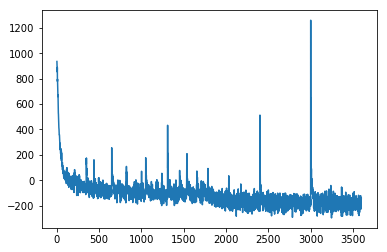

In [208]:
#plt.ylim([-10000,20000]) 
plt.plot(vae_model_d2_k1['train_losses_list'])

In [209]:
x = vae_model_d2_k1['model'].generate_samples(10)
x.shape

torch.Size([10, 900])

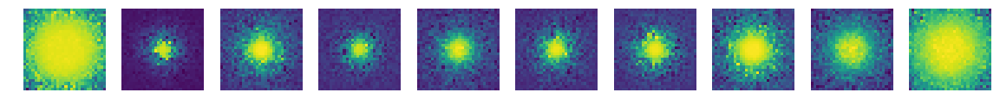

In [210]:
show_images(x)

In [1]:
x = vae_model_d2_k1['model'].generate_samples(10)
x.shape
show_images(x)

NameError: name 'vae_model_d2_k1' is not defined

In [ ]:
min_ = torch.min(x)
max_ = torch.max(x)
print(min_, max_)

In [ ]:
min_ = torch.mean(x)
max_ = torch.std(x)
print(min_, max_)

In [ ]:
import numpy as np
def lklyhood(x_true_i, x_distr_kni):
    answ = 0.0
    for ind, elem in enumerate(x_true_i):
        answ += elem * np.log(x_distr_kni[ind]+1) + (1-elem)* np.log(1 - x_distr_kni[ind]+1)
    return answ
    

def binary_crossentropy_loss(x_true, x_distr):
    """
    Вычисляет бинарную кроссэнтропию между эмприческим распределением на данные
    и индуцированным моделью распределением, т. е. правдоподобие объектов x_true.
    Каждому объекту из x_true соответствуют K сэмплированных распределений
    на x из x_distr.
    i-му объекту соответствуют распределения с номерами i * K, ..., (i + 1) * K - 1.
    Требуется вычислить оценку логарифма правдоподобия для каждого объекта.
    Подсказка: не забывайте про вычислительную стабильность!

    Вход: x_true, Variable - матрица объектов размера n x D.
    Вход: x_distr, Variable - матрица параметров распределений Бернулли
    размера (n * K) x D.
    Выход: Variable, матрица размера n x K - оценки логарифма правдоподобия
    каждого сэмпла.
        """
    K = x_distr.shape[0] // x_true.shape[0]
    x_distr = x_distr.view(x_true.shape[0], K, -1)
    answ = Variable()
    for ind in range(K):
        obj = x_distr[:, ind, :]
        loc_answ = torch.sum((torch.log(obj)*x_true + torch.log(1-obj)*(1-x_true)),dim=1)
        loc_answ = loc_answ.view(loc_answ.shape[0], 1)
        if (ind ==0):
            answ = loc_answ
        else:
            answ = torch.cat([answ, loc_answ], 1)
    return answ

### Визуализация латентного пространства

In [67]:
n = 15
digit_size = 28

from scipy.stats import norm
import numpy as np

grid_x = norm.ppf(np.linspace(0.05, 0.95, n))
grid_y = norm.ppf(np.linspace(0.05, 0.95, n))

def draw_manifold(model):
    figure = np.zeros((digit_size * n, digit_size * n))
    for i, yi in enumerate(grid_x):
        for j, xi in enumerate(grid_y):
            z_sample = np.array([[xi, yi]])

            x_decoded = model.generative_distr(Variable(torch.from_numpy(z_sample).float())).view(28, 28).data.numpy()
            digit = x_decoded
            figure[i * digit_size: (i + 1) * digit_size,
                   j * digit_size: (j + 1) * digit_size] = digit
    plt.figure(figsize=(10, 10))
    plt.imshow(figure, cmap='Greys_r', vmin=0, vmax=1, interpolation='lanczos')
    plt.axis('off')
    plt.show()

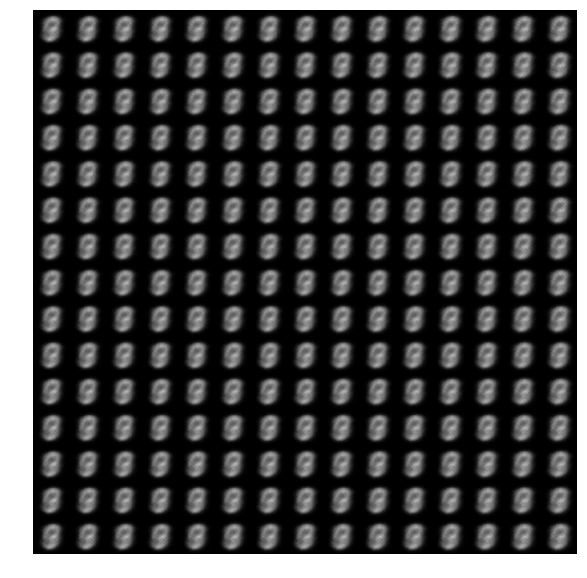

In [68]:
draw_manifold(naive_model_d2_k1['model'])

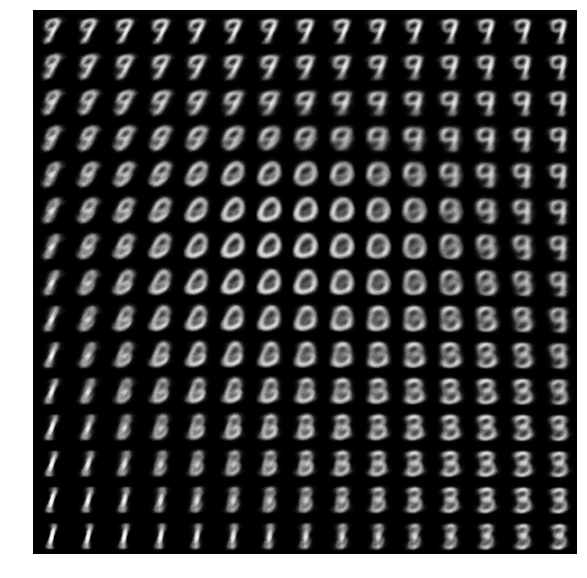

In [69]:
draw_manifold(naive_model_d2_k10['model'])

### Оценка правдоподобия тестовых данных в обученной модели методом Монте-Карло

(18,)
18
(18,)
18
(18,)
18
(18,)
18


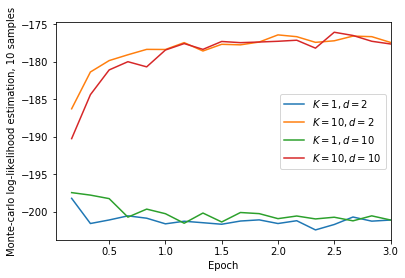

In [71]:
for label, model in [
    ('$K = 1, d = 2$', naive_model_d2_k1),
    ('$K = 10, d = 2$', naive_model_d2_k10),
    ('$K = 1, d = 10$', naive_model_d10_k1),
    ('$K = 10, d = 10$', naive_model_d10_k10)
]:
    data = [x['MC'] for x in model['test_results']]
    x_labels = (1 + np.arange(len(data))) / 6.0
    print (x_labels.shape)
    print (len(data))
    plt.plot(x_labels, data, label=label)
plt.xlabel('Epoch')
plt.xlim(xmax=x_labels[-1])
plt.ylabel('Monte-carlo log-likelihood estimation, 10 samples')
plt.legend()

In [350]:
def compute_log_likelihood_importance_sampling(batch, model, K):
    """
    Функция, оценку логарифма правдоподобия вероятностной модели по батчу методом Importance Sampling.
    Вход: batch, FloatTensor - матрица размера n x D
    Вход: model, Module - объект, имеющий методы prior_distr, proposal_distr, sample_latent и generative_distr,
    описанные в VAE.
    Вход: K, int - количество сэмплов.
    Возвращаемое значение: float - оценка логарифма правдоподобия.
    """
    q_phi = model.proposal_distr(Variable(batch))
    
    #d = q_z[0].shape[0]
    p_z_prior = model.prior_distr(q_phi[0].shape[0])    
    prior_z = model.sample_latent(q_phi, K)
    
    gen_samples = model.generative_network(prior_z)
    loss_ = binary_crossentropy_loss(Variable(batch), gen_samples)    
    log_pdf_p = gaussian_log_pdf(p_z_prior, prior_z)
    log_pdf_q = gaussian_log_pdf(q_phi, prior_z)
    res = float(log_mean_exp(loss_ + log_pdf_p - log_pdf_q).mean().data.numpy())
    return res

def model_test_log_likelihood_importance_sampling(model, K=10, batch_size=100, max_batches=None, verbose=False):
    """
    Функция, вовращает оценку логарифма правдоподобия данной модели по тестовым данным.
    Вход: model, Module - объект, имеющий методы prior_distr, proposal_distr, sample_latent и generative_distr,
    описанные в VAE.
    Вход: K, int - количество сэмплов.
    Остальные входы описаны в функции model_test_loss.
    Возвращаемое значение: float - оценка логарифма правдоподобия.    
    """
    return model_test_loss(lambda batch: compute_log_likelihood_importance_sampling(batch, model, K),
                           batch_size=batch_size,
                           max_batches=max_batches,
                           verbose=verbose)

In [351]:
vae_tests = [
    {
        'name': 'MC',
        'func': lambda model: model_test_log_likelihood_monte_carlo(model, max_batches=20)
    },
    {
        'name': 'IS',
        'func': lambda model: model_test_log_likelihood_importance_sampling(model, max_batches=20)
    }
]

In [352]:
def compute_log_likelihood_importance_sampling(batch, model, K):
    """
    Функция, оценку логарифма правдоподобия вероятностной модели по батчу методом Importance Sampling.
    Вход: batch, FloatTensor - матрица размера n x D
    Вход: model, Module - объект, имеющий методы prior_distr, proposal_distr, sample_latent и generative_distr,
    описанные в VAE.
    Вход: K, int - количество сэмплов.
    Возвращаемое значение: float - оценка логарифма правдоподобия.
    """
    q_phi = model.proposal_distr(Variable(batch))
    
    #d = q_z[0].shape[0]
    p_z_prior = model.prior_distr(q_phi[0].shape[0])    
    prior_z = model.sample_latent(q_phi, K)
    
    gen_samples = model.generative_network(prior_z)
    loss_ = binary_crossentropy_loss(Variable(batch), gen_samples)    
    log_pdf_p = gaussian_log_pdf(p_z_prior, prior_z)
    log_pdf_q = gaussian_log_pdf(q_phi, prior_z)
    res = float(log_mean_exp(loss_ + log_pdf_p - log_pdf_q).mean().data.numpy())
    return res

def model_test_log_likelihood_importance_sampling(model, K=10, batch_size=100, max_batches=None, verbose=False):
    """
    Функция, вовращает оценку логарифма правдоподобия данной модели по тестовым данным.
    Вход: model, Module - объект, имеющий методы prior_distr, proposal_distr, sample_latent и generative_distr,
    описанные в VAE.
    Вход: K, int - количество сэмплов.
    Остальные входы описаны в функции model_test_loss.
    Возвращаемое значение: float - оценка логарифма правдоподобия.    
    """
    return model_test_loss(lambda batch: compute_log_likelihood_importance_sampling(batch, model, K),
                           batch_size=batch_size,
                           max_batches=max_batches,
                           verbose=verbose)

vae_tests = [
    {
        'name': 'MC',
        'func': lambda model: model_test_log_likelihood_monte_carlo(model, max_batches=20)
    },
    {
        'name': 'IS',
        'func': lambda model: model_test_log_likelihood_importance_sampling(model, max_batches=20)
    }
]


vae_model_d2_k1 = train_model(VAE(2, 784), tests=vae_tests)

epoch: 0
Train loss: -192.801 Batch 100 of 600           

/opt/conda/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  after removing the cwd from sys.path.



Train loss: -195.963 Batch 200 of 600           
Train loss: -191.528 Batch 300 of 600           
Train loss: -184.596 Batch 400 of 600           
Train loss: -167.357 Batch 500 of 600           
Train loss: -169.116 Batch 600 of 600           
epoch: 1
Train loss: -163.327 Batch 100 of 600           
Train loss: -163.953 Batch 200 of 600           
Train loss: -157.052 Batch 300 of 600           
Train loss: -155.337 Batch 400 of 600           
Train loss: -150.545 Batch 500 of 600           
Train loss: -161.083 Batch 600 of 600           
epoch: 2
Train loss: -155.994 Batch 100 of 600           
Train loss: -147.949 Batch 200 of 600           
Train loss: -162.616 Batch 300 of 600           
Train loss: -145.965 Batch 400 of 600           
Train loss: -159.725 Batch 500 of 600           
Train loss: -158.286 Batch 600 of 600           


In [229]:
vae_model_d2_k1 = train_model(VAE(2, 784), tests=vae_tests)

epoch: 0
Train loss: -204.622 Batch 100 of 600           

/opt/conda/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  after removing the cwd from sys.path.



Train loss: -196.611 Batch 200 of 600           
Train loss: -184.253 Batch 300 of 600           
Train loss: -189.546 Batch 400 of 600           
Train loss: -179.579 Batch 500 of 600           
Train loss: -181.976 Batch 600 of 600           
epoch: 1
Train loss: -182.913 Batch 100 of 600           
Train loss: -176.033 Batch 200 of 600           
Train loss: -167.862 Batch 300 of 600           
Train loss: -169.857 Batch 400 of 600           
Train loss: -174.807 Batch 500 of 600           
Train loss: -169.597 Batch 600 of 600           
epoch: 2
Train loss: -175.358 Batch 100 of 600           
Train loss: -164.139 Batch 200 of 600           
Train loss: -167.366 Batch 300 of 600           
Train loss: -157.316 Batch 400 of 600           
Train loss: -173.582 Batch 500 of 600           
Train loss: -156.084 Batch 600 of 600           


In [182]:
vae_model_d10_k1 = train_model(VAE(10, 784), tests=vae_tests)

epoch: 0
Train loss: -201.592 Batch 100 of 600           

/opt/conda/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  after removing the cwd from sys.path.



Train loss: -168.877 Batch 200 of 600           
Train loss: -150.568 Batch 300 of 600           
Train loss: -126.19 Batch 400 of 600            
Train loss: -119.18 Batch 500 of 600            
Train loss: -116.367 Batch 600 of 600           
epoch: 1
Train loss: -99.3994 Batch 100 of 600           
Train loss: -97.3834 Batch 200 of 600           
Train loss: -93.5727 Batch 300 of 600           
Train loss: -87.3032 Batch 400 of 600           
Train loss: -91.3307 Batch 500 of 600           
Train loss: -83.9857 Batch 600 of 600           
epoch: 2
Train loss: -89.3458 Batch 100 of 600           
Train loss: -84.4302 Batch 200 of 600           
Train loss: -89.7395 Batch 300 of 600           
Train loss: -82.4947 Batch 400 of 600           
Train loss: -81.048 Batch 500 of 600            
Train loss: -83.2722 Batch 600 of 600           


## Оценка качества модели

### Визуальная оценка генерируемых объектов

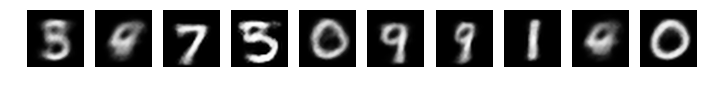

In [181]:
show_images(vae_model_d2_k11['model'].generate_samples(10))

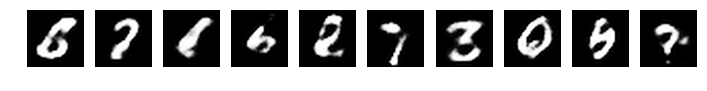

In [183]:
show_images(vae_model_d10_k1['model'].generate_samples(10))

### Визуализация латентного пространства (с точки зрения декодера)

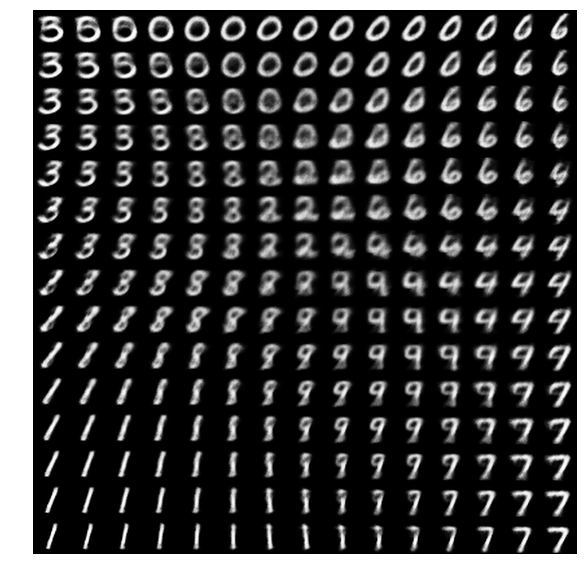

In [184]:
draw_manifold(vae_model_d2_k1['model'])

### Визуализация латетного пространства (с точки зрения энкодера)